In [15]:
!conda install pytorch torchvision torchaudio pytorch-cuda=12.1 -c pytorch -c nvidia

^C
Retrieving notices: ...working... done
Channels:
 - pytorch
 - nvidia
 - conda-forge
 - defaults
Platform: win-64
Solving environment: ...working... done

# All requested packages already installed.



In [16]:
!conda install numpy matplotlib scikit-learn

^C
Channels:
 - nvidia
 - conda-forge
 - defaults
 - pytorch
Platform: win-64
Solving environment: ...working... done

# All requested packages already installed.



In [3]:
!pip install opencv-python

In [83]:
import torch
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("Nombre del dispositivo:", torch.cuda.get_device_name(0))
    print("Memoria total:", torch.cuda.get_device_properties(0).total_memory)
    print("Memoria libre:", torch.cuda.memory_reserved(0))
    print("Memoria utilizada:", torch.cuda.memory_allocated(0))


CUDA disponible: True
Nombre del dispositivo: NVIDIA GeForce GTX 1660 Ti
Memoria total: 6442123264
Memoria libre: 10185867264
Memoria utilizada: 2582889984


# Clasificación de Mamografías con Aprendizaje por Transferencia

## Parte 1: Aplicar CLAHE a las Radiografías Originales

En esta sección, aplicaremos CLAHE a las radiografías originales para obtener las radiografias para mejorar el contraste de las imágenes y de esta forma tener un dataset de las radiografías originales y un dataset obtenido del original pero aplicado clahe. 


In [85]:
import cv2
import os
from pathlib import Path

# Definir rutas de entrada y salida
input_paths = {
    'train_benign': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train\benign',
    'train_malignant': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train\malignant',
    'test_benign': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test\benign',
    'test_malignant': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test\malignant'
}
output_paths = {
    'train_benign': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign',
    'train_malignant': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\malignant',
    'test_benign': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE\benign',
    'test_malignant': r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE\malignant'
}

# Crear directorios de salida si no existen
for output_path in output_paths.values():
    Path(output_path).mkdir(parents=True, exist_ok=True)

# Función para aplicar CLAHE
def apply_CLAHE(input_folder, output_folder):
    for filename in os.listdir(input_folder):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp')):
            # Leer la imagen
            img_path = os.path.join(input_folder, filename)
            image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            
            # Aplicar CLAHE
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
            cl1 = clahe.apply(image)
            
            # Guardar la imagen procesada
            output_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_path, cl1)
            print(f'Procesado y guardado: {output_path}')

# Aplicar CLAHE a las imágenes en las carpetas de entrada y guardarlas en las carpetas de salida
apply_CLAHE(input_paths['train_benign'], output_paths['train_benign'])
apply_CLAHE(input_paths['train_malignant'], output_paths['train_malignant'])
apply_CLAHE(input_paths['test_benign'], output_paths['test_benign'])
apply_CLAHE(input_paths['test_malignant'], output_paths['test_malignant'])

print("Proceso completado.")


Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\1.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\10.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\100.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\101.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\102.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\103.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign\104.png
Procesado y guardado: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_

## Parte 2: Data Augmentation para Radiografías Originales y con CLAHE

En esta sección, aplicaremos técnicas de Data Augmentation tanto a las radiografías originales como a las radiografías procesadas con CLAHE para aumentar el tamaño del datase

Se aplican las técnicas de data augmentation: Rotación aleatoria, Giro horizontal aleatorio, recorte y redimensionamiento aleatorio, ajuste aleatorio de brillo y contraste..


In [ ]:
import os
from pathlib import Path
from PIL import Image
from torchvision import transforms
import random

# Definir transformaciones de Data Augmentation
data_augmentations = transforms.Compose([
    transforms.RandomRotation(15),  # Rotación limitada
    transforms.RandomHorizontalFlip(),  # Volteo horizontal
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Zoom in/out
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # Ajuste de brillo y contraste
])

# Definir rutas de entrada y salida y el número exacto de imágenes aumentadas necesarias
augmentation_settings = [
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train\benign', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_augmented\benign', 3280),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train\malignant', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_augmented\malignant', 3493),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test\benign', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_augmented\benign', 833),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test\malignant', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_augmented\malignant', 930),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\benign', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE_augmented\benign', 3280),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE\malignant', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE_augmented\malignant', 3493),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE\benign', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE_augmented\benign', 833),
    (r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE\malignant', 
     r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE_augmented\malignant', 930)
]

# Crear directorios de salida si no existen
for input_folder, output_folder, num_augmented in augmentation_settings:
    Path(output_folder).mkdir(parents=True, exist_ok=True)

# Función para aplicar Data Augmentation y guardar imágenes aumentadas
def augment_and_save_images(input_folder, output_folder, total_augmented):
    original_images = [f for f in os.listdir(input_folder) if f.endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
    num_original = len(original_images)
    aug_per_image = total_augmented // num_original
    extra_augmentations = total_augmented % num_original
    
    for i, filename in enumerate(original_images):
        img_path = os.path.join(input_folder, filename)
        image = Image.open(img_path).convert("L")  # Asegurarse de que las imágenes sean en escala de grises
        
        for j in range(aug_per_image):
            augmented_image = data_augmentations(image)
            output_path = os.path.join(output_folder, f'{Path(filename).stem}_aug_{i}_{j}{Path(filename).suffix}')
            augmented_image.save(output_path)
            print(f'Guardado: {output_path}')
        
        # Añadir imágenes extra si es necesario
        if i < extra_augmentations:
            augmented_image = data_augmentations(image)
            output_path = os.path.join(output_folder, f'{Path(filename).stem}_aug_{i}_extra{Path(filename).suffix}')
            augmented_image.save(output_path)
            print(f'Guardado: {output_path}')

# Aplicar Data Augmentation a las imágenes en las carpetas de entrada y guardarlas en las carpetas de salida
for input_folder, output_folder, num_augmented in augmentation_settings:
    augment_and_save_images(input_folder, output_folder, num_augmented)

print("Data Augmentation completado.")


## Parte 3: Entrenamiento y Evaluación de Modelos

En esta sección, entrenaremos y evaluaremos varios modelos de redes neuronales convolucionales utilizando las imágenes originales y las imágenes procesadas con CLAHE. Compararemos los resultados obtenidos.


#### Se importan las librerías necesarias y realiza la configuración del dispositivo para los  cálculos (GPU y CPU)


In [2]:
# Importar las librerías necesarias
import os
import time
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from torchvision import models

# Configurar el dispositivo (GPU o CPU)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


### Definir Transformaciones y Carga de Datos

Se realiza normalización y redimensionamiento para el conjunto de datos de entrenamiento y test para los modelos: resnet50, efficientnet, densenet121 y inception_v3. 
Cargar los datos de las carpetas de imágenes originales y procesadas con CLAHE.

In [3]:
# Definir transformaciones de normalización con redimensionamiento
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),  # Redimensionar las imágenes para otros modelos
        transforms.ToTensor(),
        transforms.Normalize([0.485], [0.229])
    ]),
    'train_inception': transforms.Compose([
        transforms.Resize((299, 299)),  # Redimensionar las imágenes para InceptionV3
        transforms.ToTensor(),
        transforms.Normalize([0.485], [0.229])
    ]),
    'test': transforms.Compose([
        transforms.Resize((224, 224)),  # Redimensionar las imágenes para otros modelos
        transforms.ToTensor(),
        transforms.Normalize([0.485], [0.229])
    ]),
    'test_inception': transforms.Compose([
        transforms.Resize((299, 299)),  # Redimensionar las imágenes para InceptionV3
        transforms.ToTensor(),
        transforms.Normalize([0.485], [0.229])
    ]),
}

# Directorio de datos
data_dir = r'D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram'

# Cargar los datos usando ImageFolder
original_datasets = {
    'train': datasets.ImageFolder(os.path.join(data_dir, 'train'), data_transforms['train']),
    'test': datasets.ImageFolder(os.path.join(data_dir, 'test'), data_transforms['test'])
}

original_datasets_inception = {
    'train': datasets.ImageFolder(os.path.join(data_dir, 'train'), data_transforms['train_inception']),
    'test': datasets.ImageFolder(os.path.join(data_dir, 'test'), data_transforms['test_inception'])
}

clahe_datasets = {
    'train': datasets.ImageFolder(os.path.join(data_dir, 'train_CLAHE'), data_transforms['train']),
    'test': datasets.ImageFolder(os.path.join(data_dir, 'test_CLAHE'), data_transforms['test'])
}

clahe_datasets_inception = {
    'train': datasets.ImageFolder(os.path.join(data_dir, 'train_CLAHE'), data_transforms['train_inception']),
    'test': datasets.ImageFolder(os.path.join(data_dir, 'test_CLAHE'), data_transforms['test_inception'])
}

# Crear los dataloaders
batch_size_resnet = 16
batch_size_efficientnet = 32

original_dataloaders = {
    'train': DataLoader(original_datasets['train'], batch_size=batch_size_resnet, shuffle=True, num_workers=4, pin_memory=True),
    'test': DataLoader(original_datasets['test'], batch_size=batch_size_resnet, shuffle=False, num_workers=4, pin_memory=True),
}

original_dataloaders_inception = {
    'train': DataLoader(original_datasets_inception['train'], batch_size=batch_size_resnet, shuffle=True, num_workers=4, pin_memory=True),
    'test': DataLoader(original_datasets_inception['test'], batch_size=batch_size_resnet, shuffle=False, num_workers=4, pin_memory=True),
}

clahe_dataloaders = {
    'train': DataLoader(clahe_datasets['train'], batch_size=batch_size_resnet, shuffle=True, num_workers=4, pin_memory=True),
    'test': DataLoader(clahe_datasets['test'], batch_size=batch_size_resnet, shuffle=False, num_workers=4, pin_memory=True),
}

clahe_dataloaders_inception = {
    'train': DataLoader(clahe_datasets_inception['train'], batch_size=batch_size_resnet, shuffle=True, num_workers=4, pin_memory=True),
    'test': DataLoader(clahe_datasets_inception['test'], batch_size=batch_size_resnet, shuffle=False, num_workers=4, pin_memory=True),
}

# Obtener los tamaños de los datasets
original_dataset_sizes = {x: len(original_datasets[x]) for x in ['train', 'test']}
original_dataset_sizes_inception = {x: len(original_datasets_inception[x]) for x in ['train', 'test']}
clahe_dataset_sizes = {x: len(clahe_datasets[x]) for x in ['train', 'test']}
clahe_dataset_sizes_inception = {x: len(clahe_datasets_inception[x]) for x in ['train', 'test']}
class_names = original_datasets['train'].classes

# Imprimir el número de imágenes en los conjuntos de entrenamiento y prueba
print(f"Número de imágenes en el conjunto de entrenamiento (originales): {original_dataset_sizes['train']}")
print(f"Número de imágenes en el conjunto de prueba (originales): {original_dataset_sizes['test']}")
print(f"Número de imágenes en el conjunto de entrenamiento (CLAHE): {clahe_dataset_sizes['train']}")
print(f"Número de imágenes en el conjunto de prueba (CLAHE): {clahe_dataset_sizes['test']}")


Número de imágenes en el conjunto de entrenamiento (originales): 8000
Número de imágenes en el conjunto de prueba (originales): 2000
Número de imágenes en el conjunto de entrenamiento (CLAHE): 8000
Número de imágenes en el conjunto de prueba (CLAHE): 2000


## Visualización de imágenes de los conjuntos de datos
Mostramos algunas imágenes de los conjuntos de datos originales y CLAHE
s.


Imágenes del conjunto de datos originales:


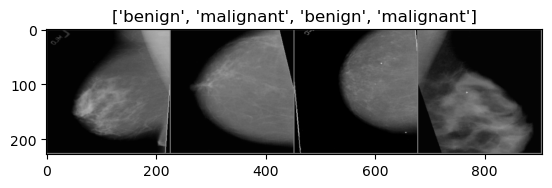

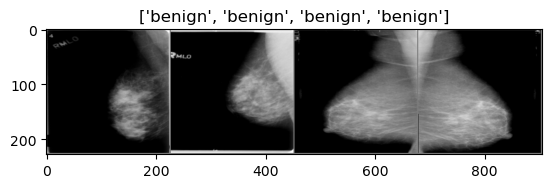

Imágenes del conjunto de datos CLAHE:


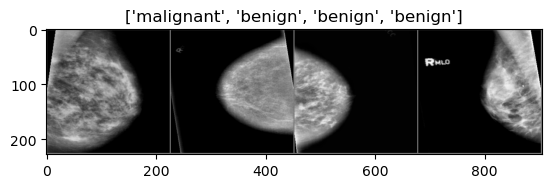

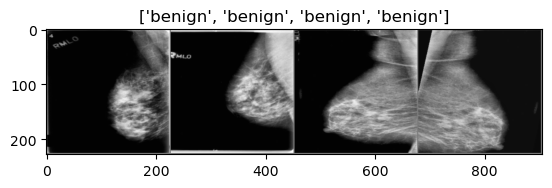

Rutas de las carpetas:
Originales - Train: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train
Originales - Test: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test
CLAHE - Train: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\train_CLAHE
CLAHE - Test: D:\UTELVT\DOCTORADO UPS\SEGUNDO SEMESTRE\VISION ARTIFICIAL\mammogram\mammogram\test_CLAHE


In [4]:
# Función para mostrar imágenes
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = [0.485]
    std = [0.229]
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp, cmap='gray')
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Mostrar imágenes de cada tipo
def show_images(dataloaders, dataset_name):
    inputs, classes = next(iter(dataloaders['train']))
    out = utils.make_grid(inputs[:4])
    imshow(out, title=[class_names[x] for x in classes[:4]])
    inputs, classes = next(iter(dataloaders['test']))
    out = utils.make_grid(inputs[:4])
    imshow(out, title=[class_names[x] for x in classes[:4]])

# Mostrar imágenes de los conjuntos de datos originales
print("Imágenes del conjunto de datos originales:")
show_images(original_dataloaders, "Originales")

# Mostrar imágenes de los conjuntos de datos CLAHE
print("Imágenes del conjunto de datos CLAHE:")
show_images(clahe_dataloaders, "CLAHE")

# Imprimir rutas de las carpetas
print("Rutas de las carpetas:")
print(f"Originales - Train: {os.path.join(data_dir, 'train')}")
print(f"Originales - Test: {os.path.join(data_dir, 'test')}")
print(f"CLAHE - Train: {os.path.join(data_dir, 'train_CLAHE')}")
print(f"CLAHE - Test: {os.path.join(data_dir, 'test_CLAHE')}")


## Parte 4: Definir Función de Entrenamiento

Esta sección define la función `train_model` que entrena un modelo dado y realiza el seguimiento de las métricas de pérdida y precisión.


In [9]:
# Función de entrenamiento
def train_model(model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=None, dataset_sizes=None, early_stopping_patience=5, is_inception=False):
    since = time.time()
    epoch_times = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    patience = early_stopping_patience  # Para early stopping

    train_losses = []
    val_losses = []
    val_accuracies = []

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in ['train', 'test']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    if is_inception and phase == 'train':
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4 * loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)
                    
                    _, preds = torch.max(outputs, 1)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'train':
                train_losses.append(epoch_loss)
            else:
                val_losses.append(epoch_loss)
                val_accuracies.append(epoch_acc.cpu())  # Mover tensores a la CPU antes de agregar a la lista

                # Early stopping
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    patience = early_stopping_patience  # Resetear paciencia si mejora
                else:
                    patience -= 1

        # Verificar early stopping
        if patience <= 0:
            print("Early stopping triggered")
            break

        epoch_end = time.time()
        epoch_time = epoch_end - epoch_start
        epoch_times.append(epoch_time)
        print(f'Epoch {epoch} time: {epoch_time:.2f}s')

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)
    return model, train_losses, val_losses, val_accuracies, epoch_times

## Parte 5: Descargar y Configurar Modelos Preentrenados

Usaremos modelos preentrenados de PyTorch (ResNet50, EfficientNet-B1, densenet121 y inception_v3) y ajustaremos sus capas finales para la clasificación de nuestras clases.


## Definir y Entrenar los Modelos

En esta sección se definen los modelos preentrenados y se entrenan por separado para las imágenes originales.


In [10]:
# Hiperparámetros
learning_rate = 0.0001
weight_decay = 0.0001
early_stopping_patience = 7

def create_model(model_name, class_names, learning_rate, weight_decay, momentum=0.9, dropout=0.5):
    
    if model_name == 'resnet50':
        model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V1)
        num_ftrs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(num_ftrs, len(class_names))
        )
    elif model_name == 'efficientnet_b1':
        model = models.efficientnet_b1(weights=models.EfficientNet_B1_Weights.IMAGENET1K_V1)
        num_ftrs = model.classifier[1].in_features
        model.classifier[1] = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(num_ftrs, len(class_names))
        )
    elif model_name == 'densenet121':
        model = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)
        num_ftrs = model.classifier.in_features
        model.classifier = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(num_ftrs, len(class_names))
        )
    elif model_name == 'inception_v3':
        model = models.inception_v3(weights=models.Inception_V3_Weights.IMAGENET1K_V1)
        num_ftrs = model.fc.in_features
        model.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(num_ftrs, len(class_names))
        )
        model.AuxLogits.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(model.AuxLogits.fc.in_features, len(class_names))
        )
    else:
        raise ValueError("Modelo no soportado.")

    model = model.to(device)

    for param in model.parameters():
        param.requires_grad = False

    if model_name == 'resnet50':
        for param in model.layer4.parameters():
            param.requires_grad = True
    elif model_name == 'efficientnet_b1':
        for param in model.features[6:].parameters():
            param.requires_grad = True
    elif model_name == 'densenet121':
        for param in model.features[8:].parameters():
            param.requires_grad = True
    elif model_name == 'inception_v3':
        for param in model.Mixed_7c.parameters():
            param.requires_grad = True

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(filter(lambda p: p.requires_grad, model.parameters()), lr=learning_rate, momentum=momentum, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    return model, criterion, optimizer, scheduler

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7108 Acc: 0.5229
test Loss: 0.6679 Acc: 0.5925
Epoch 0 time: 86.64s
Epoch 1/19
----------
train Loss: 0.6673 Acc: 0.5959
test Loss: 0.6444 Acc: 0.6420
Epoch 1 time: 90.35s
Epoch 2/19
----------
train Loss: 0.6422 Acc: 0.6299
test Loss: 0.6310 Acc: 0.6515
Epoch 2 time: 90.53s
Epoch 3/19
----------
train Loss: 0.6164 Acc: 0.6604
test Loss: 0.6271 Acc: 0.6565
Epoch 3 time: 89.94s
Epoch 4/19
----------
train Loss: 0.5976 Acc: 0.6714
test Loss: 0.6232 Acc: 0.6520
Epoch 4 time: 90.37s
Epoch 5/19
----------
train Loss: 0.5771 Acc: 0.6956
test Loss: 0.6252 Acc: 0.6510
Epoch 5 time: 90.88s
Epoch 6/19
----------
train Loss: 0.5560 Acc: 0.7057
test Loss: 0.6301 Acc: 0.6520
Epoch 6 time: 90.74s
Epoch 7/19
----------
train Loss: 0.5376 Acc: 0.7203
test Loss: 0.6321 Acc: 0.6545
Epoch 7 time: 93.91s
Epoch 8/19
----------
train Loss: 0.5288 Acc: 0.7300
test Loss: 0.6291 Acc: 0.6580
Epoc

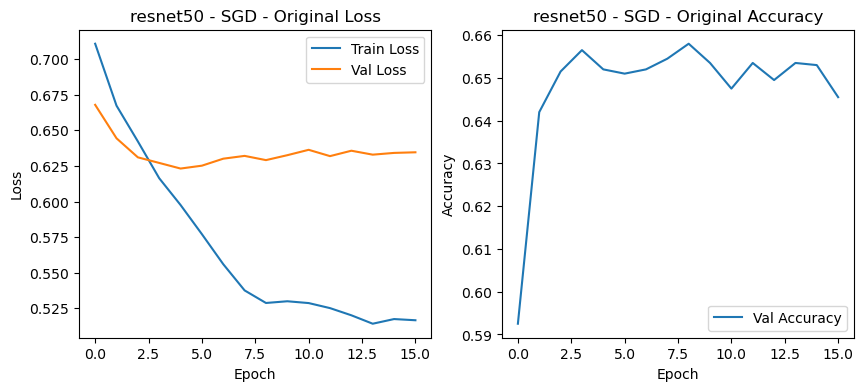

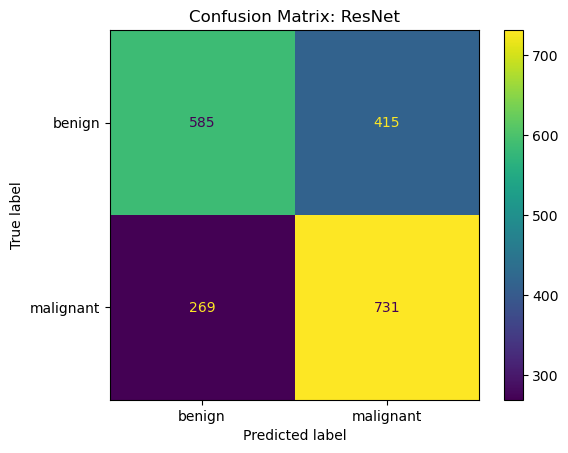

Epoch 0/19
----------
train Loss: 0.7009 Acc: 0.5435
test Loss: 0.6636 Acc: 0.6085
Epoch 0 time: 264.41s
Epoch 1/19
----------
train Loss: 0.6595 Acc: 0.6030
test Loss: 0.6443 Acc: 0.6340
Epoch 1 time: 264.34s
Epoch 2/19
----------
train Loss: 0.6353 Acc: 0.6454
test Loss: 0.6316 Acc: 0.6430
Epoch 2 time: 264.56s
Epoch 3/19
----------
train Loss: 0.6100 Acc: 0.6661
test Loss: 0.6262 Acc: 0.6555
Epoch 3 time: 264.63s
Epoch 4/19
----------
train Loss: 0.5803 Acc: 0.6943
test Loss: 0.6246 Acc: 0.6565
Epoch 4 time: 264.41s
Epoch 5/19
----------
train Loss: 0.5598 Acc: 0.7075
test Loss: 0.6329 Acc: 0.6605
Epoch 5 time: 264.79s
Epoch 6/19
----------
train Loss: 0.5250 Acc: 0.7316
test Loss: 0.6324 Acc: 0.6610
Epoch 6 time: 264.23s
Epoch 7/19
----------
train Loss: 0.5080 Acc: 0.7470
test Loss: 0.6416 Acc: 0.6580
Epoch 7 time: 264.14s
Epoch 8/19
----------
train Loss: 0.5020 Acc: 0.7485
test Loss: 0.6375 Acc: 0.6620
Epoch 8 time: 293.89s
Epoch 9/19
----------
train Loss: 0.5006 Acc: 0.7530
te

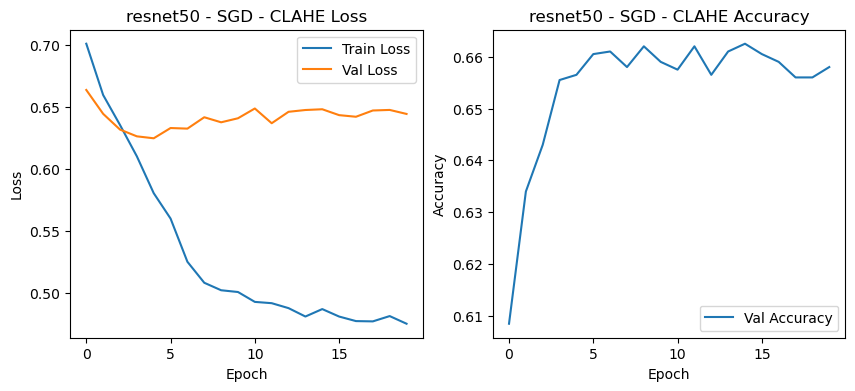

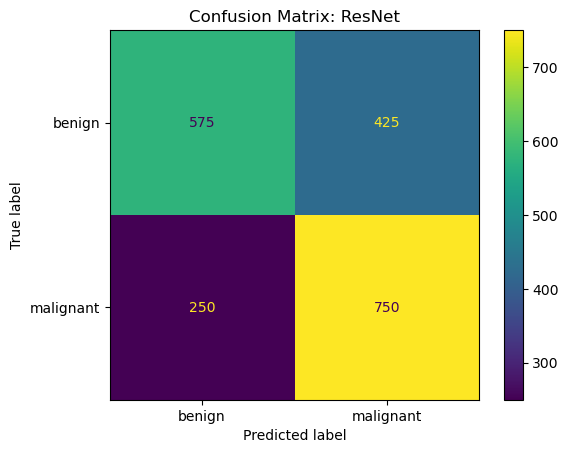

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7183 Acc: 0.5261
test Loss: 0.6784 Acc: 0.5590
Epoch 0 time: 97.88s
Epoch 1/19
----------
train Loss: 0.6802 Acc: 0.5850
test Loss: 0.6582 Acc: 0.6065
Epoch 1 time: 101.01s
Epoch 2/19
----------
train Loss: 0.6470 Acc: 0.6344
test Loss: 0.6405 Acc: 0.6420
Epoch 2 time: 101.93s
Epoch 3/19
----------
train Loss: 0.6213 Acc: 0.6551
test Loss: 0.6313 Acc: 0.6585
Epoch 3 time: 100.63s
Epoch 4/19
----------
train Loss: 0.5989 Acc: 0.6820
test Loss: 0.6297 Acc: 0.6605
Epoch 4 time: 101.76s
Epoch 5/19
----------
train Loss: 0.5716 Acc: 0.6955
test Loss: 0.6285 Acc: 0.6585
Epoch 5 time: 101.43s
Epoch 6/19
----------
train Loss: 0.5408 Acc: 0.7259
test Loss: 0.6385 Acc: 0.6520
Epoch 6 time: 101.08s
Epoch 7/19
----------
train Loss: 0.5216 Acc: 0.7392
test Loss: 0.6357 Acc: 0.6595
Epoch 7 time: 101.46s
Epoch 8/19
----------
train Loss: 0.5167 Acc: 0.7456
test Loss: 0.6377 Acc: 0.65

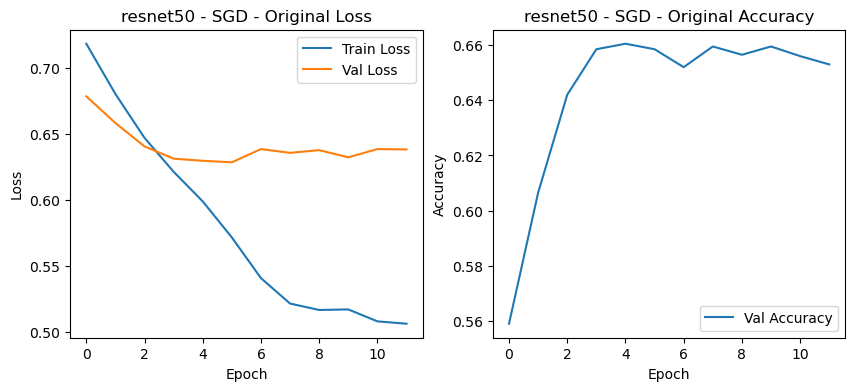

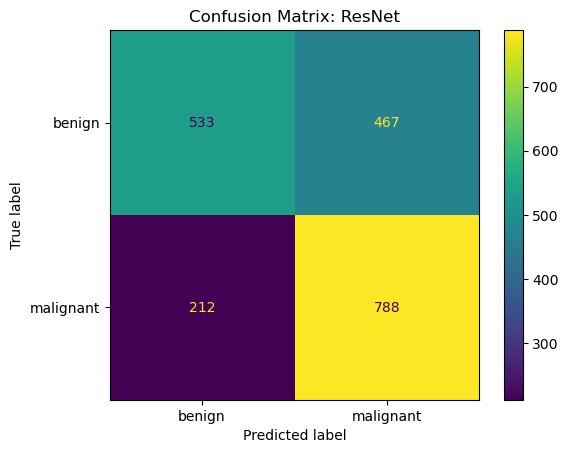

Epoch 0/19
----------
train Loss: 0.7147 Acc: 0.5314
test Loss: 0.6716 Acc: 0.5605
Epoch 0 time: 99.62s
Epoch 1/19
----------
train Loss: 0.6683 Acc: 0.5978
test Loss: 0.6437 Acc: 0.6355
Epoch 1 time: 100.49s
Epoch 2/19
----------
train Loss: 0.6389 Acc: 0.6449
test Loss: 0.6359 Acc: 0.6460
Epoch 2 time: 102.07s
Epoch 3/19
----------
train Loss: 0.6074 Acc: 0.6766
test Loss: 0.6336 Acc: 0.6555
Epoch 3 time: 101.87s
Epoch 4/19
----------
train Loss: 0.5800 Acc: 0.6966
test Loss: 0.6244 Acc: 0.6685
Epoch 4 time: 102.23s
Epoch 5/19
----------
train Loss: 0.5424 Acc: 0.7210
test Loss: 0.6416 Acc: 0.6670
Epoch 5 time: 100.44s
Epoch 6/19
----------
train Loss: 0.5028 Acc: 0.7494
test Loss: 0.6563 Acc: 0.6490
Epoch 6 time: 102.84s
Epoch 7/19
----------
train Loss: 0.4649 Acc: 0.7826
test Loss: 0.6641 Acc: 0.6560
Epoch 7 time: 94.49s
Epoch 8/19
----------
train Loss: 0.4641 Acc: 0.7779
test Loss: 0.6654 Acc: 0.6480
Epoch 8 time: 94.08s
Epoch 9/19
----------
train Loss: 0.4610 Acc: 0.7811
test 

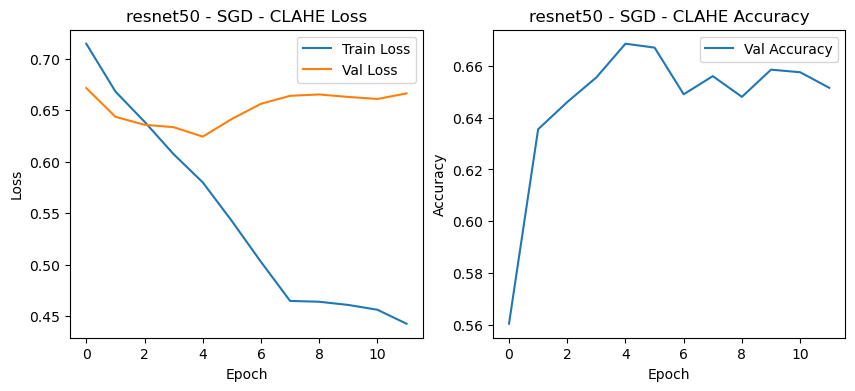

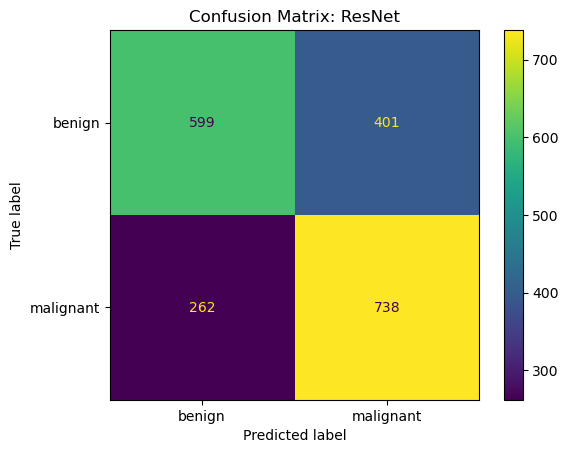

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7465 Acc: 0.5202
test Loss: 0.6829 Acc: 0.5620
Epoch 0 time: 92.40s
Epoch 1/19
----------
train Loss: 0.6985 Acc: 0.5745
test Loss: 0.6661 Acc: 0.6065
Epoch 1 time: 97.36s
Epoch 2/19
----------
train Loss: 0.6710 Acc: 0.6092
test Loss: 0.6613 Acc: 0.6225
Epoch 2 time: 95.74s
Epoch 3/19
----------
train Loss: 0.6445 Acc: 0.6414
test Loss: 0.6484 Acc: 0.6295
Epoch 3 time: 94.34s
Epoch 4/19
----------
train Loss: 0.6221 Acc: 0.6624
test Loss: 0.6561 Acc: 0.6320
Epoch 4 time: 94.55s
Epoch 5/19
----------
train Loss: 0.5770 Acc: 0.6983
test Loss: 0.6545 Acc: 0.6335
Epoch 5 time: 94.23s
Epoch 6/19
----------
train Loss: 0.5508 Acc: 0.7159
test Loss: 0.6652 Acc: 0.6440
Epoch 6 time: 93.45s
Epoch 7/19
----------
train Loss: 0.5097 Acc: 0.7464
test Loss: 0.6630 Acc: 0.6400
Epoch 7 time: 94.14s
Epoch 8/19
----------
train Loss: 0.5066 Acc: 0.7484
test Loss: 0.6787 Acc: 0.6395
Epoc

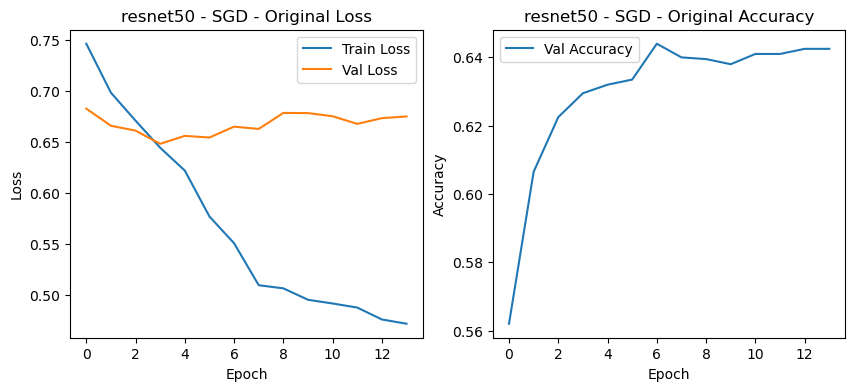

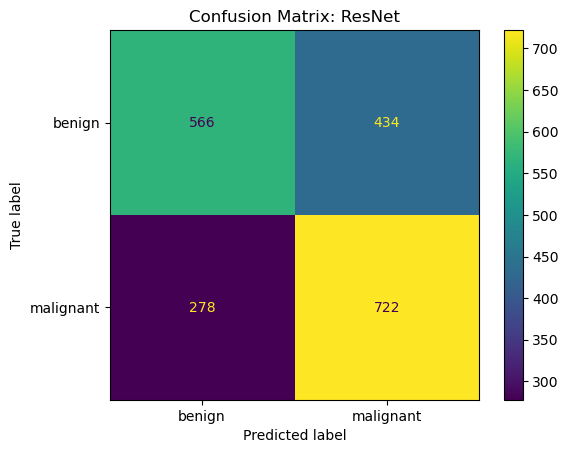

Epoch 0/19
----------
train Loss: 0.7304 Acc: 0.5248
test Loss: 0.6588 Acc: 0.6195
Epoch 0 time: 91.95s
Epoch 1/19
----------
train Loss: 0.6937 Acc: 0.5741
test Loss: 0.6327 Acc: 0.6480
Epoch 1 time: 94.68s
Epoch 2/19
----------
train Loss: 0.6542 Acc: 0.6211
test Loss: 0.6221 Acc: 0.6580
Epoch 2 time: 94.40s
Epoch 3/19
----------
train Loss: 0.6369 Acc: 0.6449
test Loss: 0.6197 Acc: 0.6595
Epoch 3 time: 94.78s
Epoch 4/19
----------
train Loss: 0.6046 Acc: 0.6711
test Loss: 0.6245 Acc: 0.6510
Epoch 4 time: 94.03s
Epoch 5/19
----------
train Loss: 0.5724 Acc: 0.6973
test Loss: 0.6431 Acc: 0.6500
Epoch 5 time: 95.52s
Epoch 6/19
----------
train Loss: 0.5304 Acc: 0.7370
test Loss: 0.6519 Acc: 0.6425
Epoch 6 time: 96.21s
Epoch 7/19
----------
train Loss: 0.5122 Acc: 0.7475
test Loss: 0.6539 Acc: 0.6440
Epoch 7 time: 96.22s
Epoch 8/19
----------
train Loss: 0.5042 Acc: 0.7464
test Loss: 0.6645 Acc: 0.6520
Epoch 8 time: 95.76s
Epoch 9/19
----------
train Loss: 0.4953 Acc: 0.7559
test Loss: 

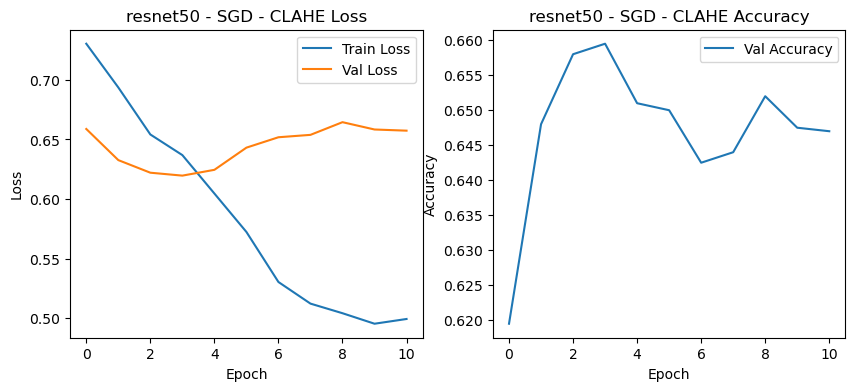

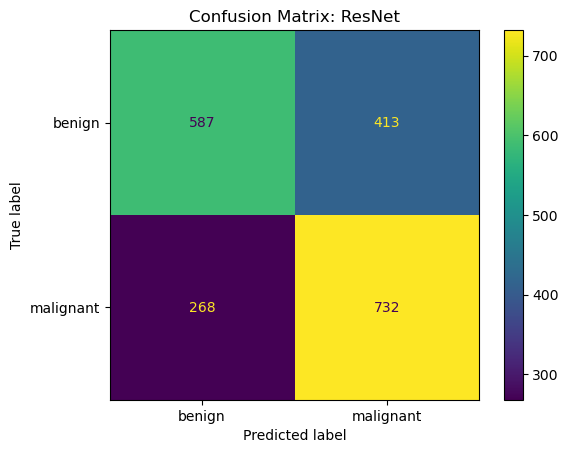

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7358 Acc: 0.5250
test Loss: 0.6542 Acc: 0.5990
Epoch 0 time: 92.49s
Epoch 1/19
----------
train Loss: 0.6856 Acc: 0.5863
test Loss: 0.6320 Acc: 0.6430
Epoch 1 time: 95.06s
Epoch 2/19
----------
train Loss: 0.6637 Acc: 0.6132
test Loss: 0.6219 Acc: 0.6565
Epoch 2 time: 95.56s
Epoch 3/19
----------
train Loss: 0.6315 Acc: 0.6516
test Loss: 0.6195 Acc: 0.6635
Epoch 3 time: 95.38s
Epoch 4/19
----------
train Loss: 0.6084 Acc: 0.6726
test Loss: 0.6222 Acc: 0.6600
Epoch 4 time: 96.60s
Epoch 5/19
----------
train Loss: 0.5835 Acc: 0.6929
test Loss: 0.6303 Acc: 0.6550
Epoch 5 time: 94.71s
Epoch 6/19
----------
train Loss: 0.5533 Acc: 0.7154
test Loss: 0.6369 Acc: 0.6495
Epoch 6 time: 93.26s
Epoch 7/19
----------
train Loss: 0.5227 Acc: 0.7372
test Loss: 0.6464 Acc: 0.6460
Epoch 7 time: 93.95s
Epoch 8/19
----------
train Loss: 0.5171 Acc: 0.7380
test Loss: 0.6511 Acc: 0.6505
Epoc

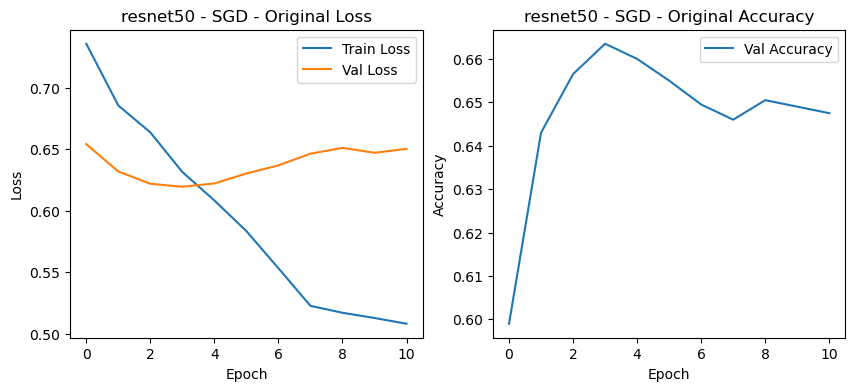

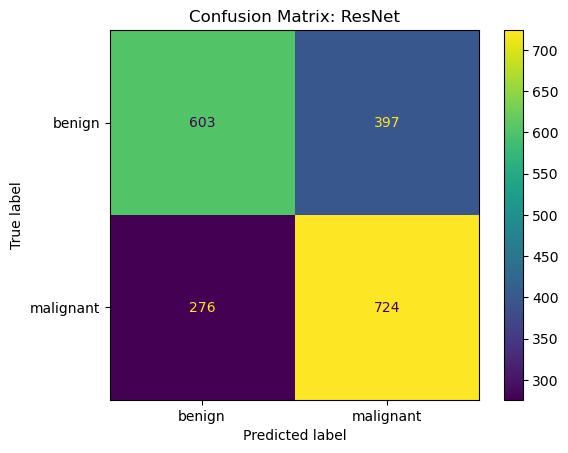

Epoch 0/19
----------
train Loss: 0.7316 Acc: 0.5350
test Loss: 0.6613 Acc: 0.6010
Epoch 0 time: 90.41s
Epoch 1/19
----------
train Loss: 0.6895 Acc: 0.5855
test Loss: 0.6446 Acc: 0.6280
Epoch 1 time: 92.69s
Epoch 2/19
----------
train Loss: 0.6622 Acc: 0.6249
test Loss: 0.6296 Acc: 0.6505
Epoch 2 time: 94.51s
Epoch 3/19
----------
train Loss: 0.6380 Acc: 0.6510
test Loss: 0.6255 Acc: 0.6645
Epoch 3 time: 92.19s
Epoch 4/19
----------
train Loss: 0.6017 Acc: 0.6741
test Loss: 0.6198 Acc: 0.6650
Epoch 4 time: 91.94s
Epoch 5/19
----------
train Loss: 0.5724 Acc: 0.7031
test Loss: 0.6298 Acc: 0.6720
Epoch 5 time: 92.38s
Epoch 6/19
----------
train Loss: 0.5308 Acc: 0.7304
test Loss: 0.6463 Acc: 0.6610
Epoch 6 time: 91.69s
Epoch 7/19
----------
train Loss: 0.4888 Acc: 0.7600
test Loss: 0.6545 Acc: 0.6665
Epoch 7 time: 91.63s
Epoch 8/19
----------
train Loss: 0.4824 Acc: 0.7662
test Loss: 0.6509 Acc: 0.6650
Epoch 8 time: 94.52s
Epoch 9/19
----------
train Loss: 0.4803 Acc: 0.7632
test Loss: 

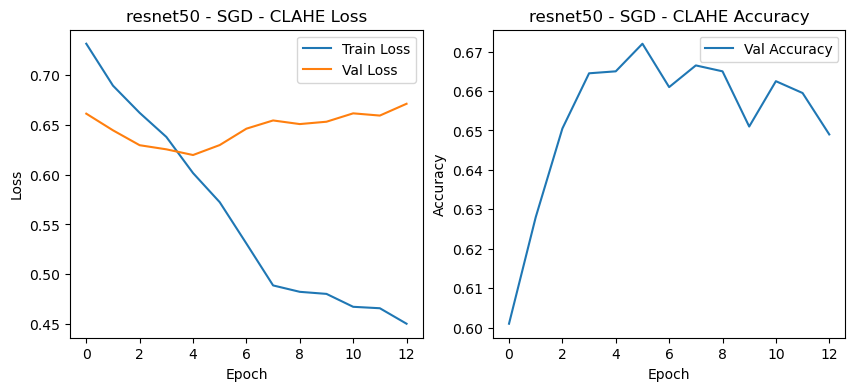

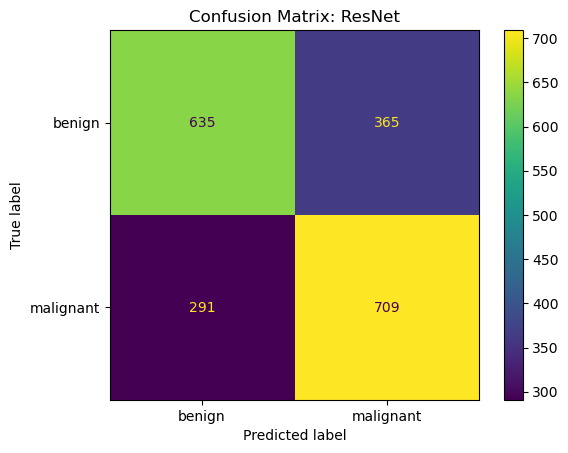

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7032 Acc: 0.5290
test Loss: 0.6650 Acc: 0.6070
Epoch 0 time: 90.38s
Epoch 1/19
----------
train Loss: 0.6659 Acc: 0.5971
test Loss: 0.6415 Acc: 0.6385
Epoch 1 time: 91.31s
Epoch 2/19
----------
train Loss: 0.6368 Acc: 0.6421
test Loss: 0.6325 Acc: 0.6430
Epoch 2 time: 91.65s
Epoch 3/19
----------
train Loss: 0.6144 Acc: 0.6618
test Loss: 0.6283 Acc: 0.6470
Epoch 3 time: 92.92s
Epoch 4/19
----------
train Loss: 0.5931 Acc: 0.6770
test Loss: 0.6325 Acc: 0.6495
Epoch 4 time: 93.29s
Epoch 5/19
----------
train Loss: 0.5702 Acc: 0.6953
test Loss: 0.6369 Acc: 0.6445
Epoch 5 time: 90.34s
Epoch 6/19
----------
train Loss: 0.5339 Acc: 0.7206
test Loss: 0.6439 Acc: 0.6375
Epoch 6 time: 91.97s
Epoch 7/19
----------
train Loss: 0.5127 Acc: 0.7472
test Loss: 0.6486 Acc: 0.6355
Epoch 7 time: 91.42s
Epoch 8/19
----------
train Loss: 0.5122 Acc: 0.7478
test Loss: 0.6548 Acc: 0.6380
Epo

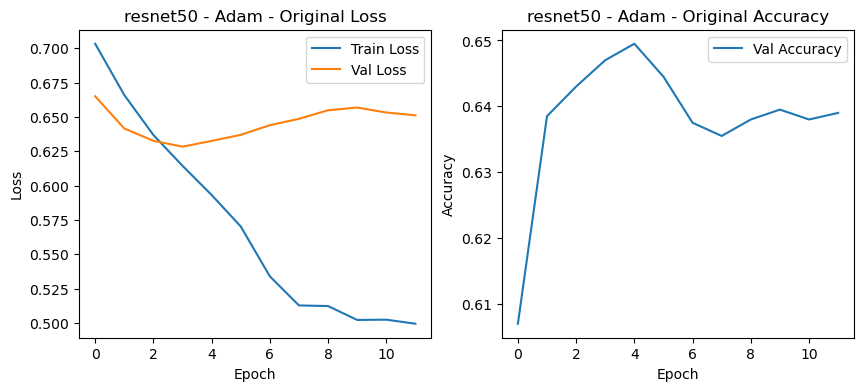

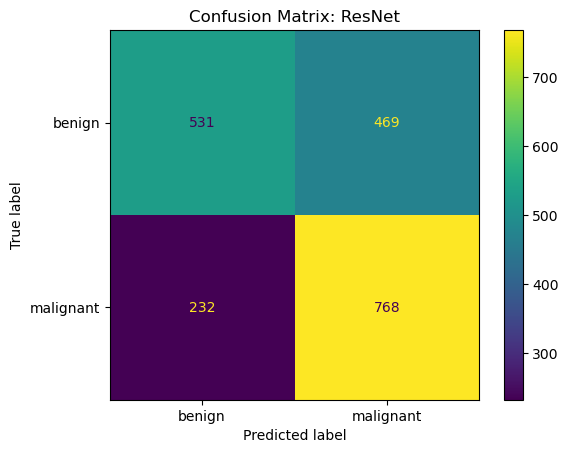

Epoch 0/19
----------
train Loss: 0.7095 Acc: 0.5326
test Loss: 0.6560 Acc: 0.6340
Epoch 0 time: 90.72s
Epoch 1/19
----------
train Loss: 0.6630 Acc: 0.5994
test Loss: 0.6270 Acc: 0.6740
Epoch 1 time: 91.60s
Epoch 2/19
----------
train Loss: 0.6286 Acc: 0.6508
test Loss: 0.6146 Acc: 0.6715
Epoch 2 time: 91.95s
Epoch 3/19
----------
train Loss: 0.5941 Acc: 0.6800
test Loss: 0.6124 Acc: 0.6700
Epoch 3 time: 91.19s
Epoch 4/19
----------
train Loss: 0.5674 Acc: 0.7021
test Loss: 0.6224 Acc: 0.6620
Epoch 4 time: 92.04s
Epoch 5/19
----------
train Loss: 0.5290 Acc: 0.7341
test Loss: 0.6320 Acc: 0.6570
Epoch 5 time: 91.22s
Epoch 6/19
----------
train Loss: 0.4835 Acc: 0.7606
test Loss: 0.6513 Acc: 0.6435
Epoch 6 time: 93.78s
Epoch 7/19
----------
train Loss: 0.4411 Acc: 0.8016
test Loss: 0.6555 Acc: 0.6500
Epoch 7 time: 92.99s
Epoch 8/19
----------
train Loss: 0.4367 Acc: 0.8009
test Loss: 0.6607 Acc: 0.6450
Early stopping triggered
Training complete in 13m 47s
Best val Acc: 0.6740


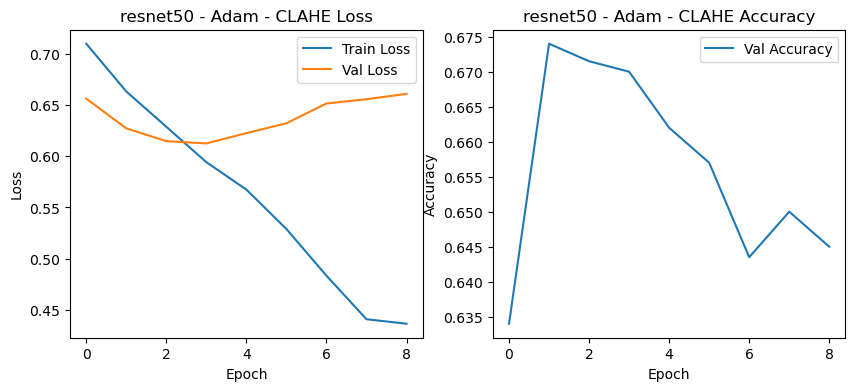

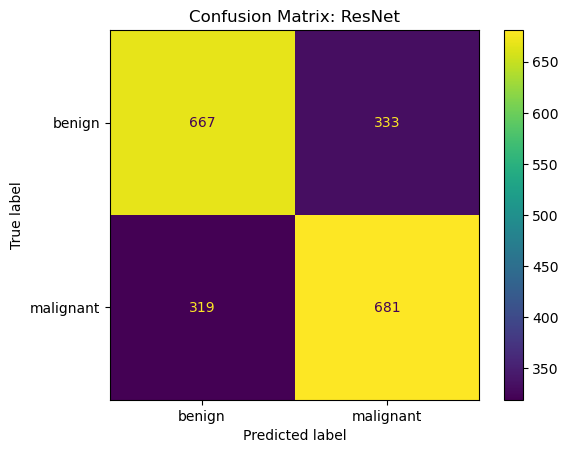

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6933 Acc: 0.5534
test Loss: 0.6592 Acc: 0.6275
Epoch 0 time: 90.21s
Epoch 1/19
----------
train Loss: 0.6667 Acc: 0.5974
test Loss: 0.6402 Acc: 0.6450
Epoch 1 time: 91.34s
Epoch 2/19
----------
train Loss: 0.6350 Acc: 0.6446
test Loss: 0.6336 Acc: 0.6450
Epoch 2 time: 90.99s
Epoch 3/19
----------
train Loss: 0.6127 Acc: 0.6681
test Loss: 0.6284 Acc: 0.6510
Epoch 3 time: 92.31s
Epoch 4/19
----------
train Loss: 0.5896 Acc: 0.6887
test Loss: 0.6306 Acc: 0.6500
Epoch 4 time: 91.38s
Epoch 5/19
----------
train Loss: 0.5606 Acc: 0.7109
test Loss: 0.6399 Acc: 0.6470
Epoch 5 time: 91.69s
Epoch 6/19
----------
train Loss: 0.5293 Acc: 0.7338
test Loss: 0.6450 Acc: 0.6410
Epoch 6 time: 91.82s
Epoch 7/19
----------
train Loss: 0.5082 Acc: 0.7482
test Loss: 0.6456 Acc: 0.6440
Epoch 7 time: 92.59s
Epoch 8/19
----------
train Loss: 0.5018 Acc: 0.7612
test Loss: 0.6530 Acc: 0.6355
Epo

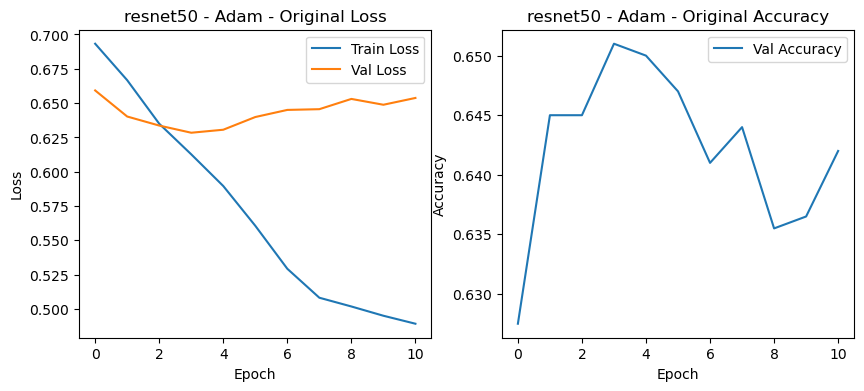

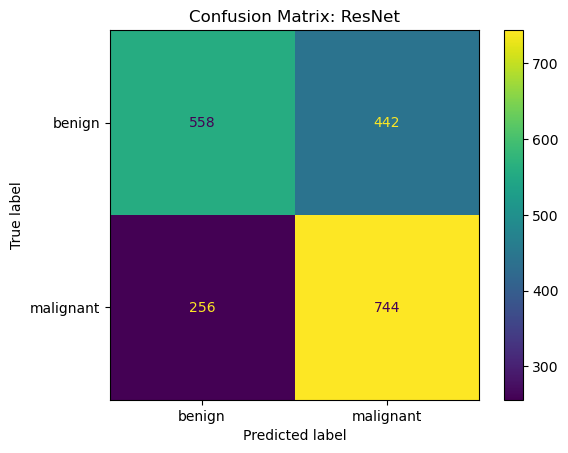

Epoch 0/19
----------
train Loss: 0.7238 Acc: 0.5281
test Loss: 0.6735 Acc: 0.5545
Epoch 0 time: 93.17s
Epoch 1/19
----------
train Loss: 0.6757 Acc: 0.5886
test Loss: 0.6419 Acc: 0.6330
Epoch 1 time: 92.61s
Epoch 2/19
----------
train Loss: 0.6423 Acc: 0.6339
test Loss: 0.6266 Acc: 0.6710
Epoch 2 time: 94.57s
Epoch 3/19
----------
train Loss: 0.6118 Acc: 0.6685
test Loss: 0.6232 Acc: 0.6735
Epoch 3 time: 93.00s
Epoch 4/19
----------
train Loss: 0.5844 Acc: 0.6873
test Loss: 0.6324 Acc: 0.6725
Epoch 4 time: 91.80s
Epoch 5/19
----------
train Loss: 0.5538 Acc: 0.7139
test Loss: 0.6215 Acc: 0.6755
Epoch 5 time: 94.14s
Epoch 6/19
----------
train Loss: 0.5223 Acc: 0.7349
test Loss: 0.6517 Acc: 0.6710
Epoch 6 time: 92.77s
Epoch 7/19
----------
train Loss: 0.4879 Acc: 0.7590
test Loss: 0.6487 Acc: 0.6625
Epoch 7 time: 91.62s
Epoch 8/19
----------
train Loss: 0.4865 Acc: 0.7646
test Loss: 0.6416 Acc: 0.6770
Epoch 8 time: 102.73s
Epoch 9/19
----------
train Loss: 0.4738 Acc: 0.7732
test Loss:

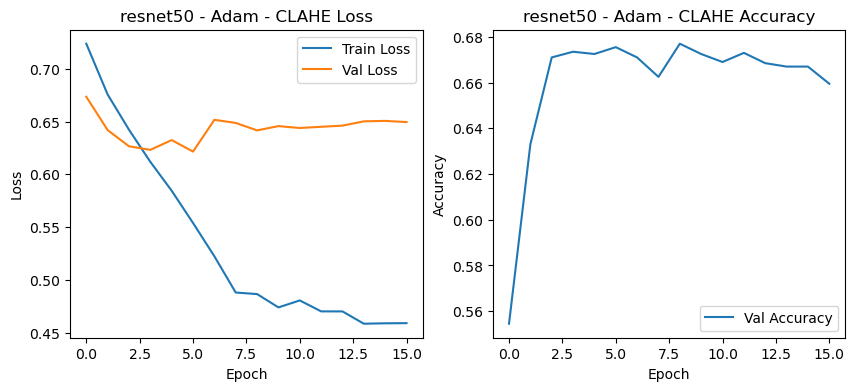

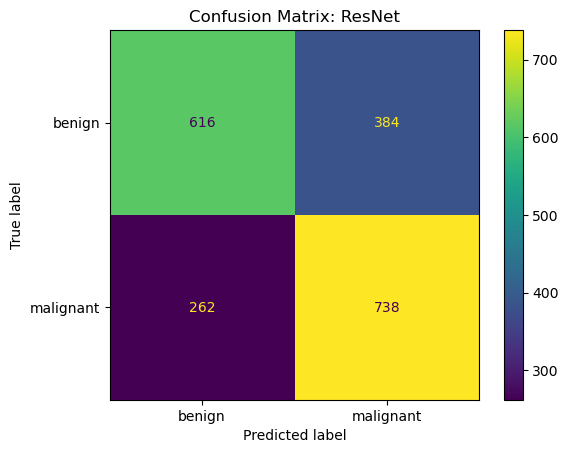

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.8788 Acc: 0.5094
test Loss: 0.8222 Acc: 0.5000
Epoch 0 time: 111.60s
Epoch 1/19
----------
train Loss: 0.7879 Acc: 0.5459
test Loss: 0.7527 Acc: 0.5665
Epoch 1 time: 93.10s
Epoch 2/19
----------
train Loss: 0.7189 Acc: 0.6024
test Loss: 0.7270 Acc: 0.5995
Epoch 2 time: 92.65s
Epoch 3/19
----------
train Loss: 0.6601 Acc: 0.6474
test Loss: 0.6904 Acc: 0.6250
Epoch 3 time: 96.28s
Epoch 4/19
----------
train Loss: 0.5896 Acc: 0.7015
test Loss: 0.6897 Acc: 0.6385
Epoch 4 time: 95.29s
Epoch 5/19
----------
train Loss: 0.5169 Acc: 0.7485
test Loss: 0.7110 Acc: 0.6430
Epoch 5 time: 92.68s
Epoch 6/19
----------
train Loss: 0.4302 Acc: 0.8014
test Loss: 0.7749 Acc: 0.6125
Epoch 6 time: 91.24s
Epoch 7/19
----------
train Loss: 0.3490 Acc: 0.8535
test Loss: 0.7772 Acc: 0.6265
Epoch 7 time: 93.08s
Epoch 8/19
----------
train Loss: 0.3407 Acc: 0.8540
test Loss: 0.7730 Acc: 0.6280
Ep

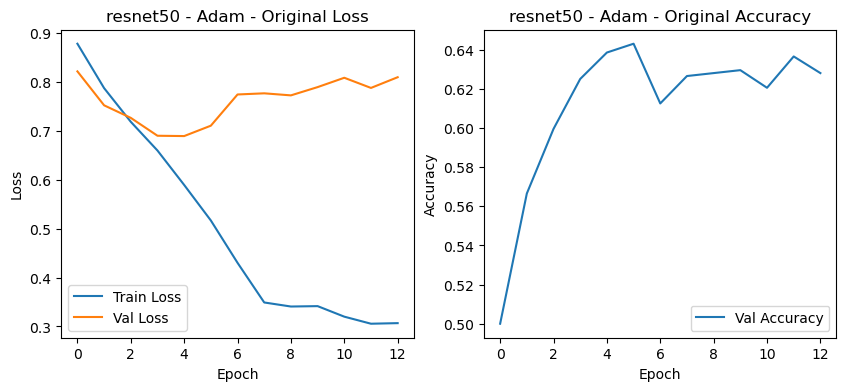

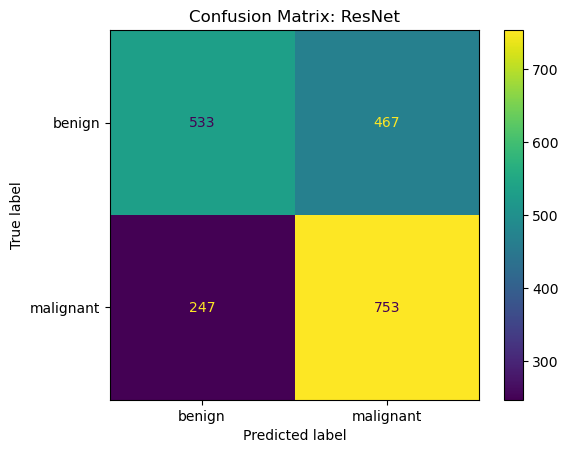

Epoch 0/19
----------
train Loss: 0.7947 Acc: 0.5122
test Loss: 0.7211 Acc: 0.5085
Epoch 0 time: 91.07s
Epoch 1/19
----------
train Loss: 0.7280 Acc: 0.5689
test Loss: 0.6831 Acc: 0.5895
Epoch 1 time: 93.99s
Epoch 2/19
----------
train Loss: 0.6804 Acc: 0.6234
test Loss: 0.6517 Acc: 0.6320
Epoch 2 time: 94.62s
Epoch 3/19
----------
train Loss: 0.6360 Acc: 0.6595
test Loss: 0.6505 Acc: 0.6515
Epoch 3 time: 94.70s
Epoch 4/19
----------
train Loss: 0.5877 Acc: 0.6916
test Loss: 0.6509 Acc: 0.6650
Epoch 4 time: 94.24s
Epoch 5/19
----------
train Loss: 0.5310 Acc: 0.7380
test Loss: 0.6568 Acc: 0.6575
Epoch 5 time: 94.70s
Epoch 6/19
----------
train Loss: 0.4762 Acc: 0.7698
test Loss: 0.7100 Acc: 0.6570
Epoch 6 time: 92.33s
Epoch 7/19
----------
train Loss: 0.4061 Acc: 0.8157
test Loss: 0.7005 Acc: 0.6465
Epoch 7 time: 93.31s
Epoch 8/19
----------
train Loss: 0.3979 Acc: 0.8217
test Loss: 0.7059 Acc: 0.6495
Epoch 8 time: 91.77s
Epoch 9/19
----------
train Loss: 0.3877 Acc: 0.8257
test Loss: 

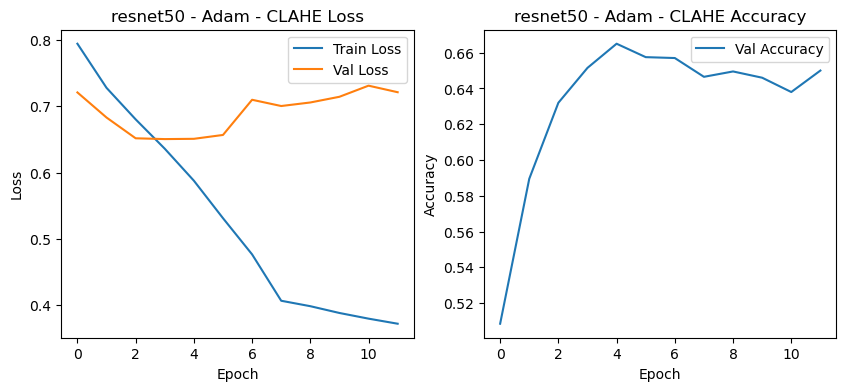

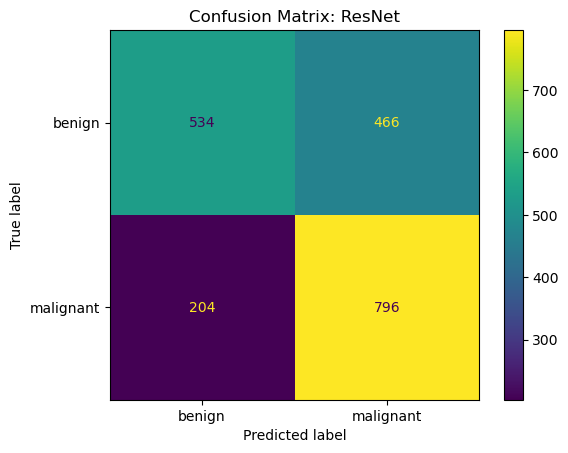

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.8137 Acc: 0.5161
test Loss: 0.7335 Acc: 0.5105
Epoch 0 time: 92.21s
Epoch 1/19
----------
train Loss: 0.7387 Acc: 0.5595
test Loss: 0.6771 Acc: 0.5925
Epoch 1 time: 97.34s
Epoch 2/19
----------
train Loss: 0.6840 Acc: 0.6106
test Loss: 0.6525 Acc: 0.6290
Epoch 2 time: 92.38s
Epoch 3/19
----------
train Loss: 0.6440 Acc: 0.6496
test Loss: 0.6466 Acc: 0.6265
Epoch 3 time: 92.50s
Epoch 4/19
----------
train Loss: 0.5892 Acc: 0.6903
test Loss: 0.6620 Acc: 0.6245
Epoch 4 time: 92.68s
Epoch 5/19
----------
train Loss: 0.5336 Acc: 0.7289
test Loss: 0.6890 Acc: 0.6190
Epoch 5 time: 92.10s
Epoch 6/19
----------
train Loss: 0.4774 Acc: 0.7668
test Loss: 0.7076 Acc: 0.6280
Epoch 6 time: 93.02s
Epoch 7/19
----------
train Loss: 0.4216 Acc: 0.8070
test Loss: 0.7203 Acc: 0.6270
Epoch 7 time: 92.68s
Epoch 8/19
----------
train Loss: 0.4044 Acc: 0.8125
test Loss: 0.7243 Acc: 0.6300
Epo

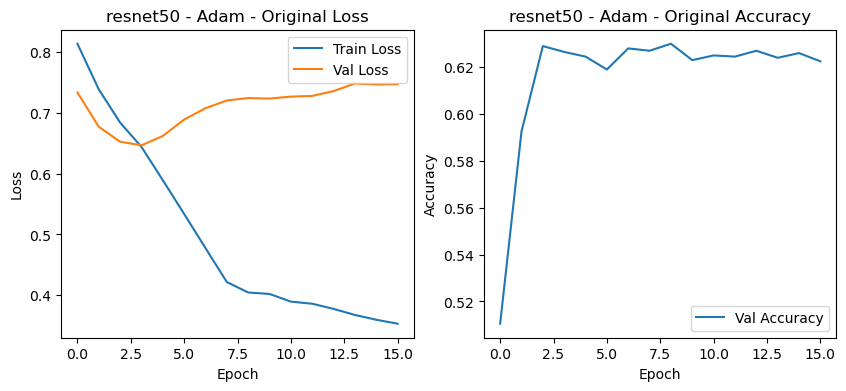

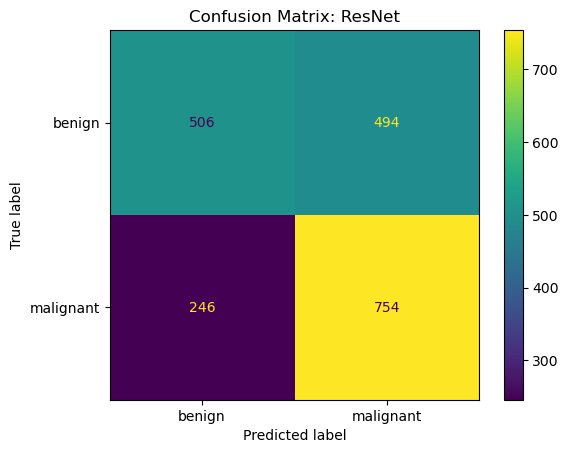

Epoch 0/19
----------
train Loss: 0.7237 Acc: 0.5349
test Loss: 0.6583 Acc: 0.6290
Epoch 0 time: 90.62s
Epoch 1/19
----------
train Loss: 0.6812 Acc: 0.5871
test Loss: 0.6361 Acc: 0.6510
Epoch 1 time: 92.29s
Epoch 2/19
----------
train Loss: 0.6464 Acc: 0.6312
test Loss: 0.6280 Acc: 0.6530
Epoch 2 time: 92.95s
Epoch 3/19
----------
train Loss: 0.6147 Acc: 0.6586
test Loss: 0.6292 Acc: 0.6550
Epoch 3 time: 92.86s
Epoch 4/19
----------
train Loss: 0.5902 Acc: 0.6920
test Loss: 0.6423 Acc: 0.6535
Epoch 4 time: 92.57s
Epoch 5/19
----------
train Loss: 0.5451 Acc: 0.7225
test Loss: 0.6496 Acc: 0.6490
Epoch 5 time: 92.70s
Epoch 6/19
----------
train Loss: 0.5048 Acc: 0.7504
test Loss: 0.6711 Acc: 0.6465
Epoch 6 time: 91.97s
Epoch 7/19
----------
train Loss: 0.4560 Acc: 0.7843
test Loss: 0.6713 Acc: 0.6510
Epoch 7 time: 92.52s
Epoch 8/19
----------
train Loss: 0.4473 Acc: 0.7900
test Loss: 0.6971 Acc: 0.6400
Epoch 8 time: 92.12s
Epoch 9/19
----------
train Loss: 0.4440 Acc: 0.7969
test Loss: 

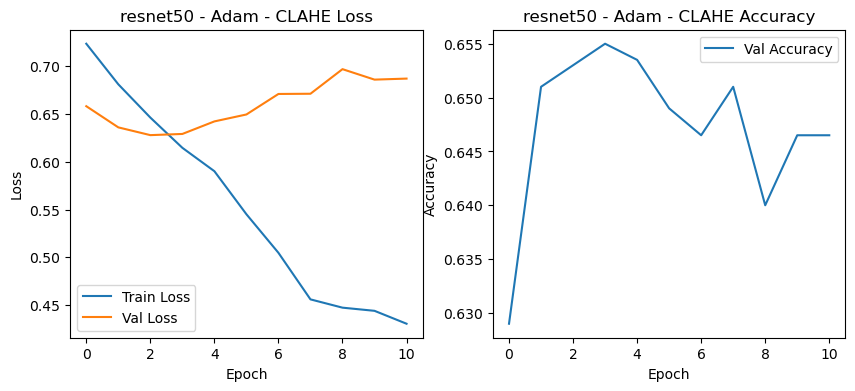

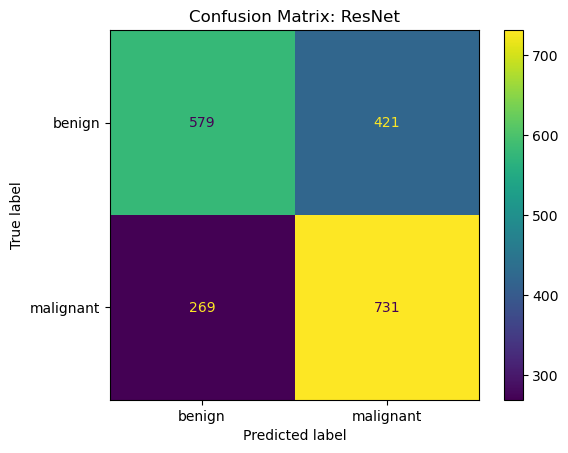

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7086 Acc: 0.5284
test Loss: 0.6634 Acc: 0.6255
Epoch 0 time: 90.92s
Epoch 1/19
----------
train Loss: 0.6708 Acc: 0.5955
test Loss: 0.6423 Acc: 0.6470
Epoch 1 time: 91.56s
Epoch 2/19
----------
train Loss: 0.6406 Acc: 0.6324
test Loss: 0.6323 Acc: 0.6515
Epoch 2 time: 91.92s
Epoch 3/19
----------
train Loss: 0.6155 Acc: 0.6620
test Loss: 0.6274 Acc: 0.6505
Epoch 3 time: 93.40s
Epoch 4/19
----------
train Loss: 0.5994 Acc: 0.6773
test Loss: 0.6276 Acc: 0.6485
Epoch 4 time: 92.42s
Epoch 5/19
----------
train Loss: 0.5802 Acc: 0.6921
test Loss: 0.6267 Acc: 0.6555
Epoch 5 time: 91.47s
Epoch 6/19
----------
train Loss: 0.5515 Acc: 0.7170
test Loss: 0.6409 Acc: 0.6480
Epoch 6 time: 91.42s
Epoch 7/19
----------
train Loss: 0.5328 Acc: 0.7264
test Loss: 0.6355 Acc: 0.6560
Epoch 7 time: 92.95s
Epoch 8/19
----------
train Loss: 0.5268 Acc: 0.7375
test Loss: 0.6387 Acc: 0.6500
Ep

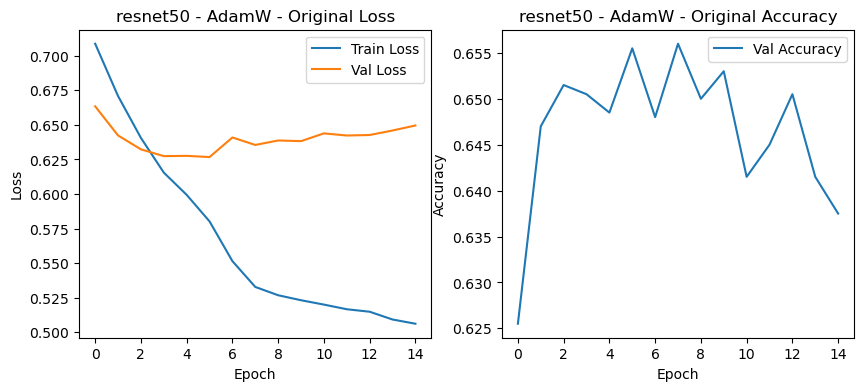

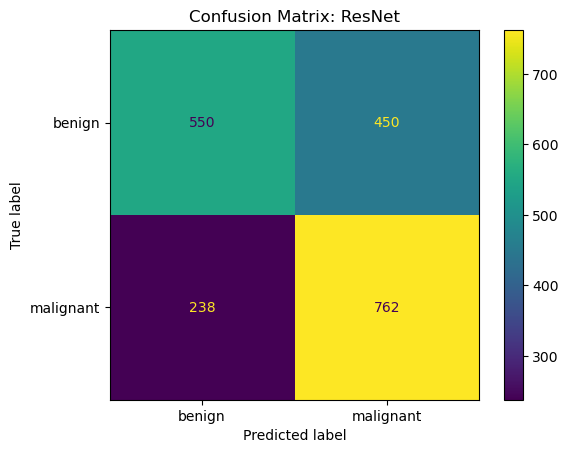

Epoch 0/19
----------
train Loss: 0.6948 Acc: 0.5456
test Loss: 0.6632 Acc: 0.6110
Epoch 0 time: 93.23s
Epoch 1/19
----------
train Loss: 0.6659 Acc: 0.6056
test Loss: 0.6424 Acc: 0.6435
Epoch 1 time: 93.40s
Epoch 2/19
----------
train Loss: 0.6348 Acc: 0.6356
test Loss: 0.6323 Acc: 0.6575
Epoch 2 time: 92.40s
Epoch 3/19
----------
train Loss: 0.6065 Acc: 0.6711
test Loss: 0.6264 Acc: 0.6595
Epoch 3 time: 92.60s
Epoch 4/19
----------
train Loss: 0.5848 Acc: 0.6909
test Loss: 0.6322 Acc: 0.6690
Epoch 4 time: 98.20s
Epoch 5/19
----------
train Loss: 0.5510 Acc: 0.7125
test Loss: 0.6340 Acc: 0.6640
Epoch 5 time: 94.23s
Epoch 6/19
----------
train Loss: 0.5191 Acc: 0.7410
test Loss: 0.6473 Acc: 0.6610
Epoch 6 time: 93.86s
Epoch 7/19
----------
train Loss: 0.4934 Acc: 0.7608
test Loss: 0.6553 Acc: 0.6610
Epoch 7 time: 92.98s
Epoch 8/19
----------
train Loss: 0.4884 Acc: 0.7655
test Loss: 0.6586 Acc: 0.6635
Epoch 8 time: 91.94s
Epoch 9/19
----------
train Loss: 0.4869 Acc: 0.7641
test Loss: 

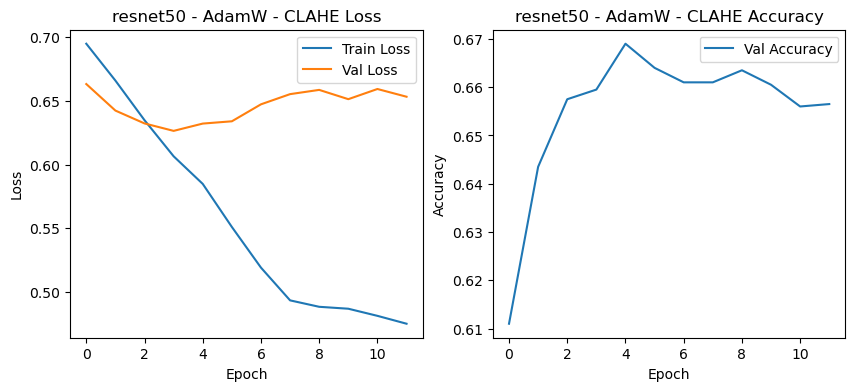

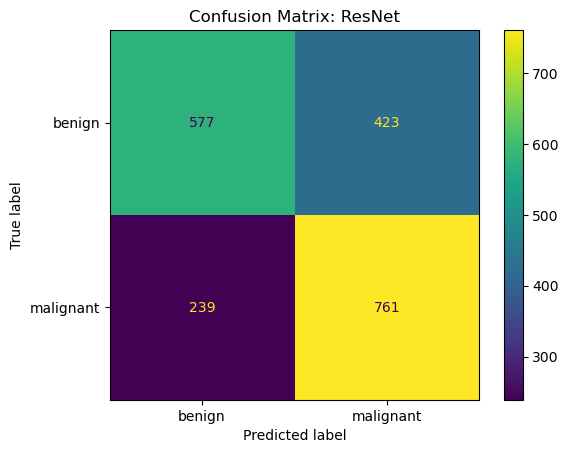

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7080 Acc: 0.5329
test Loss: 0.6575 Acc: 0.6270
Epoch 0 time: 91.69s
Epoch 1/19
----------
train Loss: 0.6721 Acc: 0.5969
test Loss: 0.6327 Acc: 0.6525
Epoch 1 time: 92.19s
Epoch 2/19
----------
train Loss: 0.6422 Acc: 0.6395
test Loss: 0.6270 Acc: 0.6540
Epoch 2 time: 92.24s
Epoch 3/19
----------
train Loss: 0.6173 Acc: 0.6541
test Loss: 0.6222 Acc: 0.6530
Epoch 3 time: 92.03s
Epoch 4/19
----------
train Loss: 0.5970 Acc: 0.6784
test Loss: 0.6197 Acc: 0.6575
Epoch 4 time: 92.44s
Epoch 5/19
----------
train Loss: 0.5734 Acc: 0.6999
test Loss: 0.6302 Acc: 0.6520
Epoch 5 time: 92.21s
Epoch 6/19
----------
train Loss: 0.5477 Acc: 0.7204
test Loss: 0.6221 Acc: 0.6525
Epoch 6 time: 91.18s
Epoch 7/19
----------
train Loss: 0.5306 Acc: 0.7341
test Loss: 0.6226 Acc: 0.6590
Epoch 7 time: 94.09s
Epoch 8/19
----------
train Loss: 0.5253 Acc: 0.7338
test Loss: 0.6269 Acc: 0.6530
Ep

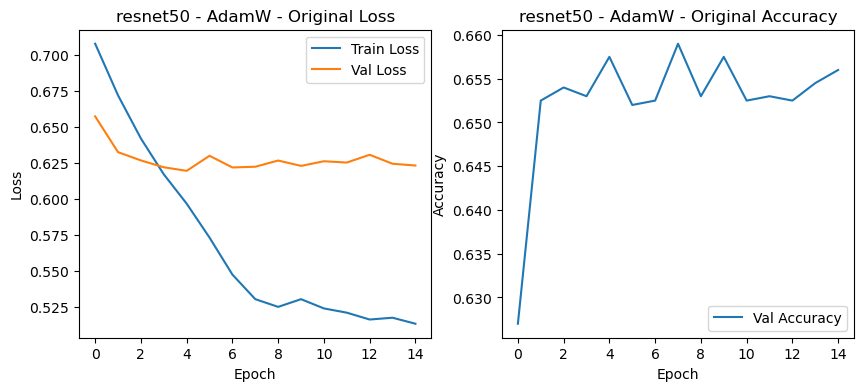

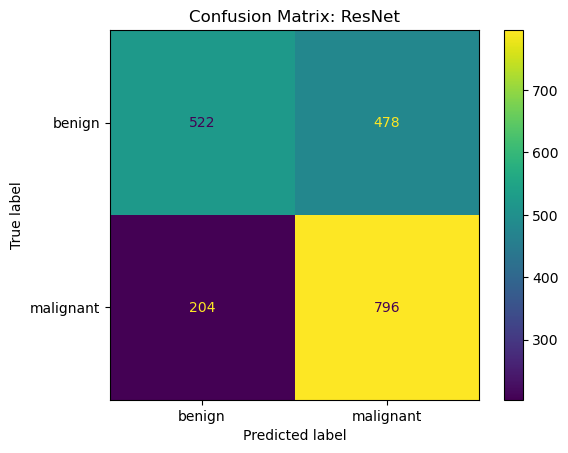

Epoch 0/19
----------
train Loss: 0.6873 Acc: 0.5634
test Loss: 0.6456 Acc: 0.6310
Epoch 0 time: 112.54s
Epoch 1/19
----------
train Loss: 0.6488 Acc: 0.6238
test Loss: 0.6275 Acc: 0.6570
Epoch 1 time: 95.90s
Epoch 2/19
----------
train Loss: 0.6224 Acc: 0.6519
test Loss: 0.6215 Acc: 0.6590
Epoch 2 time: 92.29s
Epoch 3/19
----------
train Loss: 0.5950 Acc: 0.6834
test Loss: 0.6184 Acc: 0.6625
Epoch 3 time: 92.66s
Epoch 4/19
----------
train Loss: 0.5654 Acc: 0.7080
test Loss: 0.6240 Acc: 0.6590
Epoch 4 time: 91.93s
Epoch 5/19
----------
train Loss: 0.5302 Acc: 0.7382
test Loss: 0.6381 Acc: 0.6510
Epoch 5 time: 92.36s
Epoch 6/19
----------
train Loss: 0.5041 Acc: 0.7528
test Loss: 0.6599 Acc: 0.6380
Epoch 6 time: 93.26s
Epoch 7/19
----------
train Loss: 0.4639 Acc: 0.7878
test Loss: 0.6687 Acc: 0.6440
Epoch 7 time: 94.65s
Epoch 8/19
----------
train Loss: 0.4582 Acc: 0.7884
test Loss: 0.6627 Acc: 0.6450
Epoch 8 time: 92.61s
Epoch 9/19
----------
train Loss: 0.4477 Acc: 0.7940
test Loss:

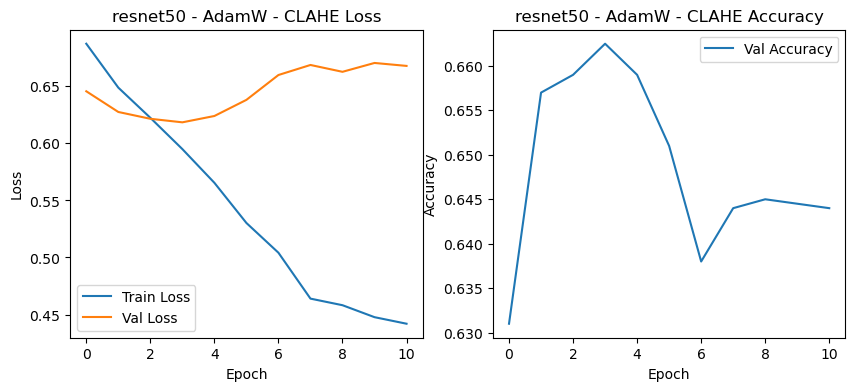

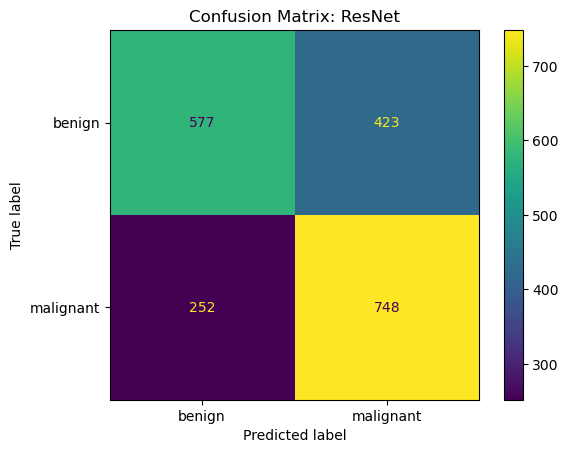

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7255 Acc: 0.5341
test Loss: 0.6588 Acc: 0.6395
Epoch 0 time: 93.33s
Epoch 1/19
----------
train Loss: 0.6871 Acc: 0.5813
test Loss: 0.6424 Acc: 0.6410
Epoch 1 time: 93.83s
Epoch 2/19
----------
train Loss: 0.6571 Acc: 0.6212
test Loss: 0.6313 Acc: 0.6490
Epoch 2 time: 93.83s
Epoch 3/19
----------
train Loss: 0.6418 Acc: 0.6366
test Loss: 0.6267 Acc: 0.6470
Epoch 3 time: 92.28s
Epoch 4/19
----------
train Loss: 0.6217 Acc: 0.6579
test Loss: 0.6250 Acc: 0.6500
Epoch 4 time: 93.23s
Epoch 5/19
----------
train Loss: 0.5948 Acc: 0.6775
test Loss: 0.6262 Acc: 0.6560
Epoch 5 time: 93.72s
Epoch 6/19
----------
train Loss: 0.5773 Acc: 0.6891
test Loss: 0.6340 Acc: 0.6545
Epoch 6 time: 92.94s
Epoch 7/19
----------
train Loss: 0.5479 Acc: 0.7150
test Loss: 0.6326 Acc: 0.6490
Epoch 7 time: 92.59s
Epoch 8/19
----------
train Loss: 0.5436 Acc: 0.7203
test Loss: 0.6356 Acc: 0.6480
Ep

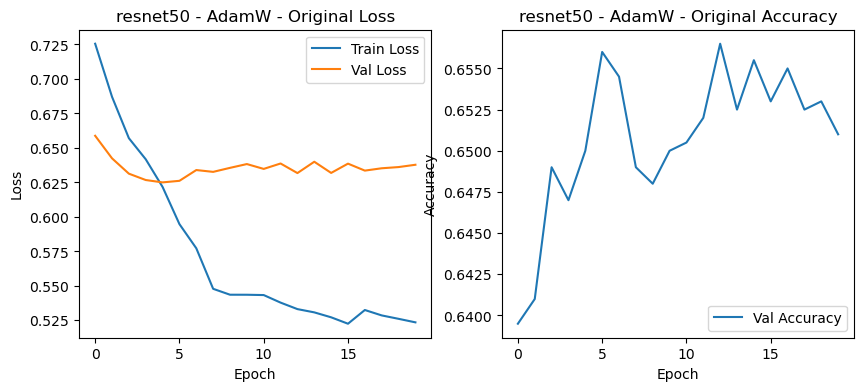

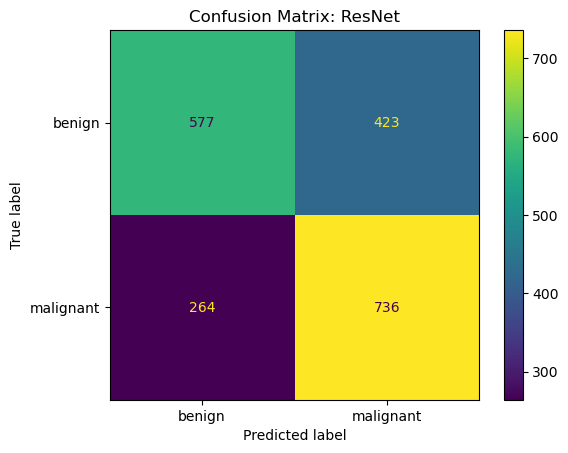

Epoch 0/19
----------
train Loss: 0.7312 Acc: 0.5236
test Loss: 0.6560 Acc: 0.6400
Epoch 0 time: 94.69s
Epoch 1/19
----------
train Loss: 0.6858 Acc: 0.5843
test Loss: 0.6354 Acc: 0.6470
Epoch 1 time: 98.68s
Epoch 2/19
----------
train Loss: 0.6517 Acc: 0.6266
test Loss: 0.6303 Acc: 0.6500
Epoch 2 time: 101.28s
Epoch 3/19
----------
train Loss: 0.6220 Acc: 0.6556
test Loss: 0.6259 Acc: 0.6525
Epoch 3 time: 99.94s
Epoch 4/19
----------
train Loss: 0.5960 Acc: 0.6889
test Loss: 0.6307 Acc: 0.6520
Epoch 4 time: 100.62s
Epoch 5/19
----------
train Loss: 0.5537 Acc: 0.7196
test Loss: 0.6442 Acc: 0.6535
Epoch 5 time: 100.03s
Epoch 6/19
----------
train Loss: 0.5148 Acc: 0.7488
test Loss: 0.6727 Acc: 0.6485
Epoch 6 time: 97.63s
Epoch 7/19
----------
train Loss: 0.4728 Acc: 0.7740
test Loss: 0.6764 Acc: 0.6500
Epoch 7 time: 98.98s
Epoch 8/19
----------
train Loss: 0.4702 Acc: 0.7780
test Loss: 0.6869 Acc: 0.6445
Epoch 8 time: 114.26s
Epoch 9/19
----------
train Loss: 0.4556 Acc: 0.7883
test Lo

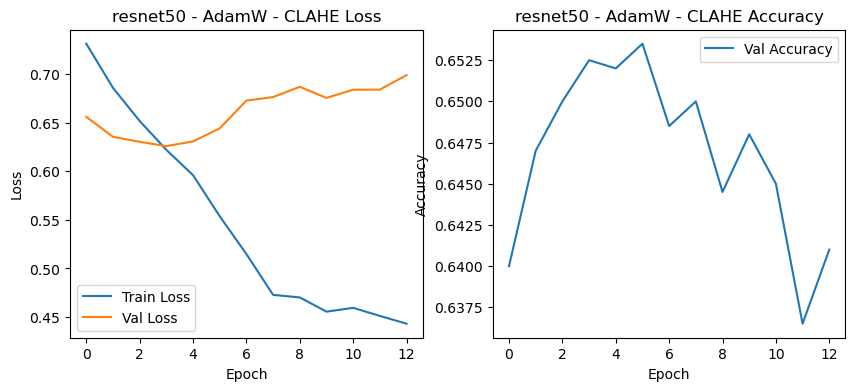

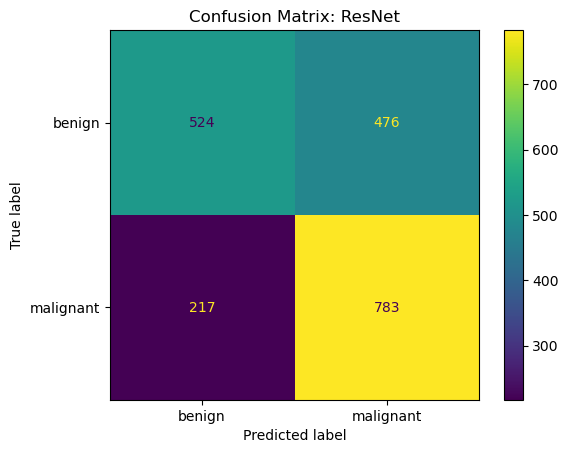

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7350 Acc: 0.5102
test Loss: 0.6619 Acc: 0.6210
Epoch 0 time: 102.69s
Epoch 1/19
----------
train Loss: 0.6987 Acc: 0.5673
test Loss: 0.6375 Acc: 0.6450
Epoch 1 time: 99.04s
Epoch 2/19
----------
train Loss: 0.6606 Acc: 0.6205
test Loss: 0.6268 Acc: 0.6450
Epoch 2 time: 98.37s
Epoch 3/19
----------
train Loss: 0.6324 Acc: 0.6518
test Loss: 0.6272 Acc: 0.6485
Epoch 3 time: 97.30s
Epoch 4/19
----------
train Loss: 0.6048 Acc: 0.6743
test Loss: 0.6350 Acc: 0.6455
Epoch 4 time: 98.60s
Epoch 5/19
----------
train Loss: 0.5706 Acc: 0.7047
test Loss: 0.6455 Acc: 0.6310
Epoch 5 time: 96.32s
Epoch 6/19
----------
train Loss: 0.5310 Acc: 0.7341
test Loss: 0.6632 Acc: 0.6320
Epoch 6 time: 90.79s
Epoch 7/19
----------
train Loss: 0.4942 Acc: 0.7629
test Loss: 0.6594 Acc: 0.6360
Epoch 7 time: 90.77s
Epoch 8/19
----------
train Loss: 0.4944 Acc: 0.7574
test Loss: 0.6688 Acc: 0.6250
E

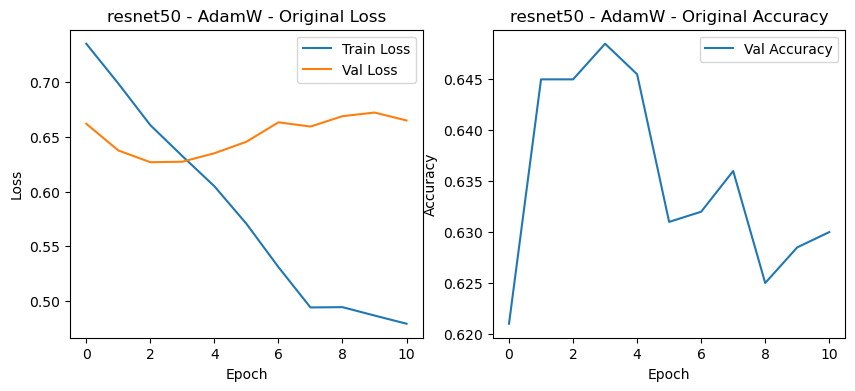

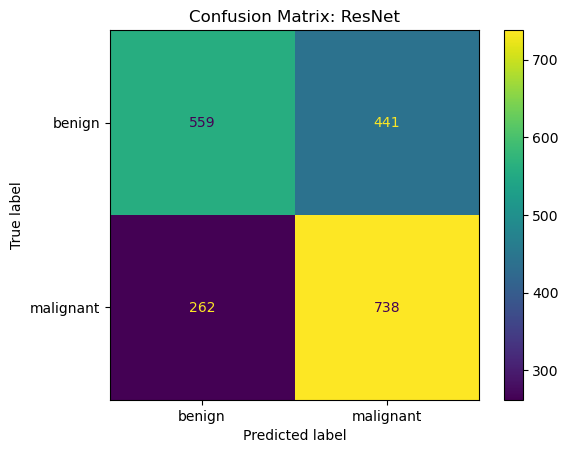

Epoch 0/19
----------
train Loss: 0.8011 Acc: 0.5078
test Loss: 0.7260 Acc: 0.5065
Epoch 0 time: 91.68s
Epoch 1/19
----------
train Loss: 0.7314 Acc: 0.5650
test Loss: 0.6889 Acc: 0.5825
Epoch 1 time: 94.56s
Epoch 2/19
----------
train Loss: 0.6897 Acc: 0.6109
test Loss: 0.6736 Acc: 0.6210
Epoch 2 time: 94.28s
Epoch 3/19
----------
train Loss: 0.6535 Acc: 0.6486
test Loss: 0.6585 Acc: 0.6465
Epoch 3 time: 91.84s
Epoch 4/19
----------
train Loss: 0.6002 Acc: 0.6891
test Loss: 0.6667 Acc: 0.6500
Epoch 4 time: 92.07s
Epoch 5/19
----------
train Loss: 0.5361 Acc: 0.7305
test Loss: 0.6799 Acc: 0.6485
Epoch 5 time: 91.85s
Epoch 6/19
----------
train Loss: 0.4850 Acc: 0.7644
test Loss: 0.7415 Acc: 0.6305
Epoch 6 time: 91.70s
Epoch 7/19
----------
train Loss: 0.4152 Acc: 0.8083
test Loss: 0.7187 Acc: 0.6425
Epoch 7 time: 93.19s
Epoch 8/19
----------
train Loss: 0.4114 Acc: 0.8115
test Loss: 0.7328 Acc: 0.6410
Epoch 8 time: 91.79s
Epoch 9/19
----------
train Loss: 0.4002 Acc: 0.8175
test Loss: 

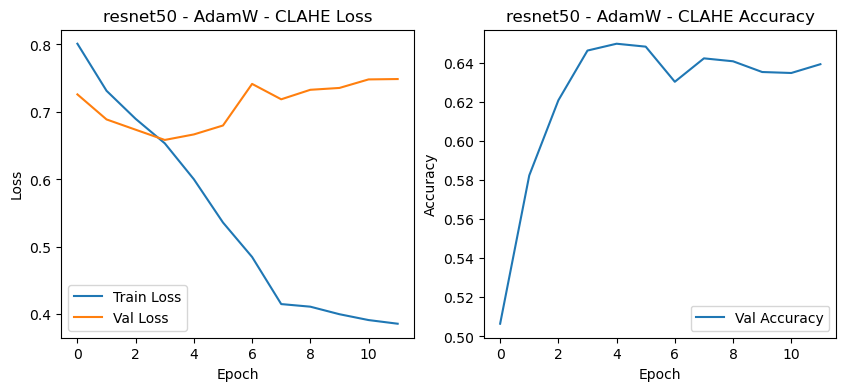

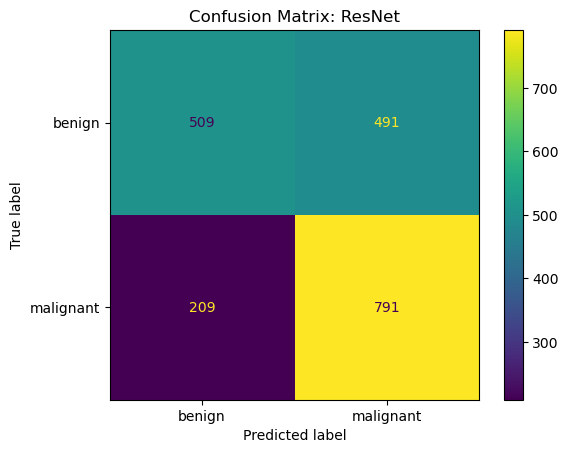

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6931 Acc: 0.5635
test Loss: 0.6573 Acc: 0.6260
Epoch 0 time: 97.31s
Epoch 1/19
----------
train Loss: 0.6387 Acc: 0.6409
test Loss: 0.6522 Acc: 0.6365
Epoch 1 time: 93.46s
Epoch 2/19
----------
train Loss: 0.5967 Acc: 0.6793
test Loss: 0.6341 Acc: 0.6495
Epoch 2 time: 93.02s
Epoch 3/19
----------
train Loss: 0.5331 Acc: 0.7195
test Loss: 0.6475 Acc: 0.6550
Epoch 3 time: 92.71s
Epoch 4/19
----------
train Loss: 0.4687 Acc: 0.7744
test Loss: 0.6729 Acc: 0.6485
Epoch 4 time: 93.74s
Epoch 5/19
----------
train Loss: 0.3765 Acc: 0.8343
test Loss: 0.7407 Acc: 0.6270
Epoch 5 time: 93.93s
Epoch 6/19
----------
train Loss: 0.2834 Acc: 0.8889
test Loss: 0.7923 Acc: 0.6360
Epoch 6 time: 95.46s
Epoch 7/19
----------
train Loss: 0.2043 Acc: 0.9297
test Loss: 0.8154 Acc: 0.6315
Epoch 7 time: 97.56s
Epoch 8/19
----------
train Loss: 0.1892 Acc: 0.9390
test Loss: 0.8474 Acc: 0.6230
Epoc

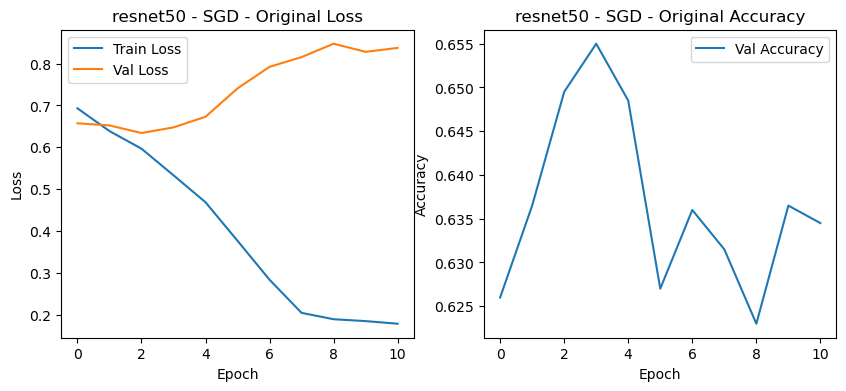

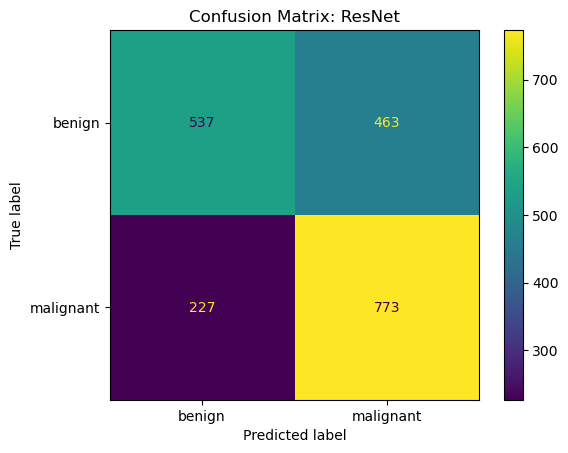

Epoch 0/19
----------
train Loss: 0.6893 Acc: 0.5654
test Loss: 0.6356 Acc: 0.6600
Epoch 0 time: 91.28s
Epoch 1/19
----------
train Loss: 0.6266 Acc: 0.6546
test Loss: 0.6252 Acc: 0.6645
Epoch 1 time: 92.21s
Epoch 2/19
----------
train Loss: 0.5809 Acc: 0.6965
test Loss: 0.6242 Acc: 0.6680
Epoch 2 time: 93.17s
Epoch 3/19
----------
train Loss: 0.5264 Acc: 0.7268
test Loss: 0.6438 Acc: 0.6550
Epoch 3 time: 104.75s
Epoch 4/19
----------
train Loss: 0.4807 Acc: 0.7599
test Loss: 0.6676 Acc: 0.6375
Epoch 4 time: 98.11s
Epoch 5/19
----------
train Loss: 0.4115 Acc: 0.8081
test Loss: 0.6795 Acc: 0.6635
Epoch 5 time: 93.94s
Epoch 6/19
----------
train Loss: 0.3367 Acc: 0.8616
test Loss: 0.7267 Acc: 0.6485
Epoch 6 time: 92.71s
Epoch 7/19
----------
train Loss: 0.2684 Acc: 0.9030
test Loss: 0.7308 Acc: 0.6555
Epoch 7 time: 92.40s
Epoch 8/19
----------
train Loss: 0.2566 Acc: 0.9136
test Loss: 0.7457 Acc: 0.6495
Epoch 8 time: 91.59s
Epoch 9/19
----------
train Loss: 0.2457 Acc: 0.9155
test Loss:

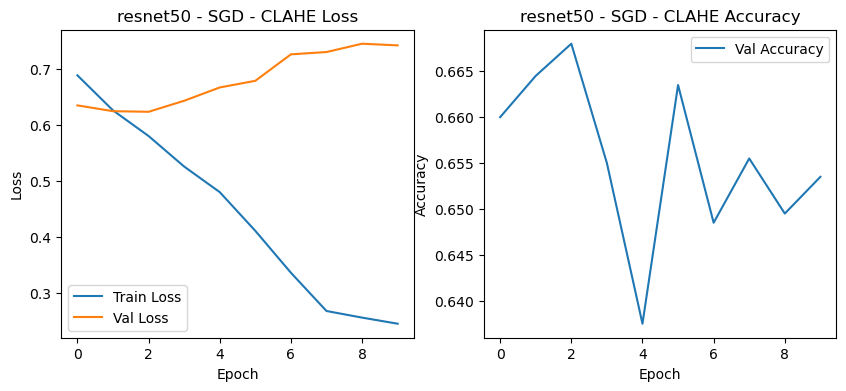

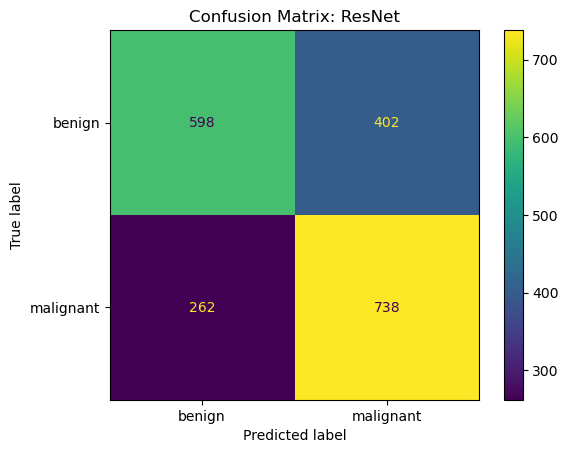

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6777 Acc: 0.5701
test Loss: 0.6431 Acc: 0.6355
Epoch 0 time: 90.91s
Epoch 1/19
----------
train Loss: 0.6329 Acc: 0.6459
test Loss: 0.6309 Acc: 0.6475
Epoch 1 time: 93.66s
Epoch 2/19
----------
train Loss: 0.5893 Acc: 0.6810
test Loss: 0.6320 Acc: 0.6445
Epoch 2 time: 98.40s
Epoch 3/19
----------
train Loss: 0.5446 Acc: 0.7208
test Loss: 0.6408 Acc: 0.6475
Epoch 3 time: 94.30s
Epoch 4/19
----------
train Loss: 0.4807 Acc: 0.7651
test Loss: 0.6587 Acc: 0.6615
Epoch 4 time: 91.88s
Epoch 5/19
----------
train Loss: 0.4118 Acc: 0.8133
test Loss: 0.7037 Acc: 0.6365
Epoch 5 time: 93.73s
Epoch 6/19
----------
train Loss: 0.3196 Acc: 0.8675
test Loss: 0.7566 Acc: 0.6405
Epoch 6 time: 92.55s
Epoch 7/19
----------
train Loss: 0.2409 Acc: 0.9149
test Loss: 0.7725 Acc: 0.6315
Epoch 7 time: 92.17s
Epoch 8/19
----------
train Loss: 0.2275 Acc: 0.9228
test Loss: 0.7882 Acc: 0.6380
Epoc

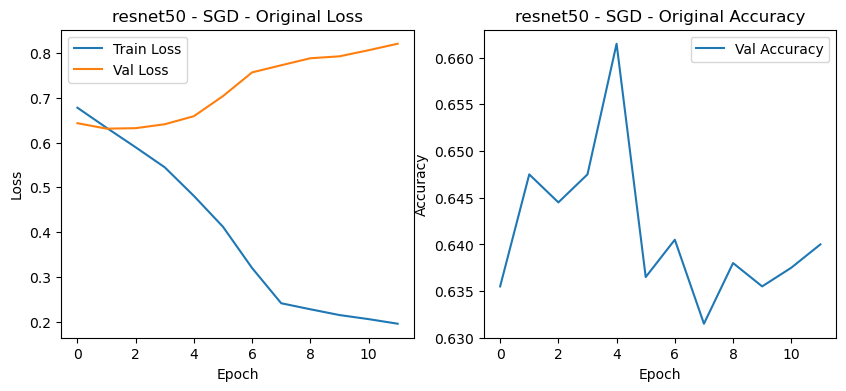

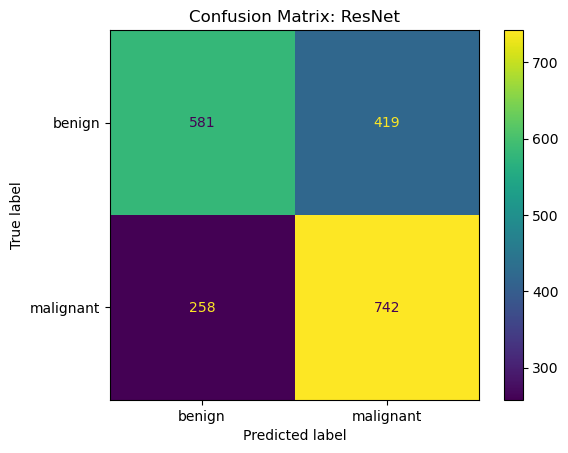

Epoch 0/19
----------
train Loss: 0.6939 Acc: 0.5475
test Loss: 0.6427 Acc: 0.6370
Epoch 0 time: 92.68s
Epoch 1/19
----------
train Loss: 0.6372 Acc: 0.6389
test Loss: 0.6228 Acc: 0.6560
Epoch 1 time: 92.53s
Epoch 2/19
----------
train Loss: 0.5930 Acc: 0.6800
test Loss: 0.6194 Acc: 0.6705
Epoch 2 time: 91.68s
Epoch 3/19
----------
train Loss: 0.5530 Acc: 0.7053
test Loss: 0.6250 Acc: 0.6680
Epoch 3 time: 91.85s
Epoch 4/19
----------
train Loss: 0.4960 Acc: 0.7504
test Loss: 0.6377 Acc: 0.6635
Epoch 4 time: 93.97s
Epoch 5/19
----------
train Loss: 0.4424 Acc: 0.7859
test Loss: 0.6598 Acc: 0.6560
Epoch 5 time: 91.60s
Epoch 6/19
----------
train Loss: 0.3721 Acc: 0.8351
test Loss: 0.6934 Acc: 0.6500
Epoch 6 time: 91.76s
Epoch 7/19
----------
train Loss: 0.3173 Acc: 0.8744
test Loss: 0.7011 Acc: 0.6530
Epoch 7 time: 93.01s
Epoch 8/19
----------
train Loss: 0.3085 Acc: 0.8786
test Loss: 0.7082 Acc: 0.6440
Epoch 8 time: 91.26s
Epoch 9/19
----------
train Loss: 0.2941 Acc: 0.8886
test Loss: 

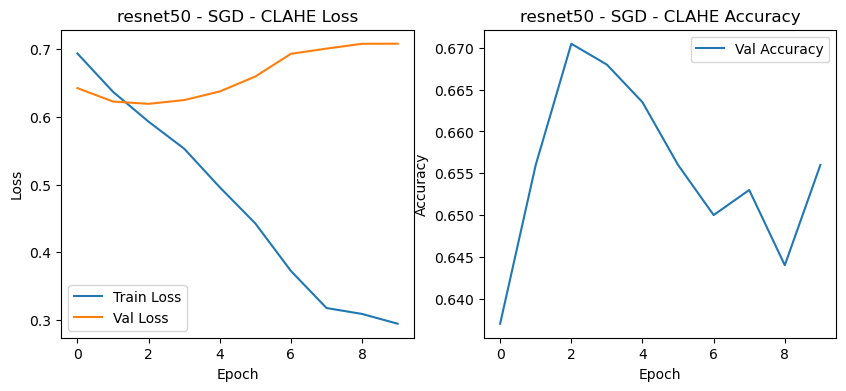

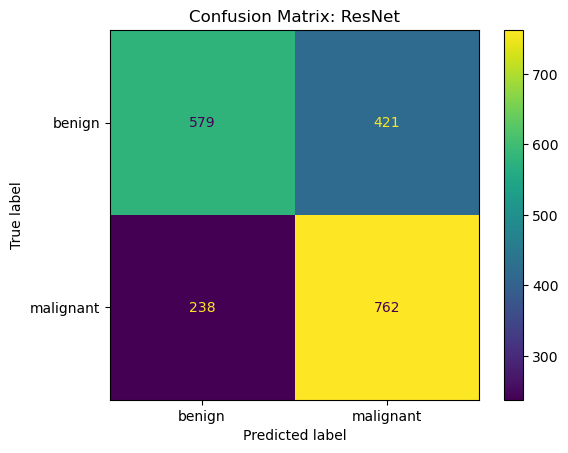

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.8325 Acc: 0.5204
test Loss: 0.7362 Acc: 0.5625
Epoch 0 time: 90.68s
Epoch 1/19
----------
train Loss: 0.6976 Acc: 0.6230
test Loss: 0.6981 Acc: 0.6175
Epoch 1 time: 91.90s
Epoch 2/19
----------
train Loss: 0.5955 Acc: 0.6945
test Loss: 0.6716 Acc: 0.6435
Epoch 2 time: 95.85s
Epoch 3/19
----------
train Loss: 0.4842 Acc: 0.7655
test Loss: 0.7682 Acc: 0.6330
Epoch 3 time: 92.18s
Epoch 4/19
----------
train Loss: 0.3543 Acc: 0.8420
test Loss: 0.8637 Acc: 0.6570
Epoch 4 time: 92.66s
Epoch 5/19
----------
train Loss: 0.2296 Acc: 0.9109
test Loss: 0.9439 Acc: 0.6230
Epoch 5 time: 95.16s
Epoch 6/19
----------
train Loss: 0.1538 Acc: 0.9439
test Loss: 1.0950 Acc: 0.6110
Epoch 6 time: 97.18s
Epoch 7/19
----------
train Loss: 0.1043 Acc: 0.9677
test Loss: 1.0320 Acc: 0.6230
Epoch 7 time: 99.24s
Epoch 8/19
----------
train Loss: 0.0950 Acc: 0.9700
test Loss: 1.0308 Acc: 0.6275
Epoc

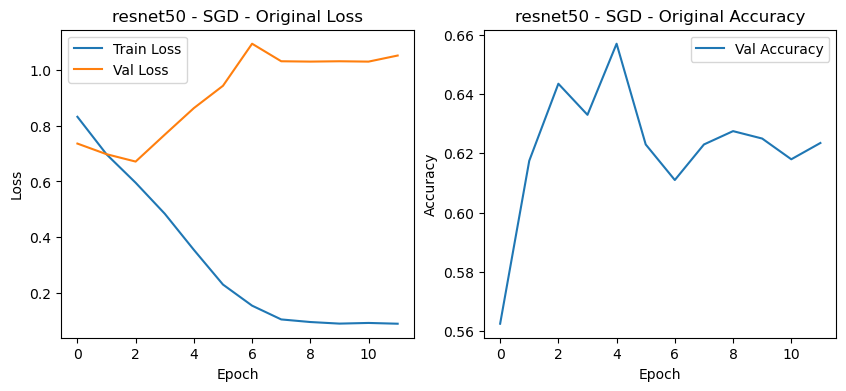

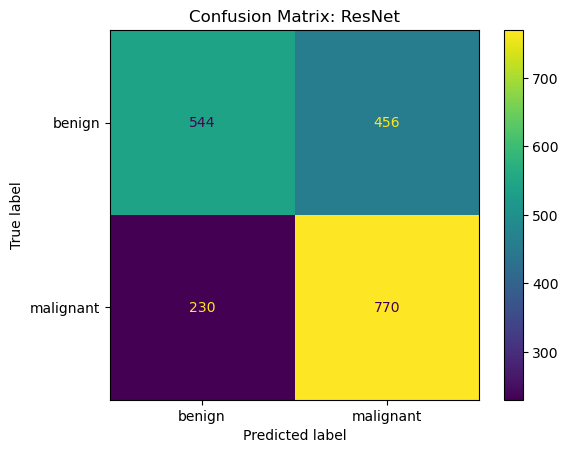

Epoch 0/19
----------
train Loss: 0.7350 Acc: 0.5364
test Loss: 0.6503 Acc: 0.6285
Epoch 0 time: 92.19s
Epoch 1/19
----------
train Loss: 0.6606 Acc: 0.6276
test Loss: 0.6298 Acc: 0.6640
Epoch 1 time: 93.78s
Epoch 2/19
----------
train Loss: 0.5962 Acc: 0.6877
test Loss: 0.6540 Acc: 0.6650
Epoch 2 time: 92.54s
Epoch 3/19
----------
train Loss: 0.5098 Acc: 0.7471
test Loss: 0.6848 Acc: 0.6470
Epoch 3 time: 93.08s
Epoch 4/19
----------
train Loss: 0.4053 Acc: 0.8151
test Loss: 0.7620 Acc: 0.6505
Epoch 4 time: 93.62s
Epoch 5/19
----------
train Loss: 0.2880 Acc: 0.8810
test Loss: 0.8869 Acc: 0.6305
Epoch 5 time: 93.87s
Epoch 6/19
----------
train Loss: 0.1795 Acc: 0.9351
test Loss: 0.9356 Acc: 0.6605
Epoch 6 time: 94.98s
Epoch 7/19
----------
train Loss: 0.1229 Acc: 0.9621
test Loss: 1.0036 Acc: 0.6355
Epoch 7 time: 93.41s
Epoch 8/19
----------
train Loss: 0.1112 Acc: 0.9683
test Loss: 0.9688 Acc: 0.6455
Epoch 8 time: 93.04s
Epoch 9/19
----------
train Loss: 0.1057 Acc: 0.9681
test Loss: 

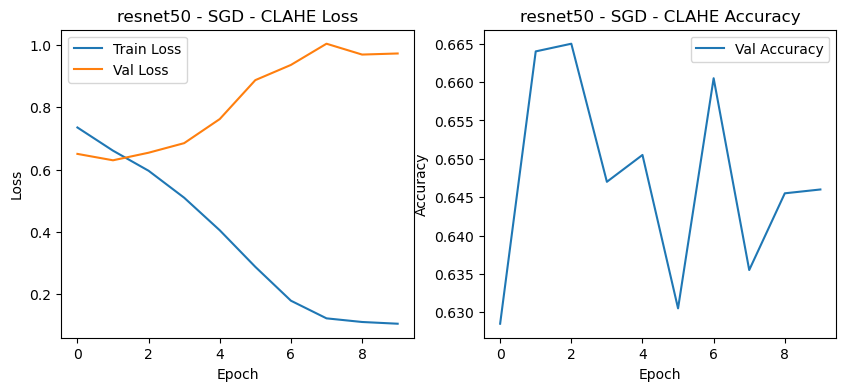

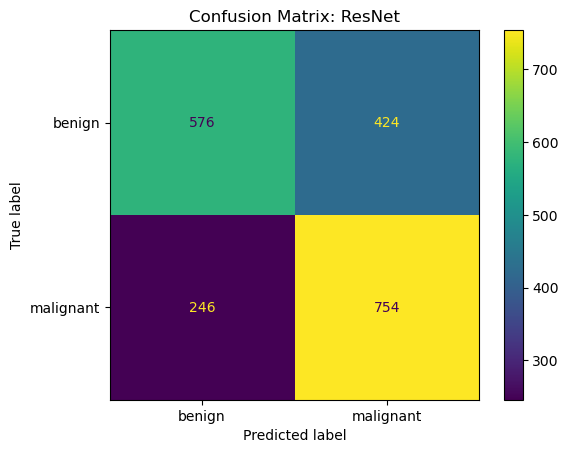

Entrenando resnet50 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7129 Acc: 0.5497
test Loss: 0.6333 Acc: 0.6655
Epoch 0 time: 91.49s
Epoch 1/19
----------
train Loss: 0.6570 Acc: 0.6258
test Loss: 0.6218 Acc: 0.6645
Epoch 1 time: 93.08s
Epoch 2/19
----------
train Loss: 0.6162 Acc: 0.6660
test Loss: 0.6210 Acc: 0.6620
Epoch 2 time: 93.19s
Epoch 3/19
----------
train Loss: 0.5706 Acc: 0.7014
test Loss: 0.6257 Acc: 0.6640
Epoch 3 time: 93.33s
Epoch 4/19
----------
train Loss: 0.5133 Acc: 0.7365
test Loss: 0.6412 Acc: 0.6560
Epoch 4 time: 92.76s
Epoch 5/19
----------
train Loss: 0.4407 Acc: 0.7899
test Loss: 0.6905 Acc: 0.6610
Epoch 5 time: 93.10s
Epoch 6/19
----------
train Loss: 0.3533 Acc: 0.8464
test Loss: 0.7269 Acc: 0.6525
Epoch 6 time: 92.82s
Epoch 7/19
----------
train Loss: 0.2783 Acc: 0.8926
test Loss: 0.7336 Acc: 0.6565
Early stopping triggered
Training complete in 12m 23s
Best val Acc: 0.6655


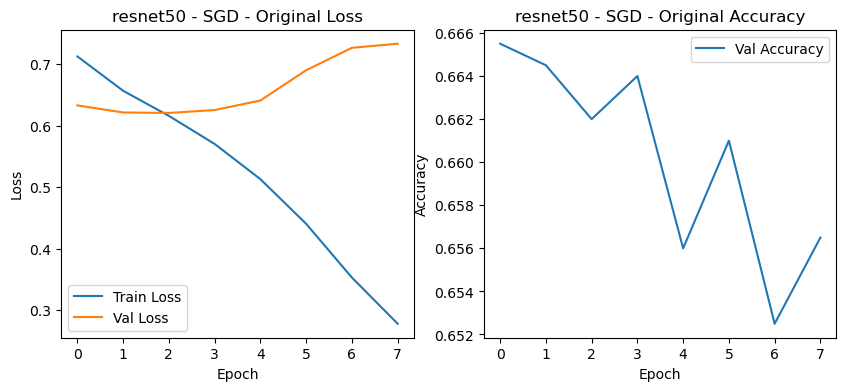

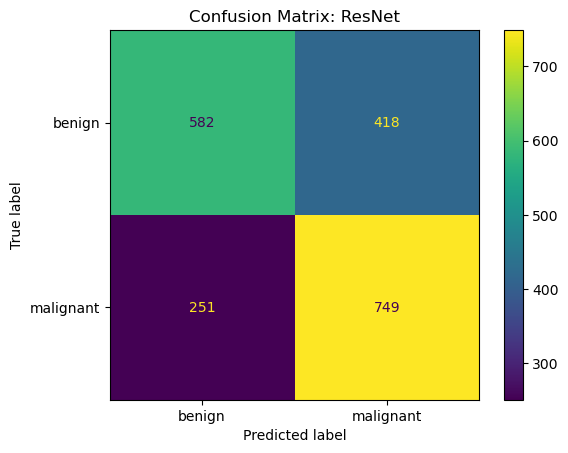

Epoch 0/19
----------
train Loss: 0.7152 Acc: 0.5495
test Loss: 0.6327 Acc: 0.6535
Epoch 0 time: 91.29s
Epoch 1/19
----------
train Loss: 0.6573 Acc: 0.6195
test Loss: 0.6195 Acc: 0.6630
Epoch 1 time: 93.28s
Epoch 2/19
----------
train Loss: 0.6155 Acc: 0.6666
test Loss: 0.6212 Acc: 0.6695
Epoch 2 time: 93.07s
Epoch 3/19
----------
train Loss: 0.5592 Acc: 0.7057
test Loss: 0.6285 Acc: 0.6605
Epoch 3 time: 92.40s
Epoch 4/19
----------
train Loss: 0.5000 Acc: 0.7514
test Loss: 0.6506 Acc: 0.6525
Epoch 4 time: 97.11s
Epoch 5/19
----------
train Loss: 0.4257 Acc: 0.7975
test Loss: 0.6955 Acc: 0.6395
Epoch 5 time: 94.99s
Epoch 6/19
----------
train Loss: 0.3338 Acc: 0.8596
test Loss: 0.7331 Acc: 0.6440
Epoch 6 time: 95.75s
Epoch 7/19
----------
train Loss: 0.2597 Acc: 0.9028
test Loss: 0.7415 Acc: 0.6400
Epoch 7 time: 95.21s
Epoch 8/19
----------
train Loss: 0.2522 Acc: 0.9030
test Loss: 0.7431 Acc: 0.6380
Epoch 8 time: 94.97s
Epoch 9/19
----------
train Loss: 0.2460 Acc: 0.9118
test Loss: 

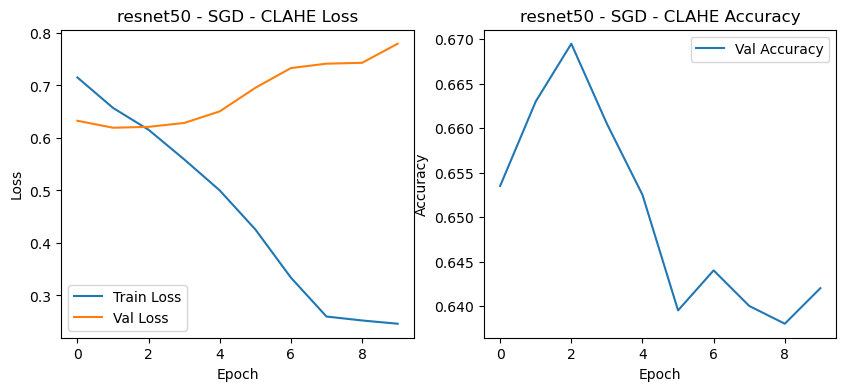

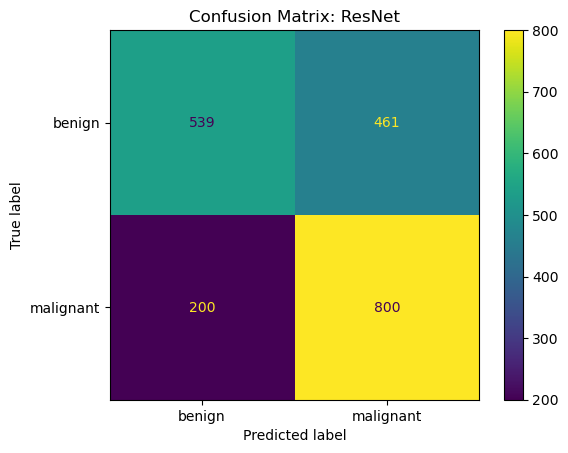

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6925 Acc: 0.5577
test Loss: 0.6491 Acc: 0.6355
Epoch 0 time: 92.38s
Epoch 1/19
----------
train Loss: 0.6350 Acc: 0.6405
test Loss: 0.6321 Acc: 0.6485
Epoch 1 time: 93.48s
Epoch 2/19
----------
train Loss: 0.5924 Acc: 0.6850
test Loss: 0.6349 Acc: 0.6515
Epoch 2 time: 94.18s
Epoch 3/19
----------
train Loss: 0.5422 Acc: 0.7234
test Loss: 0.6570 Acc: 0.6370
Epoch 3 time: 93.51s
Epoch 4/19
----------
train Loss: 0.4671 Acc: 0.7791
test Loss: 0.6912 Acc: 0.6395
Epoch 4 time: 93.22s
Epoch 5/19
----------
train Loss: 0.3836 Acc: 0.8293
test Loss: 0.7263 Acc: 0.6395
Epoch 5 time: 93.50s
Epoch 6/19
----------
train Loss: 0.2882 Acc: 0.8861
test Loss: 0.8253 Acc: 0.6140
Epoch 6 time: 93.81s
Epoch 7/19
----------
train Loss: 0.2053 Acc: 0.9301
test Loss: 0.8246 Acc: 0.6210
Epoch 7 time: 96.91s
Epoch 8/19
----------
train Loss: 0.1972 Acc: 0.9321
test Loss: 0.8356 Acc: 0.6195
Epo

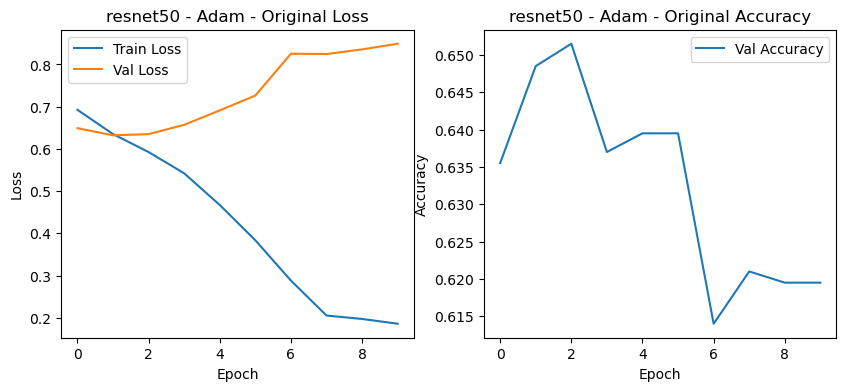

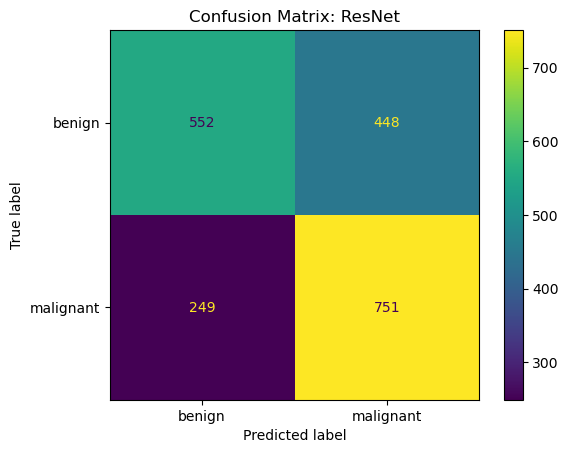

Epoch 0/19
----------
train Loss: 0.6878 Acc: 0.5596
test Loss: 0.6359 Acc: 0.6515
Epoch 0 time: 90.76s
Epoch 1/19
----------
train Loss: 0.6291 Acc: 0.6494
test Loss: 0.6238 Acc: 0.6595
Epoch 1 time: 91.34s
Epoch 2/19
----------
train Loss: 0.5808 Acc: 0.6926
test Loss: 0.6265 Acc: 0.6630
Epoch 2 time: 91.82s
Epoch 3/19
----------
train Loss: 0.5366 Acc: 0.7236
test Loss: 0.6339 Acc: 0.6750
Epoch 3 time: 91.36s
Epoch 4/19
----------
train Loss: 0.4904 Acc: 0.7529
test Loss: 0.6561 Acc: 0.6620
Epoch 4 time: 91.44s
Epoch 5/19
----------
train Loss: 0.4310 Acc: 0.7958
test Loss: 0.6731 Acc: 0.6615
Epoch 5 time: 92.98s
Epoch 6/19
----------
train Loss: 0.3627 Acc: 0.8425
test Loss: 0.7095 Acc: 0.6575
Epoch 6 time: 92.46s
Epoch 7/19
----------
train Loss: 0.2941 Acc: 0.8855
test Loss: 0.7101 Acc: 0.6495
Epoch 7 time: 92.02s
Epoch 8/19
----------
train Loss: 0.2834 Acc: 0.8939
test Loss: 0.7276 Acc: 0.6525
Epoch 8 time: 91.61s
Epoch 9/19
----------
train Loss: 0.2755 Acc: 0.8988
test Loss: 

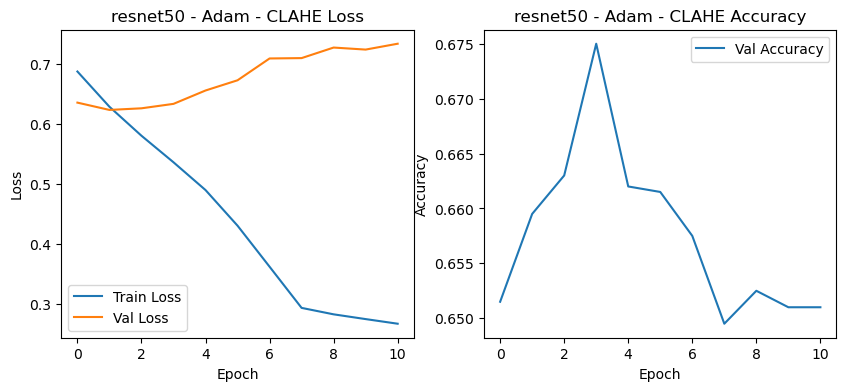

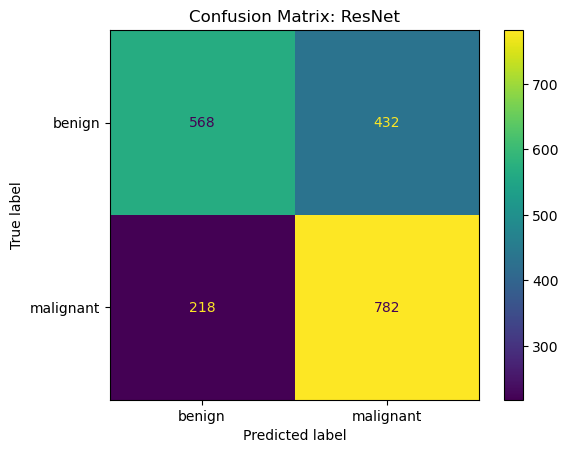

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6773 Acc: 0.5787
test Loss: 0.6361 Acc: 0.6495
Epoch 0 time: 92.11s
Epoch 1/19
----------
train Loss: 0.6335 Acc: 0.6458
test Loss: 0.6221 Acc: 0.6595
Epoch 1 time: 94.36s
Epoch 2/19
----------
train Loss: 0.5819 Acc: 0.6885
test Loss: 0.6145 Acc: 0.6590
Epoch 2 time: 94.13s
Epoch 3/19
----------
train Loss: 0.5444 Acc: 0.7177
test Loss: 0.6418 Acc: 0.6435
Epoch 3 time: 92.58s
Epoch 4/19
----------
train Loss: 0.4770 Acc: 0.7638
test Loss: 0.6422 Acc: 0.6630
Epoch 4 time: 93.05s
Epoch 5/19
----------
train Loss: 0.4097 Acc: 0.8147
test Loss: 0.6745 Acc: 0.6430
Epoch 5 time: 91.67s
Epoch 6/19
----------
train Loss: 0.3270 Acc: 0.8650
test Loss: 0.7466 Acc: 0.6315
Epoch 6 time: 91.95s
Epoch 7/19
----------
train Loss: 0.2565 Acc: 0.9073
test Loss: 0.7500 Acc: 0.6380
Epoch 7 time: 92.03s
Epoch 8/19
----------
train Loss: 0.2430 Acc: 0.9138
test Loss: 0.7607 Acc: 0.6370
Epo

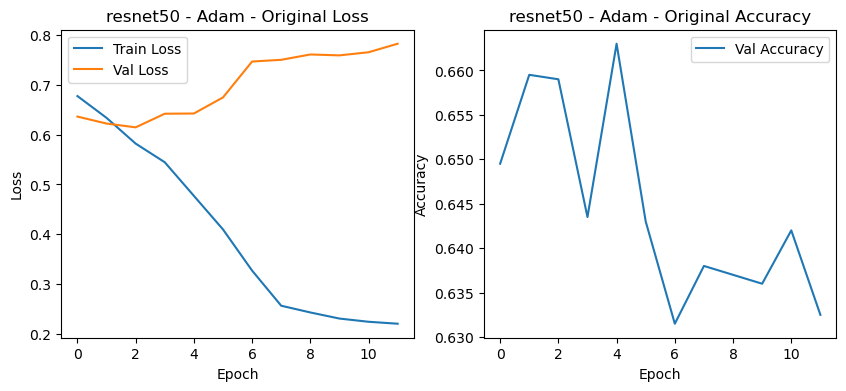

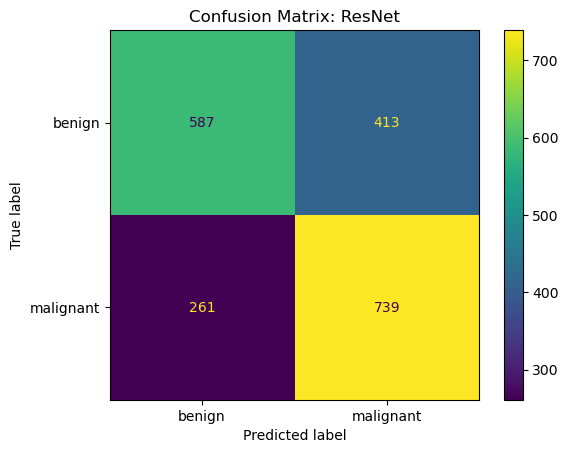

Epoch 0/19
----------
train Loss: 0.6944 Acc: 0.5514
test Loss: 0.6445 Acc: 0.6440
Epoch 0 time: 91.80s
Epoch 1/19
----------
train Loss: 0.6290 Acc: 0.6462
test Loss: 0.6294 Acc: 0.6565
Epoch 1 time: 93.02s
Epoch 2/19
----------
train Loss: 0.5824 Acc: 0.6913
test Loss: 0.6376 Acc: 0.6460
Epoch 2 time: 91.47s
Epoch 3/19
----------
train Loss: 0.5195 Acc: 0.7416
test Loss: 0.6711 Acc: 0.6390
Epoch 3 time: 92.25s
Epoch 4/19
----------
train Loss: 0.4457 Acc: 0.7911
test Loss: 0.7060 Acc: 0.6405
Epoch 4 time: 92.07s
Epoch 5/19
----------
train Loss: 0.3539 Acc: 0.8479
test Loss: 0.7782 Acc: 0.6330
Epoch 5 time: 91.61s
Epoch 6/19
----------
train Loss: 0.2463 Acc: 0.9101
test Loss: 0.8735 Acc: 0.6295
Epoch 6 time: 91.54s
Epoch 7/19
----------
train Loss: 0.1725 Acc: 0.9444
test Loss: 0.8854 Acc: 0.6235
Epoch 7 time: 92.18s
Epoch 8/19
----------
train Loss: 0.1573 Acc: 0.9513
test Loss: 0.8995 Acc: 0.6250
Early stopping triggered
Training complete in 13m 48s
Best val Acc: 0.6565


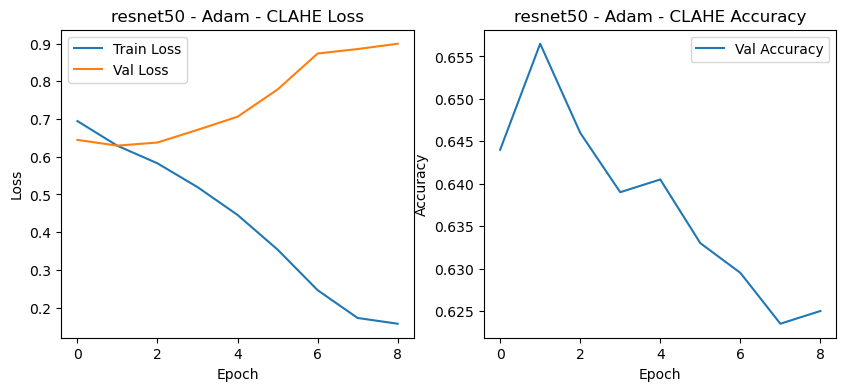

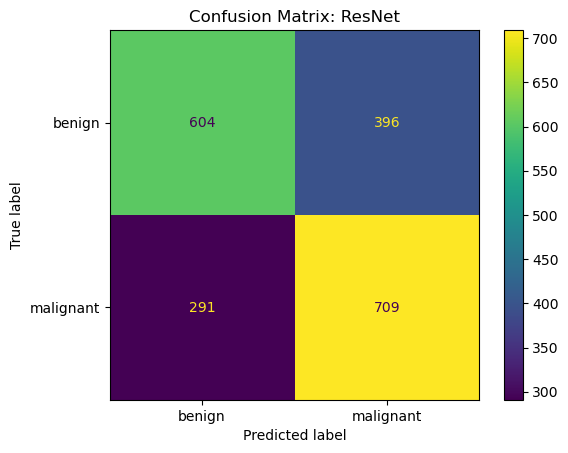

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7139 Acc: 0.5496
test Loss: 0.6446 Acc: 0.6270
Epoch 0 time: 91.00s
Epoch 1/19
----------
train Loss: 0.6523 Acc: 0.6385
test Loss: 0.6341 Acc: 0.6450
Epoch 1 time: 92.15s
Epoch 2/19
----------
train Loss: 0.6116 Acc: 0.6701
test Loss: 0.6347 Acc: 0.6495
Epoch 2 time: 91.55s
Epoch 3/19
----------
train Loss: 0.5676 Acc: 0.6985
test Loss: 0.6363 Acc: 0.6525
Epoch 3 time: 90.94s
Epoch 4/19
----------
train Loss: 0.5138 Acc: 0.7389
test Loss: 0.6523 Acc: 0.6530
Epoch 4 time: 92.68s
Epoch 5/19
----------
train Loss: 0.4470 Acc: 0.7845
test Loss: 0.6760 Acc: 0.6450
Epoch 5 time: 91.76s
Epoch 6/19
----------
train Loss: 0.3713 Acc: 0.8363
test Loss: 0.7147 Acc: 0.6470
Epoch 6 time: 95.60s
Epoch 7/19
----------
train Loss: 0.2969 Acc: 0.8821
test Loss: 0.7251 Acc: 0.6425
Epoch 7 time: 117.63s
Epoch 8/19
----------
train Loss: 0.2894 Acc: 0.8864
test Loss: 0.7213 Acc: 0.6380
Ep

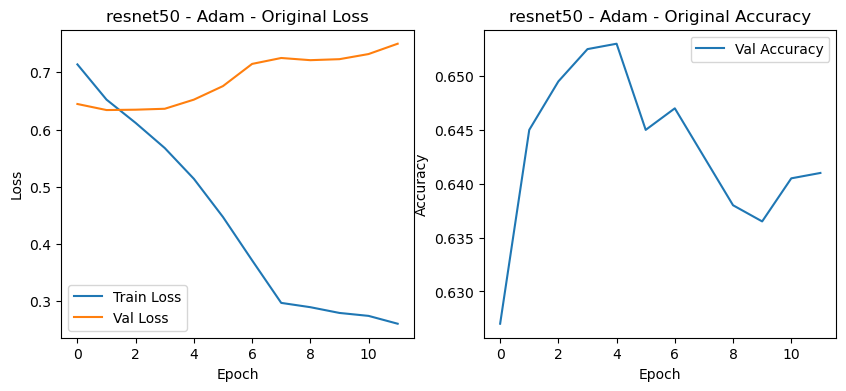

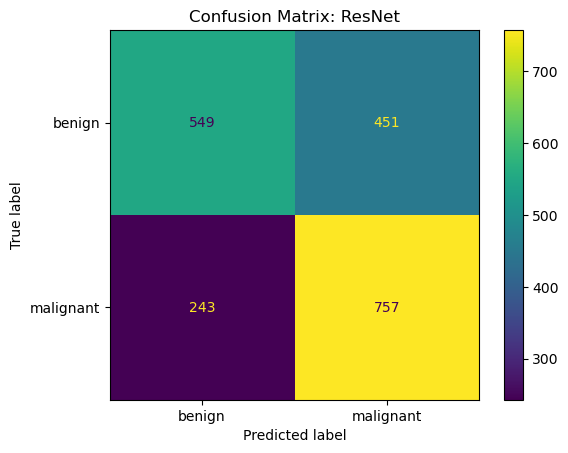

Epoch 0/19
----------
train Loss: 0.7052 Acc: 0.5619
test Loss: 0.6282 Acc: 0.6570
Epoch 0 time: 110.79s
Epoch 1/19
----------
train Loss: 0.6513 Acc: 0.6354
test Loss: 0.6135 Acc: 0.6565
Epoch 1 time: 92.13s
Epoch 2/19
----------
train Loss: 0.5927 Acc: 0.6824
test Loss: 0.6173 Acc: 0.6700
Epoch 2 time: 91.09s
Epoch 3/19
----------
train Loss: 0.5354 Acc: 0.7239
test Loss: 0.6365 Acc: 0.6725
Epoch 3 time: 91.17s
Epoch 4/19
----------
train Loss: 0.4779 Acc: 0.7622
test Loss: 0.6643 Acc: 0.6630
Epoch 4 time: 90.99s
Epoch 5/19
----------
train Loss: 0.4047 Acc: 0.8107
test Loss: 0.7069 Acc: 0.6415
Epoch 5 time: 92.05s
Epoch 6/19
----------
train Loss: 0.3164 Acc: 0.8686
test Loss: 0.7623 Acc: 0.6435
Epoch 6 time: 92.05s
Epoch 7/19
----------
train Loss: 0.2495 Acc: 0.9074
test Loss: 0.7591 Acc: 0.6410
Epoch 7 time: 92.26s
Epoch 8/19
----------
train Loss: 0.2414 Acc: 0.9078
test Loss: 0.7619 Acc: 0.6355
Epoch 8 time: 94.11s
Epoch 9/19
----------
train Loss: 0.2360 Acc: 0.9120
test Loss:

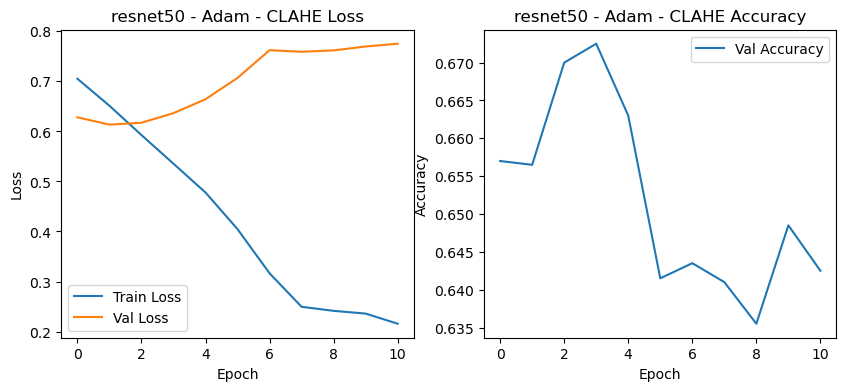

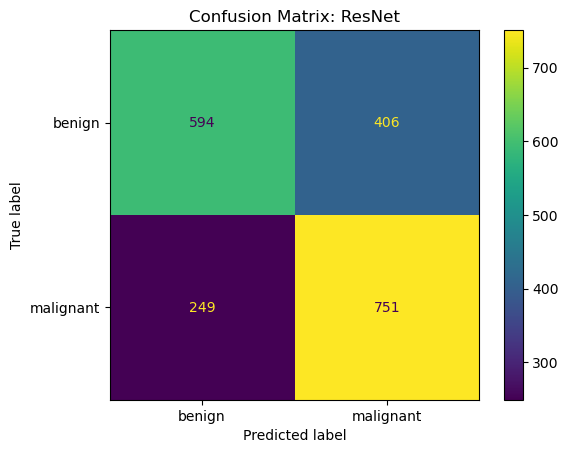

Entrenando resnet50 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7236 Acc: 0.5519
test Loss: 0.6395 Acc: 0.6365
Epoch 0 time: 90.95s
Epoch 1/19
----------
train Loss: 0.6611 Acc: 0.6156
test Loss: 0.6278 Acc: 0.6545
Epoch 1 time: 91.31s
Epoch 2/19
----------
train Loss: 0.5989 Acc: 0.6774
test Loss: 0.6515 Acc: 0.6395
Epoch 2 time: 90.97s
Epoch 3/19
----------
train Loss: 0.5266 Acc: 0.7335
test Loss: 0.6648 Acc: 0.6415
Epoch 3 time: 91.65s
Epoch 4/19
----------
train Loss: 0.4563 Acc: 0.7858
test Loss: 0.7214 Acc: 0.6330
Epoch 4 time: 92.35s
Epoch 5/19
----------
train Loss: 0.3338 Acc: 0.8571
test Loss: 0.8056 Acc: 0.6405
Epoch 5 time: 91.40s
Epoch 6/19
----------
train Loss: 0.2428 Acc: 0.9039
test Loss: 0.8656 Acc: 0.6415
Epoch 6 time: 91.70s
Epoch 7/19
----------
train Loss: 0.1667 Acc: 0.9450
test Loss: 0.8553 Acc: 0.6360
Epoch 7 time: 92.99s
Epoch 8/19
----------
train Loss: 0.1513 Acc: 0.9491
test Loss: 0.8953 Acc: 0.6290
Ear

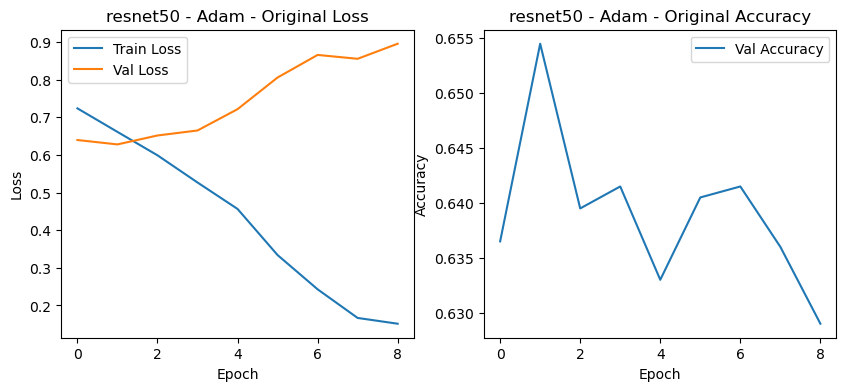

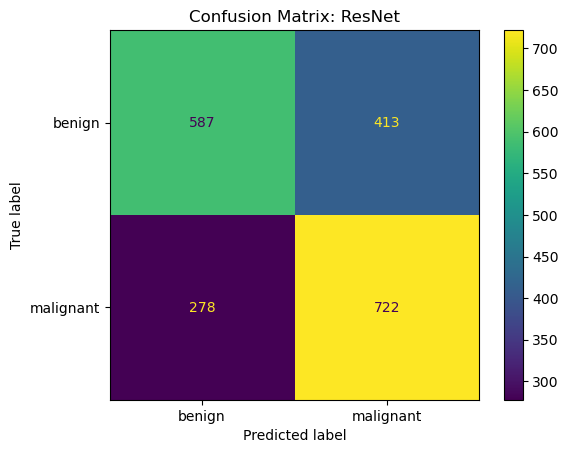

Epoch 0/19
----------
train Loss: 0.7124 Acc: 0.5504
test Loss: 0.6245 Acc: 0.6580
Epoch 0 time: 90.52s
Epoch 1/19
----------
train Loss: 0.6448 Acc: 0.6344
test Loss: 0.6172 Acc: 0.6715
Epoch 1 time: 91.75s
Epoch 2/19
----------
train Loss: 0.5973 Acc: 0.6767
test Loss: 0.6333 Acc: 0.6695
Epoch 2 time: 91.97s
Epoch 3/19
----------
train Loss: 0.5314 Acc: 0.7348
test Loss: 0.6416 Acc: 0.6645
Epoch 3 time: 91.86s
Epoch 4/19
----------
train Loss: 0.4509 Acc: 0.7885
test Loss: 0.6956 Acc: 0.6515
Epoch 4 time: 91.93s
Epoch 5/19
----------
train Loss: 0.3533 Acc: 0.8430
test Loss: 0.7688 Acc: 0.6370
Epoch 5 time: 91.53s
Epoch 6/19
----------
train Loss: 0.2482 Acc: 0.9012
test Loss: 0.8628 Acc: 0.6410
Epoch 6 time: 91.56s
Epoch 7/19
----------
train Loss: 0.1801 Acc: 0.9354
test Loss: 0.8842 Acc: 0.6355
Epoch 7 time: 92.76s
Epoch 8/19
----------
train Loss: 0.1618 Acc: 0.9450
test Loss: 0.8598 Acc: 0.6365
Early stopping triggered
Training complete in 13m 46s
Best val Acc: 0.6715


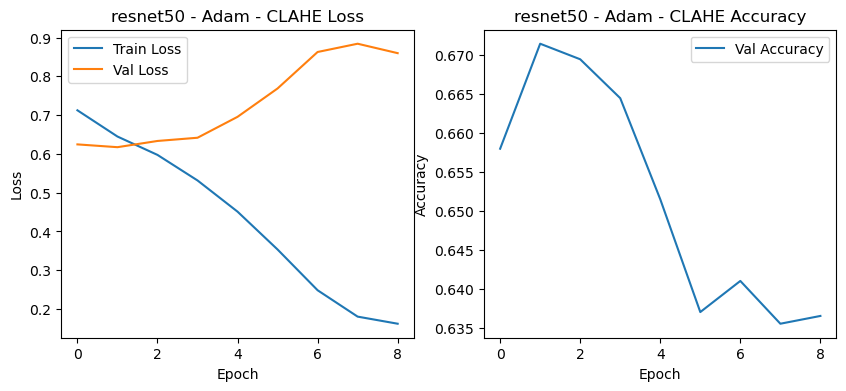

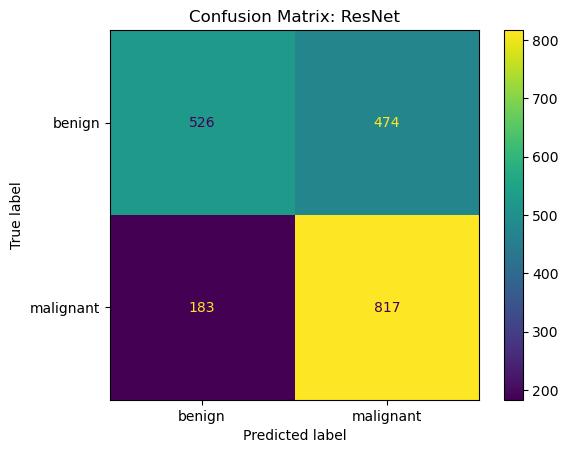

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6919 Acc: 0.5575
test Loss: 0.6516 Acc: 0.6345
Epoch 0 time: 91.11s
Epoch 1/19
----------
train Loss: 0.6398 Acc: 0.6392
test Loss: 0.6283 Acc: 0.6500
Epoch 1 time: 91.96s
Epoch 2/19
----------
train Loss: 0.6044 Acc: 0.6733
test Loss: 0.6281 Acc: 0.6475
Epoch 2 time: 92.10s
Epoch 3/19
----------
train Loss: 0.5541 Acc: 0.7120
test Loss: 0.6332 Acc: 0.6430
Epoch 3 time: 92.01s
Epoch 4/19
----------
train Loss: 0.5118 Acc: 0.7459
test Loss: 0.6464 Acc: 0.6420
Epoch 4 time: 91.73s
Epoch 5/19
----------
train Loss: 0.4417 Acc: 0.7954
test Loss: 0.6676 Acc: 0.6460
Epoch 5 time: 93.52s
Epoch 6/19
----------
train Loss: 0.3692 Acc: 0.8336
test Loss: 0.7150 Acc: 0.6370
Epoch 6 time: 92.00s
Epoch 7/19
----------
train Loss: 0.2973 Acc: 0.8902
test Loss: 0.7112 Acc: 0.6270
Epoch 7 time: 92.31s
Epoch 8/19
----------
train Loss: 0.2878 Acc: 0.8924
test Loss: 0.7106 Acc: 0.6320
Ea

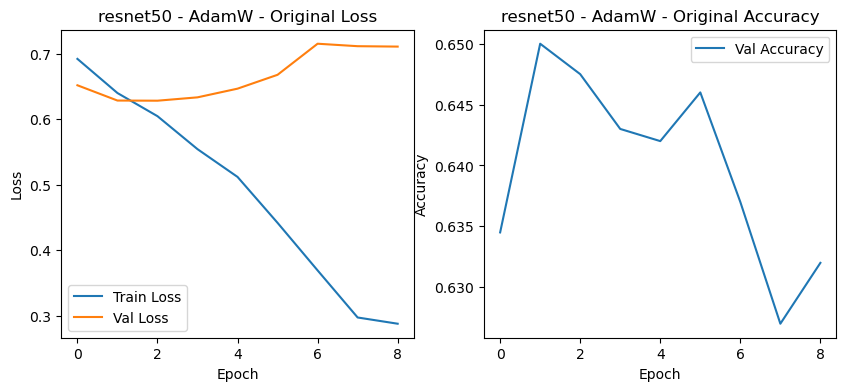

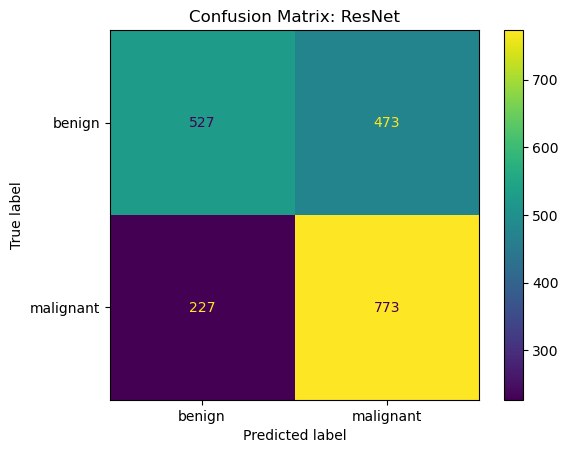

Epoch 0/19
----------
train Loss: 0.6753 Acc: 0.5830
test Loss: 0.6307 Acc: 0.6625
Epoch 0 time: 91.15s
Epoch 1/19
----------
train Loss: 0.6217 Acc: 0.6605
test Loss: 0.6115 Acc: 0.6725
Epoch 1 time: 91.36s
Epoch 2/19
----------
train Loss: 0.5729 Acc: 0.6993
test Loss: 0.6137 Acc: 0.6790
Epoch 2 time: 91.90s
Epoch 3/19
----------
train Loss: 0.5307 Acc: 0.7301
test Loss: 0.6355 Acc: 0.6685
Epoch 3 time: 91.80s
Epoch 4/19
----------
train Loss: 0.4786 Acc: 0.7665
test Loss: 0.6416 Acc: 0.6715
Epoch 4 time: 92.70s
Epoch 5/19
----------
train Loss: 0.4091 Acc: 0.8126
test Loss: 0.6737 Acc: 0.6630
Epoch 5 time: 92.16s
Epoch 6/19
----------
train Loss: 0.3316 Acc: 0.8591
test Loss: 0.7086 Acc: 0.6590
Epoch 6 time: 92.57s
Epoch 7/19
----------
train Loss: 0.2581 Acc: 0.9064
test Loss: 0.7213 Acc: 0.6620
Epoch 7 time: 92.31s
Epoch 8/19
----------
train Loss: 0.2530 Acc: 0.9089
test Loss: 0.7262 Acc: 0.6590
Epoch 8 time: 93.58s
Epoch 9/19
----------
train Loss: 0.2442 Acc: 0.9173
test Loss: 

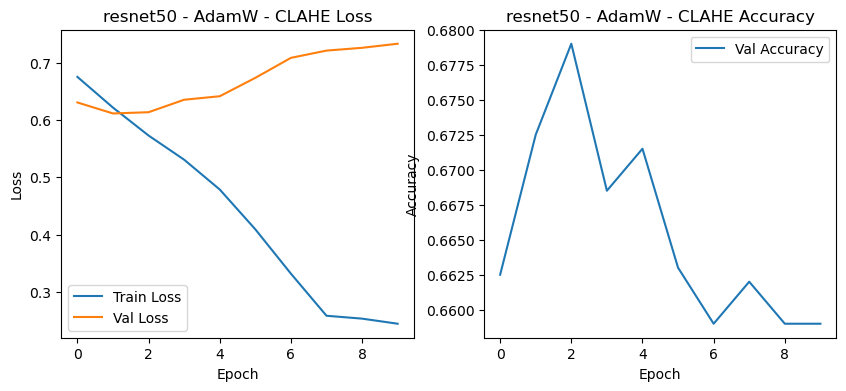

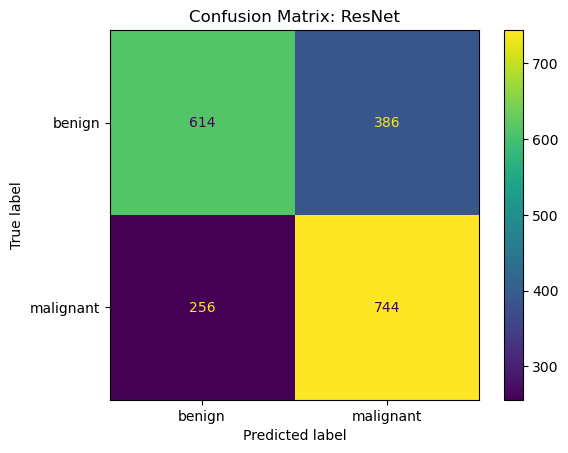

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6799 Acc: 0.5680
test Loss: 0.6365 Acc: 0.6495
Epoch 0 time: 90.79s
Epoch 1/19
----------
train Loss: 0.6257 Acc: 0.6519
test Loss: 0.6243 Acc: 0.6480
Epoch 1 time: 91.72s
Epoch 2/19
----------
train Loss: 0.5816 Acc: 0.6933
test Loss: 0.6279 Acc: 0.6585
Epoch 2 time: 92.59s
Epoch 3/19
----------
train Loss: 0.5403 Acc: 0.7225
test Loss: 0.6448 Acc: 0.6410
Epoch 3 time: 92.29s
Epoch 4/19
----------
train Loss: 0.4879 Acc: 0.7641
test Loss: 0.6649 Acc: 0.6395
Epoch 4 time: 93.71s
Epoch 5/19
----------
train Loss: 0.4243 Acc: 0.8049
test Loss: 0.6850 Acc: 0.6395
Epoch 5 time: 91.23s
Epoch 6/19
----------
train Loss: 0.3449 Acc: 0.8513
test Loss: 0.7303 Acc: 0.6290
Epoch 6 time: 91.66s
Epoch 7/19
----------
train Loss: 0.2680 Acc: 0.9028
test Loss: 0.7297 Acc: 0.6360
Epoch 7 time: 92.13s
Epoch 8/19
----------
train Loss: 0.2588 Acc: 0.9098
test Loss: 0.7379 Acc: 0.6390
Ep

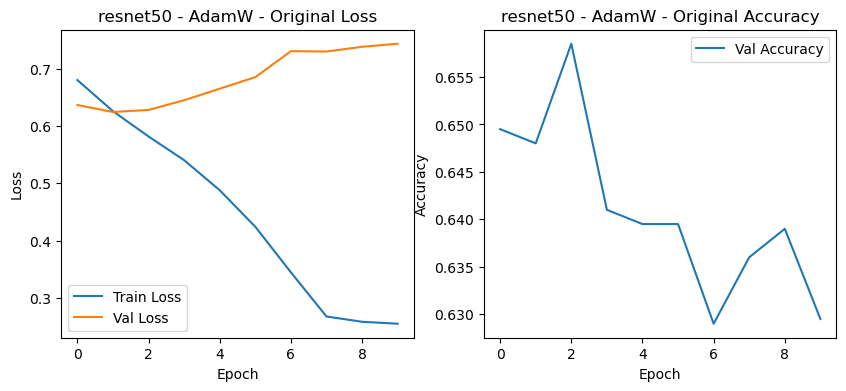

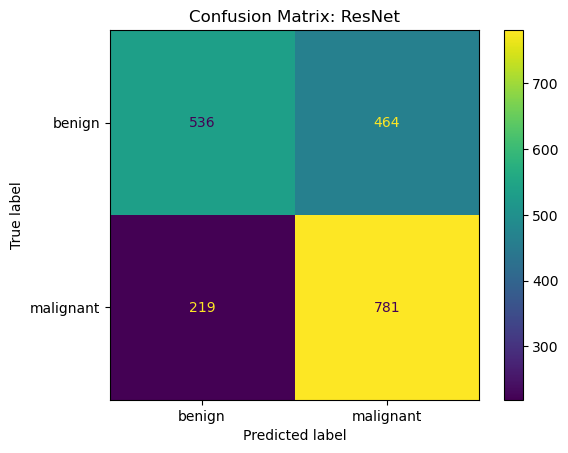

Epoch 0/19
----------
train Loss: 0.6852 Acc: 0.5686
test Loss: 0.6338 Acc: 0.6560
Epoch 0 time: 90.29s
Epoch 1/19
----------
train Loss: 0.6286 Acc: 0.6474
test Loss: 0.6165 Acc: 0.6705
Epoch 1 time: 92.24s
Epoch 2/19
----------
train Loss: 0.5869 Acc: 0.6860
test Loss: 0.6122 Acc: 0.6735
Epoch 2 time: 92.00s
Epoch 3/19
----------
train Loss: 0.5418 Acc: 0.7216
test Loss: 0.6290 Acc: 0.6760
Epoch 3 time: 92.20s
Epoch 4/19
----------
train Loss: 0.4965 Acc: 0.7518
test Loss: 0.6432 Acc: 0.6760
Epoch 4 time: 92.74s
Epoch 5/19
----------
train Loss: 0.4265 Acc: 0.8039
test Loss: 0.6650 Acc: 0.6630
Epoch 5 time: 93.80s
Epoch 6/19
----------
train Loss: 0.3593 Acc: 0.8479
test Loss: 0.6946 Acc: 0.6530
Epoch 6 time: 91.37s
Epoch 7/19
----------
train Loss: 0.2810 Acc: 0.8939
test Loss: 0.6944 Acc: 0.6595
Epoch 7 time: 93.32s
Epoch 8/19
----------
train Loss: 0.2697 Acc: 0.9039
test Loss: 0.6990 Acc: 0.6635
Epoch 8 time: 91.97s
Epoch 9/19
----------
train Loss: 0.2627 Acc: 0.9050
test Loss: 

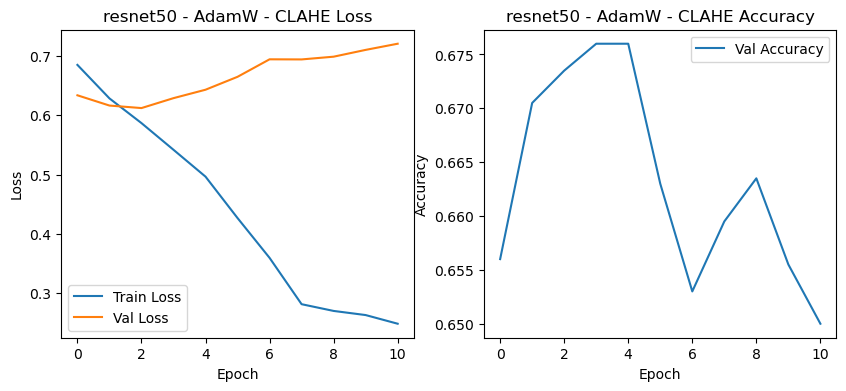

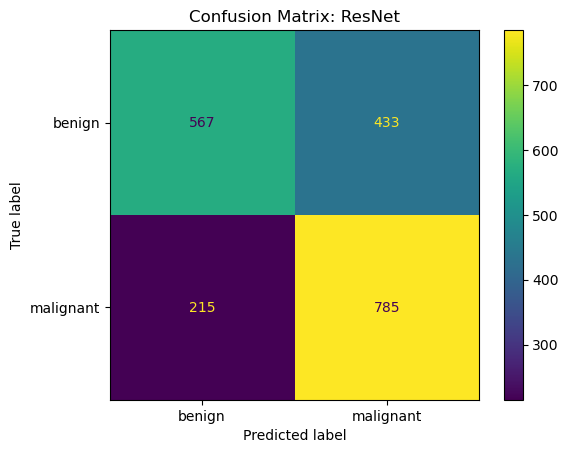

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7208 Acc: 0.5356
test Loss: 0.6406 Acc: 0.6430
Epoch 0 time: 92.09s
Epoch 1/19
----------
train Loss: 0.6547 Acc: 0.6295
test Loss: 0.6230 Acc: 0.6500
Epoch 1 time: 94.29s
Epoch 2/19
----------
train Loss: 0.6283 Acc: 0.6521
test Loss: 0.6276 Acc: 0.6425
Epoch 2 time: 94.67s
Epoch 3/19
----------
train Loss: 0.5871 Acc: 0.6896
test Loss: 0.6516 Acc: 0.6425
Epoch 3 time: 99.35s
Epoch 4/19
----------
train Loss: 0.5277 Acc: 0.7323
test Loss: 0.6670 Acc: 0.6495
Epoch 4 time: 97.31s
Epoch 5/19
----------
train Loss: 0.4693 Acc: 0.7744
test Loss: 0.6691 Acc: 0.6460
Epoch 5 time: 97.48s
Epoch 6/19
----------
train Loss: 0.3888 Acc: 0.8265
test Loss: 0.7130 Acc: 0.6380
Epoch 6 time: 99.17s
Epoch 7/19
----------
train Loss: 0.3109 Acc: 0.8755
test Loss: 0.7211 Acc: 0.6435
Epoch 7 time: 99.73s
Epoch 8/19
----------
train Loss: 0.3031 Acc: 0.8818
test Loss: 0.7240 Acc: 0.6380
Ea

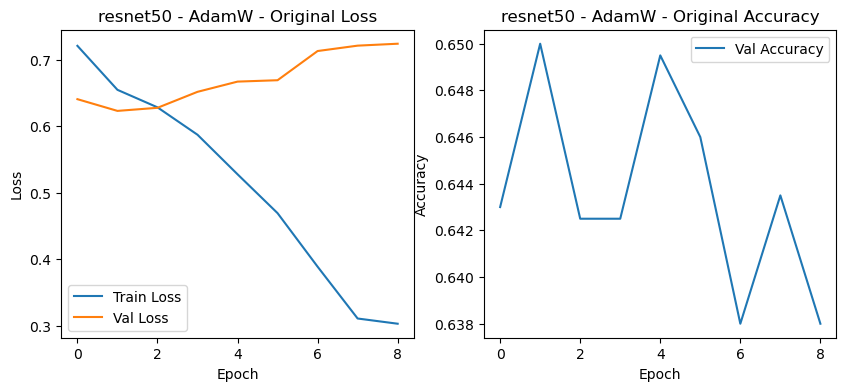

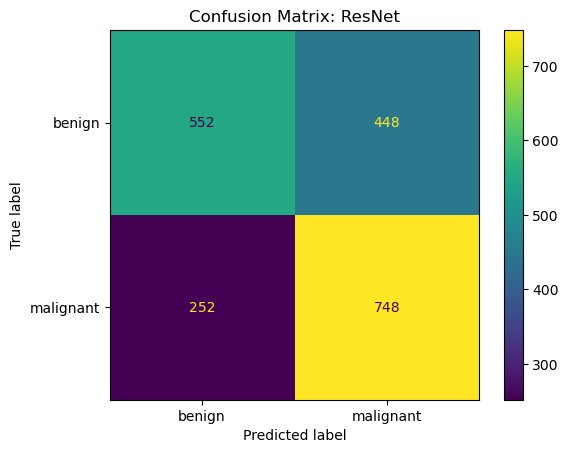

Epoch 0/19
----------
train Loss: 0.7248 Acc: 0.5456
test Loss: 0.6521 Acc: 0.6130
Epoch 0 time: 97.29s
Epoch 1/19
----------
train Loss: 0.6653 Acc: 0.6189
test Loss: 0.6360 Acc: 0.6500
Epoch 1 time: 98.30s
Epoch 2/19
----------
train Loss: 0.6024 Acc: 0.6775
test Loss: 0.6403 Acc: 0.6535
Epoch 2 time: 98.19s
Epoch 3/19
----------
train Loss: 0.5372 Acc: 0.7289
test Loss: 0.6704 Acc: 0.6475
Epoch 3 time: 101.31s
Epoch 4/19
----------
train Loss: 0.4354 Acc: 0.7964
test Loss: 0.7321 Acc: 0.6360
Epoch 4 time: 98.59s
Epoch 5/19
----------
train Loss: 0.3314 Acc: 0.8533
test Loss: 0.8188 Acc: 0.6325
Epoch 5 time: 100.58s
Epoch 6/19
----------
train Loss: 0.2147 Acc: 0.9180
test Loss: 0.9300 Acc: 0.6365
Epoch 6 time: 99.20s
Epoch 7/19
----------
train Loss: 0.1439 Acc: 0.9550
test Loss: 0.9259 Acc: 0.6375
Epoch 7 time: 98.94s
Epoch 8/19
----------
train Loss: 0.1391 Acc: 0.9544
test Loss: 0.9529 Acc: 0.6375
Epoch 8 time: 98.22s
Epoch 9/19
----------
train Loss: 0.1340 Acc: 0.9575
test Loss

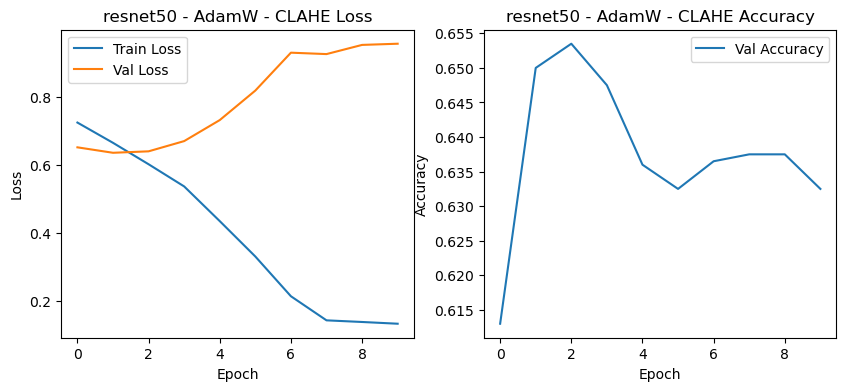

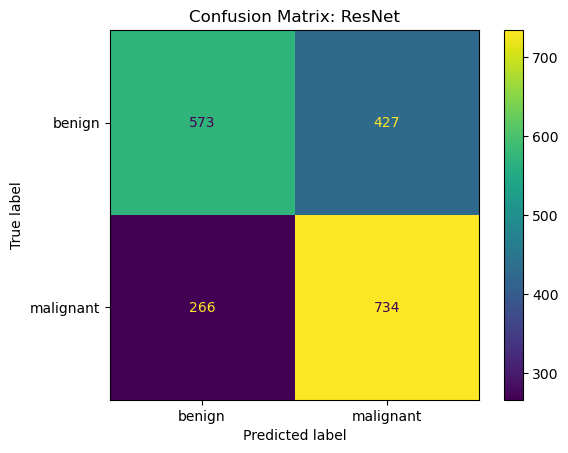

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7355 Acc: 0.5336
test Loss: 0.6601 Acc: 0.6025
Epoch 0 time: 96.89s
Epoch 1/19
----------
train Loss: 0.6625 Acc: 0.6126
test Loss: 0.6364 Acc: 0.6410
Epoch 1 time: 98.87s
Epoch 2/19
----------
train Loss: 0.6048 Acc: 0.6750
test Loss: 0.6459 Acc: 0.6395
Epoch 2 time: 98.53s
Epoch 3/19
----------
train Loss: 0.5378 Acc: 0.7230
test Loss: 0.6819 Acc: 0.6290
Epoch 3 time: 98.25s
Epoch 4/19
----------
train Loss: 0.4603 Acc: 0.7796
test Loss: 0.7120 Acc: 0.6255
Epoch 4 time: 93.82s
Epoch 5/19
----------
train Loss: 0.3584 Acc: 0.8431
test Loss: 0.7805 Acc: 0.6275
Epoch 5 time: 91.56s
Epoch 6/19
----------
train Loss: 0.2596 Acc: 0.8932
test Loss: 0.8706 Acc: 0.6115
Epoch 6 time: 91.55s
Epoch 7/19
----------
train Loss: 0.1856 Acc: 0.9357
test Loss: 0.8659 Acc: 0.6165
Epoch 7 time: 91.73s
Epoch 8/19
----------
train Loss: 0.1695 Acc: 0.9419
test Loss: 0.9128 Acc: 0.6200
Ea

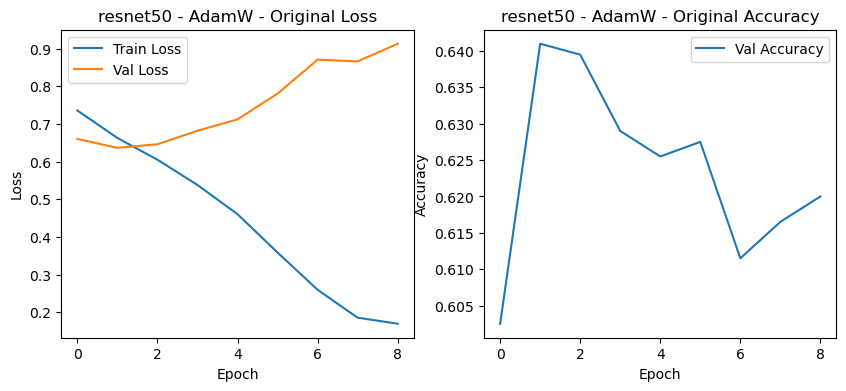

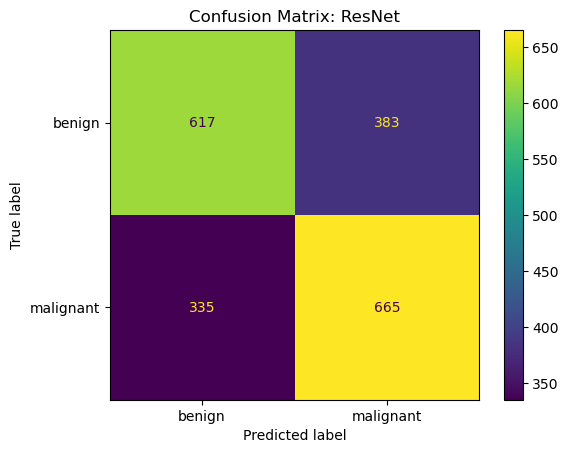

Epoch 0/19
----------
train Loss: 0.7067 Acc: 0.5504
test Loss: 0.6359 Acc: 0.6565
Epoch 0 time: 90.52s
Epoch 1/19
----------
train Loss: 0.6476 Acc: 0.6350
test Loss: 0.6259 Acc: 0.6620
Epoch 1 time: 92.15s
Epoch 2/19
----------
train Loss: 0.6025 Acc: 0.6710
test Loss: 0.6315 Acc: 0.6610
Epoch 2 time: 91.15s
Epoch 3/19
----------
train Loss: 0.5553 Acc: 0.7121
test Loss: 0.6450 Acc: 0.6520
Epoch 3 time: 91.37s
Epoch 4/19
----------
train Loss: 0.4975 Acc: 0.7506
test Loss: 0.6673 Acc: 0.6520
Epoch 4 time: 92.21s
Epoch 5/19
----------
train Loss: 0.4252 Acc: 0.7989
test Loss: 0.7120 Acc: 0.6290
Epoch 5 time: 92.77s
Epoch 6/19
----------
train Loss: 0.3537 Acc: 0.8434
test Loss: 0.7619 Acc: 0.6365
Epoch 6 time: 92.75s
Epoch 7/19
----------
train Loss: 0.2772 Acc: 0.8892
test Loss: 0.7688 Acc: 0.6315
Epoch 7 time: 91.97s
Epoch 8/19
----------
train Loss: 0.2591 Acc: 0.9005
test Loss: 0.7722 Acc: 0.6285
Early stopping triggered
Training complete in 13m 47s
Best val Acc: 0.6620


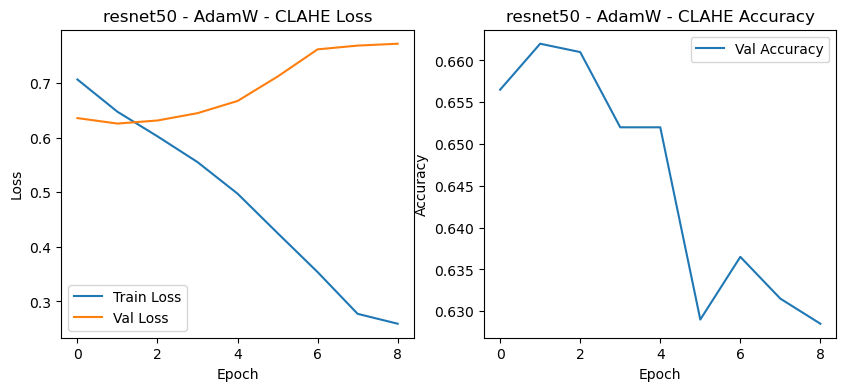

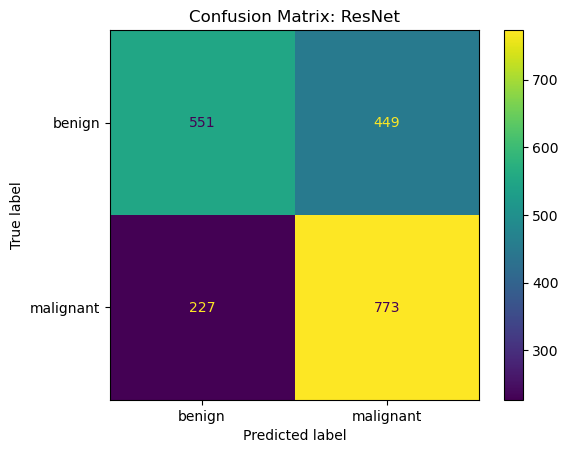

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7040 Acc: 0.5356
test Loss: 0.6708 Acc: 0.6075
Epoch 0 time: 90.13s
Epoch 1/19
----------
train Loss: 0.6649 Acc: 0.5988
test Loss: 0.6495 Acc: 0.6425
Epoch 1 time: 92.00s
Epoch 2/19
----------
train Loss: 0.6436 Acc: 0.6294
test Loss: 0.6350 Acc: 0.6465
Epoch 2 time: 93.80s
Epoch 3/19
----------
train Loss: 0.6154 Acc: 0.6591
test Loss: 0.6329 Acc: 0.6450
Epoch 3 time: 92.64s
Epoch 4/19
----------
train Loss: 0.5921 Acc: 0.6826
test Loss: 0.6371 Acc: 0.6410
Epoch 4 time: 91.78s
Epoch 5/19
----------
train Loss: 0.5669 Acc: 0.7030
test Loss: 0.6395 Acc: 0.6405
Epoch 5 time: 93.32s
Epoch 6/19
----------
train Loss: 0.5416 Acc: 0.7219
test Loss: 0.6467 Acc: 0.6410
Epoch 6 time: 92.18s
Epoch 7/19
----------
train Loss: 0.5154 Acc: 0.7475
test Loss: 0.6533 Acc: 0.6420
Epoch 7 time: 92.51s
Epoch 8/19
----------
train Loss: 0.5085 Acc: 0.7531
test Loss: 0.6516 Acc: 0.6400
Epoch

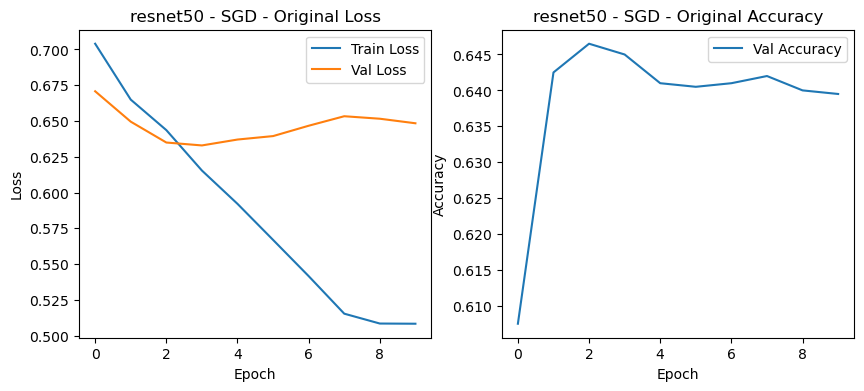

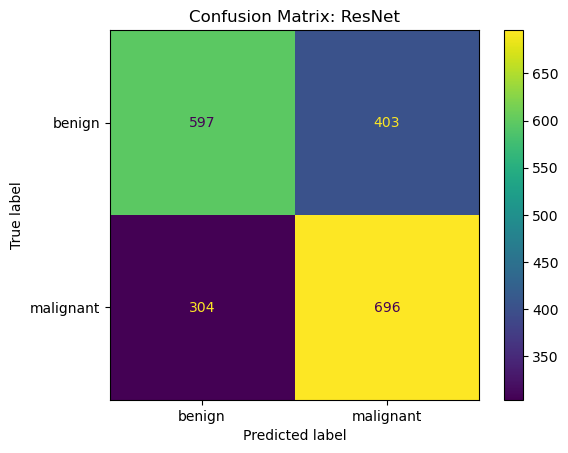

Epoch 0/19
----------
train Loss: 0.7235 Acc: 0.5270
test Loss: 0.6739 Acc: 0.5605
Epoch 0 time: 92.13s
Epoch 1/19
----------
train Loss: 0.6701 Acc: 0.5919
test Loss: 0.6383 Acc: 0.6310
Epoch 1 time: 91.64s
Epoch 2/19
----------
train Loss: 0.6301 Acc: 0.6469
test Loss: 0.6260 Acc: 0.6475
Epoch 2 time: 92.26s
Epoch 3/19
----------
train Loss: 0.6006 Acc: 0.6715
test Loss: 0.6210 Acc: 0.6550
Epoch 3 time: 91.86s
Epoch 4/19
----------
train Loss: 0.5665 Acc: 0.7005
test Loss: 0.6265 Acc: 0.6610
Epoch 4 time: 92.61s
Epoch 5/19
----------
train Loss: 0.5337 Acc: 0.7281
test Loss: 0.6374 Acc: 0.6670
Epoch 5 time: 93.02s
Epoch 6/19
----------
train Loss: 0.4946 Acc: 0.7532
test Loss: 0.6521 Acc: 0.6590
Epoch 6 time: 92.00s
Epoch 7/19
----------
train Loss: 0.4493 Acc: 0.7878
test Loss: 0.6561 Acc: 0.6570
Epoch 7 time: 91.56s
Epoch 8/19
----------
train Loss: 0.4490 Acc: 0.7866
test Loss: 0.6647 Acc: 0.6520
Epoch 8 time: 91.95s
Epoch 9/19
----------
train Loss: 0.4419 Acc: 0.7949
test Loss: 

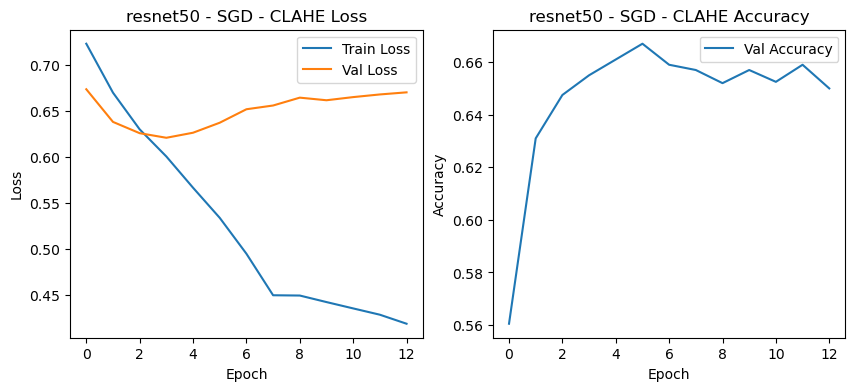

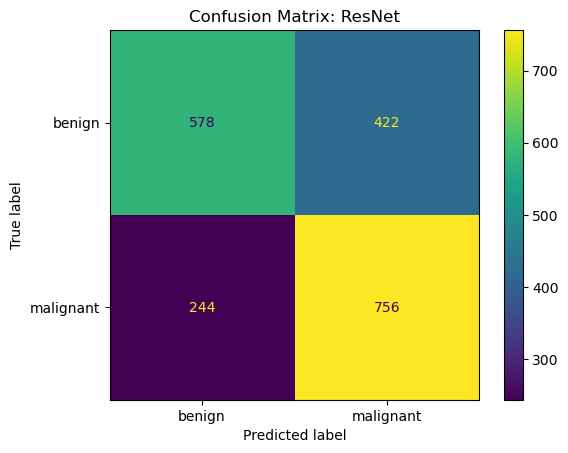

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7068 Acc: 0.5399
test Loss: 0.6650 Acc: 0.5970
Epoch 0 time: 91.44s
Epoch 1/19
----------
train Loss: 0.6684 Acc: 0.5955
test Loss: 0.6505 Acc: 0.6255
Epoch 1 time: 92.95s
Epoch 2/19
----------
train Loss: 0.6429 Acc: 0.6376
test Loss: 0.6362 Acc: 0.6370
Epoch 2 time: 92.76s
Epoch 3/19
----------
train Loss: 0.6155 Acc: 0.6674
test Loss: 0.6443 Acc: 0.6400
Epoch 3 time: 91.38s
Epoch 4/19
----------
train Loss: 0.5940 Acc: 0.6781
test Loss: 0.6311 Acc: 0.6480
Epoch 4 time: 91.54s
Epoch 5/19
----------
train Loss: 0.5738 Acc: 0.6984
test Loss: 0.6356 Acc: 0.6390
Epoch 5 time: 91.64s
Epoch 6/19
----------
train Loss: 0.5464 Acc: 0.7190
test Loss: 0.6397 Acc: 0.6470
Epoch 6 time: 91.24s
Epoch 7/19
----------
train Loss: 0.5244 Acc: 0.7386
test Loss: 0.6415 Acc: 0.6455
Epoch 7 time: 91.80s
Epoch 8/19
----------
train Loss: 0.5184 Acc: 0.7429
test Loss: 0.6349 Acc: 0.6445
Epoch

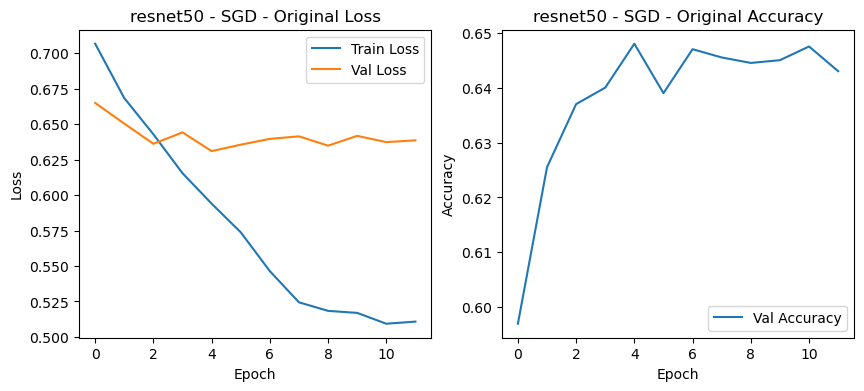

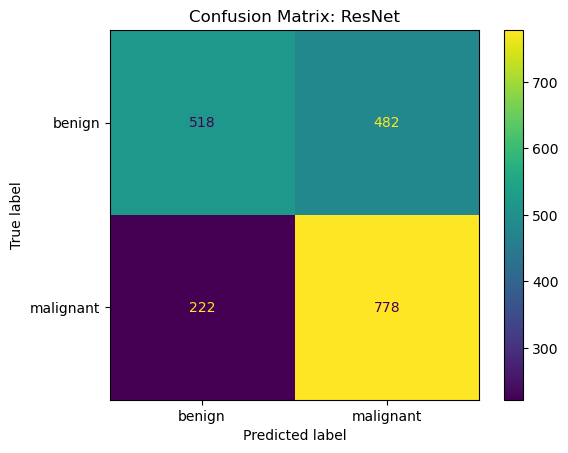

Epoch 0/19
----------
train Loss: 0.7256 Acc: 0.5206
test Loss: 0.6722 Acc: 0.5700
Epoch 0 time: 92.99s
Epoch 1/19
----------
train Loss: 0.6792 Acc: 0.5883
test Loss: 0.6578 Acc: 0.6065
Epoch 1 time: 92.08s
Epoch 2/19
----------
train Loss: 0.6479 Acc: 0.6294
test Loss: 0.6347 Acc: 0.6560
Epoch 2 time: 91.75s
Epoch 3/19
----------
train Loss: 0.6144 Acc: 0.6685
test Loss: 0.6248 Acc: 0.6670
Epoch 3 time: 92.55s
Epoch 4/19
----------
train Loss: 0.5828 Acc: 0.6909
test Loss: 0.6394 Acc: 0.6575
Epoch 4 time: 92.30s
Epoch 5/19
----------
train Loss: 0.5443 Acc: 0.7220
test Loss: 0.6319 Acc: 0.6705
Epoch 5 time: 92.28s
Epoch 6/19
----------
train Loss: 0.5076 Acc: 0.7516
test Loss: 0.6497 Acc: 0.6665
Epoch 6 time: 94.37s
Epoch 7/19
----------
train Loss: 0.4624 Acc: 0.7804
test Loss: 0.6518 Acc: 0.6600
Epoch 7 time: 93.93s
Epoch 8/19
----------
train Loss: 0.4588 Acc: 0.7875
test Loss: 0.6590 Acc: 0.6610
Epoch 8 time: 92.82s
Epoch 9/19
----------
train Loss: 0.4522 Acc: 0.7859
test Loss: 

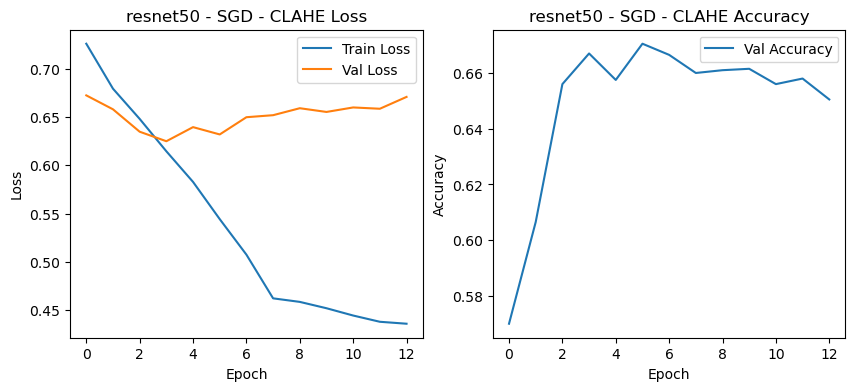

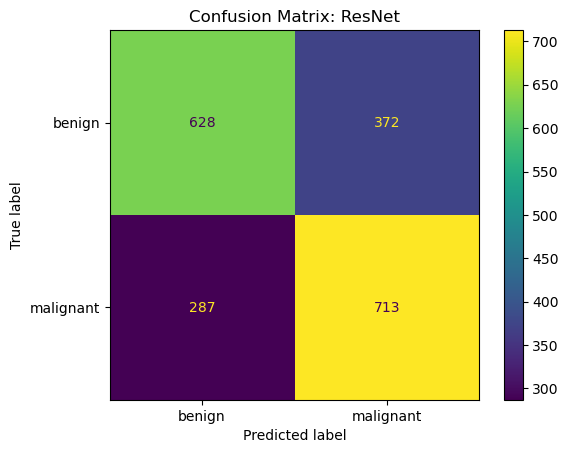

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7542 Acc: 0.5231
test Loss: 0.6891 Acc: 0.5425
Epoch 0 time: 90.68s
Epoch 1/19
----------
train Loss: 0.6993 Acc: 0.5743
test Loss: 0.6644 Acc: 0.6070
Epoch 1 time: 92.26s
Epoch 2/19
----------
train Loss: 0.6674 Acc: 0.6214
test Loss: 0.6458 Acc: 0.6415
Epoch 2 time: 93.81s
Epoch 3/19
----------
train Loss: 0.6319 Acc: 0.6544
test Loss: 0.6528 Acc: 0.6405
Epoch 3 time: 91.72s
Epoch 4/19
----------
train Loss: 0.5940 Acc: 0.6936
test Loss: 0.6537 Acc: 0.6480
Epoch 4 time: 93.04s
Epoch 5/19
----------
train Loss: 0.5551 Acc: 0.7145
test Loss: 0.6483 Acc: 0.6625
Epoch 5 time: 92.16s
Epoch 6/19
----------
train Loss: 0.4946 Acc: 0.7578
test Loss: 0.6762 Acc: 0.6455
Epoch 6 time: 91.52s
Epoch 7/19
----------
train Loss: 0.4438 Acc: 0.7891
test Loss: 0.6837 Acc: 0.6435
Epoch 7 time: 91.68s
Epoch 8/19
----------
train Loss: 0.4389 Acc: 0.7943
test Loss: 0.7012 Acc: 0.6430
Epoch

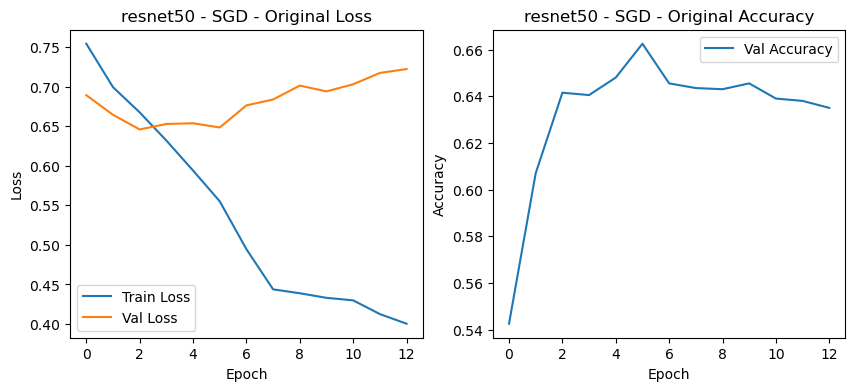

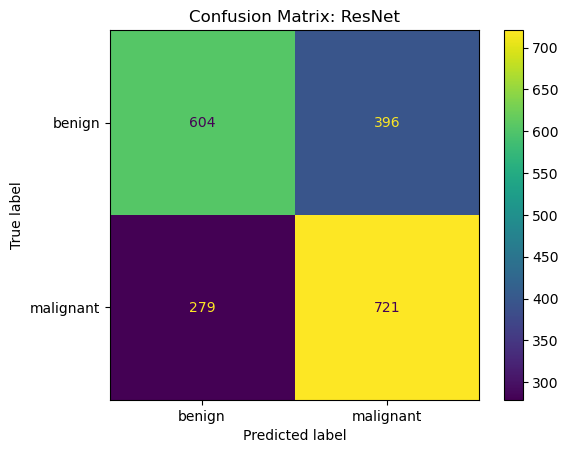

Epoch 0/19
----------
train Loss: 0.7242 Acc: 0.5308
test Loss: 0.6563 Acc: 0.6245
Epoch 0 time: 90.49s
Epoch 1/19
----------
train Loss: 0.6889 Acc: 0.5843
test Loss: 0.6354 Acc: 0.6600
Epoch 1 time: 93.17s
Epoch 2/19
----------
train Loss: 0.6585 Acc: 0.6194
test Loss: 0.6274 Acc: 0.6625
Epoch 2 time: 93.16s
Epoch 3/19
----------
train Loss: 0.6317 Acc: 0.6519
test Loss: 0.6269 Acc: 0.6600
Epoch 3 time: 91.75s
Epoch 4/19
----------
train Loss: 0.6058 Acc: 0.6767
test Loss: 0.6306 Acc: 0.6610
Epoch 4 time: 91.75s
Epoch 5/19
----------
train Loss: 0.5776 Acc: 0.7000
test Loss: 0.6386 Acc: 0.6585
Epoch 5 time: 91.39s
Epoch 6/19
----------
train Loss: 0.5341 Acc: 0.7288
test Loss: 0.6622 Acc: 0.6405
Epoch 6 time: 92.65s
Epoch 7/19
----------
train Loss: 0.5136 Acc: 0.7454
test Loss: 0.6465 Acc: 0.6600
Epoch 7 time: 95.89s
Epoch 8/19
----------
train Loss: 0.5083 Acc: 0.7441
test Loss: 0.6511 Acc: 0.6575
Epoch 8 time: 93.36s
Epoch 9/19
----------
train Loss: 0.4985 Acc: 0.7566
test Loss: 

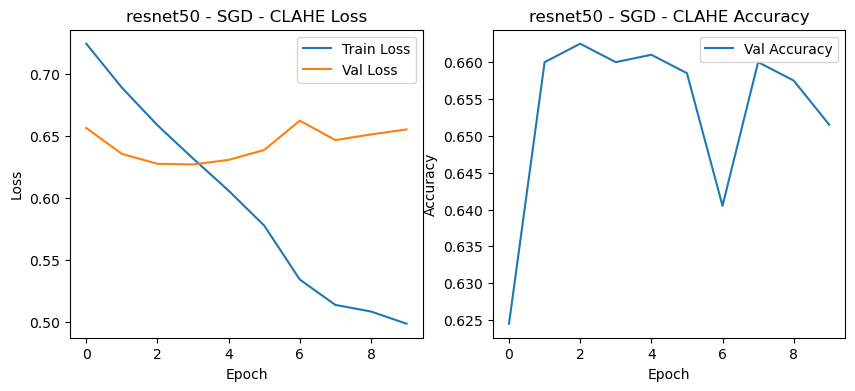

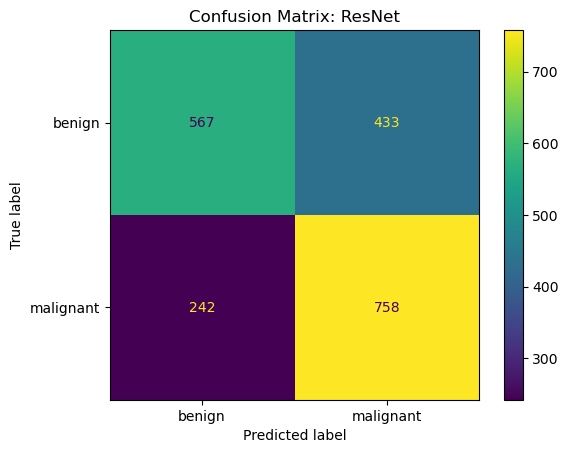

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7734 Acc: 0.5148
test Loss: 0.6915 Acc: 0.5355
Epoch 0 time: 90.80s
Epoch 1/19
----------
train Loss: 0.7215 Acc: 0.5603
test Loss: 0.6484 Acc: 0.6295
Epoch 1 time: 92.15s
Epoch 2/19
----------
train Loss: 0.6803 Acc: 0.6105
test Loss: 0.6429 Acc: 0.6410
Epoch 2 time: 94.93s
Epoch 3/19
----------
train Loss: 0.6282 Acc: 0.6525
test Loss: 0.6361 Acc: 0.6520
Epoch 3 time: 91.56s
Epoch 4/19
----------
train Loss: 0.5994 Acc: 0.6793
test Loss: 0.6484 Acc: 0.6365
Epoch 4 time: 91.72s
Epoch 5/19
----------
train Loss: 0.5546 Acc: 0.7123
test Loss: 0.6718 Acc: 0.6260
Epoch 5 time: 92.10s
Epoch 6/19
----------
train Loss: 0.5050 Acc: 0.7416
test Loss: 0.6828 Acc: 0.6375
Epoch 6 time: 92.00s
Epoch 7/19
----------
train Loss: 0.4615 Acc: 0.7823
test Loss: 0.6925 Acc: 0.6335
Epoch 7 time: 92.35s
Epoch 8/19
----------
train Loss: 0.4500 Acc: 0.7893
test Loss: 0.6940 Acc: 0.6325
Epoch

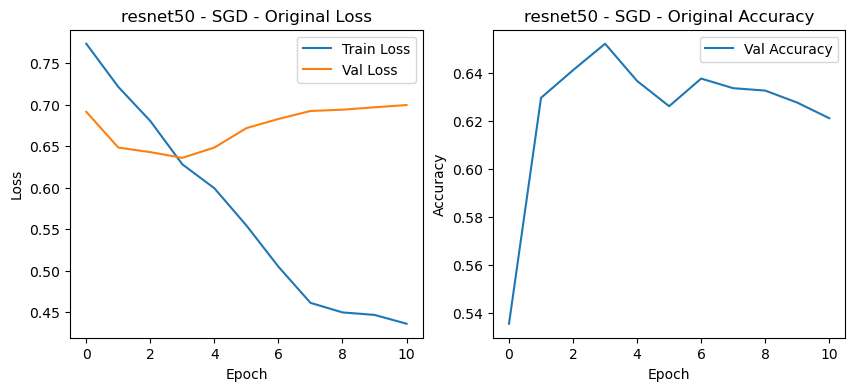

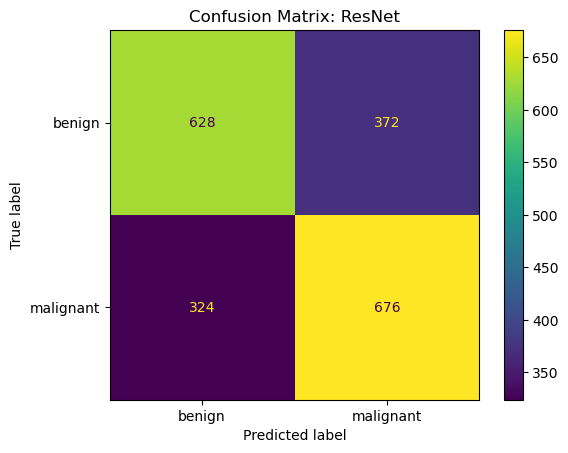

Epoch 0/19
----------
train Loss: 0.7172 Acc: 0.5455
test Loss: 0.6438 Acc: 0.6510
Epoch 0 time: 91.53s
Epoch 1/19
----------
train Loss: 0.6848 Acc: 0.5946
test Loss: 0.6218 Acc: 0.6785
Epoch 1 time: 91.95s
Epoch 2/19
----------
train Loss: 0.6509 Acc: 0.6320
test Loss: 0.6191 Acc: 0.6690
Epoch 2 time: 91.70s
Epoch 3/19
----------
train Loss: 0.6242 Acc: 0.6589
test Loss: 0.6142 Acc: 0.6775
Epoch 3 time: 93.95s
Epoch 4/19
----------
train Loss: 0.5936 Acc: 0.6795
test Loss: 0.6174 Acc: 0.6740
Epoch 4 time: 92.20s
Epoch 5/19
----------
train Loss: 0.5684 Acc: 0.7014
test Loss: 0.6238 Acc: 0.6720
Epoch 5 time: 92.58s
Epoch 6/19
----------
train Loss: 0.5343 Acc: 0.7258
test Loss: 0.6341 Acc: 0.6725
Epoch 6 time: 92.30s
Epoch 7/19
----------
train Loss: 0.5047 Acc: 0.7452
test Loss: 0.6286 Acc: 0.6760
Epoch 7 time: 91.74s
Epoch 8/19
----------
train Loss: 0.5061 Acc: 0.7494
test Loss: 0.6438 Acc: 0.6715
Early stopping triggered
Training complete in 13m 50s
Best val Acc: 0.6785


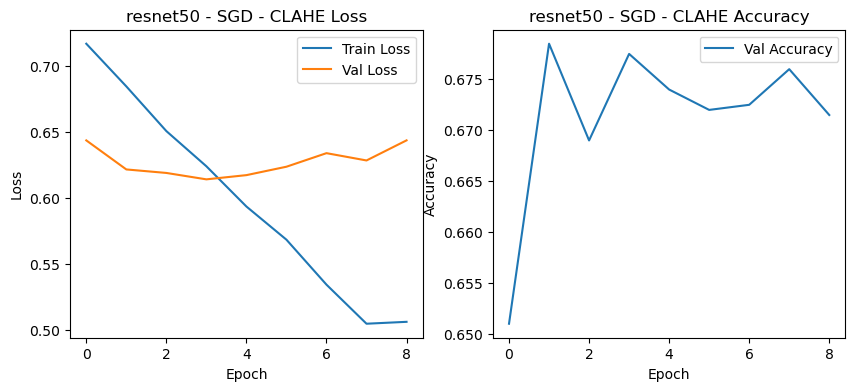

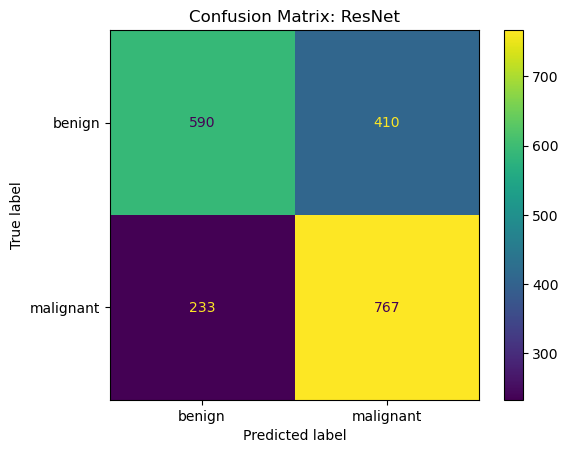

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7305 Acc: 0.5315
test Loss: 0.6753 Acc: 0.5405
Epoch 0 time: 91.74s
Epoch 1/19
----------
train Loss: 0.6829 Acc: 0.5820
test Loss: 0.6430 Acc: 0.6180
Epoch 1 time: 92.42s
Epoch 2/19
----------
train Loss: 0.6381 Acc: 0.6391
test Loss: 0.6250 Acc: 0.6460
Epoch 2 time: 91.89s
Epoch 3/19
----------
train Loss: 0.6063 Acc: 0.6648
test Loss: 0.6287 Acc: 0.6510
Epoch 3 time: 91.98s
Epoch 4/19
----------
train Loss: 0.5645 Acc: 0.7091
test Loss: 0.6404 Acc: 0.6360
Epoch 4 time: 91.77s
Epoch 5/19
----------
train Loss: 0.5237 Acc: 0.7340
test Loss: 0.6611 Acc: 0.6310
Epoch 5 time: 95.69s
Epoch 6/19
----------
train Loss: 0.4671 Acc: 0.7778
test Loss: 0.6961 Acc: 0.6290
Epoch 6 time: 94.89s
Epoch 7/19
----------
train Loss: 0.4177 Acc: 0.8137
test Loss: 0.6967 Acc: 0.6245
Epoch 7 time: 92.93s
Epoch 8/19
----------
train Loss: 0.4066 Acc: 0.8184
test Loss: 0.6937 Acc: 0.6305
Epoc

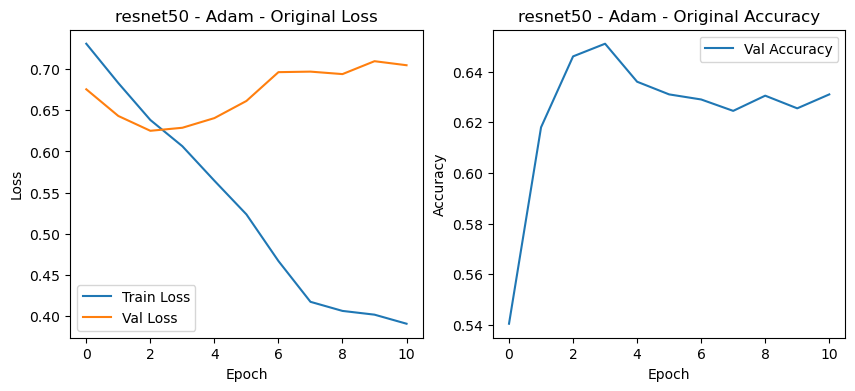

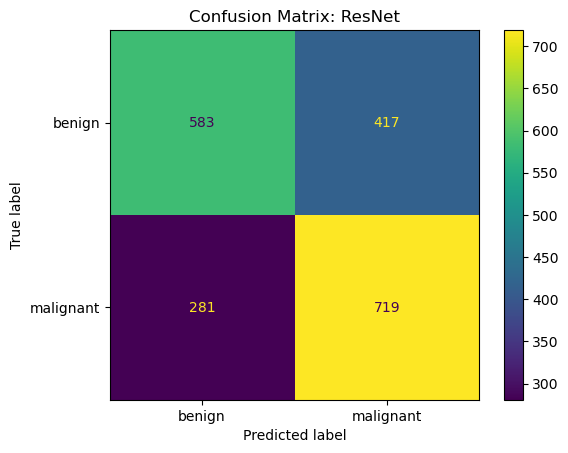

Epoch 0/19
----------
train Loss: 0.6909 Acc: 0.5585
test Loss: 0.6603 Acc: 0.6160
Epoch 0 time: 91.07s
Epoch 1/19
----------
train Loss: 0.6619 Acc: 0.6024
test Loss: 0.6385 Acc: 0.6485
Epoch 1 time: 92.15s
Epoch 2/19
----------
train Loss: 0.6342 Acc: 0.6376
test Loss: 0.6270 Acc: 0.6575
Epoch 2 time: 92.45s
Epoch 3/19
----------
train Loss: 0.6112 Acc: 0.6718
test Loss: 0.6226 Acc: 0.6610
Epoch 3 time: 93.07s
Epoch 4/19
----------
train Loss: 0.5888 Acc: 0.6826
test Loss: 0.6243 Acc: 0.6590
Epoch 4 time: 91.29s
Epoch 5/19
----------
train Loss: 0.5595 Acc: 0.7061
test Loss: 0.6205 Acc: 0.6670
Epoch 5 time: 94.72s
Epoch 6/19
----------
train Loss: 0.5391 Acc: 0.7243
test Loss: 0.6261 Acc: 0.6570
Epoch 6 time: 93.18s
Epoch 7/19
----------
train Loss: 0.5177 Acc: 0.7371
test Loss: 0.6266 Acc: 0.6600
Epoch 7 time: 93.06s
Epoch 8/19
----------
train Loss: 0.5089 Acc: 0.7441
test Loss: 0.6306 Acc: 0.6590
Epoch 8 time: 93.01s
Epoch 9/19
----------
train Loss: 0.5094 Acc: 0.7456
test Loss: 

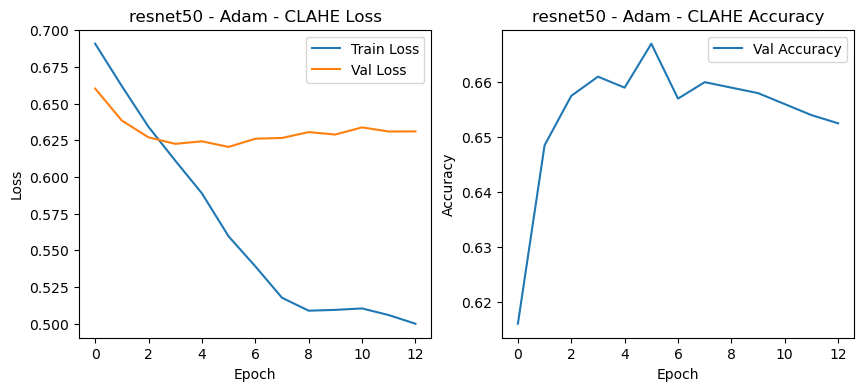

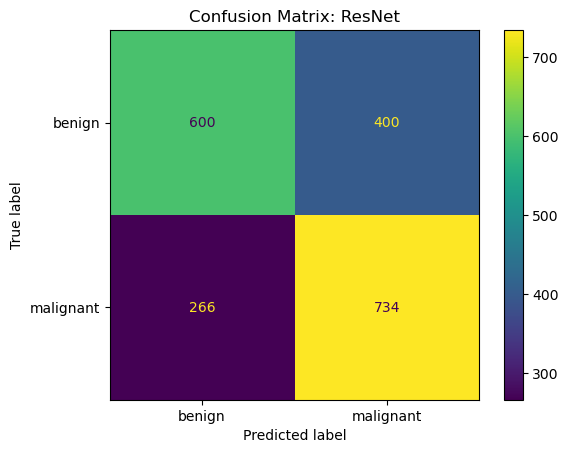

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6956 Acc: 0.5464
test Loss: 0.6569 Acc: 0.6135
Epoch 0 time: 90.93s
Epoch 1/19
----------
train Loss: 0.6579 Acc: 0.6130
test Loss: 0.6435 Acc: 0.6335
Epoch 1 time: 91.29s
Epoch 2/19
----------
train Loss: 0.6337 Acc: 0.6491
test Loss: 0.6307 Acc: 0.6455
Epoch 2 time: 94.65s
Epoch 3/19
----------
train Loss: 0.6142 Acc: 0.6665
test Loss: 0.6293 Acc: 0.6400
Epoch 3 time: 96.25s
Epoch 4/19
----------
train Loss: 0.5955 Acc: 0.6775
test Loss: 0.6246 Acc: 0.6470
Epoch 4 time: 123.64s
Epoch 5/19
----------
train Loss: 0.5671 Acc: 0.7003
test Loss: 0.6268 Acc: 0.6560
Epoch 5 time: 111.82s
Epoch 6/19
----------
train Loss: 0.5464 Acc: 0.7208
test Loss: 0.6337 Acc: 0.6470
Epoch 6 time: 100.09s
Epoch 7/19
----------
train Loss: 0.5223 Acc: 0.7385
test Loss: 0.6371 Acc: 0.6455
Epoch 7 time: 92.24s
Epoch 8/19
----------
train Loss: 0.5186 Acc: 0.7410
test Loss: 0.6333 Acc: 0.6460
E

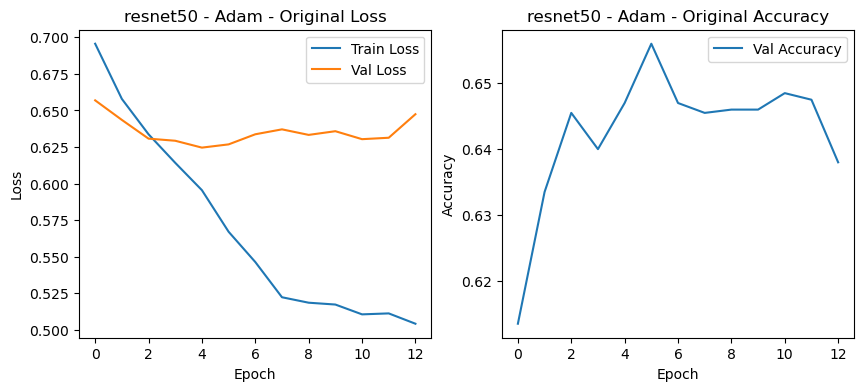

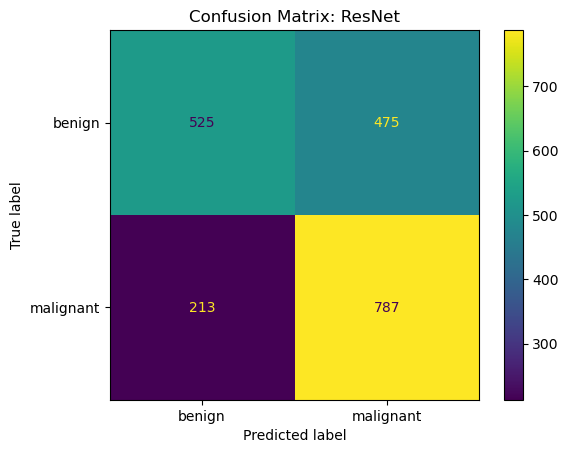

Epoch 0/19
----------
train Loss: 0.6962 Acc: 0.5486
test Loss: 0.6436 Acc: 0.6410
Epoch 0 time: 90.97s
Epoch 1/19
----------
train Loss: 0.6538 Acc: 0.6119
test Loss: 0.6175 Acc: 0.6730
Epoch 1 time: 93.17s
Epoch 2/19
----------
train Loss: 0.6178 Acc: 0.6571
test Loss: 0.6097 Acc: 0.6685
Epoch 2 time: 91.93s
Epoch 3/19
----------
train Loss: 0.5931 Acc: 0.6827
test Loss: 0.6103 Acc: 0.6700
Epoch 3 time: 92.71s
Epoch 4/19
----------
train Loss: 0.5632 Acc: 0.7045
test Loss: 0.6130 Acc: 0.6750
Epoch 4 time: 93.57s
Epoch 5/19
----------
train Loss: 0.5315 Acc: 0.7289
test Loss: 0.6281 Acc: 0.6620
Epoch 5 time: 92.61s
Epoch 6/19
----------
train Loss: 0.4942 Acc: 0.7582
test Loss: 0.6361 Acc: 0.6675
Epoch 6 time: 93.24s
Epoch 7/19
----------
train Loss: 0.4666 Acc: 0.7808
test Loss: 0.6439 Acc: 0.6615
Epoch 7 time: 92.77s
Epoch 8/19
----------
train Loss: 0.4554 Acc: 0.7846
test Loss: 0.6436 Acc: 0.6605
Epoch 8 time: 91.86s
Epoch 9/19
----------
train Loss: 0.4550 Acc: 0.7891
test Loss: 

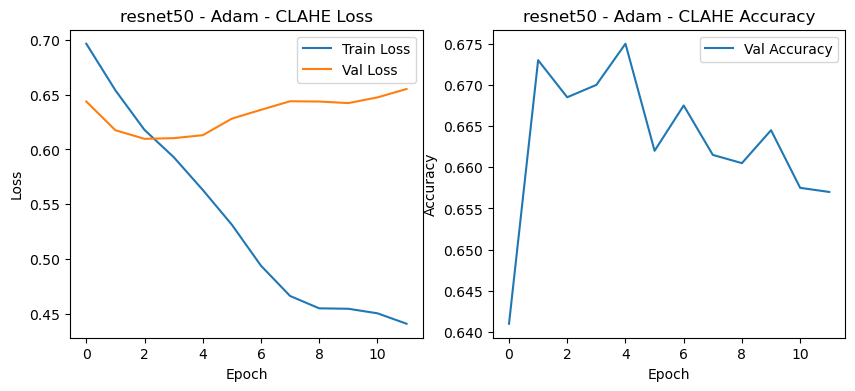

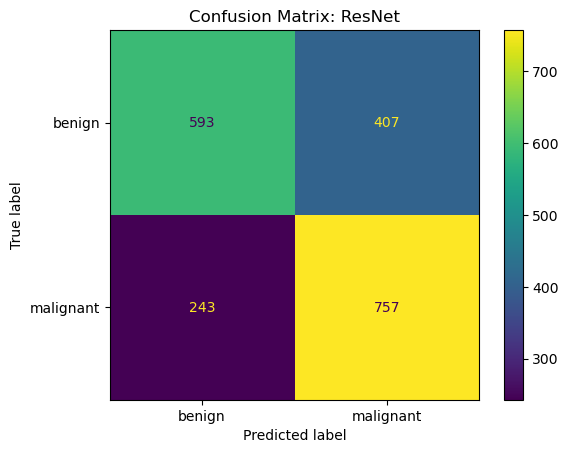

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7337 Acc: 0.5258
test Loss: 0.6592 Acc: 0.6220
Epoch 0 time: 91.57s
Epoch 1/19
----------
train Loss: 0.6959 Acc: 0.5760
test Loss: 0.6410 Acc: 0.6480
Epoch 1 time: 91.11s
Epoch 2/19
----------
train Loss: 0.6719 Acc: 0.6100
test Loss: 0.6331 Acc: 0.6450
Epoch 2 time: 91.37s
Epoch 3/19
----------
train Loss: 0.6466 Acc: 0.6344
test Loss: 0.6307 Acc: 0.6530
Epoch 3 time: 92.66s
Epoch 4/19
----------
train Loss: 0.6167 Acc: 0.6641
test Loss: 0.6284 Acc: 0.6505
Epoch 4 time: 92.47s
Epoch 5/19
----------
train Loss: 0.5971 Acc: 0.6853
test Loss: 0.6373 Acc: 0.6520
Epoch 5 time: 91.57s
Epoch 6/19
----------
train Loss: 0.5677 Acc: 0.7014
test Loss: 0.6464 Acc: 0.6390
Epoch 6 time: 92.53s
Epoch 7/19
----------
train Loss: 0.5470 Acc: 0.7175
test Loss: 0.6419 Acc: 0.6510
Epoch 7 time: 93.88s
Epoch 8/19
----------
train Loss: 0.5425 Acc: 0.7208
test Loss: 0.6441 Acc: 0.6470
Epoc

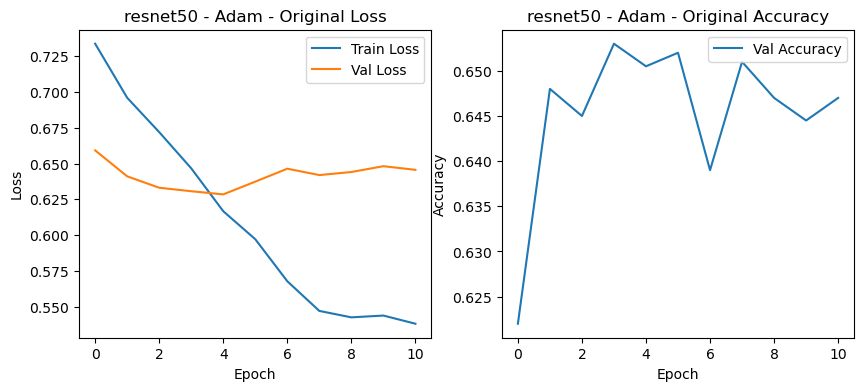

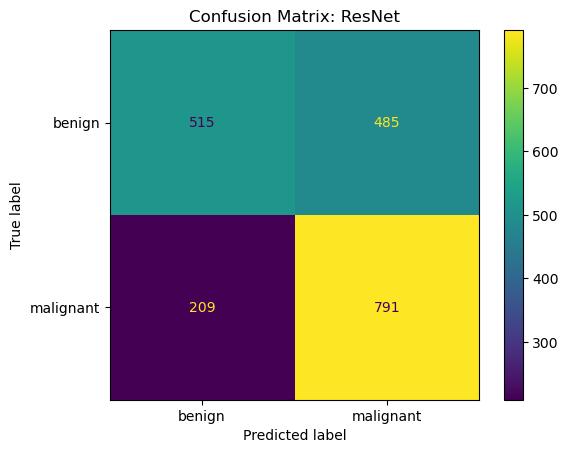

Epoch 0/19
----------
train Loss: 0.7272 Acc: 0.5390
test Loss: 0.6544 Acc: 0.6270
Epoch 0 time: 91.35s
Epoch 1/19
----------
train Loss: 0.6810 Acc: 0.5907
test Loss: 0.6319 Acc: 0.6530
Epoch 1 time: 92.14s
Epoch 2/19
----------
train Loss: 0.6581 Acc: 0.6212
test Loss: 0.6240 Acc: 0.6530
Epoch 2 time: 91.95s
Epoch 3/19
----------
train Loss: 0.6259 Acc: 0.6573
test Loss: 0.6189 Acc: 0.6675
Epoch 3 time: 95.31s
Epoch 4/19
----------
train Loss: 0.6021 Acc: 0.6763
test Loss: 0.6261 Acc: 0.6640
Epoch 4 time: 93.04s
Epoch 5/19
----------
train Loss: 0.5652 Acc: 0.6999
test Loss: 0.6368 Acc: 0.6530
Epoch 5 time: 93.13s
Epoch 6/19
----------
train Loss: 0.5410 Acc: 0.7239
test Loss: 0.6476 Acc: 0.6535
Epoch 6 time: 93.31s
Epoch 7/19
----------
train Loss: 0.5033 Acc: 0.7514
test Loss: 0.6459 Acc: 0.6550
Epoch 7 time: 92.73s
Epoch 8/19
----------
train Loss: 0.5006 Acc: 0.7555
test Loss: 0.6603 Acc: 0.6410
Epoch 8 time: 93.71s
Epoch 9/19
----------
train Loss: 0.4933 Acc: 0.7591
test Loss: 

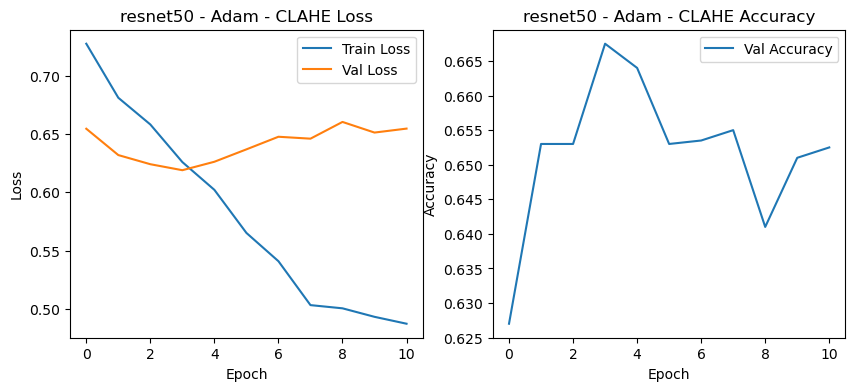

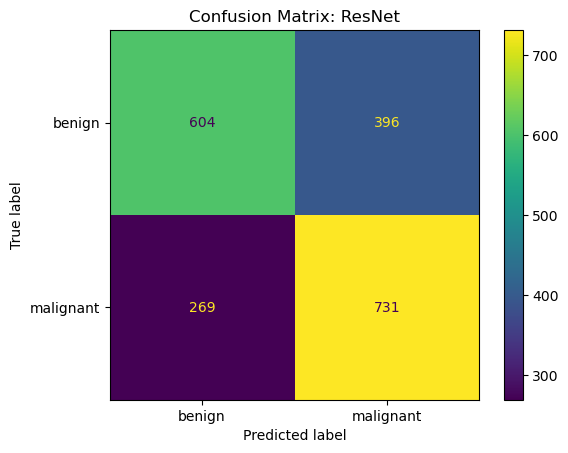

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7568 Acc: 0.5252
test Loss: 0.6721 Acc: 0.5705
Epoch 0 time: 90.99s
Epoch 1/19
----------
train Loss: 0.7040 Acc: 0.5754
test Loss: 0.6431 Acc: 0.6315
Epoch 1 time: 92.59s
Epoch 2/19
----------
train Loss: 0.6597 Acc: 0.6252
test Loss: 0.6327 Acc: 0.6430
Epoch 2 time: 93.18s
Epoch 3/19
----------
train Loss: 0.6274 Acc: 0.6552
test Loss: 0.6403 Acc: 0.6420
Epoch 3 time: 91.37s
Epoch 4/19
----------
train Loss: 0.5878 Acc: 0.6856
test Loss: 0.6524 Acc: 0.6310
Epoch 4 time: 92.20s
Epoch 5/19
----------
train Loss: 0.5415 Acc: 0.7201
test Loss: 0.6720 Acc: 0.6280
Epoch 5 time: 92.13s
Epoch 6/19
----------
train Loss: 0.4854 Acc: 0.7638
test Loss: 0.6951 Acc: 0.6390
Epoch 6 time: 92.37s
Epoch 7/19
----------
train Loss: 0.4365 Acc: 0.7976
test Loss: 0.7083 Acc: 0.6255
Epoch 7 time: 93.42s
Epoch 8/19
----------
train Loss: 0.4317 Acc: 0.8000
test Loss: 0.7028 Acc: 0.6375
Epoc

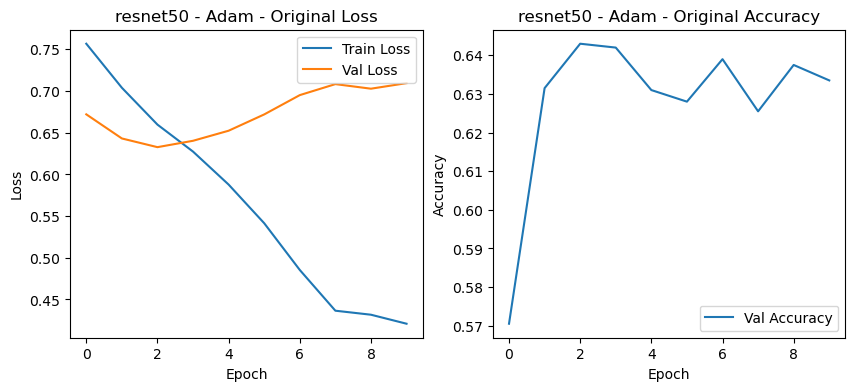

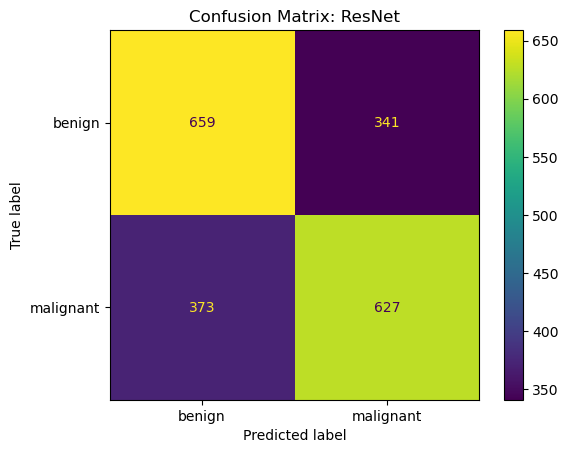

Epoch 0/19
----------
train Loss: 0.7308 Acc: 0.5232
test Loss: 0.6569 Acc: 0.6260
Epoch 0 time: 91.05s
Epoch 1/19
----------
train Loss: 0.6843 Acc: 0.5885
test Loss: 0.6305 Acc: 0.6725
Epoch 1 time: 92.42s
Epoch 2/19
----------
train Loss: 0.6538 Acc: 0.6246
test Loss: 0.6224 Acc: 0.6740
Epoch 2 time: 92.40s
Epoch 3/19
----------
train Loss: 0.6241 Acc: 0.6574
test Loss: 0.6210 Acc: 0.6795
Epoch 3 time: 94.24s
Epoch 4/19
----------
train Loss: 0.5948 Acc: 0.6837
test Loss: 0.6265 Acc: 0.6770
Epoch 4 time: 92.70s
Epoch 5/19
----------
train Loss: 0.5563 Acc: 0.7121
test Loss: 0.6474 Acc: 0.6570
Epoch 5 time: 108.12s
Epoch 6/19
----------
train Loss: 0.5139 Acc: 0.7411
test Loss: 0.6716 Acc: 0.6500
Epoch 6 time: 107.96s
Epoch 7/19
----------
train Loss: 0.4750 Acc: 0.7709
test Loss: 0.6730 Acc: 0.6540
Epoch 7 time: 102.12s
Epoch 8/19
----------
train Loss: 0.4645 Acc: 0.7800
test Loss: 0.6798 Acc: 0.6515
Epoch 8 time: 100.54s
Epoch 9/19
----------
train Loss: 0.4588 Acc: 0.7791
test Lo

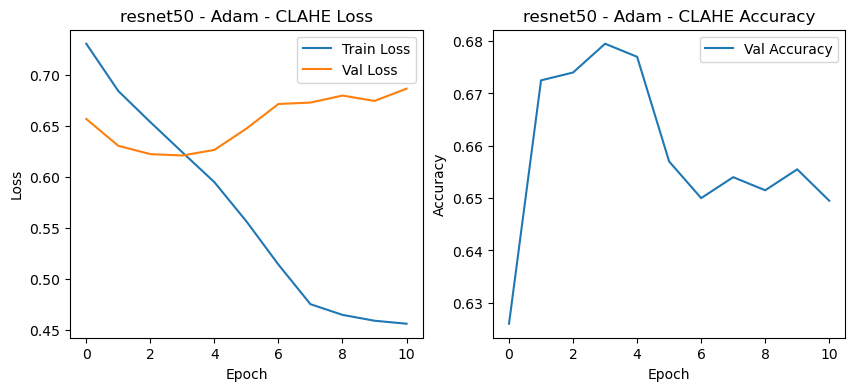

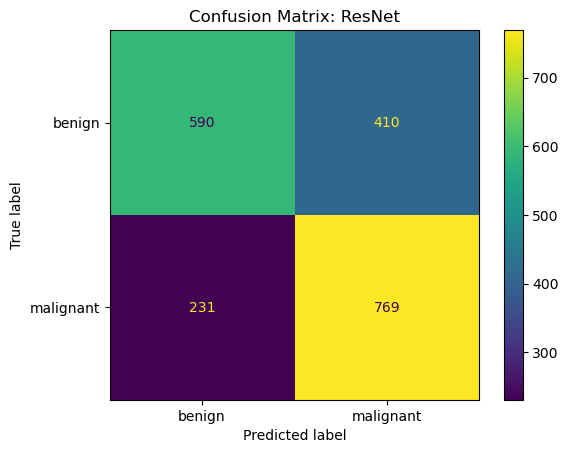

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7076 Acc: 0.5354
test Loss: 0.6773 Acc: 0.5705
Epoch 0 time: 98.96s
Epoch 1/19
----------
train Loss: 0.6657 Acc: 0.5979
test Loss: 0.6494 Acc: 0.6145
Epoch 1 time: 97.85s
Epoch 2/19
----------
train Loss: 0.6355 Acc: 0.6374
test Loss: 0.6363 Acc: 0.6300
Epoch 2 time: 100.40s
Epoch 3/19
----------
train Loss: 0.6046 Acc: 0.6725
test Loss: 0.6354 Acc: 0.6420
Epoch 3 time: 97.14s
Epoch 4/19
----------
train Loss: 0.5706 Acc: 0.7006
test Loss: 0.6380 Acc: 0.6430
Epoch 4 time: 97.02s
Epoch 5/19
----------
train Loss: 0.5415 Acc: 0.7273
test Loss: 0.6506 Acc: 0.6280
Epoch 5 time: 97.28s
Epoch 6/19
----------
train Loss: 0.5019 Acc: 0.7538
test Loss: 0.6715 Acc: 0.6340
Epoch 6 time: 101.56s
Epoch 7/19
----------
train Loss: 0.4657 Acc: 0.7782
test Loss: 0.6703 Acc: 0.6355
Epoch 7 time: 101.75s
Epoch 8/19
----------
train Loss: 0.4603 Acc: 0.7809
test Loss: 0.6758 Acc: 0.6285


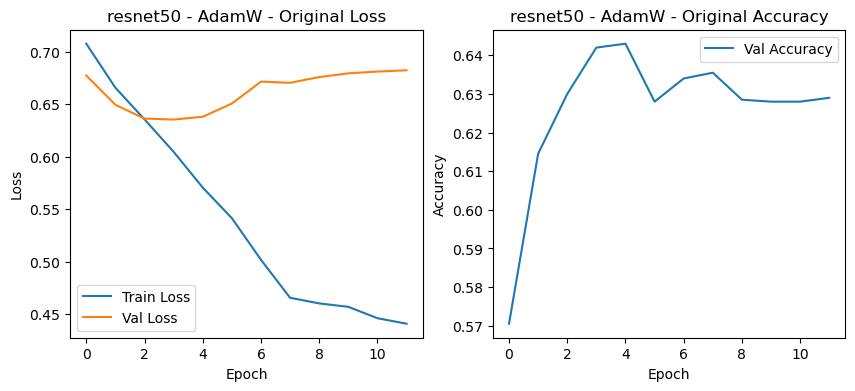

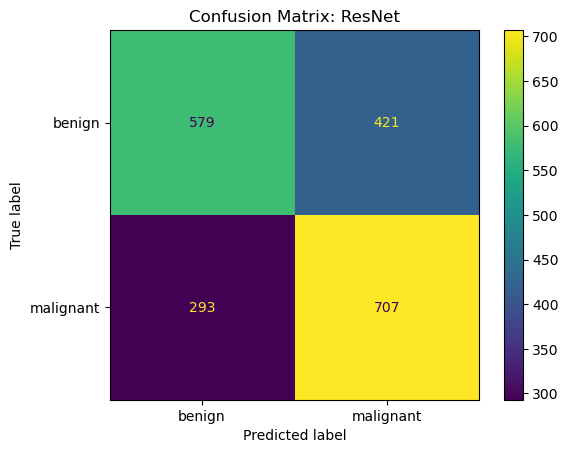

Epoch 0/19
----------
train Loss: 0.7021 Acc: 0.5378
test Loss: 0.6515 Acc: 0.6475
Epoch 0 time: 99.47s
Epoch 1/19
----------
train Loss: 0.6614 Acc: 0.6069
test Loss: 0.6333 Acc: 0.6600
Epoch 1 time: 98.80s
Epoch 2/19
----------
train Loss: 0.6375 Acc: 0.6396
test Loss: 0.6178 Acc: 0.6730
Epoch 2 time: 96.79s
Epoch 3/19
----------
train Loss: 0.6152 Acc: 0.6608
test Loss: 0.6126 Acc: 0.6730
Epoch 3 time: 94.94s
Epoch 4/19
----------
train Loss: 0.5890 Acc: 0.6824
test Loss: 0.6116 Acc: 0.6780
Epoch 4 time: 97.18s
Epoch 5/19
----------
train Loss: 0.5718 Acc: 0.6987
test Loss: 0.6141 Acc: 0.6835
Epoch 5 time: 98.05s
Epoch 6/19
----------
train Loss: 0.5447 Acc: 0.7160
test Loss: 0.6235 Acc: 0.6775
Epoch 6 time: 99.19s
Epoch 7/19
----------
train Loss: 0.5227 Acc: 0.7334
test Loss: 0.6244 Acc: 0.6770
Epoch 7 time: 101.09s
Epoch 8/19
----------
train Loss: 0.5212 Acc: 0.7318
test Loss: 0.6194 Acc: 0.6800
Epoch 8 time: 100.63s
Epoch 9/19
----------
train Loss: 0.5207 Acc: 0.7372
test Loss

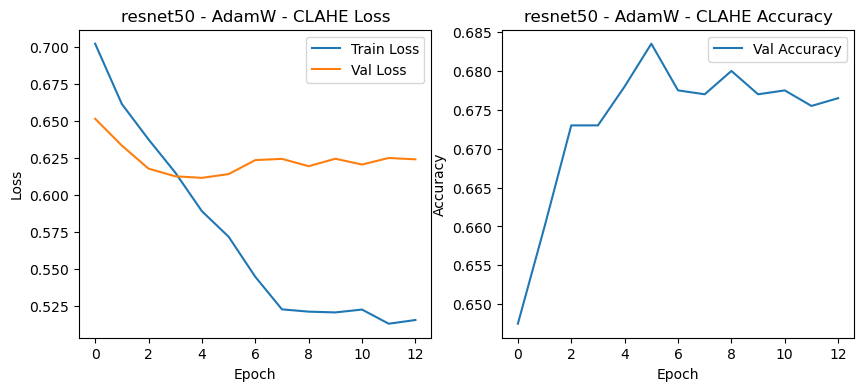

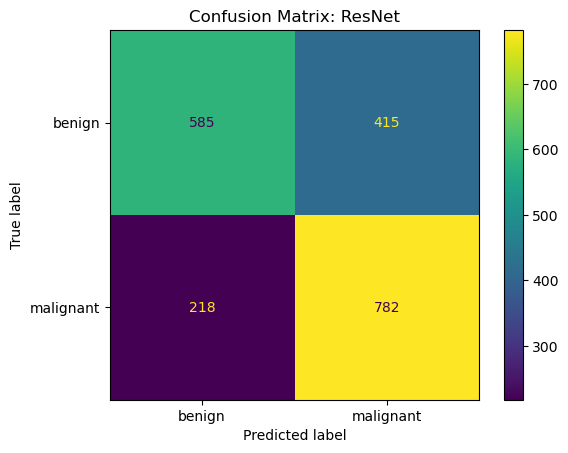

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7198 Acc: 0.5170
test Loss: 0.6801 Acc: 0.5495
Epoch 0 time: 101.63s
Epoch 1/19
----------
train Loss: 0.6805 Acc: 0.5810
test Loss: 0.6560 Acc: 0.6125
Epoch 1 time: 99.78s
Epoch 2/19
----------
train Loss: 0.6461 Acc: 0.6265
test Loss: 0.6447 Acc: 0.6290
Epoch 2 time: 99.33s
Epoch 3/19
----------
train Loss: 0.6219 Acc: 0.6618
test Loss: 0.6400 Acc: 0.6420
Epoch 3 time: 99.14s
Epoch 4/19
----------
train Loss: 0.6047 Acc: 0.6731
test Loss: 0.6293 Acc: 0.6445
Epoch 4 time: 101.22s
Epoch 5/19
----------
train Loss: 0.5750 Acc: 0.6935
test Loss: 0.6395 Acc: 0.6365
Epoch 5 time: 101.56s
Epoch 6/19
----------
train Loss: 0.5434 Acc: 0.7214
test Loss: 0.6436 Acc: 0.6445
Epoch 6 time: 107.85s
Epoch 7/19
----------
train Loss: 0.5127 Acc: 0.7449
test Loss: 0.6465 Acc: 0.6435
Epoch 7 time: 106.69s
Epoch 8/19
----------
train Loss: 0.5143 Acc: 0.7380
test Loss: 0.6547 Acc: 0.639

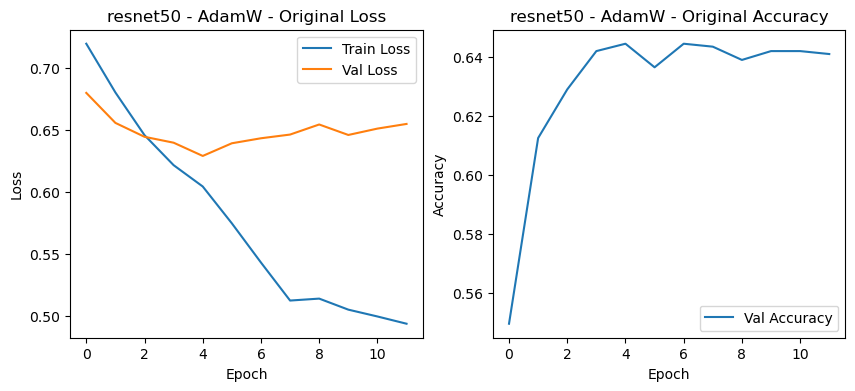

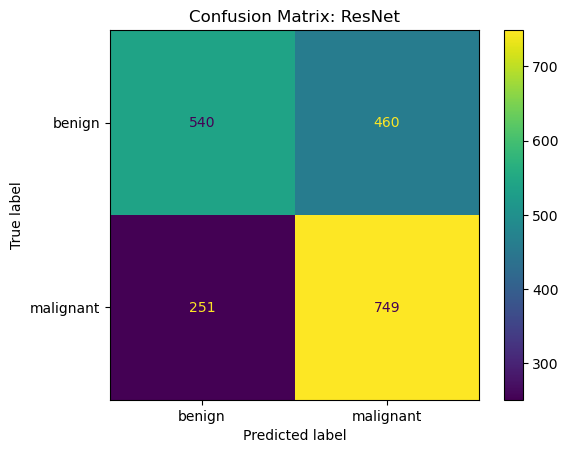

Epoch 0/19
----------
train Loss: 0.7212 Acc: 0.5285
test Loss: 0.6659 Acc: 0.5805
Epoch 0 time: 96.26s
Epoch 1/19
----------
train Loss: 0.6668 Acc: 0.5968
test Loss: 0.6391 Acc: 0.6450
Epoch 1 time: 102.91s
Epoch 2/19
----------
train Loss: 0.6284 Acc: 0.6520
test Loss: 0.6279 Acc: 0.6545
Epoch 2 time: 105.57s
Epoch 3/19
----------
train Loss: 0.5958 Acc: 0.6827
test Loss: 0.6257 Acc: 0.6645
Epoch 3 time: 102.90s
Epoch 4/19
----------
train Loss: 0.5528 Acc: 0.7096
test Loss: 0.6404 Acc: 0.6660
Epoch 4 time: 107.60s
Epoch 5/19
----------
train Loss: 0.5074 Acc: 0.7504
test Loss: 0.6645 Acc: 0.6560
Epoch 5 time: 107.65s
Epoch 6/19
----------
train Loss: 0.4527 Acc: 0.7849
test Loss: 0.7004 Acc: 0.6490
Epoch 6 time: 102.55s
Epoch 7/19
----------
train Loss: 0.4034 Acc: 0.8204
test Loss: 0.7012 Acc: 0.6460
Epoch 7 time: 110.32s
Epoch 8/19
----------
train Loss: 0.3974 Acc: 0.8250
test Loss: 0.7043 Acc: 0.6485
Epoch 8 time: 108.90s
Epoch 9/19
----------
train Loss: 0.3863 Acc: 0.8363
tes

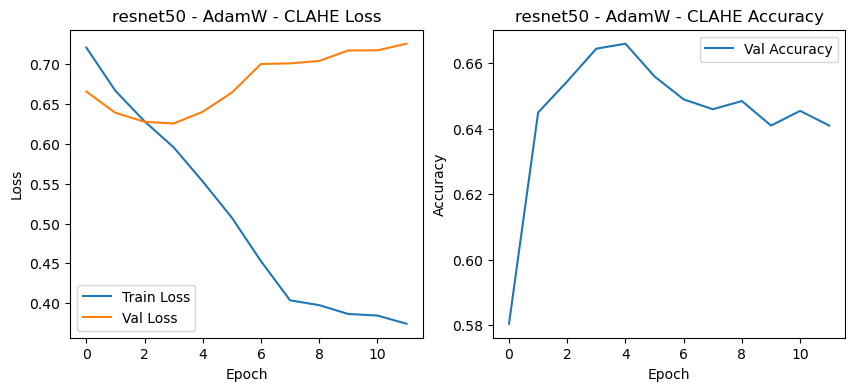

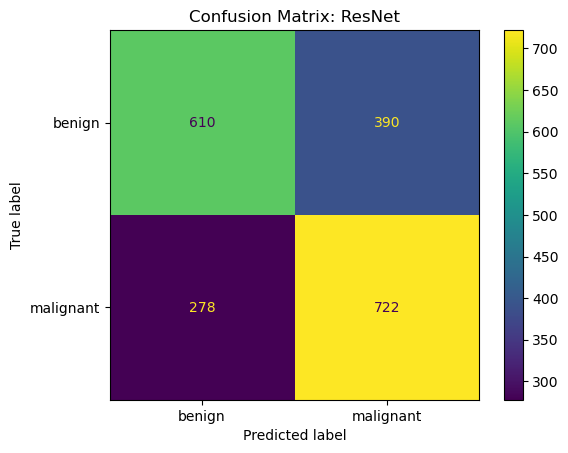

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7310 Acc: 0.5241
test Loss: 0.6640 Acc: 0.6070
Epoch 0 time: 106.85s
Epoch 1/19
----------
train Loss: 0.6963 Acc: 0.5677
test Loss: 0.6437 Acc: 0.6320
Epoch 1 time: 99.68s
Epoch 2/19
----------
train Loss: 0.6722 Acc: 0.6044
test Loss: 0.6346 Acc: 0.6455
Epoch 2 time: 100.15s
Epoch 3/19
----------
train Loss: 0.6428 Acc: 0.6356
test Loss: 0.6233 Acc: 0.6585
Epoch 3 time: 98.68s
Epoch 4/19
----------
train Loss: 0.6237 Acc: 0.6608
test Loss: 0.6247 Acc: 0.6560
Epoch 4 time: 94.11s
Epoch 5/19
----------
train Loss: 0.6053 Acc: 0.6700
test Loss: 0.6263 Acc: 0.6535
Epoch 5 time: 94.53s
Epoch 6/19
----------
train Loss: 0.5772 Acc: 0.6917
test Loss: 0.6245 Acc: 0.6550
Epoch 6 time: 101.85s
Epoch 7/19
----------
train Loss: 0.5556 Acc: 0.7107
test Loss: 0.6240 Acc: 0.6560
Epoch 7 time: 100.14s
Epoch 8/19
----------
train Loss: 0.5502 Acc: 0.7145
test Loss: 0.6242 Acc: 0.6590

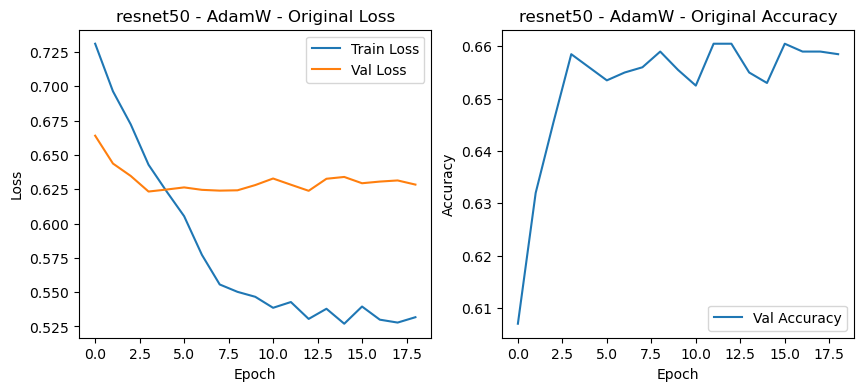

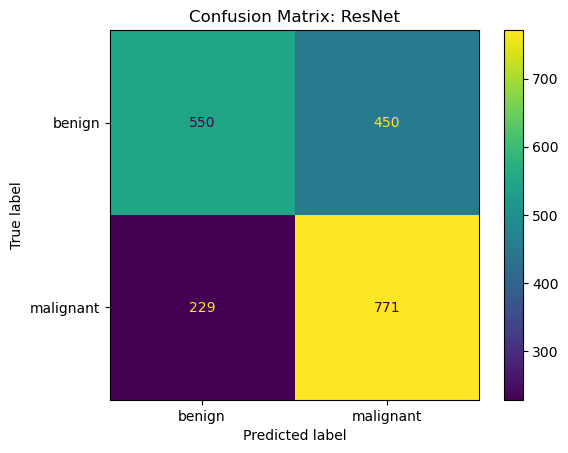

Epoch 0/19
----------
train Loss: 0.7345 Acc: 0.5252
test Loss: 0.6459 Acc: 0.6405
Epoch 0 time: 96.74s
Epoch 1/19
----------
train Loss: 0.6822 Acc: 0.5919
test Loss: 0.6236 Acc: 0.6555
Epoch 1 time: 107.87s
Epoch 2/19
----------
train Loss: 0.6554 Acc: 0.6300
test Loss: 0.6161 Acc: 0.6650
Epoch 2 time: 107.63s
Epoch 3/19
----------
train Loss: 0.6269 Acc: 0.6528
test Loss: 0.6140 Acc: 0.6640
Epoch 3 time: 99.63s
Epoch 4/19
----------
train Loss: 0.5982 Acc: 0.6740
test Loss: 0.6245 Acc: 0.6695
Epoch 4 time: 103.64s
Epoch 5/19
----------
train Loss: 0.5741 Acc: 0.6976
test Loss: 0.6318 Acc: 0.6665
Epoch 5 time: 106.75s
Epoch 6/19
----------
train Loss: 0.5451 Acc: 0.7191
test Loss: 0.6355 Acc: 0.6640
Epoch 6 time: 106.09s
Epoch 7/19
----------
train Loss: 0.5188 Acc: 0.7325
test Loss: 0.6326 Acc: 0.6735
Epoch 7 time: 103.49s
Epoch 8/19
----------
train Loss: 0.5315 Acc: 0.7296
test Loss: 0.6349 Acc: 0.6640
Epoch 8 time: 95.51s
Epoch 9/19
----------
train Loss: 0.5128 Acc: 0.7432
test 

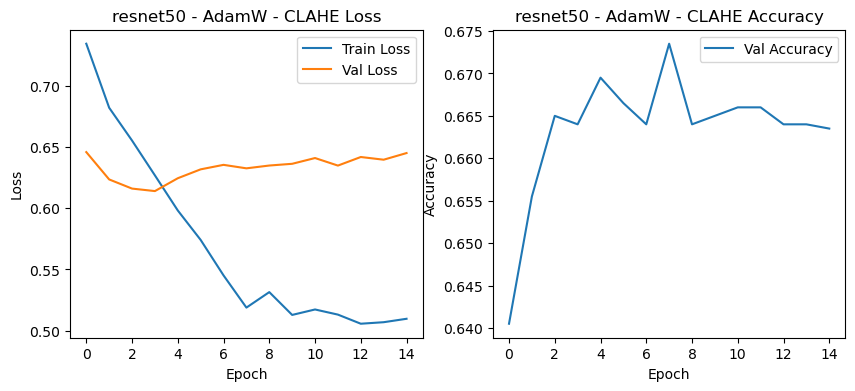

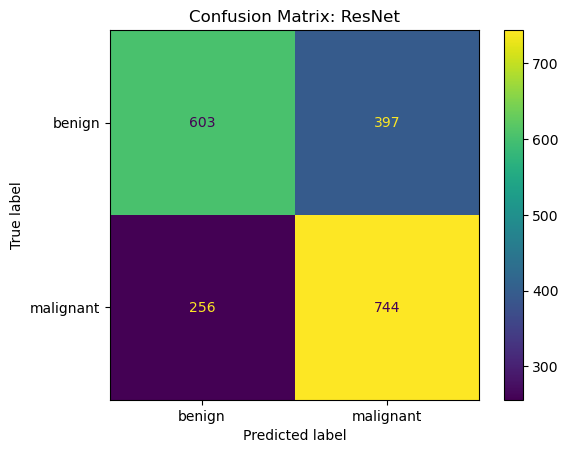

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7546 Acc: 0.5179
test Loss: 0.6663 Acc: 0.5775
Epoch 0 time: 93.96s
Epoch 1/19
----------
train Loss: 0.6944 Acc: 0.5935
test Loss: 0.6352 Acc: 0.6325
Epoch 1 time: 103.09s
Epoch 2/19
----------
train Loss: 0.6480 Acc: 0.6325
test Loss: 0.6280 Acc: 0.6330
Epoch 2 time: 97.69s
Epoch 3/19
----------
train Loss: 0.6052 Acc: 0.6774
test Loss: 0.6382 Acc: 0.6355
Epoch 3 time: 96.63s
Epoch 4/19
----------
train Loss: 0.5695 Acc: 0.6989
test Loss: 0.6523 Acc: 0.6320
Epoch 4 time: 94.74s
Epoch 5/19
----------
train Loss: 0.5084 Acc: 0.7491
test Loss: 0.6717 Acc: 0.6325
Epoch 5 time: 93.89s
Epoch 6/19
----------
train Loss: 0.4551 Acc: 0.7889
test Loss: 0.7110 Acc: 0.6340
Epoch 6 time: 94.07s
Epoch 7/19
----------
train Loss: 0.3985 Acc: 0.8201
test Loss: 0.7101 Acc: 0.6370
Epoch 7 time: 93.72s
Epoch 8/19
----------
train Loss: 0.3785 Acc: 0.8349
test Loss: 0.7124 Acc: 0.6330
Ep

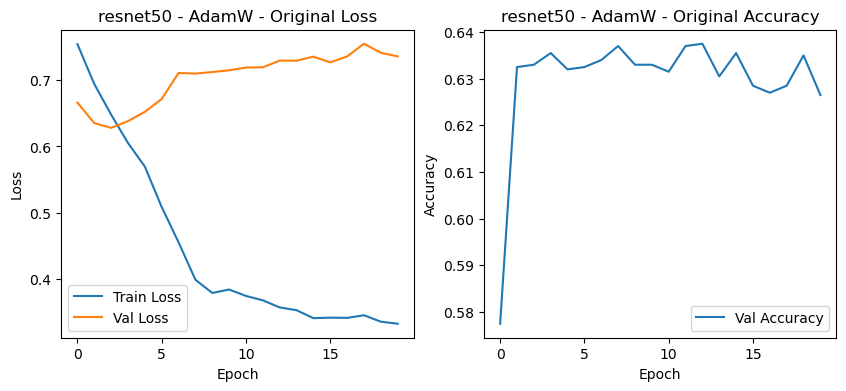

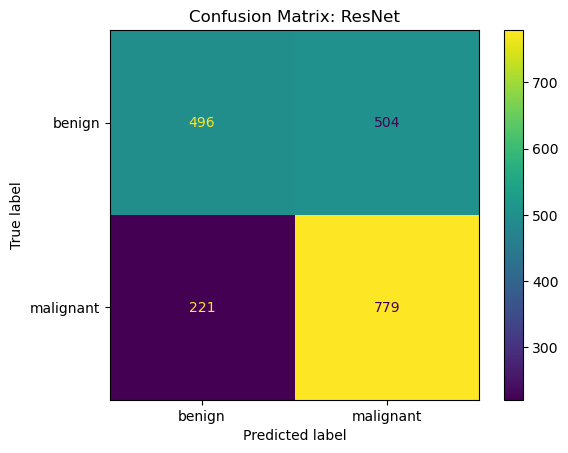

Epoch 0/19
----------
train Loss: 0.7410 Acc: 0.5149
test Loss: 0.6565 Acc: 0.6280
Epoch 0 time: 91.30s
Epoch 1/19
----------
train Loss: 0.6915 Acc: 0.5783
test Loss: 0.6310 Acc: 0.6670
Epoch 1 time: 93.54s
Epoch 2/19
----------
train Loss: 0.6568 Acc: 0.6228
test Loss: 0.6225 Acc: 0.6615
Epoch 2 time: 93.19s
Epoch 3/19
----------
train Loss: 0.6312 Acc: 0.6492
test Loss: 0.6189 Acc: 0.6630
Epoch 3 time: 97.97s
Epoch 4/19
----------
train Loss: 0.6055 Acc: 0.6740
test Loss: 0.6237 Acc: 0.6615
Epoch 4 time: 93.96s
Epoch 5/19
----------
train Loss: 0.5644 Acc: 0.7081
test Loss: 0.6386 Acc: 0.6585
Epoch 5 time: 92.71s
Epoch 6/19
----------
train Loss: 0.5316 Acc: 0.7321
test Loss: 0.6578 Acc: 0.6500
Epoch 6 time: 92.70s
Epoch 7/19
----------
train Loss: 0.4957 Acc: 0.7581
test Loss: 0.6604 Acc: 0.6505
Epoch 7 time: 95.34s
Epoch 8/19
----------
train Loss: 0.4883 Acc: 0.7645
test Loss: 0.6611 Acc: 0.6510
Early stopping triggered
Training complete in 14m 4s
Best val Acc: 0.6670


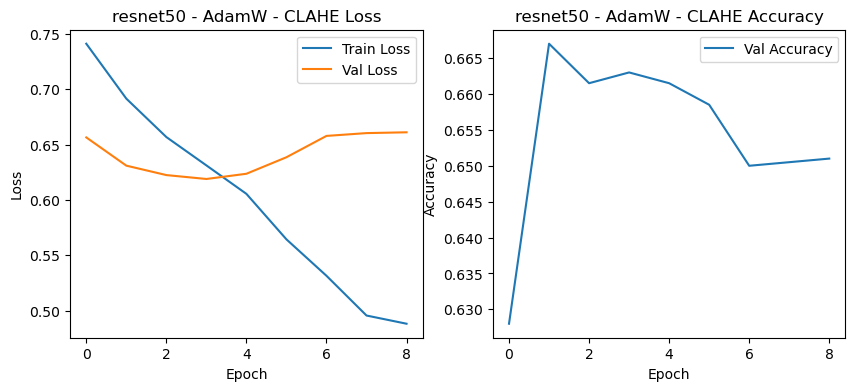

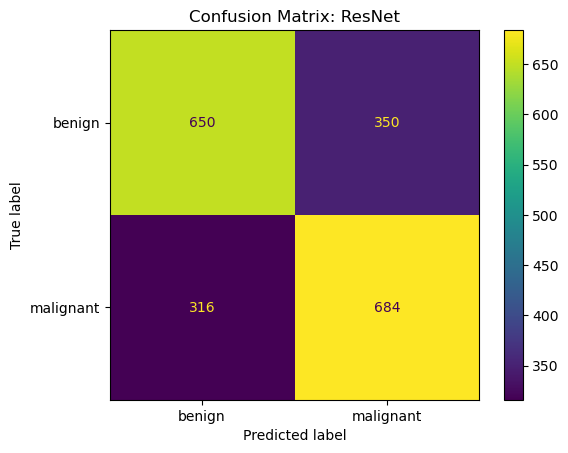

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7091 Acc: 0.5390
test Loss: 0.6558 Acc: 0.6050
Epoch 0 time: 92.88s
Epoch 1/19
----------
train Loss: 0.6362 Acc: 0.6395
test Loss: 0.6408 Acc: 0.6405
Epoch 1 time: 92.79s
Epoch 2/19
----------
train Loss: 0.5771 Acc: 0.6921
test Loss: 0.6528 Acc: 0.6275
Epoch 2 time: 92.68s
Epoch 3/19
----------
train Loss: 0.5045 Acc: 0.7504
test Loss: 0.6890 Acc: 0.6145
Epoch 3 time: 93.89s
Epoch 4/19
----------
train Loss: 0.4180 Acc: 0.8086
test Loss: 0.7418 Acc: 0.6285
Epoch 4 time: 94.39s
Epoch 5/19
----------
train Loss: 0.2991 Acc: 0.8778
test Loss: 0.8276 Acc: 0.6265
Epoch 5 time: 95.64s
Epoch 6/19
----------
train Loss: 0.2119 Acc: 0.9204
test Loss: 0.9606 Acc: 0.6205
Epoch 6 time: 95.07s
Epoch 7/19
----------
train Loss: 0.1446 Acc: 0.9547
test Loss: 0.9334 Acc: 0.6150
Epoch 7 time: 93.11s
Epoch 8/19
----------
train Loss: 0.1411 Acc: 0.9535
test Loss: 0.9352 Acc: 0.6115
Early

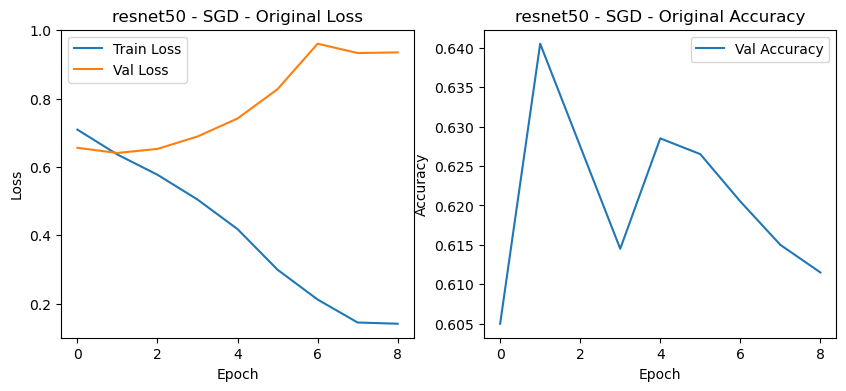

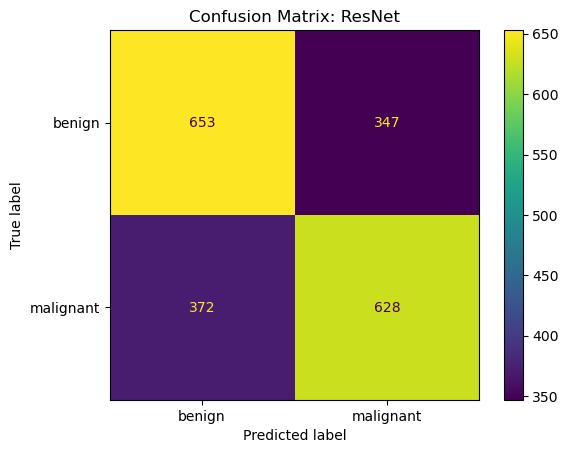

Epoch 0/19
----------
train Loss: 0.6816 Acc: 0.5716
test Loss: 0.6297 Acc: 0.6610
Epoch 0 time: 92.42s
Epoch 1/19
----------
train Loss: 0.6196 Acc: 0.6550
test Loss: 0.6177 Acc: 0.6690
Epoch 1 time: 92.35s
Epoch 2/19
----------
train Loss: 0.5802 Acc: 0.6933
test Loss: 0.6161 Acc: 0.6665
Epoch 2 time: 93.19s
Epoch 3/19
----------
train Loss: 0.5305 Acc: 0.7313
test Loss: 0.6266 Acc: 0.6610
Epoch 3 time: 92.43s
Epoch 4/19
----------
train Loss: 0.4761 Acc: 0.7678
test Loss: 0.6389 Acc: 0.6595
Epoch 4 time: 92.13s
Epoch 5/19
----------
train Loss: 0.4230 Acc: 0.8036
test Loss: 0.6594 Acc: 0.6490
Epoch 5 time: 93.39s
Epoch 6/19
----------
train Loss: 0.3441 Acc: 0.8556
test Loss: 0.6905 Acc: 0.6435
Epoch 6 time: 92.54s
Epoch 7/19
----------
train Loss: 0.2748 Acc: 0.8991
test Loss: 0.6830 Acc: 0.6570
Epoch 7 time: 92.49s
Epoch 8/19
----------
train Loss: 0.2626 Acc: 0.9093
test Loss: 0.6962 Acc: 0.6495
Early stopping triggered
Training complete in 13m 54s
Best val Acc: 0.6690


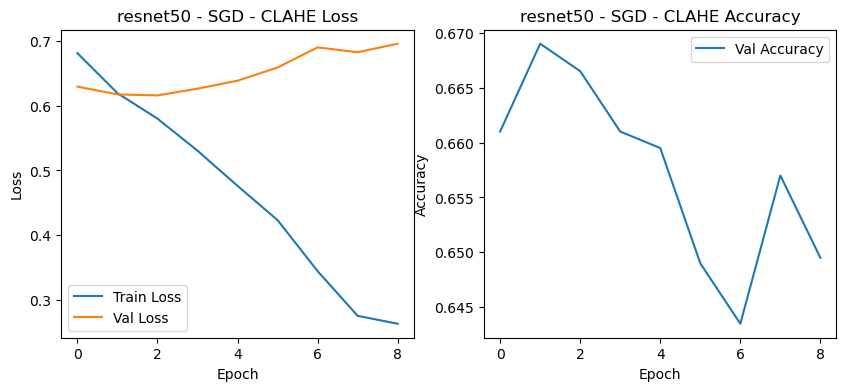

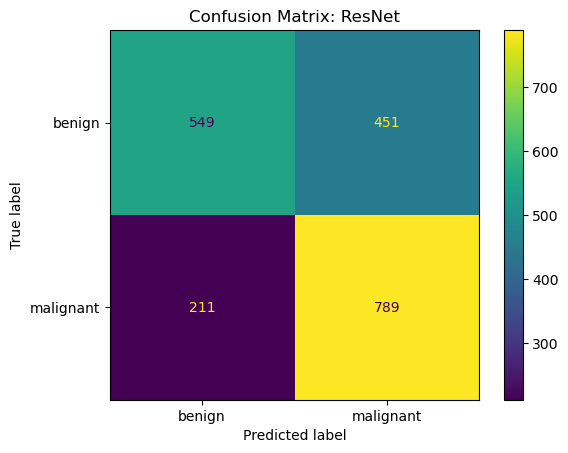

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6869 Acc: 0.5636
test Loss: 0.6370 Acc: 0.6580
Epoch 0 time: 96.33s
Epoch 1/19
----------
train Loss: 0.6288 Acc: 0.6444
test Loss: 0.6260 Acc: 0.6510
Epoch 1 time: 97.79s
Epoch 2/19
----------
train Loss: 0.5817 Acc: 0.6884
test Loss: 0.6338 Acc: 0.6535
Epoch 2 time: 93.42s
Epoch 3/19
----------
train Loss: 0.5343 Acc: 0.7260
test Loss: 0.6526 Acc: 0.6415
Epoch 3 time: 96.24s
Epoch 4/19
----------
train Loss: 0.4726 Acc: 0.7702
test Loss: 0.6754 Acc: 0.6475
Epoch 4 time: 93.52s
Epoch 5/19
----------
train Loss: 0.4048 Acc: 0.8175
test Loss: 0.7193 Acc: 0.6355
Epoch 5 time: 93.54s
Epoch 6/19
----------
train Loss: 0.3161 Acc: 0.8692
test Loss: 0.7589 Acc: 0.6425
Epoch 6 time: 95.44s
Epoch 7/19
----------
train Loss: 0.2356 Acc: 0.9176
test Loss: 0.7678 Acc: 0.6355
Early stopping triggered
Training complete in 12m 40s
Best val Acc: 0.6580


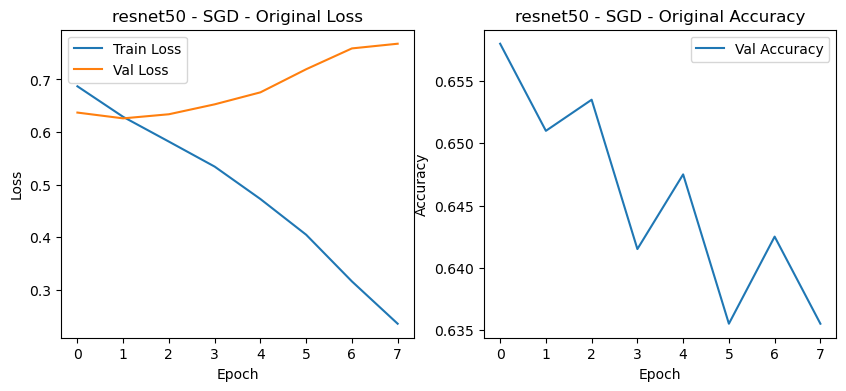

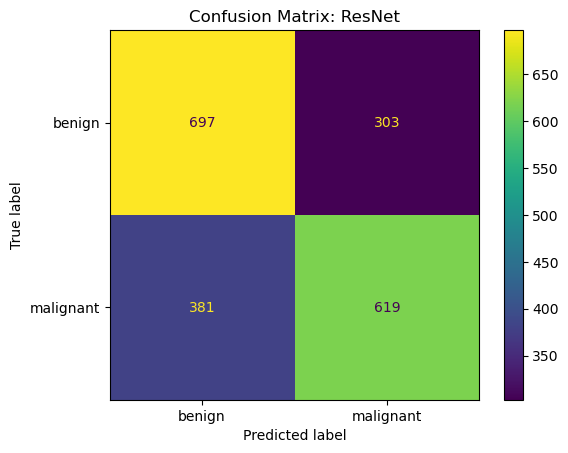

Epoch 0/19
----------
train Loss: 0.6863 Acc: 0.5660
test Loss: 0.6357 Acc: 0.6550
Epoch 0 time: 91.04s
Epoch 1/19
----------
train Loss: 0.6280 Acc: 0.6506
test Loss: 0.6167 Acc: 0.6785
Epoch 1 time: 93.04s
Epoch 2/19
----------
train Loss: 0.5879 Acc: 0.6867
test Loss: 0.6163 Acc: 0.6700
Epoch 2 time: 92.51s
Epoch 3/19
----------
train Loss: 0.5386 Acc: 0.7210
test Loss: 0.6229 Acc: 0.6705
Epoch 3 time: 92.63s
Epoch 4/19
----------
train Loss: 0.4815 Acc: 0.7665
test Loss: 0.6399 Acc: 0.6735
Epoch 4 time: 92.28s
Epoch 5/19
----------
train Loss: 0.4140 Acc: 0.8133
test Loss: 0.6863 Acc: 0.6500
Epoch 5 time: 93.82s
Epoch 6/19
----------
train Loss: 0.3380 Acc: 0.8624
test Loss: 0.7256 Acc: 0.6380
Epoch 6 time: 93.29s
Epoch 7/19
----------
train Loss: 0.2599 Acc: 0.9111
test Loss: 0.7207 Acc: 0.6460
Epoch 7 time: 93.33s
Epoch 8/19
----------
train Loss: 0.2509 Acc: 0.9145
test Loss: 0.7409 Acc: 0.6495
Early stopping triggered
Training complete in 13m 54s
Best val Acc: 0.6785


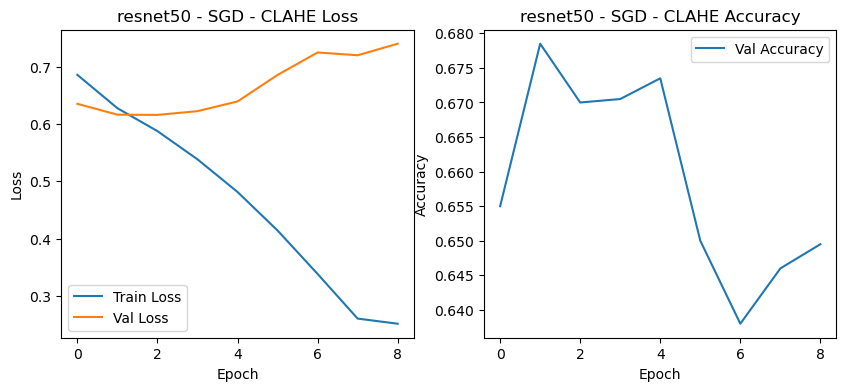

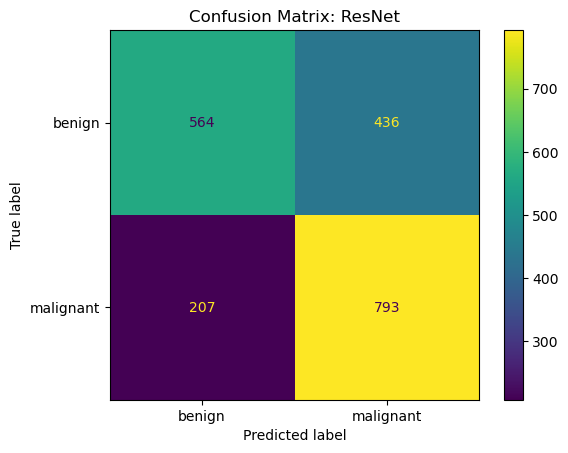

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7201 Acc: 0.5507
test Loss: 0.6441 Acc: 0.6320
Epoch 0 time: 91.77s
Epoch 1/19
----------
train Loss: 0.6557 Acc: 0.6210
test Loss: 0.6286 Acc: 0.6535
Epoch 1 time: 93.63s
Epoch 2/19
----------
train Loss: 0.5943 Acc: 0.6869
test Loss: 0.6477 Acc: 0.6475
Epoch 2 time: 92.75s
Epoch 3/19
----------
train Loss: 0.5189 Acc: 0.7394
test Loss: 0.6946 Acc: 0.6400
Epoch 3 time: 104.85s
Epoch 4/19
----------
train Loss: 0.4262 Acc: 0.8023
test Loss: 0.7478 Acc: 0.6220
Epoch 4 time: 107.64s
Epoch 5/19
----------
train Loss: 0.3186 Acc: 0.8665
test Loss: 0.8078 Acc: 0.6295
Epoch 5 time: 94.65s
Epoch 6/19
----------
train Loss: 0.2204 Acc: 0.9143
test Loss: 0.9104 Acc: 0.6235
Epoch 6 time: 93.50s
Epoch 7/19
----------
train Loss: 0.1527 Acc: 0.9494
test Loss: 0.8958 Acc: 0.6280
Epoch 7 time: 94.39s
Epoch 8/19
----------
train Loss: 0.1344 Acc: 0.9569
test Loss: 0.9014 Acc: 0.6245
Ear

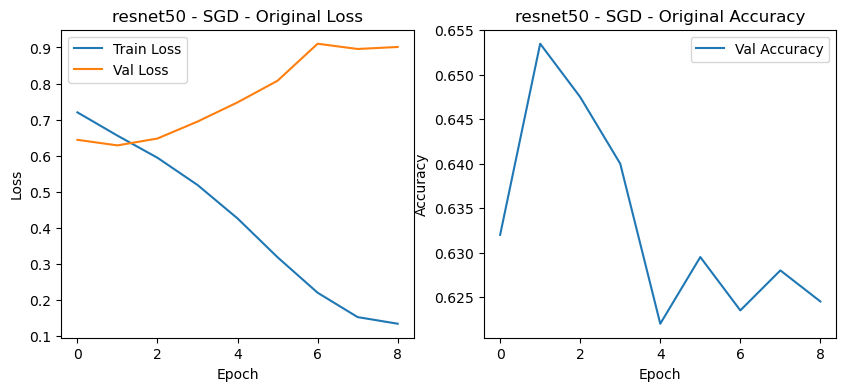

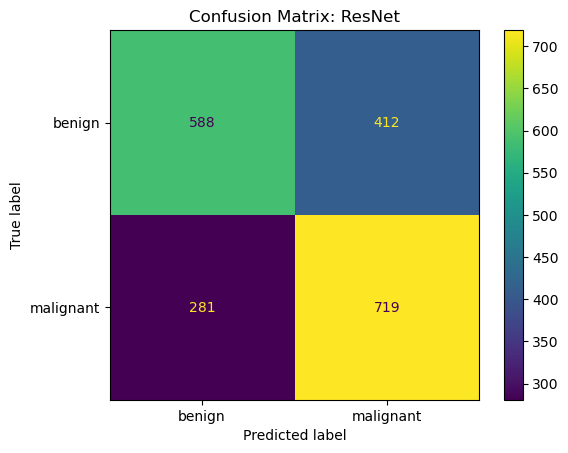

Epoch 0/19
----------
train Loss: 0.7142 Acc: 0.5474
test Loss: 0.6254 Acc: 0.6620
Epoch 0 time: 112.25s
Epoch 1/19
----------
train Loss: 0.6466 Acc: 0.6358
test Loss: 0.6164 Acc: 0.6645
Epoch 1 time: 93.24s
Epoch 2/19
----------
train Loss: 0.5877 Acc: 0.6896
test Loss: 0.6348 Acc: 0.6660
Epoch 2 time: 92.83s
Epoch 3/19
----------
train Loss: 0.5098 Acc: 0.7446
test Loss: 0.6676 Acc: 0.6485
Epoch 3 time: 91.98s
Epoch 4/19
----------
train Loss: 0.4064 Acc: 0.8181
test Loss: 0.7346 Acc: 0.6460
Epoch 4 time: 92.61s
Epoch 5/19
----------
train Loss: 0.2969 Acc: 0.8789
test Loss: 0.8303 Acc: 0.6275
Epoch 5 time: 92.57s
Epoch 6/19
----------
train Loss: 0.1976 Acc: 0.9273
test Loss: 0.9047 Acc: 0.6380
Epoch 6 time: 92.95s
Epoch 7/19
----------
train Loss: 0.1352 Acc: 0.9567
test Loss: 0.9469 Acc: 0.6320
Epoch 7 time: 94.02s
Epoch 8/19
----------
train Loss: 0.1181 Acc: 0.9661
test Loss: 0.9467 Acc: 0.6455
Epoch 8 time: 92.52s
Epoch 9/19
----------
train Loss: 0.1193 Acc: 0.9616
test Loss:

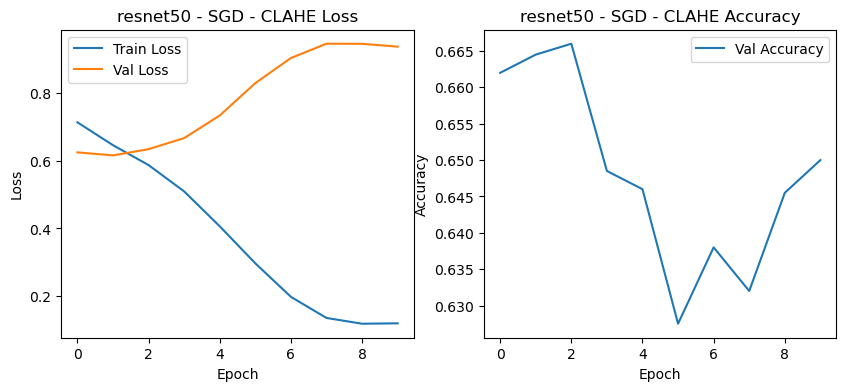

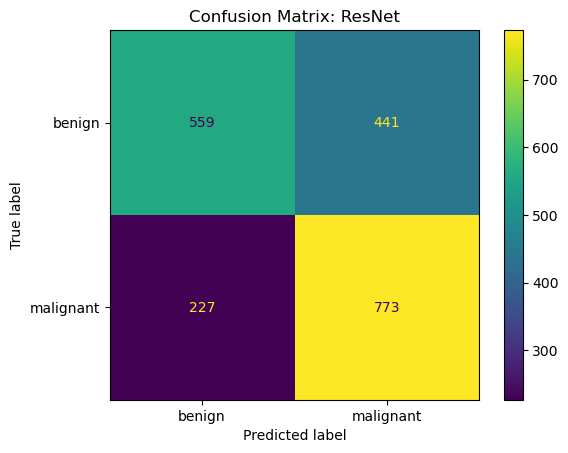

Entrenando resnet50 con SGD, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7132 Acc: 0.5479
test Loss: 0.6446 Acc: 0.6480
Epoch 0 time: 91.99s
Epoch 1/19
----------
train Loss: 0.6458 Acc: 0.6309
test Loss: 0.6333 Acc: 0.6520
Epoch 1 time: 94.81s
Epoch 2/19
----------
train Loss: 0.6037 Acc: 0.6739
test Loss: 0.6452 Acc: 0.6435
Epoch 2 time: 93.09s
Epoch 3/19
----------
train Loss: 0.5501 Acc: 0.7166
test Loss: 0.6604 Acc: 0.6485
Epoch 3 time: 93.45s
Epoch 4/19
----------
train Loss: 0.4869 Acc: 0.7614
test Loss: 0.6989 Acc: 0.6405
Epoch 4 time: 92.42s
Epoch 5/19
----------
train Loss: 0.3944 Acc: 0.8223
test Loss: 0.7256 Acc: 0.6325
Epoch 5 time: 94.62s
Epoch 6/19
----------
train Loss: 0.3034 Acc: 0.8752
test Loss: 0.7841 Acc: 0.6290
Epoch 6 time: 99.51s
Epoch 7/19
----------
train Loss: 0.2201 Acc: 0.9188
test Loss: 0.8137 Acc: 0.6295
Epoch 7 time: 98.97s
Epoch 8/19
----------
train Loss: 0.2188 Acc: 0.9185
test Loss: 0.8290 Acc: 0.6290
Early

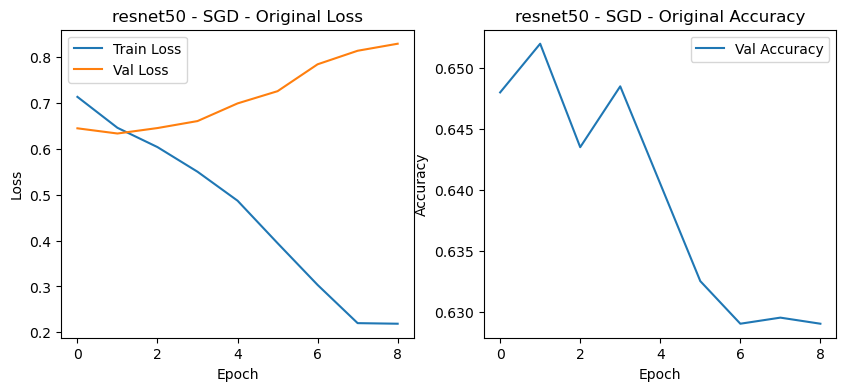

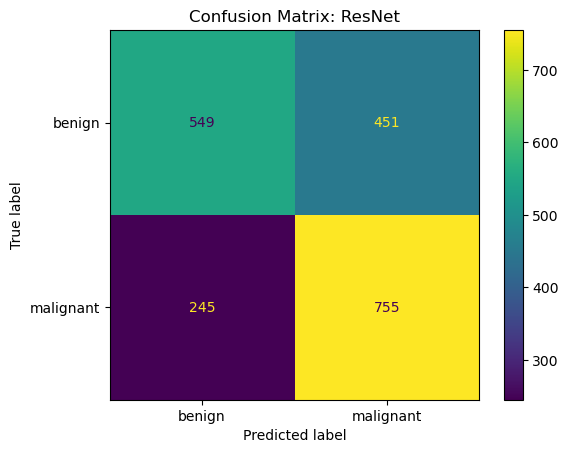

Epoch 0/19
----------
train Loss: 0.7318 Acc: 0.5457
test Loss: 0.6357 Acc: 0.6440
Epoch 0 time: 98.46s
Epoch 1/19
----------
train Loss: 0.6513 Acc: 0.6344
test Loss: 0.6185 Acc: 0.6685
Epoch 1 time: 100.04s
Epoch 2/19
----------
train Loss: 0.5886 Acc: 0.6840
test Loss: 0.6351 Acc: 0.6655
Epoch 2 time: 92.67s
Epoch 3/19
----------
train Loss: 0.5131 Acc: 0.7430
test Loss: 0.6696 Acc: 0.6515
Epoch 3 time: 93.16s
Epoch 4/19
----------
train Loss: 0.4263 Acc: 0.7996
test Loss: 0.7259 Acc: 0.6425
Epoch 4 time: 92.92s
Epoch 5/19
----------
train Loss: 0.3154 Acc: 0.8661
test Loss: 0.8617 Acc: 0.6335
Epoch 5 time: 92.85s
Epoch 6/19
----------
train Loss: 0.2141 Acc: 0.9181
test Loss: 0.9130 Acc: 0.6265
Epoch 6 time: 93.93s
Epoch 7/19
----------
train Loss: 0.1412 Acc: 0.9576
test Loss: 0.9265 Acc: 0.6335
Epoch 7 time: 93.57s
Epoch 8/19
----------
train Loss: 0.1317 Acc: 0.9603
test Loss: 0.9454 Acc: 0.6305
Early stopping triggered
Training complete in 14m 10s
Best val Acc: 0.6685


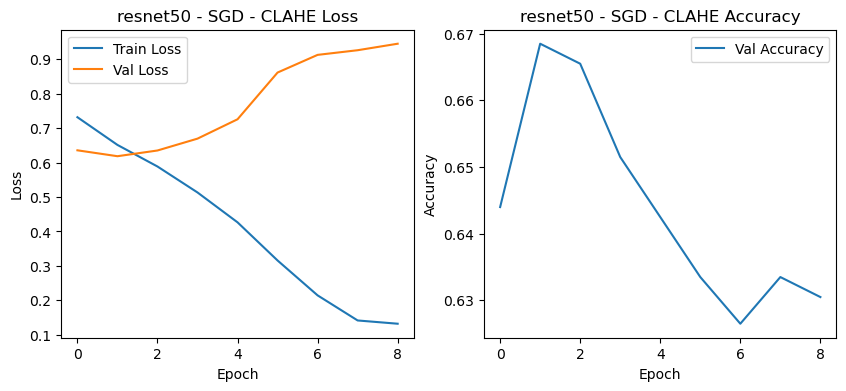

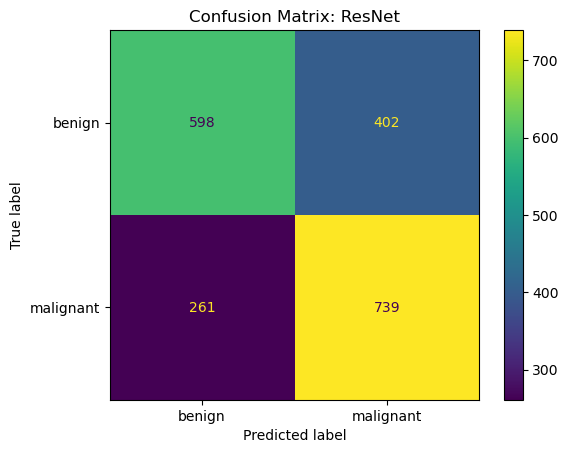

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6904 Acc: 0.5563
test Loss: 0.6367 Acc: 0.6595
Epoch 0 time: 91.62s
Epoch 1/19
----------
train Loss: 0.6277 Acc: 0.6495
test Loss: 0.6213 Acc: 0.6630
Epoch 1 time: 93.08s
Epoch 2/19
----------
train Loss: 0.5775 Acc: 0.6937
test Loss: 0.6341 Acc: 0.6520
Epoch 2 time: 92.85s
Epoch 3/19
----------
train Loss: 0.5215 Acc: 0.7400
test Loss: 0.6591 Acc: 0.6355
Epoch 3 time: 92.03s
Epoch 4/19
----------
train Loss: 0.4440 Acc: 0.7909
test Loss: 0.6899 Acc: 0.6385
Epoch 4 time: 92.37s
Epoch 5/19
----------
train Loss: 0.3537 Acc: 0.8478
test Loss: 0.7290 Acc: 0.6375
Epoch 5 time: 92.56s
Epoch 6/19
----------
train Loss: 0.2523 Acc: 0.9004
test Loss: 0.8185 Acc: 0.6345
Epoch 6 time: 92.77s
Epoch 7/19
----------
train Loss: 0.1821 Acc: 0.9415
test Loss: 0.8427 Acc: 0.6240
Epoch 7 time: 93.40s
Epoch 8/19
----------
train Loss: 0.1774 Acc: 0.9394
test Loss: 0.8333 Acc: 0.6215
Earl

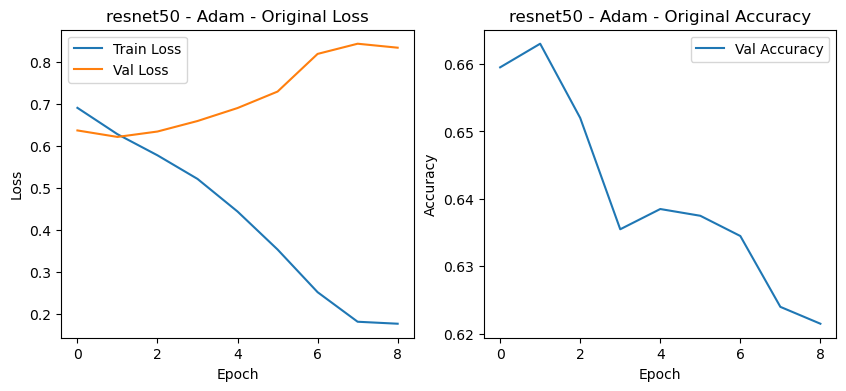

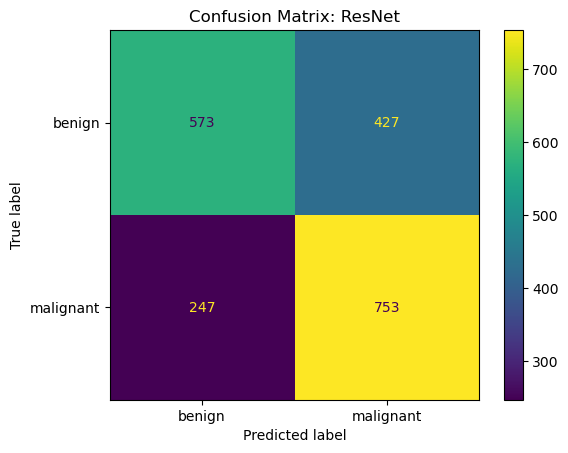

Epoch 0/19
----------
train Loss: 0.6876 Acc: 0.5629
test Loss: 0.6406 Acc: 0.6500
Epoch 0 time: 91.79s
Epoch 1/19
----------
train Loss: 0.6250 Acc: 0.6574
test Loss: 0.6226 Acc: 0.6735
Epoch 1 time: 92.30s
Epoch 2/19
----------
train Loss: 0.5809 Acc: 0.6949
test Loss: 0.6223 Acc: 0.6830
Epoch 2 time: 93.60s
Epoch 3/19
----------
train Loss: 0.5296 Acc: 0.7289
test Loss: 0.6396 Acc: 0.6805
Epoch 3 time: 93.06s
Epoch 4/19
----------
train Loss: 0.4589 Acc: 0.7766
test Loss: 0.6655 Acc: 0.6695
Epoch 4 time: 93.47s
Epoch 5/19
----------
train Loss: 0.3759 Acc: 0.8290
test Loss: 0.7255 Acc: 0.6615
Epoch 5 time: 92.92s
Epoch 6/19
----------
train Loss: 0.2837 Acc: 0.8885
test Loss: 0.8022 Acc: 0.6535
Epoch 6 time: 93.23s
Epoch 7/19
----------
train Loss: 0.2068 Acc: 0.9284
test Loss: 0.8068 Acc: 0.6585
Epoch 7 time: 93.54s
Epoch 8/19
----------
train Loss: 0.1868 Acc: 0.9446
test Loss: 0.8221 Acc: 0.6525
Epoch 8 time: 94.74s
Epoch 9/19
----------
train Loss: 0.1836 Acc: 0.9400
test Loss: 

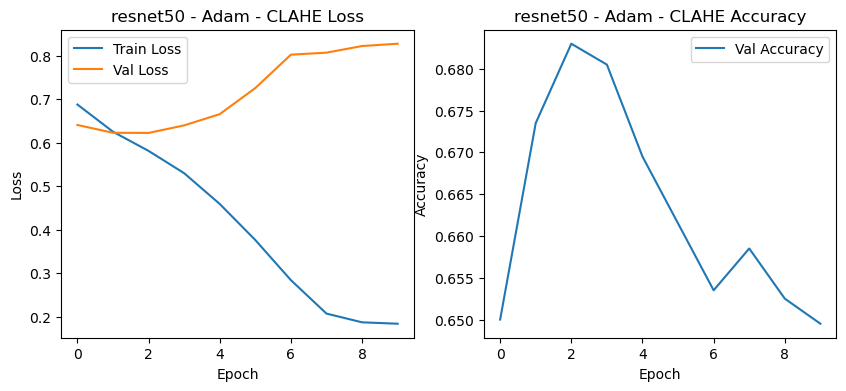

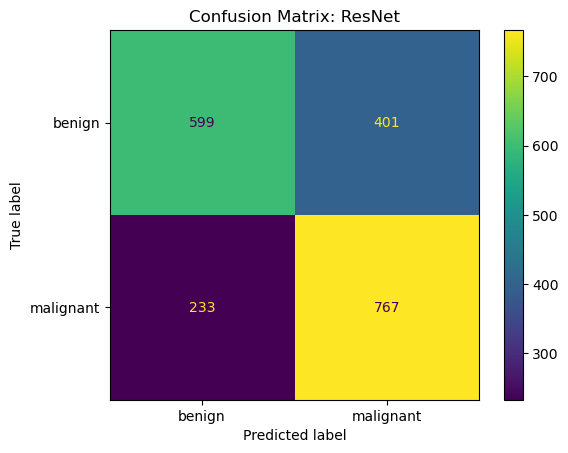

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6867 Acc: 0.5594
test Loss: 0.6454 Acc: 0.6385
Epoch 0 time: 91.28s
Epoch 1/19
----------
train Loss: 0.6339 Acc: 0.6399
test Loss: 0.6311 Acc: 0.6490
Epoch 1 time: 93.19s
Epoch 2/19
----------
train Loss: 0.5921 Acc: 0.6845
test Loss: 0.6319 Acc: 0.6515
Epoch 2 time: 93.14s
Epoch 3/19
----------
train Loss: 0.5509 Acc: 0.7149
test Loss: 0.6381 Acc: 0.6555
Epoch 3 time: 109.65s
Epoch 4/19
----------
train Loss: 0.4881 Acc: 0.7611
test Loss: 0.6643 Acc: 0.6390
Epoch 4 time: 115.51s
Epoch 5/19
----------
train Loss: 0.4201 Acc: 0.8079
test Loss: 0.6993 Acc: 0.6460
Epoch 5 time: 101.62s
Epoch 6/19
----------
train Loss: 0.3366 Acc: 0.8593
test Loss: 0.7619 Acc: 0.6250
Epoch 6 time: 102.32s
Epoch 7/19
----------
train Loss: 0.2699 Acc: 0.9012
test Loss: 0.7610 Acc: 0.6255
Epoch 7 time: 109.26s
Epoch 8/19
----------
train Loss: 0.2591 Acc: 0.9075
test Loss: 0.7709 Acc: 0.6275

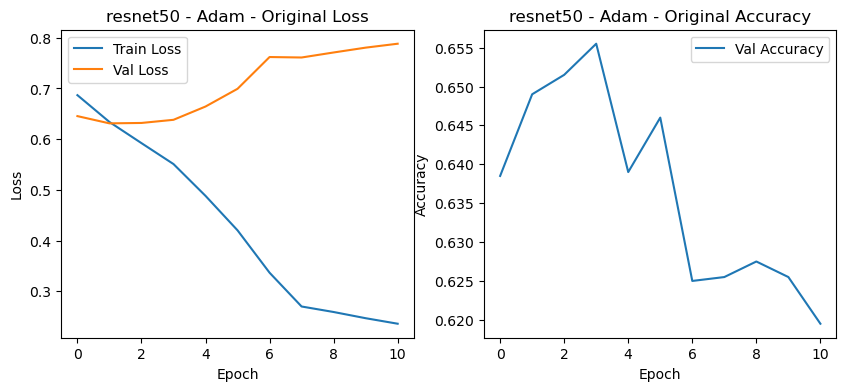

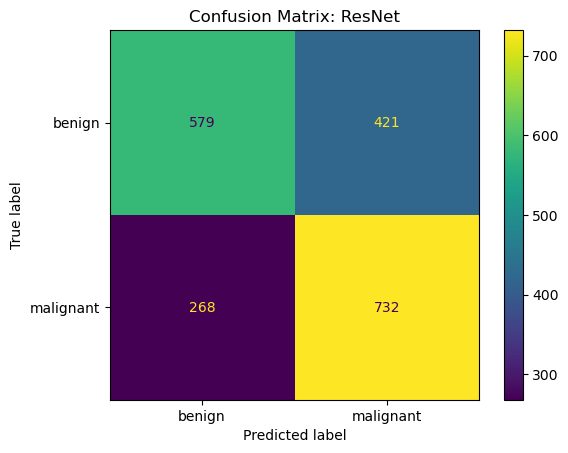

Epoch 0/19
----------
train Loss: 0.6879 Acc: 0.5730
test Loss: 0.6428 Acc: 0.6470
Epoch 0 time: 102.90s
Epoch 1/19
----------
train Loss: 0.6179 Acc: 0.6594
test Loss: 0.6272 Acc: 0.6600
Epoch 1 time: 107.16s
Epoch 2/19
----------
train Loss: 0.5659 Acc: 0.7067
test Loss: 0.6426 Acc: 0.6560
Epoch 2 time: 117.38s
Epoch 3/19
----------
train Loss: 0.4965 Acc: 0.7561
test Loss: 0.6796 Acc: 0.6495
Epoch 3 time: 134.97s
Epoch 4/19
----------
train Loss: 0.4040 Acc: 0.8196
test Loss: 0.7521 Acc: 0.6275
Epoch 4 time: 117.41s
Epoch 5/19
----------
train Loss: 0.3015 Acc: 0.8755
test Loss: 0.8439 Acc: 0.6295
Epoch 5 time: 117.47s
Epoch 6/19
----------
train Loss: 0.2044 Acc: 0.9273
test Loss: 0.9084 Acc: 0.6280
Epoch 6 time: 109.24s
Epoch 7/19
----------
train Loss: 0.1323 Acc: 0.9624
test Loss: 0.9345 Acc: 0.6285
Epoch 7 time: 104.91s
Epoch 8/19
----------
train Loss: 0.1206 Acc: 0.9671
test Loss: 0.9387 Acc: 0.6265
Early stopping triggered
Training complete in 16m 60s
Best val Acc: 0.6600


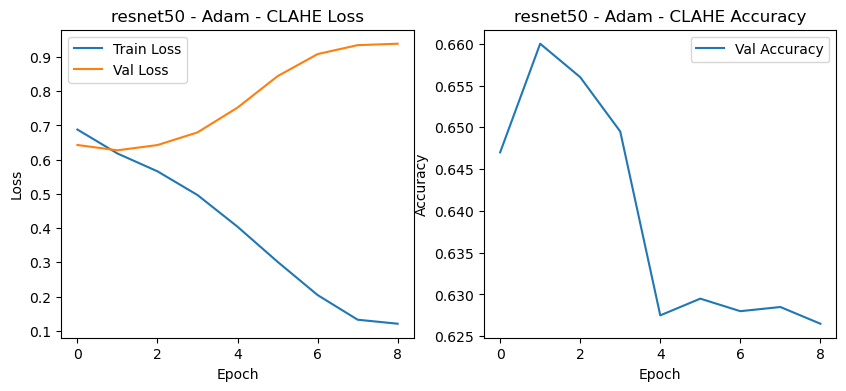

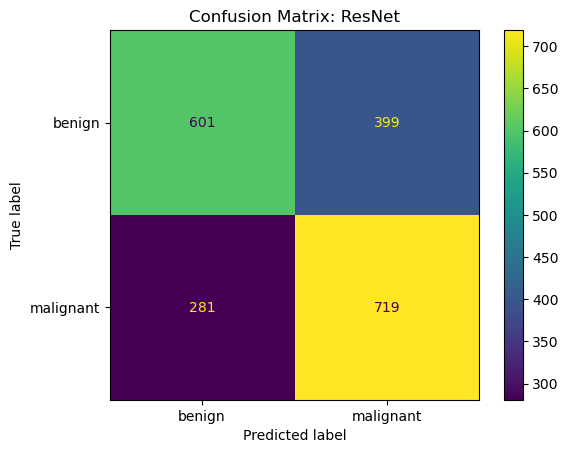

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7334 Acc: 0.5451
test Loss: 0.6608 Acc: 0.6210
Epoch 0 time: 107.07s
Epoch 1/19
----------
train Loss: 0.6777 Acc: 0.6069
test Loss: 0.6434 Acc: 0.6620
Epoch 1 time: 106.72s
Epoch 2/19
----------
train Loss: 0.6108 Acc: 0.6698
test Loss: 0.6438 Acc: 0.6565
Epoch 2 time: 106.06s
Epoch 3/19
----------
train Loss: 0.5311 Acc: 0.7293
test Loss: 0.6741 Acc: 0.6550
Epoch 3 time: 106.27s
Epoch 4/19
----------
train Loss: 0.4104 Acc: 0.8150
test Loss: 0.7713 Acc: 0.6380
Epoch 4 time: 105.49s
Epoch 5/19
----------
train Loss: 0.3028 Acc: 0.8698
test Loss: 0.8596 Acc: 0.6340
Epoch 5 time: 101.90s
Epoch 6/19
----------
train Loss: 0.2090 Acc: 0.9201
test Loss: 0.9136 Acc: 0.6270
Epoch 6 time: 107.36s
Epoch 7/19
----------
train Loss: 0.1325 Acc: 0.9589
test Loss: 0.9202 Acc: 0.6295
Epoch 7 time: 103.89s
Epoch 8/19
----------
train Loss: 0.1278 Acc: 0.9580
test Loss: 0.9234 Acc: 0.6

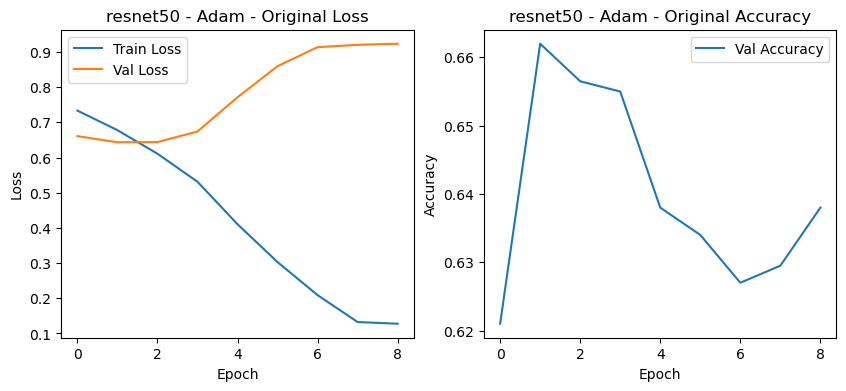

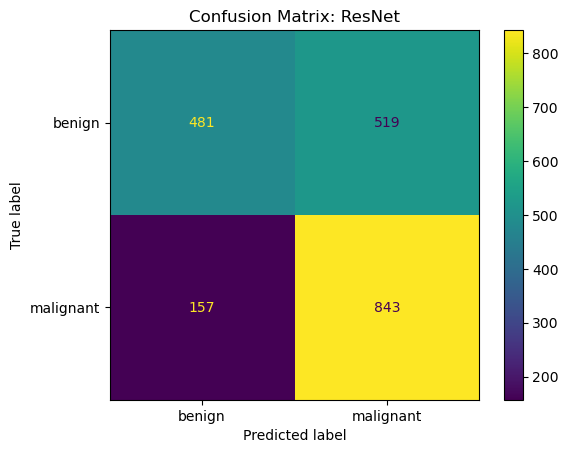

Epoch 0/19
----------
train Loss: 0.7181 Acc: 0.5421
test Loss: 0.6418 Acc: 0.6505
Epoch 0 time: 101.99s
Epoch 1/19
----------
train Loss: 0.6590 Acc: 0.6201
test Loss: 0.6245 Acc: 0.6635
Epoch 1 time: 111.77s
Epoch 2/19
----------
train Loss: 0.6022 Acc: 0.6683
test Loss: 0.6200 Acc: 0.6645
Epoch 2 time: 104.29s
Epoch 3/19
----------
train Loss: 0.5427 Acc: 0.7111
test Loss: 0.6432 Acc: 0.6620
Epoch 3 time: 107.70s
Epoch 4/19
----------
train Loss: 0.4721 Acc: 0.7698
test Loss: 0.6840 Acc: 0.6500
Epoch 4 time: 107.69s
Epoch 5/19
----------
train Loss: 0.3719 Acc: 0.8261
test Loss: 0.7593 Acc: 0.6430
Epoch 5 time: 104.22s
Epoch 6/19
----------
train Loss: 0.2632 Acc: 0.8952
test Loss: 0.8303 Acc: 0.6525
Epoch 6 time: 104.26s
Epoch 7/19
----------
train Loss: 0.1917 Acc: 0.9345
test Loss: 0.8412 Acc: 0.6395
Epoch 7 time: 102.51s
Epoch 8/19
----------
train Loss: 0.1794 Acc: 0.9393
test Loss: 0.8555 Acc: 0.6365
Epoch 8 time: 104.09s
Epoch 9/19
----------
train Loss: 0.1690 Acc: 0.9466
te

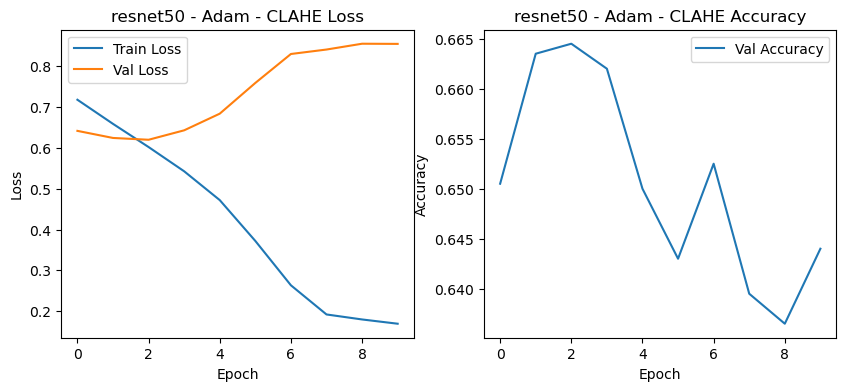

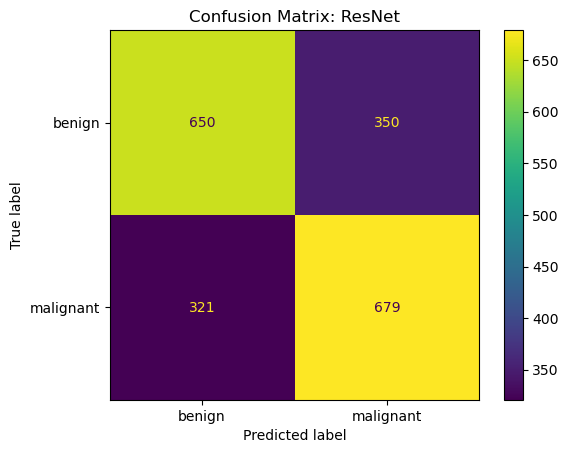

Entrenando resnet50 con Adam, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7077 Acc: 0.5505
test Loss: 0.6371 Acc: 0.6430
Epoch 0 time: 102.64s
Epoch 1/19
----------
train Loss: 0.6486 Acc: 0.6325
test Loss: 0.6286 Acc: 0.6600
Epoch 1 time: 103.91s
Epoch 2/19
----------
train Loss: 0.6014 Acc: 0.6787
test Loss: 0.6470 Acc: 0.6450
Epoch 2 time: 104.46s
Epoch 3/19
----------
train Loss: 0.5297 Acc: 0.7344
test Loss: 0.6686 Acc: 0.6315
Epoch 3 time: 104.89s
Epoch 4/19
----------
train Loss: 0.4537 Acc: 0.7864
test Loss: 0.7293 Acc: 0.6100
Epoch 4 time: 104.42s
Epoch 5/19
----------
train Loss: 0.3548 Acc: 0.8466
test Loss: 0.7899 Acc: 0.6120
Epoch 5 time: 105.93s
Epoch 6/19
----------
train Loss: 0.2625 Acc: 0.8922
test Loss: 0.8698 Acc: 0.6165
Epoch 6 time: 104.97s
Epoch 7/19
----------
train Loss: 0.1851 Acc: 0.9346
test Loss: 0.8972 Acc: 0.6010
Epoch 7 time: 108.73s
Epoch 8/19
----------
train Loss: 0.1719 Acc: 0.9417
test Loss: 0.9017 Acc: 0.6

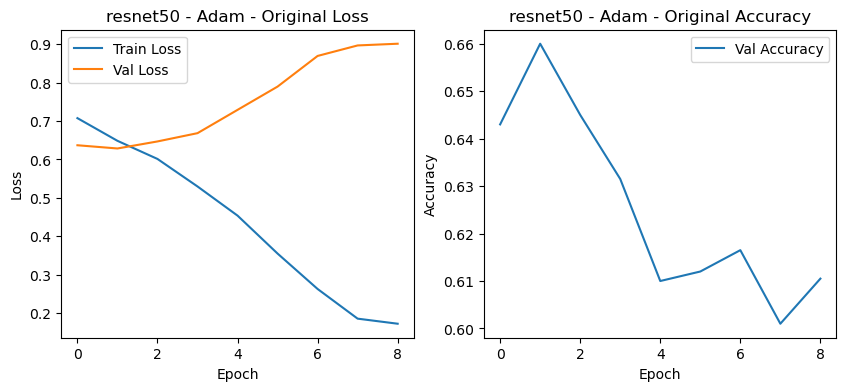

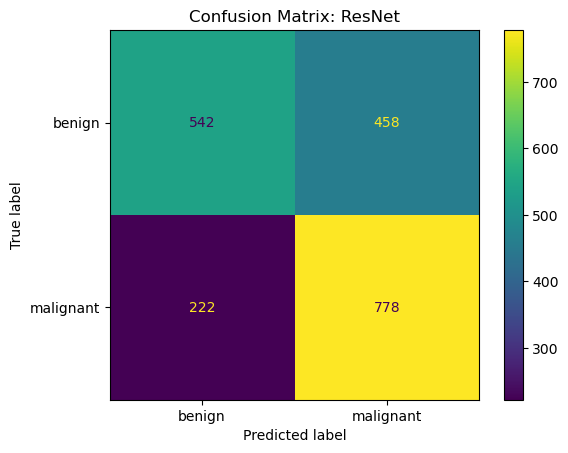

Epoch 0/19
----------
train Loss: 0.7112 Acc: 0.5516
test Loss: 0.6287 Acc: 0.6555
Epoch 0 time: 109.07s
Epoch 1/19
----------
train Loss: 0.6491 Acc: 0.6249
test Loss: 0.6186 Acc: 0.6615
Epoch 1 time: 114.55s
Epoch 2/19
----------
train Loss: 0.6088 Acc: 0.6710
test Loss: 0.6207 Acc: 0.6600
Epoch 2 time: 134.07s
Epoch 3/19
----------
train Loss: 0.5621 Acc: 0.7073
test Loss: 0.6391 Acc: 0.6410
Epoch 3 time: 124.09s
Epoch 4/19
----------
train Loss: 0.5174 Acc: 0.7376
test Loss: 0.6785 Acc: 0.6355
Epoch 4 time: 125.77s
Epoch 5/19
----------
train Loss: 0.4581 Acc: 0.7759
test Loss: 0.6818 Acc: 0.6440
Epoch 5 time: 124.74s
Epoch 6/19
----------
train Loss: 0.3762 Acc: 0.8324
test Loss: 0.7349 Acc: 0.6385
Epoch 6 time: 125.86s
Epoch 7/19
----------
train Loss: 0.3127 Acc: 0.8760
test Loss: 0.7189 Acc: 0.6535
Epoch 7 time: 124.61s
Epoch 8/19
----------
train Loss: 0.3064 Acc: 0.8770
test Loss: 0.7246 Acc: 0.6530
Early stopping triggered
Training complete in 18m 27s
Best val Acc: 0.6615


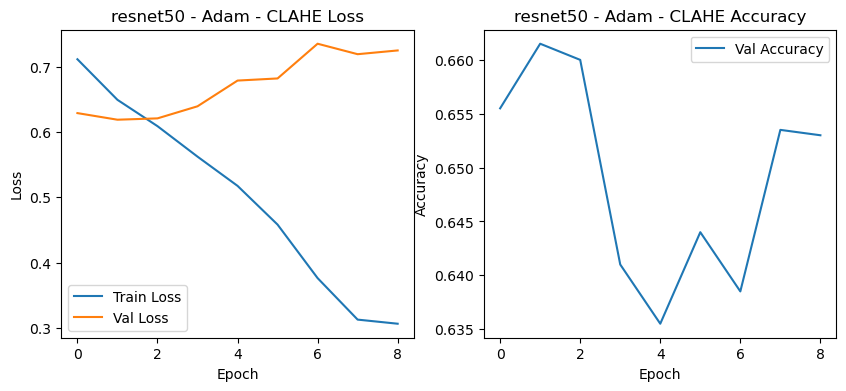

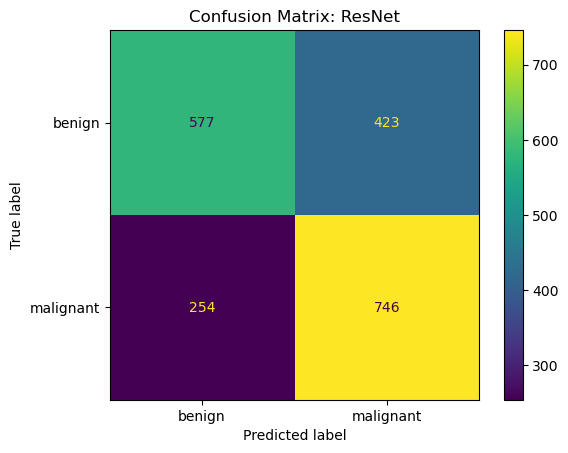

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6850 Acc: 0.5631
test Loss: 0.6357 Acc: 0.6490
Epoch 0 time: 120.56s
Epoch 1/19
----------
train Loss: 0.6312 Acc: 0.6500
test Loss: 0.6224 Acc: 0.6490
Epoch 1 time: 129.23s
Epoch 2/19
----------
train Loss: 0.5855 Acc: 0.6849
test Loss: 0.6336 Acc: 0.6495
Epoch 2 time: 133.41s
Epoch 3/19
----------
train Loss: 0.5352 Acc: 0.7275
test Loss: 0.6494 Acc: 0.6435
Epoch 3 time: 131.16s
Epoch 4/19
----------
train Loss: 0.4698 Acc: 0.7735
test Loss: 0.6836 Acc: 0.6455
Epoch 4 time: 131.21s
Epoch 5/19
----------
train Loss: 0.3902 Acc: 0.8273
test Loss: 0.7184 Acc: 0.6310
Epoch 5 time: 128.32s
Epoch 6/19
----------
train Loss: 0.2988 Acc: 0.8784
test Loss: 0.7811 Acc: 0.6300
Epoch 6 time: 135.29s
Epoch 7/19
----------
train Loss: 0.2222 Acc: 0.9239
test Loss: 0.7847 Acc: 0.6275
Epoch 7 time: 131.53s
Epoch 8/19
----------
train Loss: 0.2149 Acc: 0.9264
test Loss: 0.7893 Acc: 0.

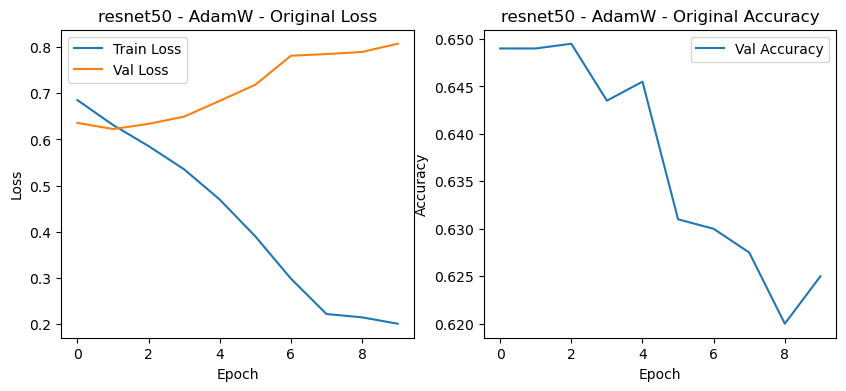

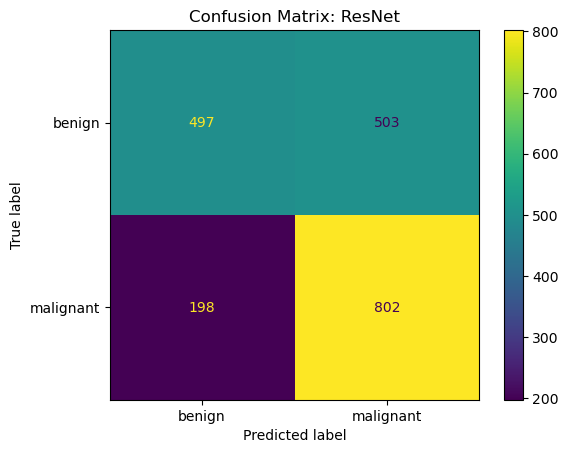

Epoch 0/19
----------
train Loss: 0.6866 Acc: 0.5729
test Loss: 0.6358 Acc: 0.6490
Epoch 0 time: 113.41s
Epoch 1/19
----------
train Loss: 0.6275 Acc: 0.6396
test Loss: 0.6204 Acc: 0.6570
Epoch 1 time: 107.03s
Epoch 2/19
----------
train Loss: 0.5808 Acc: 0.6945
test Loss: 0.6250 Acc: 0.6685
Epoch 2 time: 104.74s
Epoch 3/19
----------
train Loss: 0.5282 Acc: 0.7324
test Loss: 0.6415 Acc: 0.6610
Epoch 3 time: 106.31s
Epoch 4/19
----------
train Loss: 0.4687 Acc: 0.7725
test Loss: 0.6733 Acc: 0.6570
Epoch 4 time: 111.54s
Epoch 5/19
----------
train Loss: 0.3939 Acc: 0.8253
test Loss: 0.7186 Acc: 0.6475
Epoch 5 time: 103.54s
Epoch 6/19
----------
train Loss: 0.2994 Acc: 0.8769
test Loss: 0.7961 Acc: 0.6325
Epoch 6 time: 131.84s
Epoch 7/19
----------
train Loss: 0.2175 Acc: 0.9281
test Loss: 0.8046 Acc: 0.6370
Epoch 7 time: 110.89s
Epoch 8/19
----------
train Loss: 0.2008 Acc: 0.9350
test Loss: 0.8210 Acc: 0.6330
Epoch 8 time: 110.78s
Epoch 9/19
----------
train Loss: 0.1958 Acc: 0.9343
te

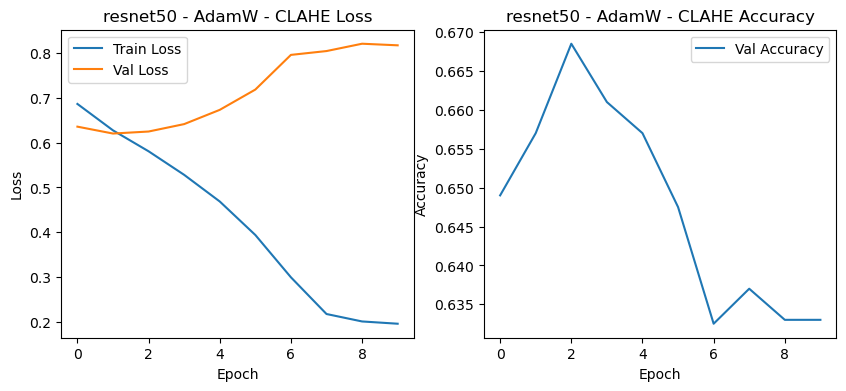

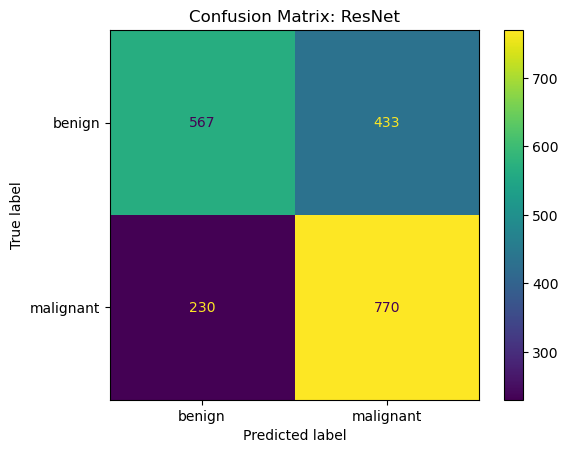

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6948 Acc: 0.5514
test Loss: 0.6375 Acc: 0.6515
Epoch 0 time: 102.13s
Epoch 1/19
----------
train Loss: 0.6371 Acc: 0.6334
test Loss: 0.6193 Acc: 0.6530
Epoch 1 time: 104.22s
Epoch 2/19
----------
train Loss: 0.5888 Acc: 0.6823
test Loss: 0.6236 Acc: 0.6495
Epoch 2 time: 104.38s
Epoch 3/19
----------
train Loss: 0.5207 Acc: 0.7386
test Loss: 0.6536 Acc: 0.6370
Epoch 3 time: 102.39s
Epoch 4/19
----------
train Loss: 0.4475 Acc: 0.7935
test Loss: 0.6926 Acc: 0.6425
Epoch 4 time: 98.31s
Epoch 5/19
----------
train Loss: 0.3510 Acc: 0.8479
test Loss: 0.7373 Acc: 0.6420
Epoch 5 time: 97.26s
Epoch 6/19
----------
train Loss: 0.2481 Acc: 0.9048
test Loss: 0.8210 Acc: 0.6365
Epoch 6 time: 96.46s
Epoch 7/19
----------
train Loss: 0.1735 Acc: 0.9427
test Loss: 0.8284 Acc: 0.6260
Epoch 7 time: 105.39s
Epoch 8/19
----------
train Loss: 0.1638 Acc: 0.9496
test Loss: 0.8461 Acc: 0.622

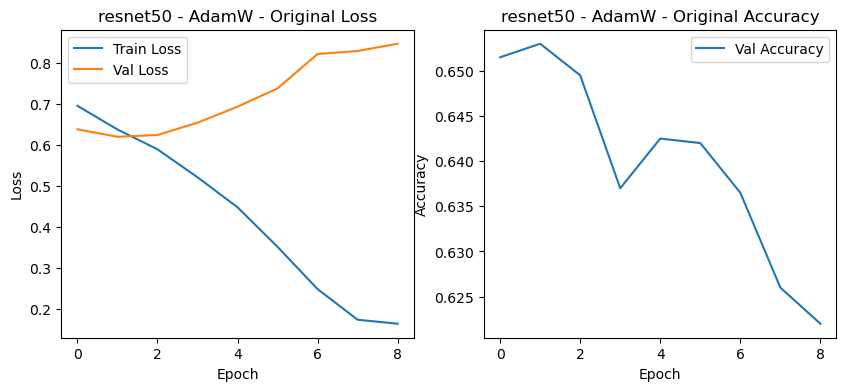

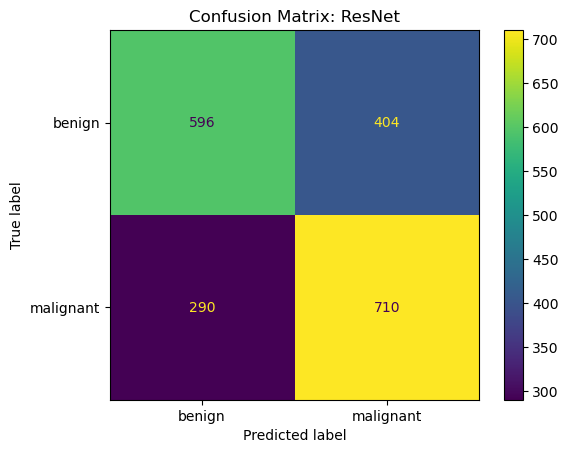

Epoch 0/19
----------
train Loss: 0.6851 Acc: 0.5669
test Loss: 0.6304 Acc: 0.6665
Epoch 0 time: 95.09s
Epoch 1/19
----------
train Loss: 0.6292 Acc: 0.6502
test Loss: 0.6119 Acc: 0.6770
Epoch 1 time: 97.57s
Epoch 2/19
----------
train Loss: 0.5789 Acc: 0.6895
test Loss: 0.6176 Acc: 0.6765
Epoch 2 time: 102.26s
Epoch 3/19
----------
train Loss: 0.5351 Acc: 0.7270
test Loss: 0.6236 Acc: 0.6640
Epoch 3 time: 96.69s
Epoch 4/19
----------
train Loss: 0.4790 Acc: 0.7645
test Loss: 0.6381 Acc: 0.6600
Epoch 4 time: 96.42s
Epoch 5/19
----------
train Loss: 0.4121 Acc: 0.8120
test Loss: 0.6646 Acc: 0.6535
Epoch 5 time: 94.89s
Epoch 6/19
----------
train Loss: 0.3397 Acc: 0.8554
test Loss: 0.7148 Acc: 0.6515
Epoch 6 time: 94.63s
Epoch 7/19
----------
train Loss: 0.2817 Acc: 0.8934
test Loss: 0.7112 Acc: 0.6500
Epoch 7 time: 101.02s
Epoch 8/19
----------
train Loss: 0.2600 Acc: 0.9096
test Loss: 0.7170 Acc: 0.6505
Early stopping triggered
Training complete in 14m 37s
Best val Acc: 0.6770


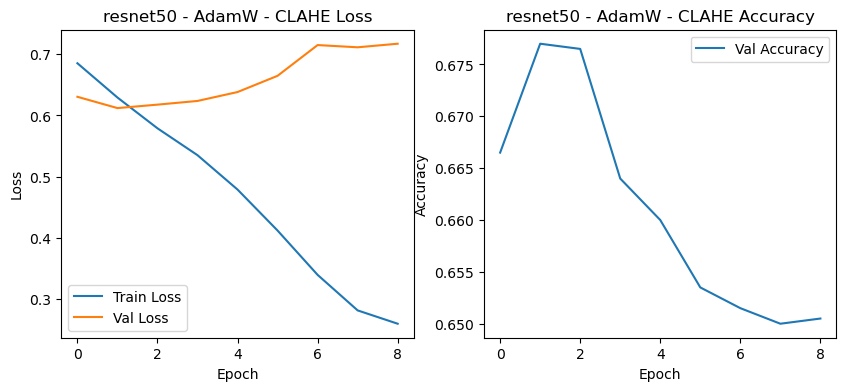

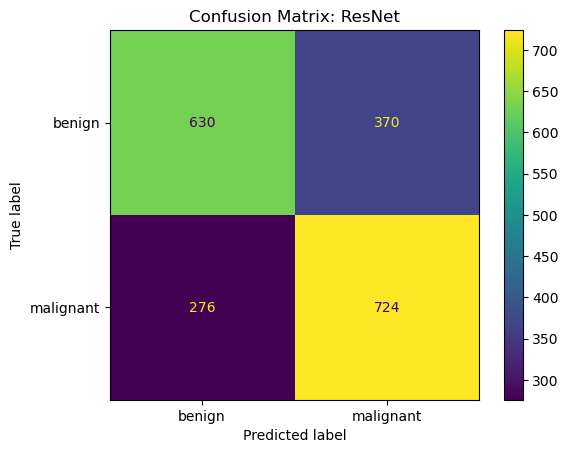

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7255 Acc: 0.5436
test Loss: 0.6610 Acc: 0.6105
Epoch 0 time: 92.45s
Epoch 1/19
----------
train Loss: 0.6677 Acc: 0.6244
test Loss: 0.6350 Acc: 0.6580
Epoch 1 time: 98.69s
Epoch 2/19
----------
train Loss: 0.6040 Acc: 0.6753
test Loss: 0.6428 Acc: 0.6625
Epoch 2 time: 94.11s
Epoch 3/19
----------
train Loss: 0.5357 Acc: 0.7304
test Loss: 0.6527 Acc: 0.6650
Epoch 3 time: 102.68s
Epoch 4/19
----------
train Loss: 0.4347 Acc: 0.7956
test Loss: 0.7286 Acc: 0.6395
Epoch 4 time: 96.74s
Epoch 5/19
----------
train Loss: 0.3266 Acc: 0.8621
test Loss: 0.8139 Acc: 0.6350
Epoch 5 time: 96.59s
Epoch 6/19
----------
train Loss: 0.2243 Acc: 0.9123
test Loss: 0.9498 Acc: 0.6180
Epoch 6 time: 102.46s
Epoch 7/19
----------
train Loss: 0.1535 Acc: 0.9473
test Loss: 0.9133 Acc: 0.6250
Epoch 7 time: 100.30s
Epoch 8/19
----------
train Loss: 0.1339 Acc: 0.9556
test Loss: 0.9258 Acc: 0.6320


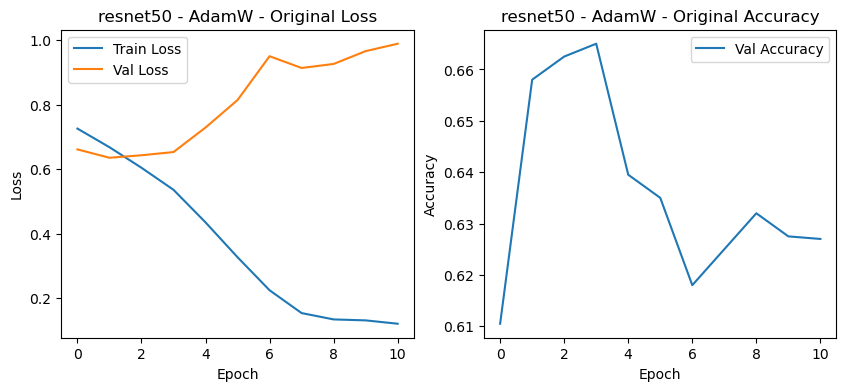

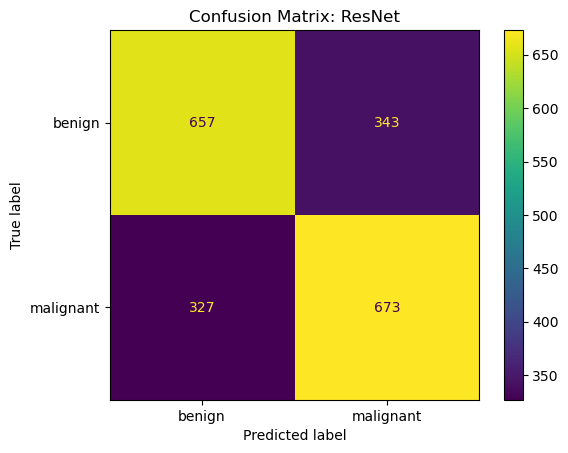

Epoch 0/19
----------
train Loss: 0.7256 Acc: 0.5386
test Loss: 0.6505 Acc: 0.6175
Epoch 0 time: 93.60s
Epoch 1/19
----------
train Loss: 0.6594 Acc: 0.6250
test Loss: 0.6293 Acc: 0.6605
Epoch 1 time: 96.78s
Epoch 2/19
----------
train Loss: 0.5985 Acc: 0.6809
test Loss: 0.6424 Acc: 0.6620
Epoch 2 time: 95.16s
Epoch 3/19
----------
train Loss: 0.5389 Acc: 0.7274
test Loss: 0.6508 Acc: 0.6730
Epoch 3 time: 97.42s
Epoch 4/19
----------
train Loss: 0.4519 Acc: 0.7831
test Loss: 0.7077 Acc: 0.6515
Epoch 4 time: 99.28s
Epoch 5/19
----------
train Loss: 0.3497 Acc: 0.8509
test Loss: 0.7769 Acc: 0.6430
Epoch 5 time: 102.65s
Epoch 6/19
----------
train Loss: 0.2468 Acc: 0.9032
test Loss: 0.8708 Acc: 0.6325
Epoch 6 time: 95.41s
Epoch 7/19
----------
train Loss: 0.1656 Acc: 0.9467
test Loss: 0.8762 Acc: 0.6415
Epoch 7 time: 98.34s
Epoch 8/19
----------
train Loss: 0.1637 Acc: 0.9497
test Loss: 0.8846 Acc: 0.6420
Epoch 8 time: 107.15s
Epoch 9/19
----------
train Loss: 0.1389 Acc: 0.9580
test Loss

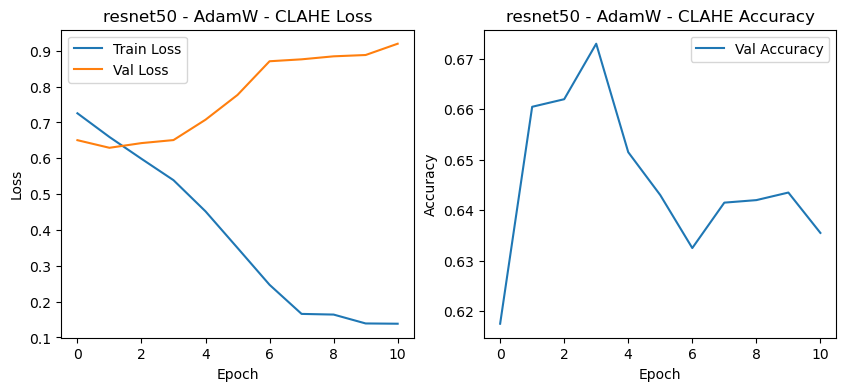

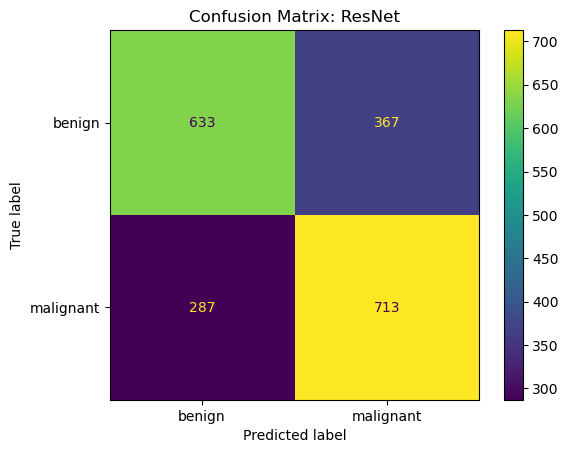

Entrenando resnet50 con AdamW, lr=0.0001, wd=0.001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7205 Acc: 0.5456
test Loss: 0.6517 Acc: 0.6175
Epoch 0 time: 99.53s
Epoch 1/19
----------
train Loss: 0.6611 Acc: 0.6146
test Loss: 0.6430 Acc: 0.6420
Epoch 1 time: 107.37s
Epoch 2/19
----------
train Loss: 0.6178 Acc: 0.6645
test Loss: 0.6398 Acc: 0.6490
Epoch 2 time: 105.03s
Epoch 3/19
----------
train Loss: 0.5574 Acc: 0.7096
test Loss: 0.6503 Acc: 0.6560
Epoch 3 time: 101.30s
Epoch 4/19
----------
train Loss: 0.5017 Acc: 0.7472
test Loss: 0.6823 Acc: 0.6440
Epoch 4 time: 100.03s
Epoch 5/19
----------
train Loss: 0.4140 Acc: 0.8106
test Loss: 0.7371 Acc: 0.6420
Epoch 5 time: 100.73s
Epoch 6/19
----------
train Loss: 0.3170 Acc: 0.8685
test Loss: 0.8135 Acc: 0.6270
Epoch 6 time: 102.58s
Epoch 7/19
----------
train Loss: 0.2347 Acc: 0.9165
test Loss: 0.8154 Acc: 0.6250
Epoch 7 time: 99.97s
Epoch 8/19
----------
train Loss: 0.2253 Acc: 0.9190
test Loss: 0.8235 Acc: 0.62

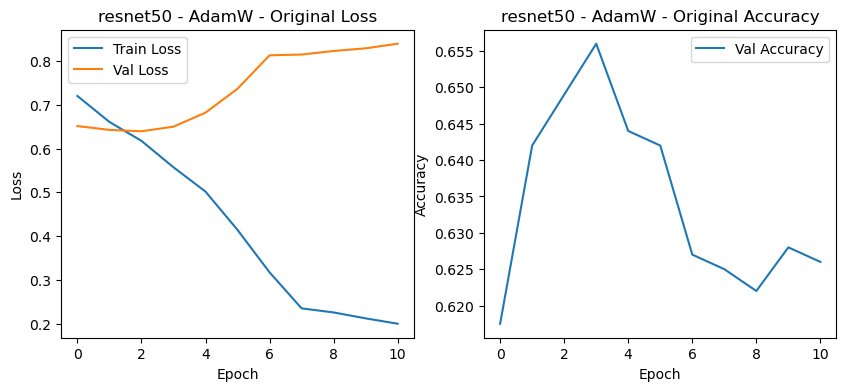

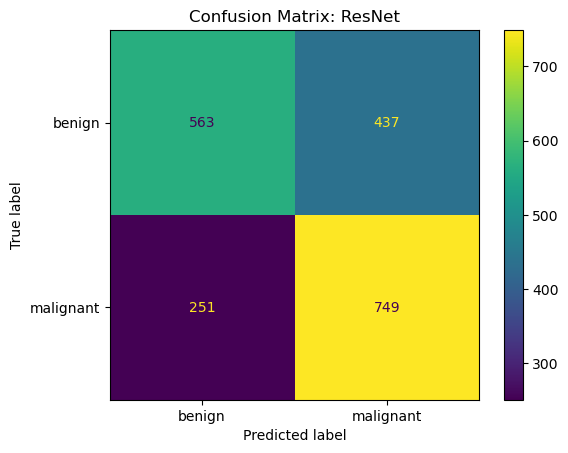

Epoch 0/19
----------
train Loss: 0.7167 Acc: 0.5483
test Loss: 0.6419 Acc: 0.6445
Epoch 0 time: 99.54s
Epoch 1/19
----------
train Loss: 0.6574 Acc: 0.6251
test Loss: 0.6243 Acc: 0.6600
Epoch 1 time: 99.58s
Epoch 2/19
----------
train Loss: 0.5996 Acc: 0.6803
test Loss: 0.6346 Acc: 0.6540
Epoch 2 time: 106.75s
Epoch 3/19
----------
train Loss: 0.5373 Acc: 0.7303
test Loss: 0.6675 Acc: 0.6450
Epoch 3 time: 102.00s
Epoch 4/19
----------
train Loss: 0.4587 Acc: 0.7828
test Loss: 0.7040 Acc: 0.6385
Epoch 4 time: 100.08s
Epoch 5/19
----------
train Loss: 0.3527 Acc: 0.8455
test Loss: 0.7782 Acc: 0.6375
Epoch 5 time: 97.86s
Epoch 6/19
----------
train Loss: 0.2485 Acc: 0.9000
test Loss: 0.9222 Acc: 0.6100
Epoch 6 time: 94.95s
Epoch 7/19
----------
train Loss: 0.1701 Acc: 0.9433
test Loss: 0.8919 Acc: 0.6250
Epoch 7 time: 98.74s
Epoch 8/19
----------
train Loss: 0.1569 Acc: 0.9494
test Loss: 0.8966 Acc: 0.6305
Early stopping triggered
Training complete in 15m 1s
Best val Acc: 0.6600


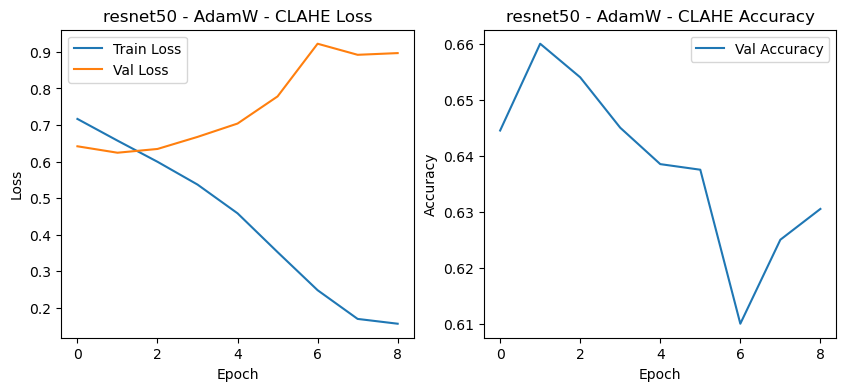

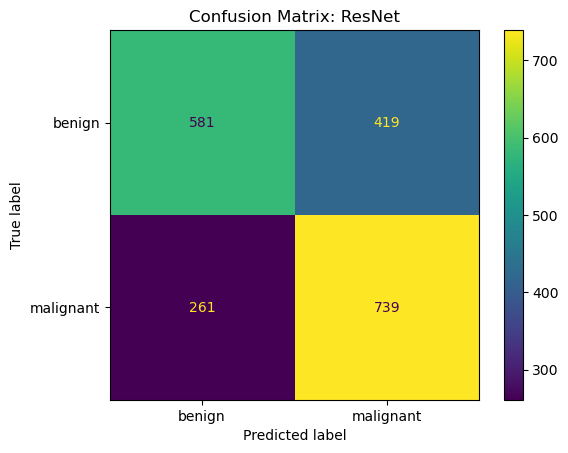

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6243 Acc: 0.6358
test Loss: 0.6562 Acc: 0.6365
Epoch 0 time: 106.95s
Epoch 1/19
----------
train Loss: 0.4549 Acc: 0.7823
test Loss: 0.7488 Acc: 0.6365
Epoch 1 time: 113.94s
Epoch 2/19
----------
train Loss: 0.2631 Acc: 0.8922
test Loss: 0.9112 Acc: 0.6260
Epoch 2 time: 100.29s
Epoch 3/19
----------
train Loss: 0.1365 Acc: 0.9524
test Loss: 1.0139 Acc: 0.6245
Epoch 3 time: 103.67s
Epoch 4/19
----------
train Loss: 0.0801 Acc: 0.9725
test Loss: 1.0683 Acc: 0.6655
Epoch 4 time: 101.76s
Epoch 5/19
----------
train Loss: 0.0657 Acc: 0.9775
test Loss: 1.2518 Acc: 0.6160
Epoch 5 time: 100.56s
Epoch 6/19
----------
train Loss: 0.0489 Acc: 0.9854
test Loss: 1.1735 Acc: 0.6420
Epoch 6 time: 102.05s
Epoch 7/19
----------
train Loss: 0.0348 Acc: 0.9905
test Loss: 1.1634 Acc: 0.6410
Epoch 7 time: 107.34s
Epoch 8/19
----------
train Loss: 0.0286 Acc: 0.9920
test Loss: 1.1820 Acc: 0.63

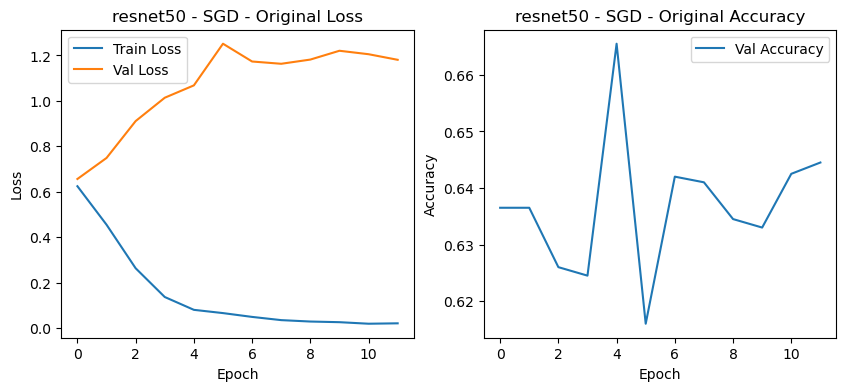

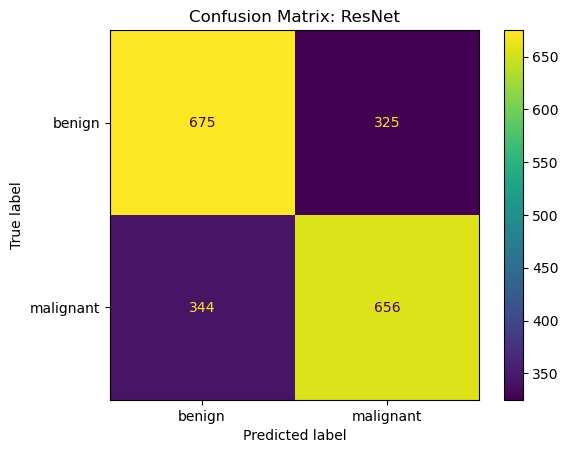

Epoch 0/19
----------
train Loss: 0.6247 Acc: 0.6500
test Loss: 0.6312 Acc: 0.6655
Epoch 0 time: 93.80s
Epoch 1/19
----------
train Loss: 0.4540 Acc: 0.7848
test Loss: 0.7456 Acc: 0.6285
Epoch 1 time: 94.71s
Epoch 2/19
----------
train Loss: 0.2465 Acc: 0.9002
test Loss: 0.8561 Acc: 0.6485
Epoch 2 time: 99.38s
Epoch 3/19
----------
train Loss: 0.1179 Acc: 0.9603
test Loss: 1.1086 Acc: 0.6280
Epoch 3 time: 100.53s
Epoch 4/19
----------
train Loss: 0.0785 Acc: 0.9738
test Loss: 1.0718 Acc: 0.6325
Epoch 4 time: 111.37s
Epoch 5/19
----------
train Loss: 0.0518 Acc: 0.9849
test Loss: 1.1294 Acc: 0.6345
Epoch 5 time: 108.97s
Epoch 6/19
----------
train Loss: 0.0379 Acc: 0.9906
test Loss: 1.1898 Acc: 0.6260
Epoch 6 time: 98.28s
Epoch 7/19
----------
train Loss: 0.0282 Acc: 0.9932
test Loss: 1.1969 Acc: 0.6395
Early stopping triggered
Training complete in 13m 23s
Best val Acc: 0.6655


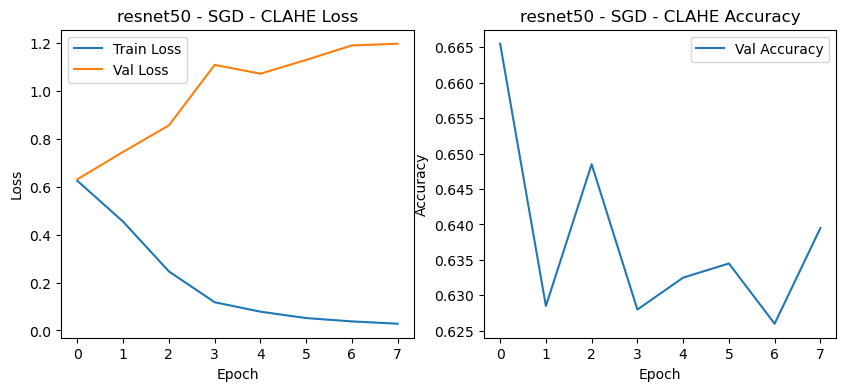

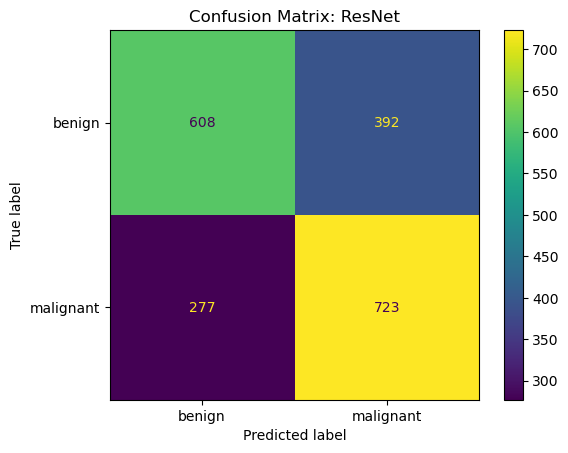

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6245 Acc: 0.6468
test Loss: 0.6624 Acc: 0.6395
Epoch 0 time: 98.59s
Epoch 1/19
----------
train Loss: 0.4483 Acc: 0.7910
test Loss: 0.7179 Acc: 0.6600
Epoch 1 time: 105.19s
Epoch 2/19
----------
train Loss: 0.2471 Acc: 0.8968
test Loss: 0.8887 Acc: 0.6195
Epoch 2 time: 97.55s
Epoch 3/19
----------
train Loss: 0.1300 Acc: 0.9543
test Loss: 1.0265 Acc: 0.6235
Epoch 3 time: 102.48s
Epoch 4/19
----------
train Loss: 0.0837 Acc: 0.9724
test Loss: 1.1682 Acc: 0.6150
Epoch 4 time: 97.85s
Epoch 5/19
----------
train Loss: 0.0719 Acc: 0.9761
test Loss: 1.1795 Acc: 0.6405
Epoch 5 time: 100.44s
Epoch 6/19
----------
train Loss: 0.0464 Acc: 0.9864
test Loss: 1.1049 Acc: 0.6510
Epoch 6 time: 97.89s
Epoch 7/19
----------
train Loss: 0.0350 Acc: 0.9908
test Loss: 1.0813 Acc: 0.6545
Epoch 7 time: 97.82s
Epoch 8/19
----------
train Loss: 0.0256 Acc: 0.9935
test Loss: 1.0388 Acc: 0.6595
Ea

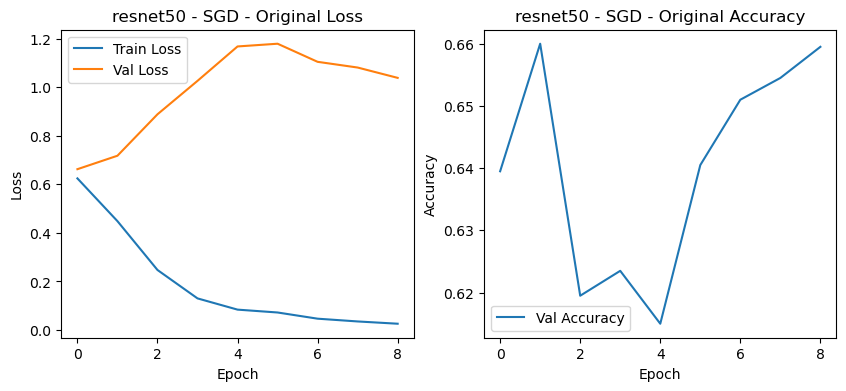

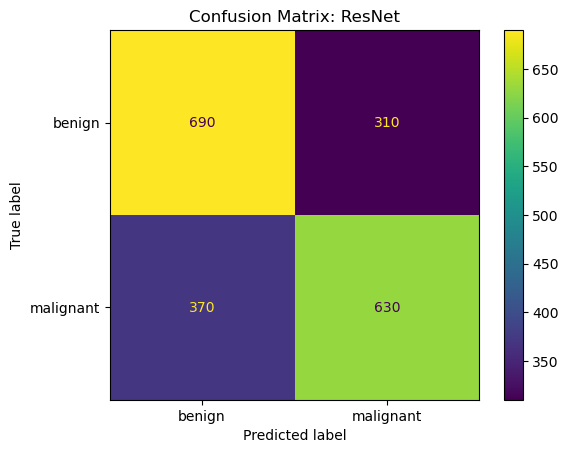

Epoch 0/19
----------
train Loss: 0.6158 Acc: 0.6534
test Loss: 0.6482 Acc: 0.6515
Epoch 0 time: 104.45s
Epoch 1/19
----------
train Loss: 0.4269 Acc: 0.8001
test Loss: 0.7658 Acc: 0.6370
Epoch 1 time: 101.09s
Epoch 2/19
----------
train Loss: 0.2163 Acc: 0.9166
test Loss: 0.9576 Acc: 0.6220
Epoch 2 time: 98.78s
Epoch 3/19
----------
train Loss: 0.1144 Acc: 0.9606
test Loss: 1.0236 Acc: 0.6440
Epoch 3 time: 96.22s
Epoch 4/19
----------
train Loss: 0.0740 Acc: 0.9778
test Loss: 1.1077 Acc: 0.6425
Epoch 4 time: 104.53s
Epoch 5/19
----------
train Loss: 0.0501 Acc: 0.9836
test Loss: 1.1486 Acc: 0.6420
Epoch 5 time: 100.64s
Epoch 6/19
----------
train Loss: 0.0429 Acc: 0.9870
test Loss: 1.2377 Acc: 0.6380
Epoch 6 time: 100.70s
Epoch 7/19
----------
train Loss: 0.0283 Acc: 0.9928
test Loss: 1.1784 Acc: 0.6305
Early stopping triggered
Training complete in 13m 25s
Best val Acc: 0.6515


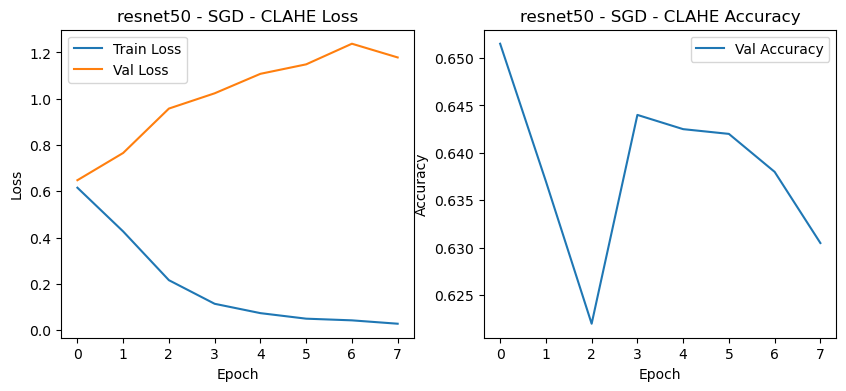

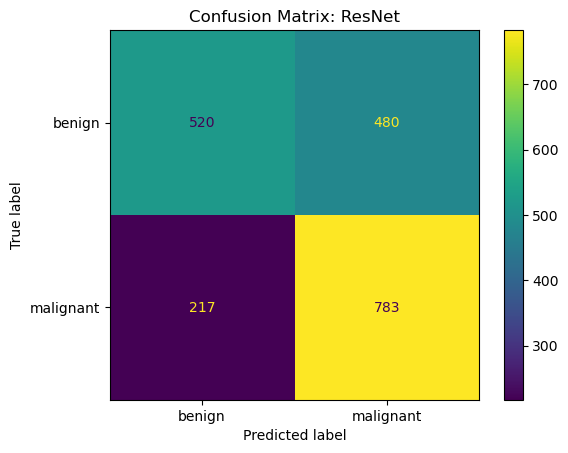

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6612 Acc: 0.6189
test Loss: 0.6419 Acc: 0.6390
Epoch 0 time: 99.82s
Epoch 1/19
----------
train Loss: 0.4832 Acc: 0.7649
test Loss: 0.7145 Acc: 0.6655
Epoch 1 time: 102.96s
Epoch 2/19
----------
train Loss: 0.2897 Acc: 0.8776
test Loss: 0.8666 Acc: 0.6460
Epoch 2 time: 102.90s
Epoch 3/19
----------
train Loss: 0.1487 Acc: 0.9453
test Loss: 1.0701 Acc: 0.6340
Epoch 3 time: 99.87s
Epoch 4/19
----------
train Loss: 0.0766 Acc: 0.9755
test Loss: 1.2415 Acc: 0.6245
Epoch 4 time: 100.80s
Epoch 5/19
----------
train Loss: 0.0702 Acc: 0.9761
test Loss: 1.1501 Acc: 0.6410
Epoch 5 time: 106.60s
Epoch 6/19
----------
train Loss: 0.0634 Acc: 0.9775
test Loss: 1.4098 Acc: 0.6150
Epoch 6 time: 108.19s
Epoch 7/19
----------
train Loss: 0.0404 Acc: 0.9890
test Loss: 1.2042 Acc: 0.6420
Epoch 7 time: 99.87s
Epoch 8/19
----------
train Loss: 0.0244 Acc: 0.9948
test Loss: 1.2149 Acc: 0.6390


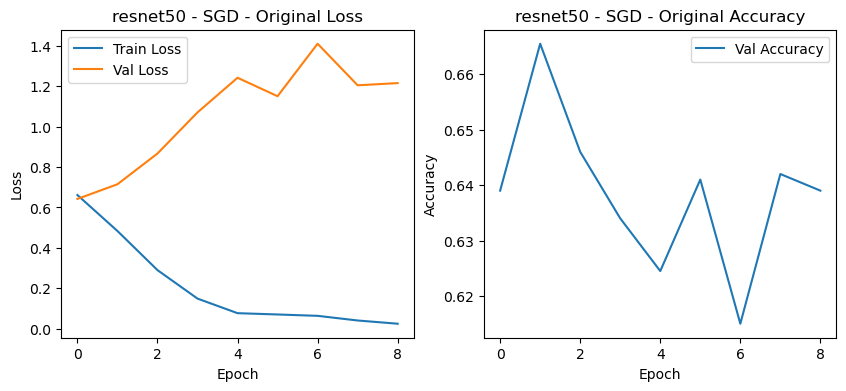

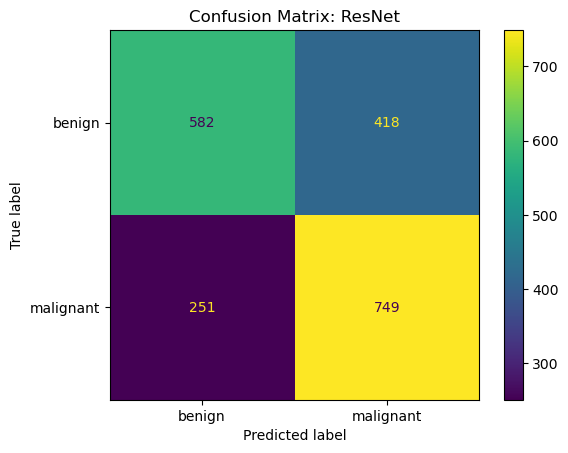

Epoch 0/19
----------
train Loss: 0.6534 Acc: 0.6339
test Loss: 0.6405 Acc: 0.6530
Epoch 0 time: 102.17s
Epoch 1/19
----------
train Loss: 0.4384 Acc: 0.7936
test Loss: 0.8009 Acc: 0.6210
Epoch 1 time: 99.95s
Epoch 2/19
----------
train Loss: 0.2101 Acc: 0.9175
test Loss: 0.9735 Acc: 0.6405
Epoch 2 time: 97.83s
Epoch 3/19
----------
train Loss: 0.1094 Acc: 0.9621
test Loss: 1.1600 Acc: 0.6305
Epoch 3 time: 100.39s
Epoch 4/19
----------
train Loss: 0.0839 Acc: 0.9703
test Loss: 1.1163 Acc: 0.6445
Epoch 4 time: 104.04s
Epoch 5/19
----------
train Loss: 0.0569 Acc: 0.9828
test Loss: 1.1376 Acc: 0.6465
Epoch 5 time: 102.70s
Epoch 6/19
----------
train Loss: 0.0519 Acc: 0.9823
test Loss: 1.1901 Acc: 0.6560
Epoch 6 time: 105.28s
Epoch 7/19
----------
train Loss: 0.0338 Acc: 0.9901
test Loss: 1.1306 Acc: 0.6500
Epoch 7 time: 100.58s
Epoch 8/19
----------
train Loss: 0.0246 Acc: 0.9946
test Loss: 1.1481 Acc: 0.6495
Epoch 8 time: 99.69s
Epoch 9/19
----------
train Loss: 0.0240 Acc: 0.9936
test 

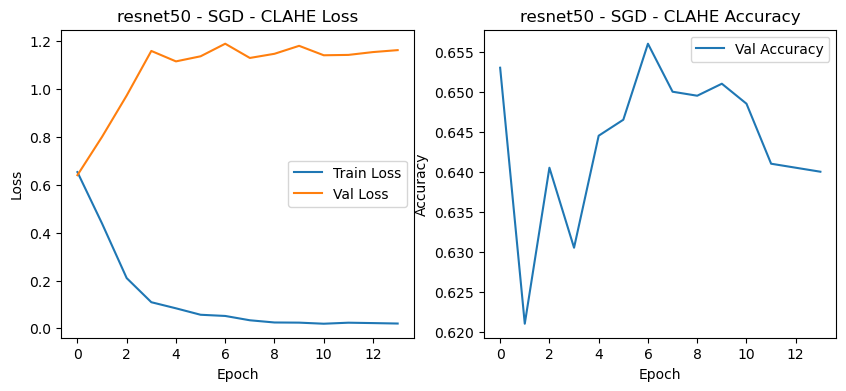

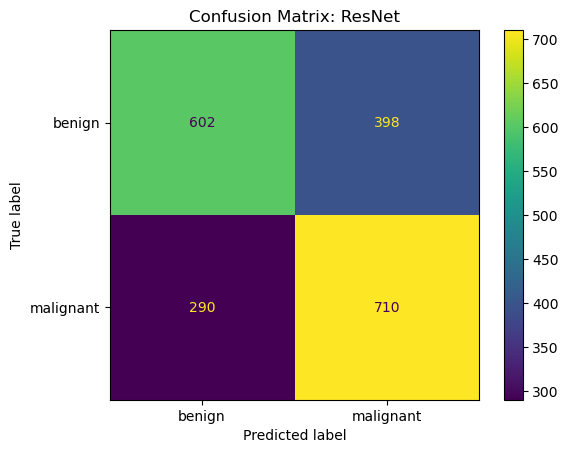

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6461 Acc: 0.6311
test Loss: 0.6624 Acc: 0.6420
Epoch 0 time: 103.17s
Epoch 1/19
----------
train Loss: 0.4659 Acc: 0.7740
test Loss: 0.7201 Acc: 0.6450
Epoch 1 time: 102.37s
Epoch 2/19
----------
train Loss: 0.2670 Acc: 0.8895
test Loss: 0.9565 Acc: 0.6235
Epoch 2 time: 104.20s
Epoch 3/19
----------
train Loss: 0.1551 Acc: 0.9419
test Loss: 1.0589 Acc: 0.6145
Epoch 3 time: 97.59s
Epoch 4/19
----------
train Loss: 0.0924 Acc: 0.9684
test Loss: 1.1594 Acc: 0.6305
Epoch 4 time: 93.76s
Epoch 5/19
----------
train Loss: 0.0669 Acc: 0.9754
test Loss: 1.4302 Acc: 0.5950
Epoch 5 time: 123.90s
Epoch 6/19
----------
train Loss: 0.0621 Acc: 0.9791
test Loss: 1.2774 Acc: 0.6240
Epoch 6 time: 94.73s
Epoch 7/19
----------
train Loss: 0.0383 Acc: 0.9899
test Loss: 1.2452 Acc: 0.6440
Epoch 7 time: 104.38s
Epoch 8/19
----------
train Loss: 0.0309 Acc: 0.9926
test Loss: 1.2236 Acc: 0.6410


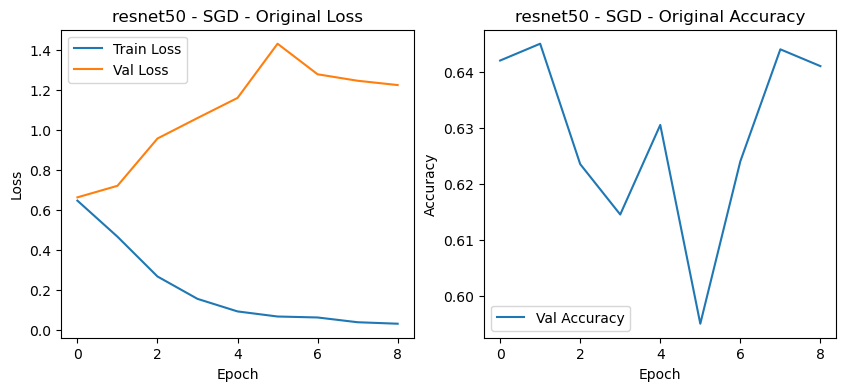

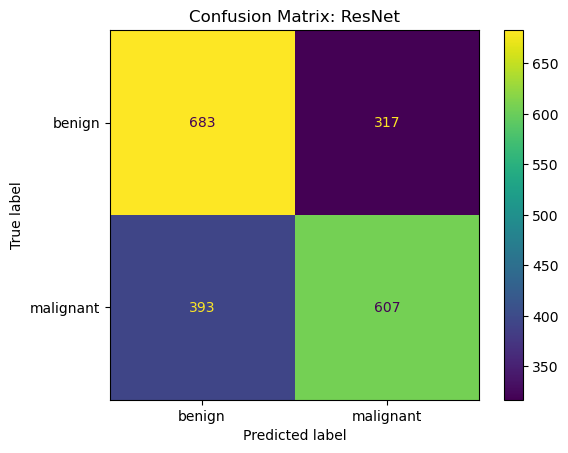

Epoch 0/19
----------
train Loss: 0.6556 Acc: 0.6280
test Loss: 0.6452 Acc: 0.6650
Epoch 0 time: 123.38s
Epoch 1/19
----------
train Loss: 0.4545 Acc: 0.7826
test Loss: 0.7719 Acc: 0.6345
Epoch 1 time: 101.21s
Epoch 2/19
----------
train Loss: 0.2160 Acc: 0.9155
test Loss: 0.9412 Acc: 0.6320
Epoch 2 time: 93.09s
Epoch 3/19
----------
train Loss: 0.1207 Acc: 0.9561
test Loss: 1.1283 Acc: 0.6390
Epoch 3 time: 93.27s
Epoch 4/19
----------
train Loss: 0.0825 Acc: 0.9718
test Loss: 1.2434 Acc: 0.6270
Epoch 4 time: 91.65s
Epoch 5/19
----------
train Loss: 0.0634 Acc: 0.9808
test Loss: 1.2324 Acc: 0.6550
Epoch 5 time: 92.62s
Epoch 6/19
----------
train Loss: 0.0406 Acc: 0.9880
test Loss: 1.2382 Acc: 0.6170
Epoch 6 time: 92.21s
Epoch 7/19
----------
train Loss: 0.0292 Acc: 0.9924
test Loss: 1.1750 Acc: 0.6390
Early stopping triggered
Training complete in 13m 3s
Best val Acc: 0.6650


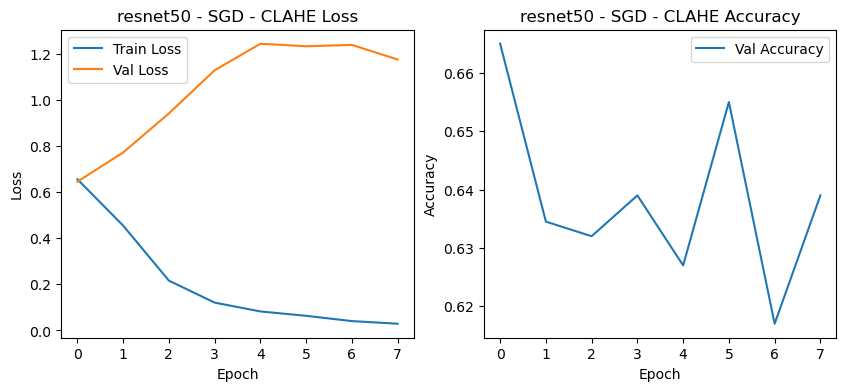

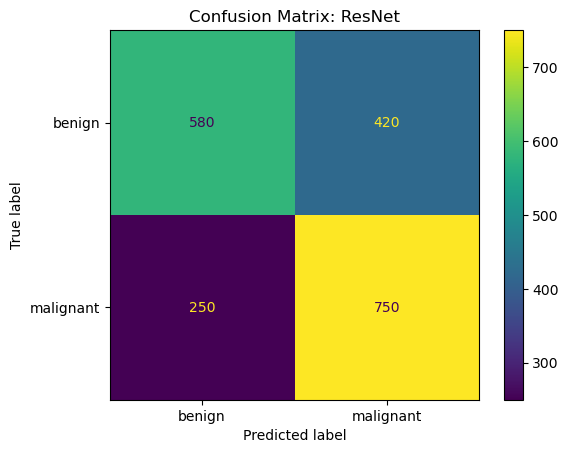

Entrenando resnet50 con Adam, lr=0.001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6426 Acc: 0.6354
test Loss: 0.6675 Acc: 0.6155
Epoch 0 time: 94.07s
Epoch 1/19
----------
train Loss: 0.4420 Acc: 0.7914
test Loss: 0.8899 Acc: 0.5960
Epoch 1 time: 93.19s
Epoch 2/19
----------
train Loss: 0.2408 Acc: 0.9022
test Loss: 0.9786 Acc: 0.6050
Epoch 2 time: 92.33s
Epoch 3/19
----------
train Loss: 0.1232 Acc: 0.9526
test Loss: 1.1017 Acc: 0.6210
Epoch 3 time: 92.29s
Epoch 4/19
----------
train Loss: 0.0880 Acc: 0.9691
test Loss: 1.1331 Acc: 0.6245
Epoch 4 time: 91.19s
Epoch 5/19
----------
train Loss: 0.0565 Acc: 0.9829
test Loss: 1.2546 Acc: 0.6450
Epoch 5 time: 92.07s
Epoch 6/19
----------
train Loss: 0.0542 Acc: 0.9814
test Loss: 1.3294 Acc: 0.6235
Epoch 6 time: 92.07s
Epoch 7/19
----------
train Loss: 0.0374 Acc: 0.9881
test Loss: 1.2077 Acc: 0.6295
Epoch 7 time: 93.53s
Epoch 8/19
----------
train Loss: 0.0304 Acc: 0.9922
test Loss: 1.2210 Acc: 0.6305
Epoc

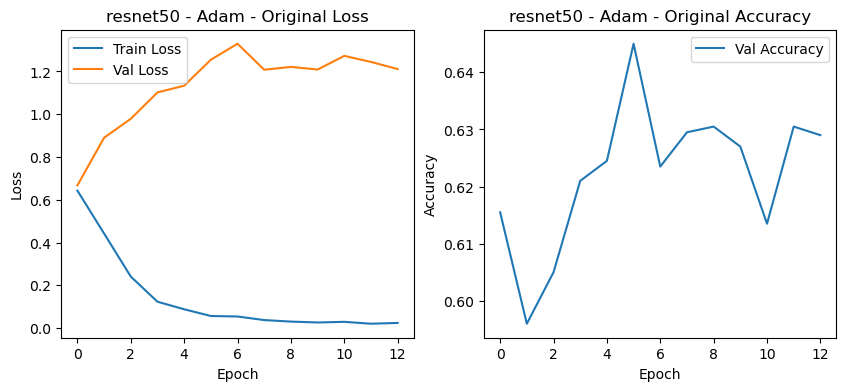

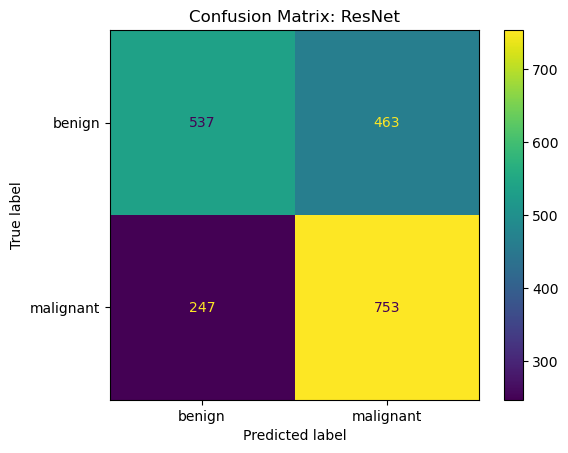

Epoch 0/19
----------
train Loss: 0.6189 Acc: 0.6548
test Loss: 0.6325 Acc: 0.6525
Epoch 0 time: 90.84s
Epoch 1/19
----------
train Loss: 0.4129 Acc: 0.8065
test Loss: 0.7272 Acc: 0.6470
Epoch 1 time: 93.60s
Epoch 2/19
----------
train Loss: 0.2016 Acc: 0.9223
test Loss: 0.9194 Acc: 0.6380
Epoch 2 time: 93.11s
Epoch 3/19
----------
train Loss: 0.1127 Acc: 0.9594
test Loss: 0.9812 Acc: 0.6610
Epoch 3 time: 92.82s
Epoch 4/19
----------
train Loss: 0.0700 Acc: 0.9770
test Loss: 1.1270 Acc: 0.6230
Epoch 4 time: 91.71s
Epoch 5/19
----------
train Loss: 0.0646 Acc: 0.9784
test Loss: 1.1240 Acc: 0.6350
Epoch 5 time: 91.49s
Epoch 6/19
----------
train Loss: 0.0475 Acc: 0.9851
test Loss: 1.0615 Acc: 0.6600
Epoch 6 time: 95.55s
Epoch 7/19
----------
train Loss: 0.0327 Acc: 0.9908
test Loss: 1.0429 Acc: 0.6455
Epoch 7 time: 94.34s
Epoch 8/19
----------
train Loss: 0.0278 Acc: 0.9918
test Loss: 1.0544 Acc: 0.6520
Epoch 8 time: 92.62s
Epoch 9/19
----------
train Loss: 0.0211 Acc: 0.9960
test Loss: 

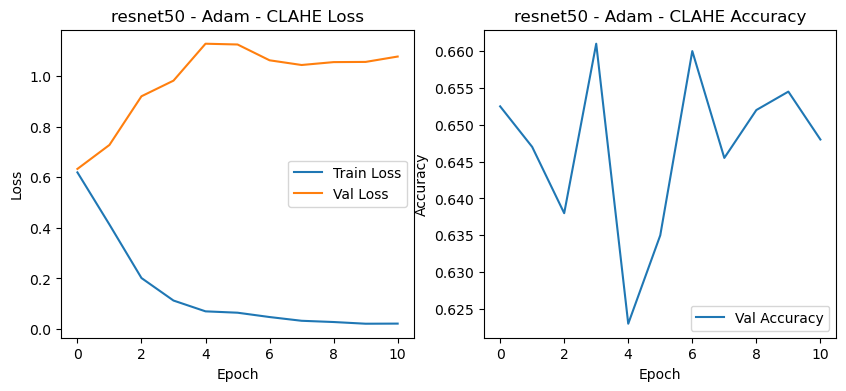

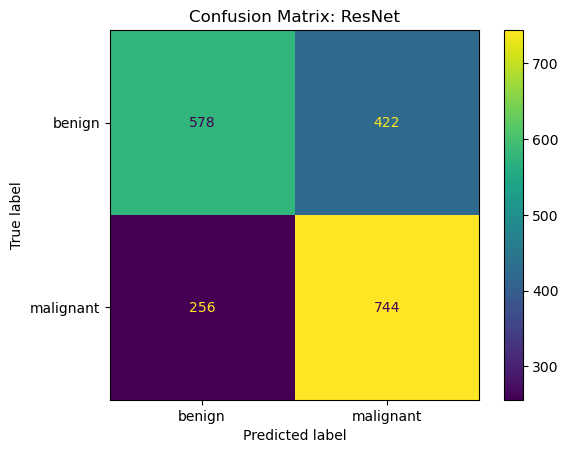

Entrenando resnet50 con Adam, lr=0.001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6310 Acc: 0.6375
test Loss: 0.6594 Acc: 0.6360
Epoch 0 time: 90.36s
Epoch 1/19
----------
train Loss: 0.4320 Acc: 0.7946
test Loss: 0.8098 Acc: 0.6335
Epoch 1 time: 93.74s
Epoch 2/19
----------
train Loss: 0.2403 Acc: 0.9034
test Loss: 0.9413 Acc: 0.6160
Epoch 2 time: 92.58s
Epoch 3/19
----------
train Loss: 0.1251 Acc: 0.9561
test Loss: 1.0927 Acc: 0.6210
Epoch 3 time: 91.99s
Epoch 4/19
----------
train Loss: 0.0791 Acc: 0.9743
test Loss: 1.1007 Acc: 0.6085
Epoch 4 time: 94.14s
Epoch 5/19
----------
train Loss: 0.0623 Acc: 0.9795
test Loss: 1.2361 Acc: 0.6210
Epoch 5 time: 95.83s
Epoch 6/19
----------
train Loss: 0.0546 Acc: 0.9820
test Loss: 1.2348 Acc: 0.6300
Epoch 6 time: 97.75s
Epoch 7/19
----------
train Loss: 0.0345 Acc: 0.9911
test Loss: 1.1806 Acc: 0.6450
Epoch 7 time: 103.48s
Epoch 8/19
----------
train Loss: 0.0297 Acc: 0.9926
test Loss: 1.2163 Acc: 0.6410
Epo

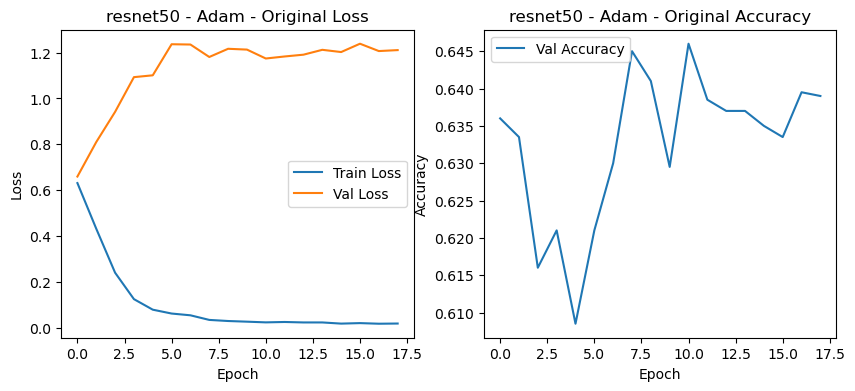

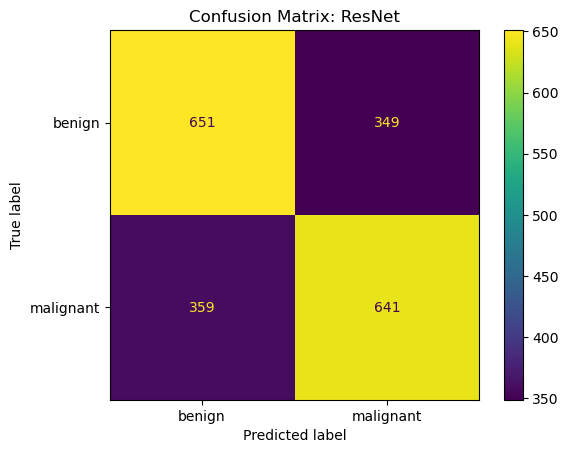

Epoch 0/19
----------
train Loss: 0.6165 Acc: 0.6486
test Loss: 0.6475 Acc: 0.6575
Epoch 0 time: 91.33s
Epoch 1/19
----------
train Loss: 0.4369 Acc: 0.7929
test Loss: 0.7106 Acc: 0.6675
Epoch 1 time: 92.23s
Epoch 2/19
----------
train Loss: 0.2350 Acc: 0.9079
test Loss: 0.8657 Acc: 0.6505
Epoch 2 time: 93.34s
Epoch 3/19
----------
train Loss: 0.1095 Acc: 0.9639
test Loss: 1.0425 Acc: 0.6570
Epoch 3 time: 92.92s
Epoch 4/19
----------
train Loss: 0.0654 Acc: 0.9791
test Loss: 1.1034 Acc: 0.6620
Epoch 4 time: 91.98s
Epoch 5/19
----------
train Loss: 0.0444 Acc: 0.9890
test Loss: 1.1866 Acc: 0.6345
Epoch 5 time: 95.13s
Epoch 6/19
----------
train Loss: 0.0437 Acc: 0.9878
test Loss: 1.2177 Acc: 0.6485
Epoch 6 time: 95.86s
Epoch 7/19
----------
train Loss: 0.0281 Acc: 0.9932
test Loss: 1.1189 Acc: 0.6425
Epoch 7 time: 92.72s
Epoch 8/19
----------
train Loss: 0.0209 Acc: 0.9959
test Loss: 1.1053 Acc: 0.6540
Early stopping triggered
Training complete in 13m 58s
Best val Acc: 0.6675


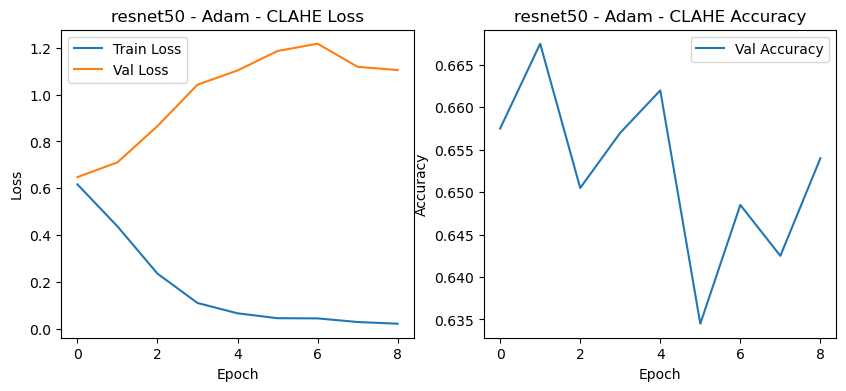

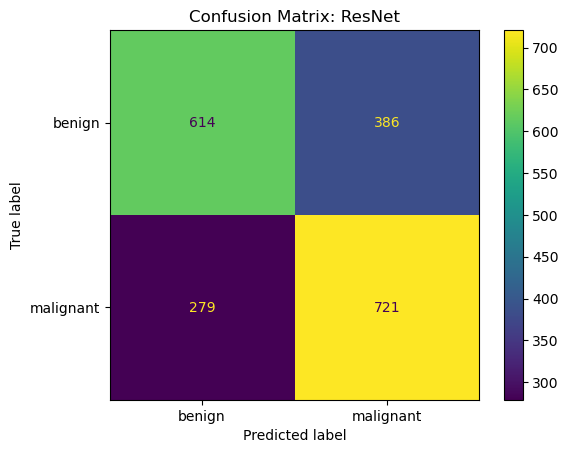

Entrenando resnet50 con Adam, lr=0.001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6456 Acc: 0.6390
test Loss: 0.6387 Acc: 0.6480
Epoch 0 time: 91.40s
Epoch 1/19
----------
train Loss: 0.4820 Acc: 0.7685
test Loss: 0.7363 Acc: 0.6390
Epoch 1 time: 98.12s
Epoch 2/19
----------
train Loss: 0.2755 Acc: 0.8851
test Loss: 0.8914 Acc: 0.6170
Epoch 2 time: 93.99s
Epoch 3/19
----------
train Loss: 0.1393 Acc: 0.9505
test Loss: 0.9861 Acc: 0.6095
Epoch 3 time: 92.44s
Epoch 4/19
----------
train Loss: 0.0989 Acc: 0.9646
test Loss: 1.1170 Acc: 0.6240
Epoch 4 time: 92.68s
Epoch 5/19
----------
train Loss: 0.0690 Acc: 0.9774
test Loss: 1.1437 Acc: 0.6245
Epoch 5 time: 93.70s
Epoch 6/19
----------
train Loss: 0.0584 Acc: 0.9805
test Loss: 1.2790 Acc: 0.6290
Epoch 6 time: 94.42s
Epoch 7/19
----------
train Loss: 0.0354 Acc: 0.9905
test Loss: 1.1463 Acc: 0.6315
Early stopping triggered
Training complete in 12m 29s
Best val Acc: 0.6480


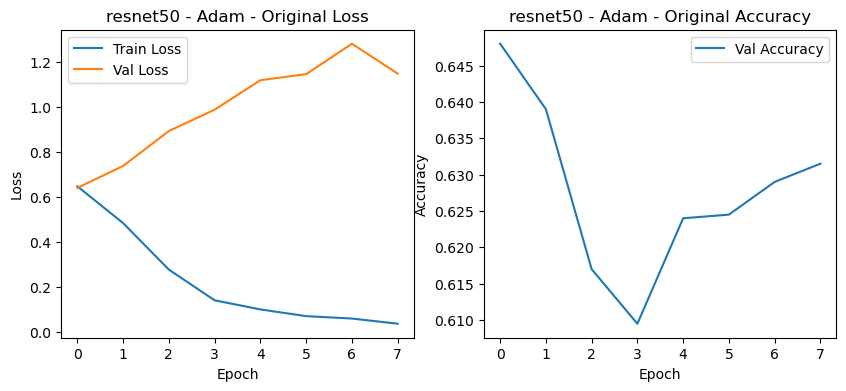

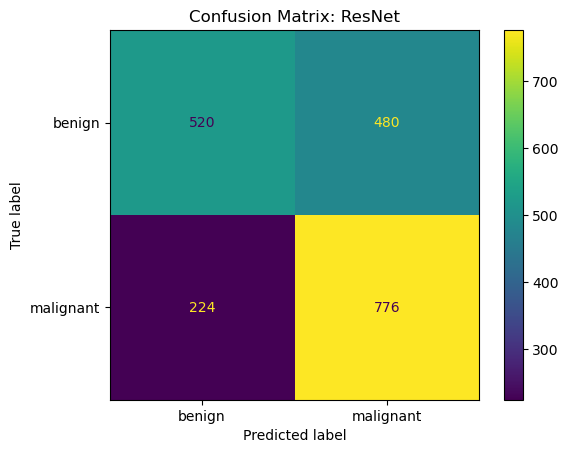

Epoch 0/19
----------
train Loss: 0.6516 Acc: 0.6306
test Loss: 0.6404 Acc: 0.6610
Epoch 0 time: 91.32s
Epoch 1/19
----------
train Loss: 0.4578 Acc: 0.7799
test Loss: 0.7491 Acc: 0.6345
Epoch 1 time: 91.81s
Epoch 2/19
----------
train Loss: 0.2377 Acc: 0.9035
test Loss: 0.9107 Acc: 0.6030
Epoch 2 time: 91.95s
Epoch 3/19
----------
train Loss: 0.1150 Acc: 0.9577
test Loss: 1.0621 Acc: 0.6230
Epoch 3 time: 91.57s
Epoch 4/19
----------
train Loss: 0.0825 Acc: 0.9720
test Loss: 1.1630 Acc: 0.6250
Epoch 4 time: 91.60s
Epoch 5/19
----------
train Loss: 0.0572 Acc: 0.9819
test Loss: 1.1366 Acc: 0.6480
Epoch 5 time: 92.02s
Epoch 6/19
----------
train Loss: 0.0521 Acc: 0.9824
test Loss: 1.1140 Acc: 0.6665
Epoch 6 time: 92.31s
Epoch 7/19
----------
train Loss: 0.0356 Acc: 0.9901
test Loss: 1.0828 Acc: 0.6600
Epoch 7 time: 94.34s
Epoch 8/19
----------
train Loss: 0.0259 Acc: 0.9934
test Loss: 1.1267 Acc: 0.6470
Epoch 8 time: 94.05s
Epoch 9/19
----------
train Loss: 0.0271 Acc: 0.9936
test Loss: 

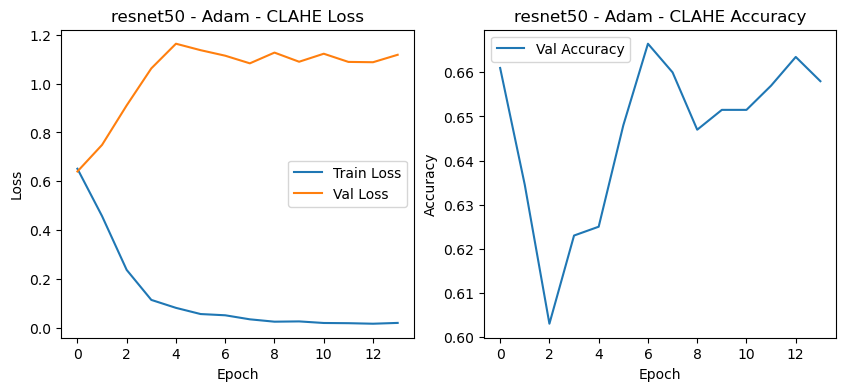

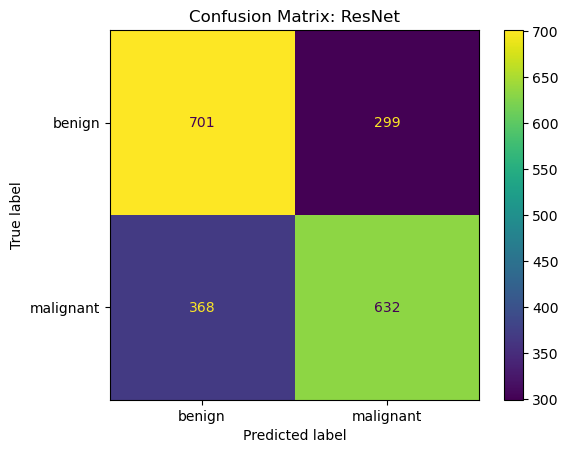

Entrenando resnet50 con Adam, lr=0.001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6599 Acc: 0.6251
test Loss: 0.6482 Acc: 0.6520
Epoch 0 time: 91.10s
Epoch 1/19
----------
train Loss: 0.4683 Acc: 0.7760
test Loss: 0.7117 Acc: 0.6610
Epoch 1 time: 93.41s
Epoch 2/19
----------
train Loss: 0.2596 Acc: 0.8916
test Loss: 0.9544 Acc: 0.6235
Epoch 2 time: 96.44s
Epoch 3/19
----------
train Loss: 0.1420 Acc: 0.9440
test Loss: 1.0516 Acc: 0.6450
Epoch 3 time: 94.83s
Epoch 4/19
----------
train Loss: 0.0982 Acc: 0.9627
test Loss: 1.1273 Acc: 0.6300
Epoch 4 time: 93.20s
Epoch 5/19
----------
train Loss: 0.0632 Acc: 0.9794
test Loss: 1.2339 Acc: 0.6390
Epoch 5 time: 91.74s
Epoch 6/19
----------
train Loss: 0.0534 Acc: 0.9835
test Loss: 1.2310 Acc: 0.6305
Epoch 6 time: 92.59s
Epoch 7/19
----------
train Loss: 0.0359 Acc: 0.9891
test Loss: 1.1920 Acc: 0.6395
Epoch 7 time: 93.36s
Epoch 8/19
----------
train Loss: 0.0288 Acc: 0.9935
test Loss: 1.1971 Acc: 0.6425
Earl

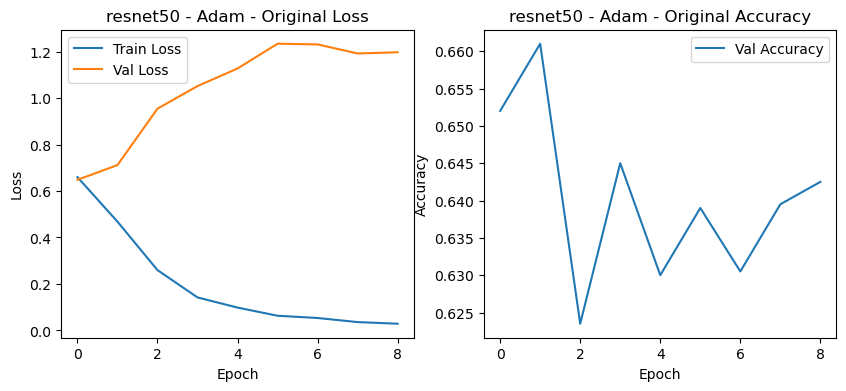

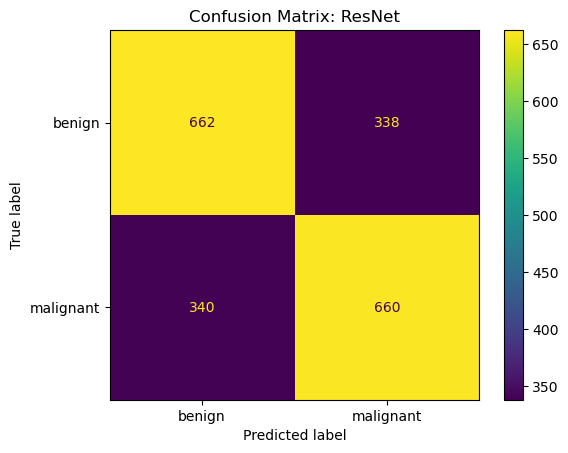

Epoch 0/19
----------
train Loss: 0.6425 Acc: 0.6392
test Loss: 0.6299 Acc: 0.6705
Epoch 0 time: 98.86s
Epoch 1/19
----------
train Loss: 0.4584 Acc: 0.7811
test Loss: 0.7407 Acc: 0.6320
Epoch 1 time: 97.06s
Epoch 2/19
----------
train Loss: 0.2522 Acc: 0.8986
test Loss: 0.9083 Acc: 0.6505
Epoch 2 time: 99.90s
Epoch 3/19
----------
train Loss: 0.1207 Acc: 0.9557
test Loss: 1.0740 Acc: 0.6300
Epoch 3 time: 102.73s
Epoch 4/19
----------
train Loss: 0.0787 Acc: 0.9739
test Loss: 1.1287 Acc: 0.6335
Epoch 4 time: 98.01s
Epoch 5/19
----------
train Loss: 0.0684 Acc: 0.9766
test Loss: 1.0692 Acc: 0.6590
Epoch 5 time: 100.09s
Epoch 6/19
----------
train Loss: 0.0452 Acc: 0.9866
test Loss: 1.1626 Acc: 0.6395
Epoch 6 time: 98.39s
Epoch 7/19
----------
train Loss: 0.0323 Acc: 0.9911
test Loss: 1.1454 Acc: 0.6455
Early stopping triggered
Training complete in 13m 15s
Best val Acc: 0.6705


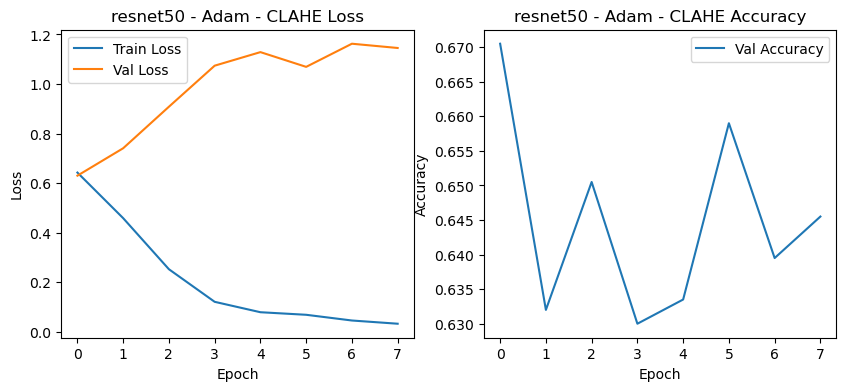

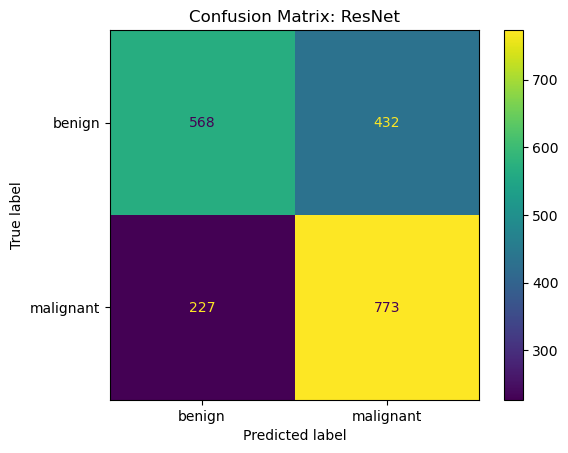

Entrenando resnet50 con AdamW, lr=0.001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6201 Acc: 0.6528
test Loss: 0.6812 Acc: 0.6380
Epoch 0 time: 96.28s
Epoch 1/19
----------
train Loss: 0.4174 Acc: 0.8081
test Loss: 0.8130 Acc: 0.6145
Epoch 1 time: 99.85s
Epoch 2/19
----------
train Loss: 0.2230 Acc: 0.9088
test Loss: 0.9248 Acc: 0.6285
Epoch 2 time: 98.25s
Epoch 3/19
----------
train Loss: 0.1269 Acc: 0.9565
test Loss: 1.1161 Acc: 0.6435
Epoch 3 time: 101.18s
Epoch 4/19
----------
train Loss: 0.0792 Acc: 0.9728
test Loss: 1.2420 Acc: 0.6070
Epoch 4 time: 101.68s
Epoch 5/19
----------
train Loss: 0.0775 Acc: 0.9738
test Loss: 1.2624 Acc: 0.6225
Epoch 5 time: 98.34s
Epoch 6/19
----------
train Loss: 0.0519 Acc: 0.9838
test Loss: 1.2080 Acc: 0.6280
Epoch 6 time: 98.66s
Epoch 7/19
----------
train Loss: 0.0362 Acc: 0.9888
test Loss: 1.1731 Acc: 0.6285
Epoch 7 time: 98.95s
Epoch 8/19
----------
train Loss: 0.0321 Acc: 0.9908
test Loss: 1.1619 Acc: 0.6365
E

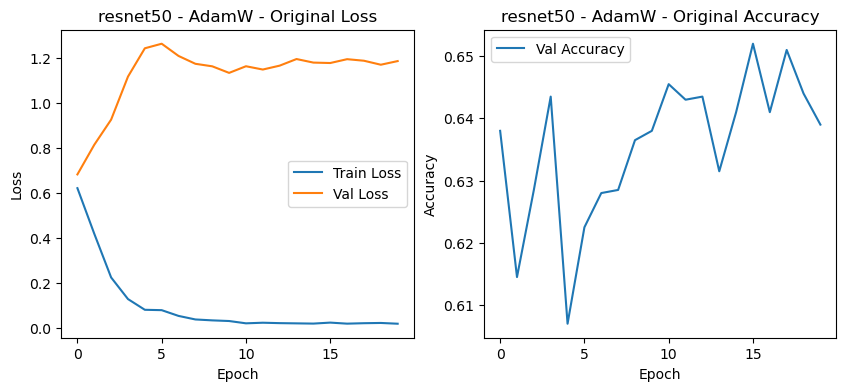

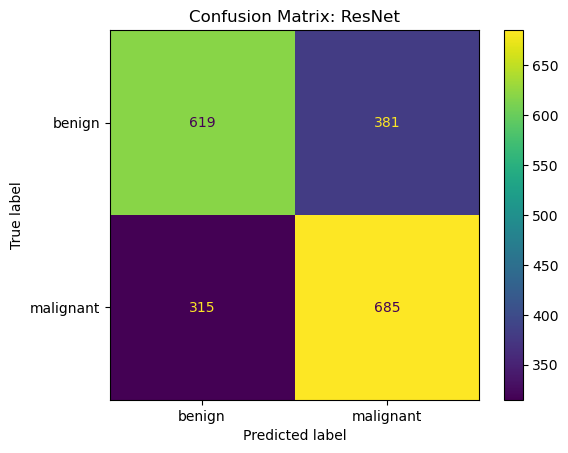

Epoch 0/19
----------
train Loss: 0.6332 Acc: 0.6302
test Loss: 0.6289 Acc: 0.6640
Epoch 0 time: 89.96s
Epoch 1/19
----------
train Loss: 0.4492 Acc: 0.7879
test Loss: 0.7340 Acc: 0.6420
Epoch 1 time: 91.23s
Epoch 2/19
----------
train Loss: 0.2347 Acc: 0.9089
test Loss: 0.8666 Acc: 0.6400
Epoch 2 time: 94.02s
Epoch 3/19
----------
train Loss: 0.1058 Acc: 0.9656
test Loss: 1.0320 Acc: 0.6570
Epoch 3 time: 93.97s
Epoch 4/19
----------
train Loss: 0.0753 Acc: 0.9745
test Loss: 1.1496 Acc: 0.6445
Epoch 4 time: 92.09s
Epoch 5/19
----------
train Loss: 0.0465 Acc: 0.9876
test Loss: 1.1141 Acc: 0.6310
Epoch 5 time: 92.08s
Epoch 6/19
----------
train Loss: 0.0383 Acc: 0.9899
test Loss: 1.2106 Acc: 0.6395
Epoch 6 time: 93.05s
Epoch 7/19
----------
train Loss: 0.0295 Acc: 0.9910
test Loss: 1.1292 Acc: 0.6450
Early stopping triggered
Training complete in 12m 19s
Best val Acc: 0.6640


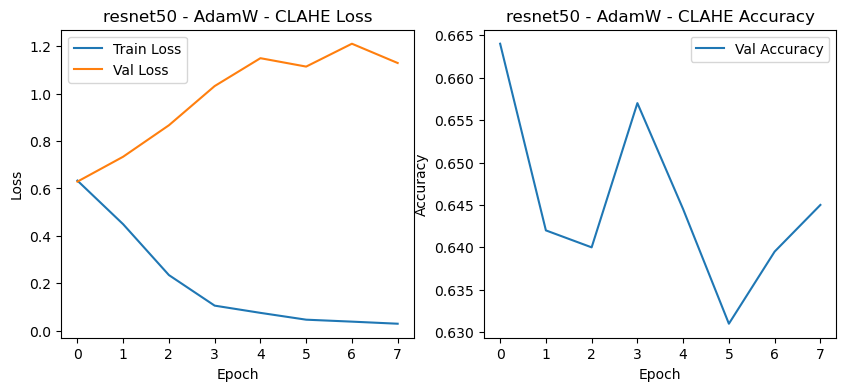

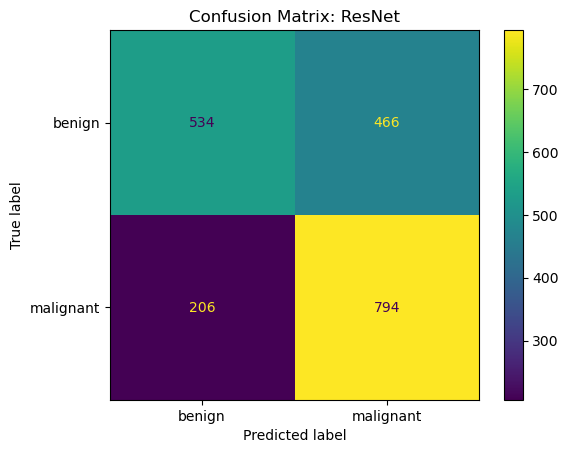

Entrenando resnet50 con AdamW, lr=0.001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6234 Acc: 0.6431
test Loss: 0.6493 Acc: 0.6340
Epoch 0 time: 90.16s
Epoch 1/19
----------
train Loss: 0.4474 Acc: 0.7911
test Loss: 0.7477 Acc: 0.6380
Epoch 1 time: 93.11s
Epoch 2/19
----------
train Loss: 0.2410 Acc: 0.9042
test Loss: 0.8754 Acc: 0.6500
Epoch 2 time: 92.06s
Epoch 3/19
----------
train Loss: 0.1253 Acc: 0.9559
test Loss: 1.1104 Acc: 0.6040
Epoch 3 time: 93.53s
Epoch 4/19
----------
train Loss: 0.0831 Acc: 0.9736
test Loss: 1.1111 Acc: 0.6360
Epoch 4 time: 94.48s
Epoch 5/19
----------
train Loss: 0.0531 Acc: 0.9834
test Loss: 1.1277 Acc: 0.6200
Epoch 5 time: 92.25s
Epoch 6/19
----------
train Loss: 0.0520 Acc: 0.9826
test Loss: 1.1657 Acc: 0.6540
Epoch 6 time: 92.22s
Epoch 7/19
----------
train Loss: 0.0370 Acc: 0.9904
test Loss: 1.1482 Acc: 0.6535
Epoch 7 time: 93.36s
Epoch 8/19
----------
train Loss: 0.0266 Acc: 0.9944
test Loss: 1.1368 Acc: 0.6475
Epo

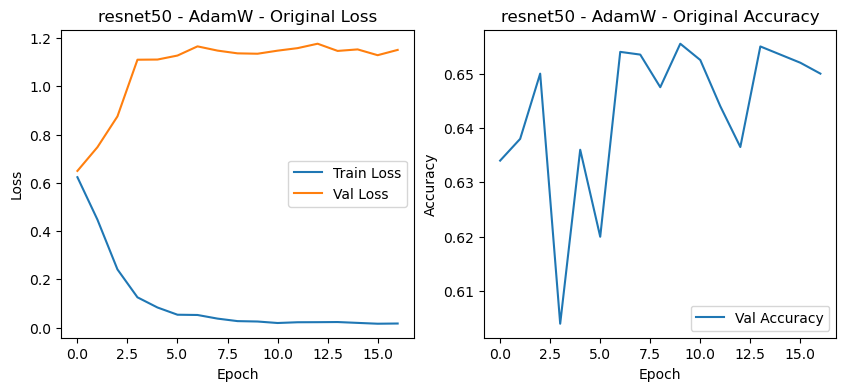

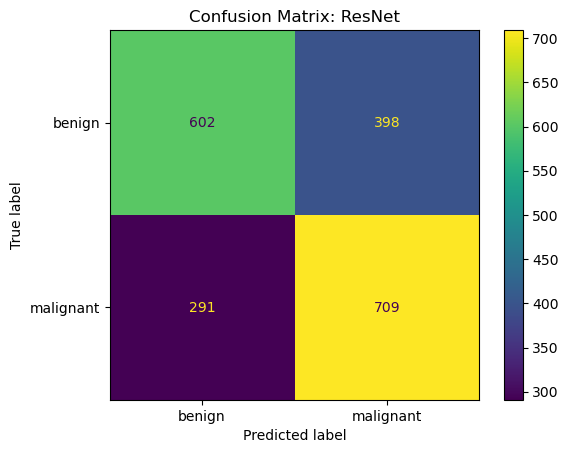

Epoch 0/19
----------
train Loss: 0.6207 Acc: 0.6485
test Loss: 0.6291 Acc: 0.6715
Epoch 0 time: 91.56s
Epoch 1/19
----------
train Loss: 0.4440 Acc: 0.7894
test Loss: 0.6892 Acc: 0.6635
Epoch 1 time: 92.60s
Epoch 2/19
----------
train Loss: 0.2272 Acc: 0.9105
test Loss: 0.8650 Acc: 0.6690
Epoch 2 time: 91.97s
Epoch 3/19
----------
train Loss: 0.1175 Acc: 0.9610
test Loss: 1.0466 Acc: 0.6485
Epoch 3 time: 92.80s
Epoch 4/19
----------
train Loss: 0.0742 Acc: 0.9769
test Loss: 1.0960 Acc: 0.6495
Epoch 4 time: 92.18s
Epoch 5/19
----------
train Loss: 0.0555 Acc: 0.9823
test Loss: 1.1510 Acc: 0.6505
Epoch 5 time: 94.19s
Epoch 6/19
----------
train Loss: 0.0422 Acc: 0.9869
test Loss: 1.1194 Acc: 0.6615
Epoch 6 time: 96.33s
Epoch 7/19
----------
train Loss: 0.0318 Acc: 0.9915
test Loss: 1.0853 Acc: 0.6645
Early stopping triggered
Training complete in 12m 24s
Best val Acc: 0.6715


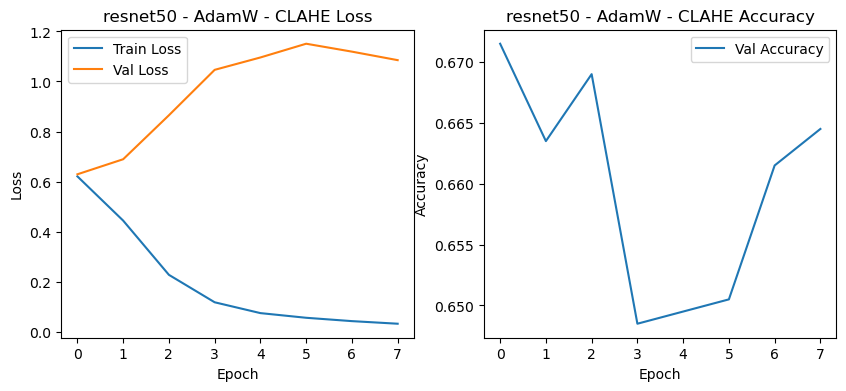

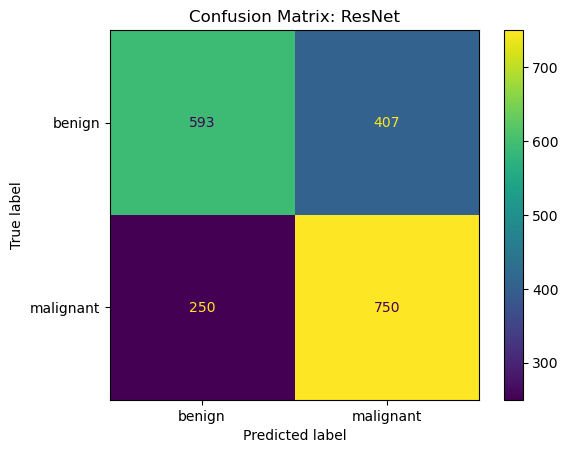

Entrenando resnet50 con AdamW, lr=0.001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6444 Acc: 0.6314
test Loss: 0.6459 Acc: 0.6565
Epoch 0 time: 90.74s
Epoch 1/19
----------
train Loss: 0.4759 Acc: 0.7672
test Loss: 0.7702 Acc: 0.6360
Epoch 1 time: 91.53s
Epoch 2/19
----------
train Loss: 0.2644 Acc: 0.8891
test Loss: 0.9021 Acc: 0.6465
Epoch 2 time: 91.99s
Epoch 3/19
----------
train Loss: 0.1462 Acc: 0.9455
test Loss: 1.2330 Acc: 0.5960
Epoch 3 time: 91.62s
Epoch 4/19
----------
train Loss: 0.0925 Acc: 0.9666
test Loss: 1.1390 Acc: 0.6280
Epoch 4 time: 91.48s
Epoch 5/19
----------
train Loss: 0.0674 Acc: 0.9768
test Loss: 1.2150 Acc: 0.6300
Epoch 5 time: 91.81s
Epoch 6/19
----------
train Loss: 0.0669 Acc: 0.9764
test Loss: 1.2590 Acc: 0.6215
Epoch 6 time: 93.26s
Epoch 7/19
----------
train Loss: 0.0391 Acc: 0.9876
test Loss: 1.2429 Acc: 0.6250
Early stopping triggered
Training complete in 12m 18s
Best val Acc: 0.6565


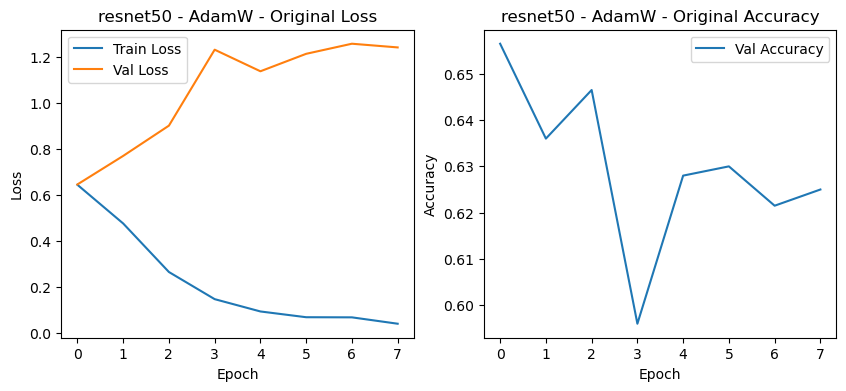

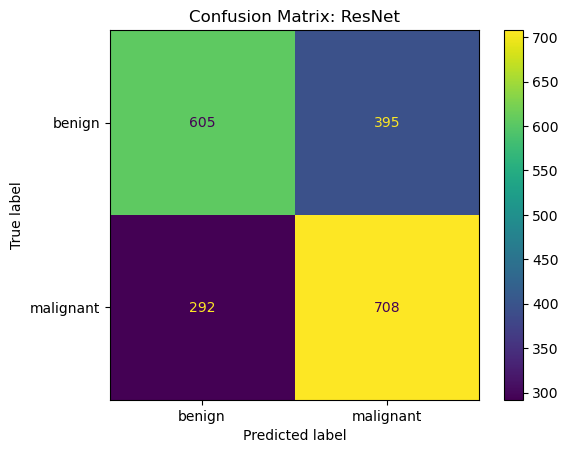

Epoch 0/19
----------
train Loss: 0.6459 Acc: 0.6328
test Loss: 0.6236 Acc: 0.6670
Epoch 0 time: 92.40s
Epoch 1/19
----------
train Loss: 0.4647 Acc: 0.7762
test Loss: 0.7204 Acc: 0.6650
Epoch 1 time: 90.73s
Epoch 2/19
----------
train Loss: 0.2640 Acc: 0.8872
test Loss: 0.9355 Acc: 0.6495
Epoch 2 time: 92.34s
Epoch 3/19
----------
train Loss: 0.1230 Acc: 0.9575
test Loss: 1.0542 Acc: 0.6450
Epoch 3 time: 92.97s
Epoch 4/19
----------
train Loss: 0.0813 Acc: 0.9723
test Loss: 1.1037 Acc: 0.6245
Epoch 4 time: 91.35s
Epoch 5/19
----------
train Loss: 0.0585 Acc: 0.9806
test Loss: 1.1402 Acc: 0.6520
Epoch 5 time: 92.64s
Epoch 6/19
----------
train Loss: 0.0527 Acc: 0.9828
test Loss: 1.2495 Acc: 0.6475
Epoch 6 time: 92.41s
Epoch 7/19
----------
train Loss: 0.0310 Acc: 0.9919
test Loss: 1.1259 Acc: 0.6445
Early stopping triggered
Training complete in 12m 17s
Best val Acc: 0.6670


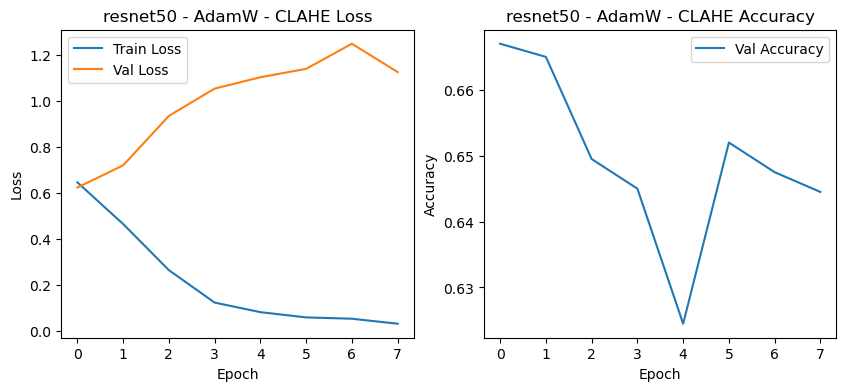

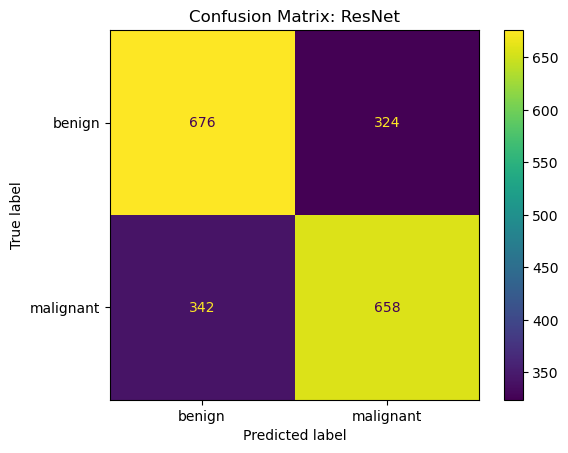

Entrenando resnet50 con AdamW, lr=0.001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6814 Acc: 0.6185
test Loss: 0.6452 Acc: 0.6690
Epoch 0 time: 93.62s
Epoch 1/19
----------
train Loss: 0.4615 Acc: 0.7784
test Loss: 0.8008 Acc: 0.6200
Epoch 1 time: 95.14s
Epoch 2/19
----------
train Loss: 0.2535 Acc: 0.8955
test Loss: 0.9240 Acc: 0.6375
Epoch 2 time: 91.70s
Epoch 3/19
----------
train Loss: 0.1461 Acc: 0.9390
test Loss: 1.1097 Acc: 0.6320
Epoch 3 time: 92.85s
Epoch 4/19
----------
train Loss: 0.0972 Acc: 0.9654
test Loss: 1.1989 Acc: 0.6310
Epoch 4 time: 91.63s
Epoch 5/19
----------
train Loss: 0.0625 Acc: 0.9801
test Loss: 1.2283 Acc: 0.6475
Epoch 5 time: 92.53s
Epoch 6/19
----------
train Loss: 0.0531 Acc: 0.9834
test Loss: 1.3263 Acc: 0.6425
Epoch 6 time: 92.92s
Epoch 7/19
----------
train Loss: 0.0350 Acc: 0.9896
test Loss: 1.2632 Acc: 0.6305
Early stopping triggered
Training complete in 12m 23s
Best val Acc: 0.6690


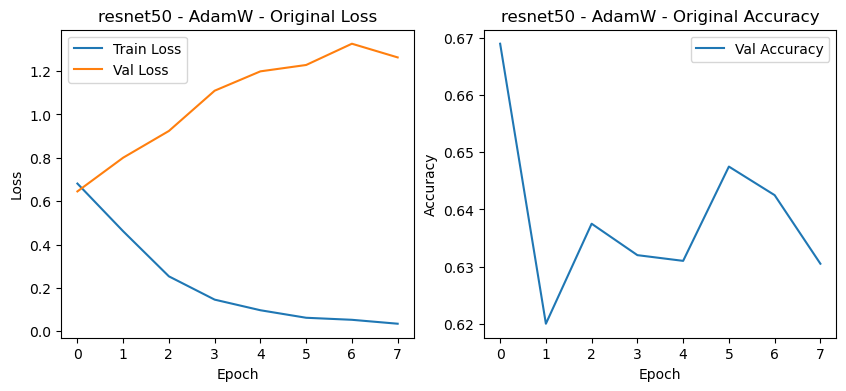

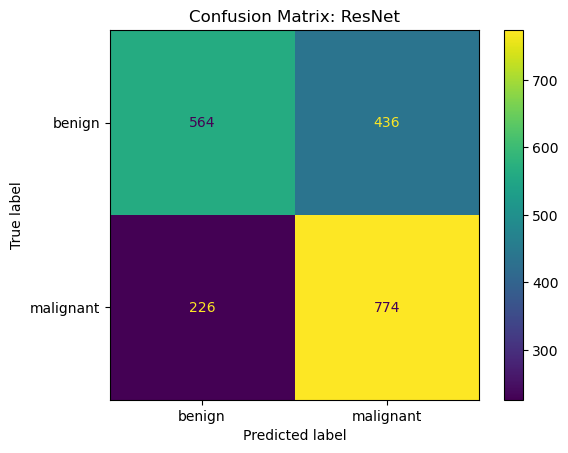

Epoch 0/19
----------
train Loss: 0.6508 Acc: 0.6325
test Loss: 0.6445 Acc: 0.6625
Epoch 0 time: 90.75s
Epoch 1/19
----------
train Loss: 0.4586 Acc: 0.7788
test Loss: 0.7487 Acc: 0.6260
Epoch 1 time: 92.90s
Epoch 2/19
----------
train Loss: 0.2568 Acc: 0.8930
test Loss: 0.9576 Acc: 0.6215
Epoch 2 time: 94.76s
Epoch 3/19
----------
train Loss: 0.1304 Acc: 0.9537
test Loss: 1.1650 Acc: 0.6240
Epoch 3 time: 92.51s
Epoch 4/19
----------
train Loss: 0.0801 Acc: 0.9728
test Loss: 1.1111 Acc: 0.6195
Epoch 4 time: 92.74s
Epoch 5/19
----------
train Loss: 0.0577 Acc: 0.9818
test Loss: 1.1846 Acc: 0.6370
Epoch 5 time: 92.32s
Epoch 6/19
----------
train Loss: 0.0422 Acc: 0.9875
test Loss: 1.1596 Acc: 0.6430
Epoch 6 time: 91.60s
Epoch 7/19
----------
train Loss: 0.0293 Acc: 0.9925
test Loss: 1.1511 Acc: 0.6465
Early stopping triggered
Training complete in 12m 31s
Best val Acc: 0.6625


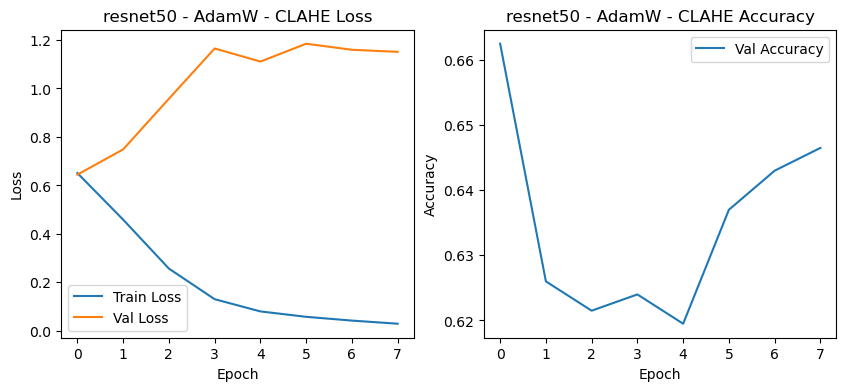

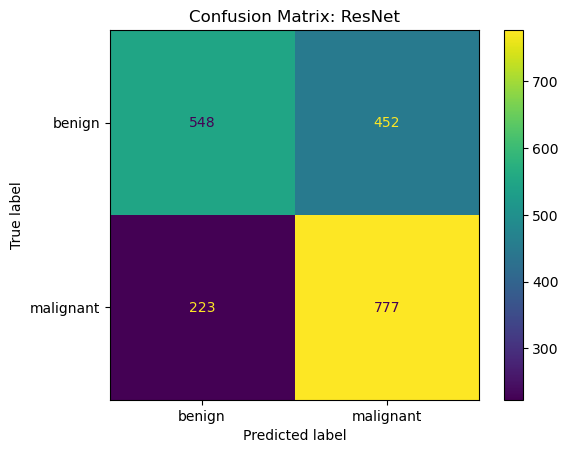

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.5992 Acc: 0.6651
test Loss: 0.6920 Acc: 0.6150
Epoch 0 time: 110.38s
Epoch 1/19
----------
train Loss: 0.3808 Acc: 0.8281
test Loss: 0.8638 Acc: 0.6320
Epoch 1 time: 92.38s
Epoch 2/19
----------
train Loss: 0.1919 Acc: 0.9231
test Loss: 1.1334 Acc: 0.6080
Epoch 2 time: 93.65s
Epoch 3/19
----------
train Loss: 0.1136 Acc: 0.9583
test Loss: 1.2105 Acc: 0.6210
Epoch 3 time: 96.62s
Epoch 4/19
----------
train Loss: 0.0944 Acc: 0.9681
test Loss: 1.2583 Acc: 0.6330
Epoch 4 time: 96.81s
Epoch 5/19
----------
train Loss: 0.0645 Acc: 0.9774
test Loss: 1.2165 Acc: 0.6445
Epoch 5 time: 94.20s
Epoch 6/19
----------
train Loss: 0.0472 Acc: 0.9844
test Loss: 1.5188 Acc: 0.6225
Epoch 6 time: 93.17s
Epoch 7/19
----------
train Loss: 0.0277 Acc: 0.9929
test Loss: 1.3315 Acc: 0.6335
Epoch 7 time: 92.01s
Epoch 8/19
----------
train Loss: 0.0226 Acc: 0.9951
test Loss: 1.2308 Acc: 0.6340
Epoc

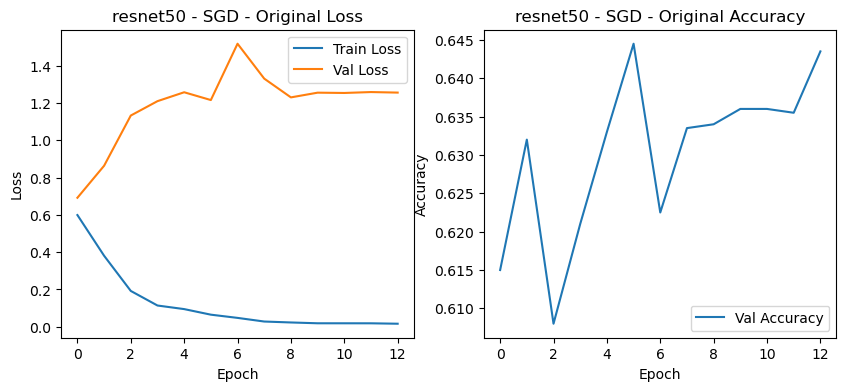

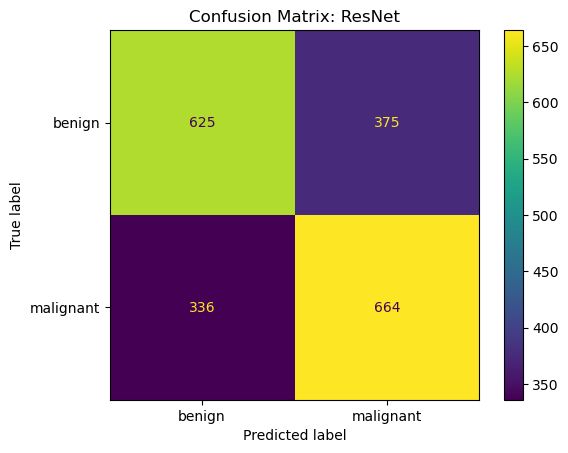

Epoch 0/19
----------
train Loss: 0.5917 Acc: 0.6727
test Loss: 0.6668 Acc: 0.6365
Epoch 0 time: 107.60s
Epoch 1/19
----------
train Loss: 0.3472 Acc: 0.8481
test Loss: 0.8213 Acc: 0.6385
Epoch 1 time: 92.22s
Epoch 2/19
----------
train Loss: 0.1527 Acc: 0.9444
test Loss: 1.2294 Acc: 0.5960
Epoch 2 time: 92.30s
Epoch 3/19
----------
train Loss: 0.0877 Acc: 0.9698
test Loss: 1.2982 Acc: 0.6195
Epoch 3 time: 91.60s
Epoch 4/19
----------
train Loss: 0.0734 Acc: 0.9728
test Loss: 1.1589 Acc: 0.6325
Epoch 4 time: 92.39s
Epoch 5/19
----------
train Loss: 0.0512 Acc: 0.9834
test Loss: 1.2563 Acc: 0.6550
Epoch 5 time: 92.84s
Epoch 6/19
----------
train Loss: 0.0494 Acc: 0.9838
test Loss: 1.2011 Acc: 0.6330
Epoch 6 time: 91.41s
Epoch 7/19
----------
train Loss: 0.0335 Acc: 0.9895
test Loss: 1.2078 Acc: 0.6405
Epoch 7 time: 91.75s
Epoch 8/19
----------
train Loss: 0.0202 Acc: 0.9952
test Loss: 1.1352 Acc: 0.6470
Epoch 8 time: 93.22s
Epoch 9/19
----------
train Loss: 0.0168 Acc: 0.9966
test Loss:

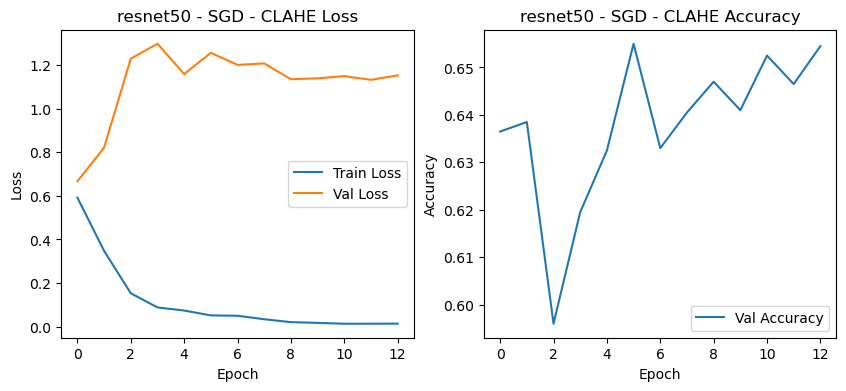

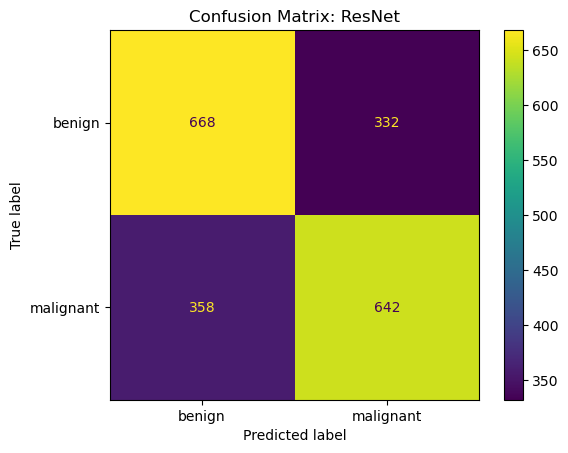

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6006 Acc: 0.6718
test Loss: 0.6895 Acc: 0.6425
Epoch 0 time: 91.89s
Epoch 1/19
----------
train Loss: 0.3643 Acc: 0.8329
test Loss: 0.8480 Acc: 0.6440
Epoch 1 time: 92.42s
Epoch 2/19
----------
train Loss: 0.1907 Acc: 0.9245
test Loss: 1.1934 Acc: 0.5810
Epoch 2 time: 91.36s
Epoch 3/19
----------
train Loss: 0.1130 Acc: 0.9587
test Loss: 1.3717 Acc: 0.6040
Epoch 3 time: 91.79s
Epoch 4/19
----------
train Loss: 0.0879 Acc: 0.9696
test Loss: 1.2574 Acc: 0.6255
Epoch 4 time: 91.92s
Epoch 5/19
----------
train Loss: 0.0598 Acc: 0.9794
test Loss: 1.3817 Acc: 0.6295
Epoch 5 time: 94.34s
Epoch 6/19
----------
train Loss: 0.0447 Acc: 0.9839
test Loss: 1.3283 Acc: 0.6485
Epoch 6 time: 92.71s
Epoch 7/19
----------
train Loss: 0.0281 Acc: 0.9925
test Loss: 1.2488 Acc: 0.6600
Epoch 7 time: 91.47s
Epoch 8/19
----------
train Loss: 0.0197 Acc: 0.9949
test Loss: 1.2395 Acc: 0.6540
Epoch

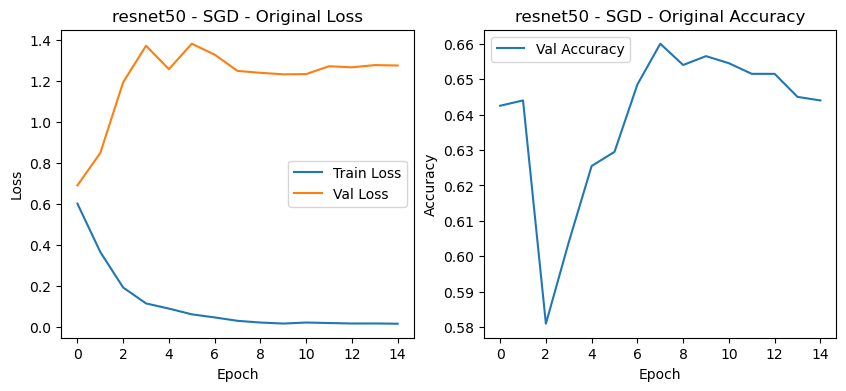

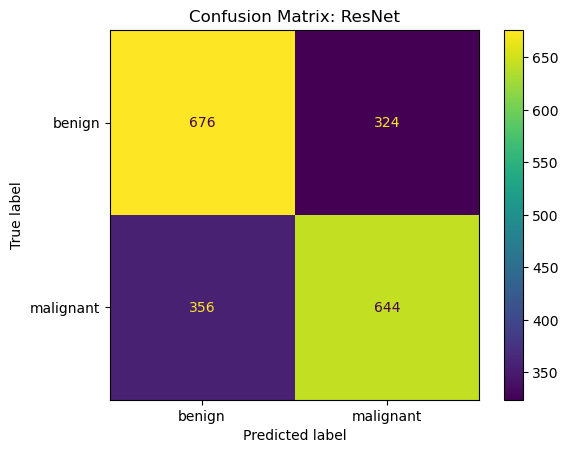

Epoch 0/19
----------
train Loss: 0.5956 Acc: 0.6737
test Loss: 0.6838 Acc: 0.6225
Epoch 0 time: 94.45s
Epoch 1/19
----------
train Loss: 0.3498 Acc: 0.8489
test Loss: 0.8496 Acc: 0.6380
Epoch 1 time: 92.97s
Epoch 2/19
----------
train Loss: 0.1687 Acc: 0.9364
test Loss: 1.0391 Acc: 0.6280
Epoch 2 time: 90.83s
Epoch 3/19
----------
train Loss: 0.0979 Acc: 0.9657
test Loss: 1.1193 Acc: 0.6425
Epoch 3 time: 91.83s
Epoch 4/19
----------
train Loss: 0.0652 Acc: 0.9764
test Loss: 1.2026 Acc: 0.6365
Epoch 4 time: 91.89s
Epoch 5/19
----------
train Loss: 0.0575 Acc: 0.9784
test Loss: 1.3126 Acc: 0.6155
Epoch 5 time: 91.68s
Epoch 6/19
----------
train Loss: 0.0607 Acc: 0.9775
test Loss: 1.2543 Acc: 0.6460
Epoch 6 time: 91.45s
Epoch 7/19
----------
train Loss: 0.0342 Acc: 0.9895
test Loss: 1.1575 Acc: 0.6525
Epoch 7 time: 91.85s
Epoch 8/19
----------
train Loss: 0.0253 Acc: 0.9935
test Loss: 1.1557 Acc: 0.6500
Epoch 8 time: 92.04s
Epoch 9/19
----------
train Loss: 0.0204 Acc: 0.9960
test Loss: 

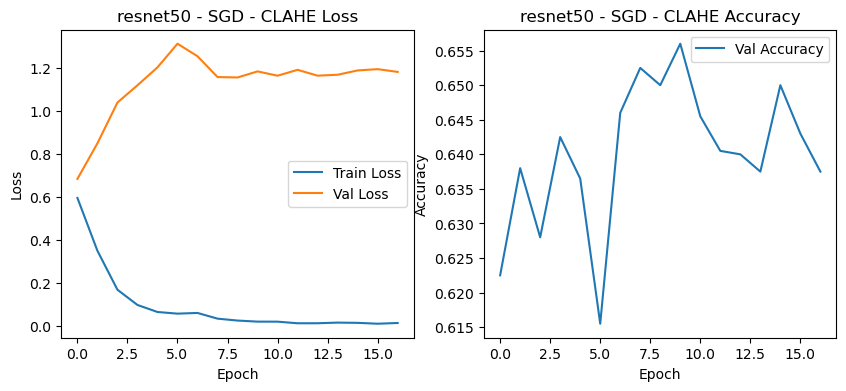

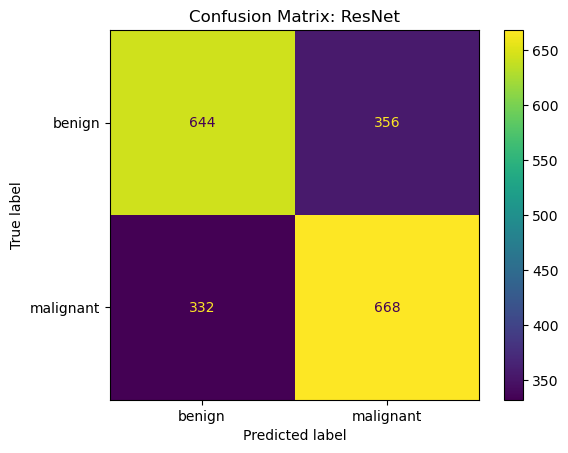

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.6214 Acc: 0.6586
test Loss: 0.6972 Acc: 0.6380
Epoch 0 time: 90.39s
Epoch 1/19
----------
train Loss: 0.4031 Acc: 0.8125
test Loss: 0.8217 Acc: 0.6290
Epoch 1 time: 91.33s
Epoch 2/19
----------
train Loss: 0.2082 Acc: 0.9144
test Loss: 1.0679 Acc: 0.6205
Epoch 2 time: 96.00s
Epoch 3/19
----------
train Loss: 0.1244 Acc: 0.9531
test Loss: 1.1798 Acc: 0.6170
Epoch 3 time: 92.70s
Epoch 4/19
----------
train Loss: 0.0947 Acc: 0.9656
test Loss: 1.1819 Acc: 0.6605
Epoch 4 time: 91.77s
Epoch 5/19
----------
train Loss: 0.0590 Acc: 0.9793
test Loss: 1.2022 Acc: 0.6545
Epoch 5 time: 91.32s
Epoch 6/19
----------
train Loss: 0.0457 Acc: 0.9863
test Loss: 1.2605 Acc: 0.6350
Epoch 6 time: 91.48s
Epoch 7/19
----------
train Loss: 0.0302 Acc: 0.9898
test Loss: 1.1968 Acc: 0.6625
Epoch 7 time: 92.81s
Epoch 8/19
----------
train Loss: 0.0221 Acc: 0.9949
test Loss: 1.2039 Acc: 0.6630
Epoch

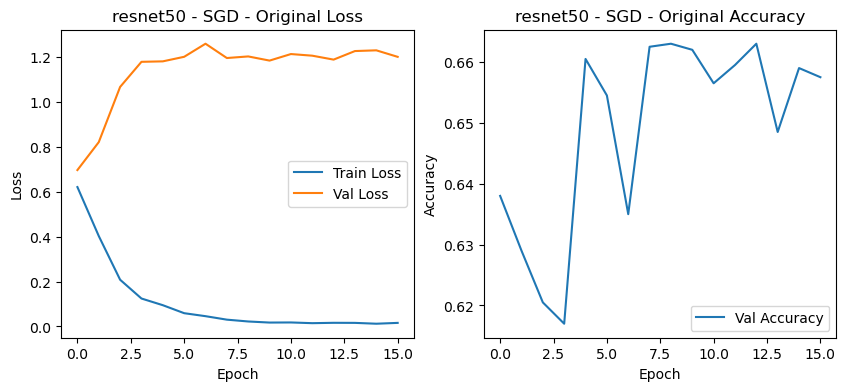

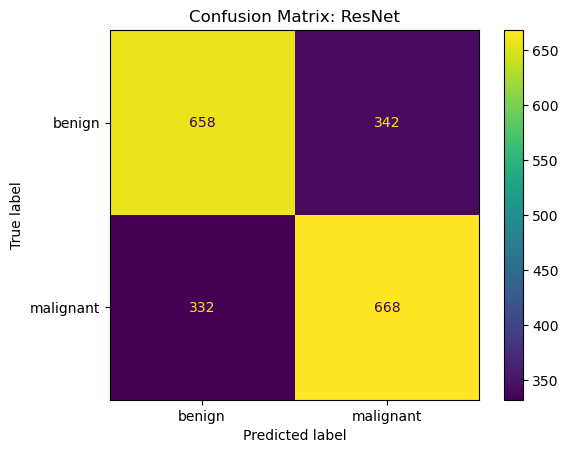

Epoch 0/19
----------
train Loss: 0.6279 Acc: 0.6596
test Loss: 0.6591 Acc: 0.6460
Epoch 0 time: 90.28s
Epoch 1/19
----------
train Loss: 0.3898 Acc: 0.8211
test Loss: 0.8904 Acc: 0.6200
Epoch 1 time: 91.41s
Epoch 2/19
----------
train Loss: 0.1827 Acc: 0.9296
test Loss: 1.0327 Acc: 0.6075
Epoch 2 time: 91.39s
Epoch 3/19
----------
train Loss: 0.1027 Acc: 0.9640
test Loss: 1.1779 Acc: 0.6115
Epoch 3 time: 92.27s
Epoch 4/19
----------
train Loss: 0.0804 Acc: 0.9701
test Loss: 1.3594 Acc: 0.5930
Epoch 4 time: 91.59s
Epoch 5/19
----------
train Loss: 0.0558 Acc: 0.9813
test Loss: 1.3926 Acc: 0.6180
Epoch 5 time: 94.69s
Epoch 6/19
----------
train Loss: 0.0495 Acc: 0.9844
test Loss: 1.3624 Acc: 0.6260
Epoch 6 time: 92.93s
Epoch 7/19
----------
train Loss: 0.0331 Acc: 0.9905
test Loss: 1.2724 Acc: 0.6370
Early stopping triggered
Training complete in 12m 16s
Best val Acc: 0.6460


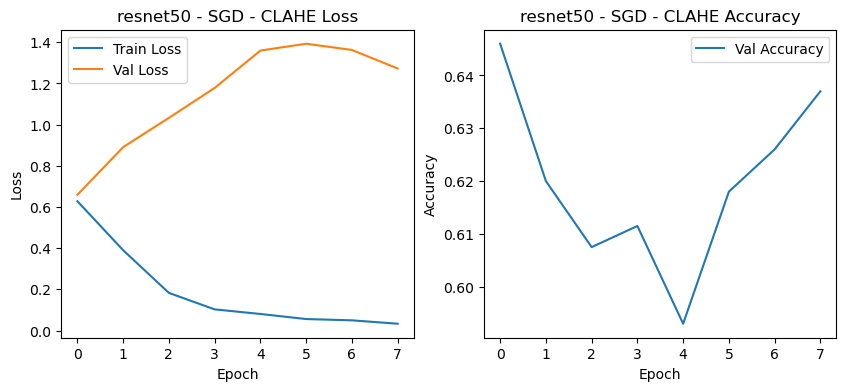

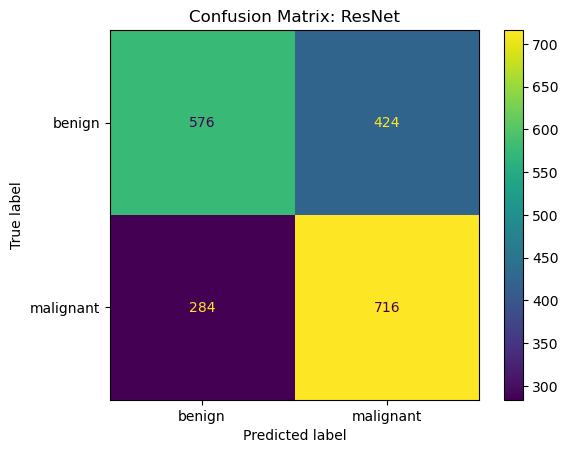

Entrenando resnet50 con SGD, lr=0.001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.6154 Acc: 0.6659
test Loss: 0.6895 Acc: 0.6385
Epoch 0 time: 91.09s
Epoch 1/19
----------
train Loss: 0.3995 Acc: 0.8185
test Loss: 0.7911 Acc: 0.6395
Epoch 1 time: 91.65s
Epoch 2/19
----------
train Loss: 0.1948 Acc: 0.9214
test Loss: 1.1313 Acc: 0.6190
Epoch 2 time: 91.83s
Epoch 3/19
----------
train Loss: 0.1296 Acc: 0.9515
test Loss: 1.0858 Acc: 0.6385
Epoch 3 time: 92.94s
Epoch 4/19
----------
train Loss: 0.0898 Acc: 0.9666
test Loss: 1.3283 Acc: 0.6165
Epoch 4 time: 91.47s
Epoch 5/19
----------
train Loss: 0.0711 Acc: 0.9745
test Loss: 1.2971 Acc: 0.6360
Epoch 5 time: 92.14s
Epoch 6/19
----------
train Loss: 0.0507 Acc: 0.9836
test Loss: 1.2791 Acc: 0.6370
Epoch 6 time: 93.68s
Epoch 7/19
----------
train Loss: 0.0326 Acc: 0.9921
test Loss: 1.1881 Acc: 0.6500
Epoch 7 time: 94.16s
Epoch 8/19
----------
train Loss: 0.0237 Acc: 0.9936
test Loss: 1.1712 Acc: 0.6550
Epoch

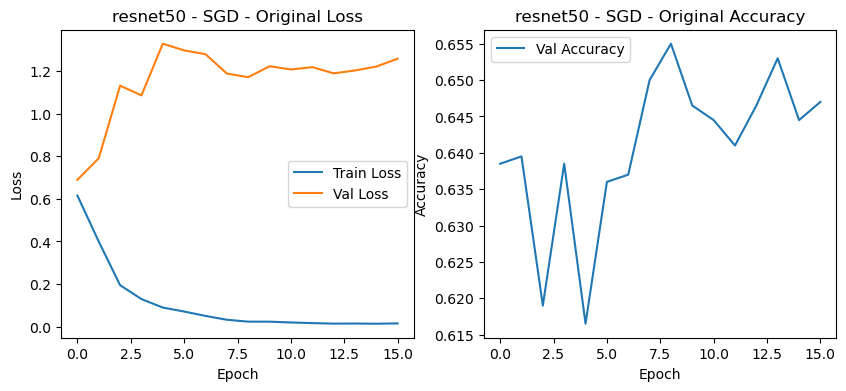

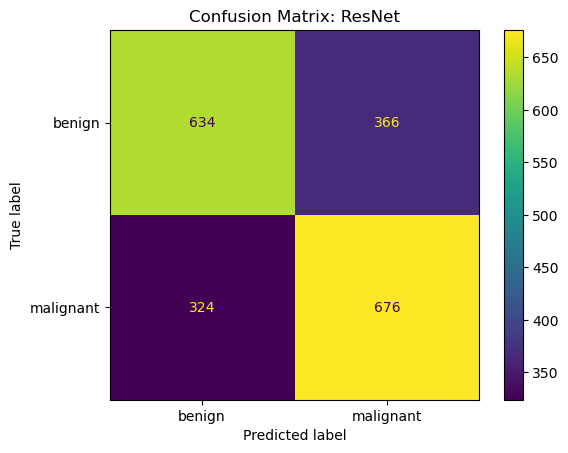

Epoch 0/19
----------
train Loss: 0.6234 Acc: 0.6520
test Loss: 0.6840 Acc: 0.6405
Epoch 0 time: 93.07s
Epoch 1/19
----------
train Loss: 0.3752 Acc: 0.8299
test Loss: 0.8018 Acc: 0.6260
Epoch 1 time: 92.36s
Epoch 2/19
----------
train Loss: 0.1814 Acc: 0.9286
test Loss: 1.0772 Acc: 0.6290
Epoch 2 time: 100.01s
Epoch 3/19
----------
train Loss: 0.1091 Acc: 0.9605
test Loss: 1.2271 Acc: 0.6350
Epoch 3 time: 93.78s
Epoch 4/19
----------
train Loss: 0.0827 Acc: 0.9699
test Loss: 1.1809 Acc: 0.6325
Epoch 4 time: 92.07s
Epoch 5/19
----------
train Loss: 0.0545 Acc: 0.9823
test Loss: 1.2439 Acc: 0.6425
Epoch 5 time: 93.31s
Epoch 6/19
----------
train Loss: 0.0427 Acc: 0.9856
test Loss: 1.3673 Acc: 0.6080
Epoch 6 time: 94.65s
Epoch 7/19
----------
train Loss: 0.0304 Acc: 0.9911
test Loss: 1.1992 Acc: 0.6275
Epoch 7 time: 94.51s
Epoch 8/19
----------
train Loss: 0.0188 Acc: 0.9961
test Loss: 1.1742 Acc: 0.6355
Epoch 8 time: 95.91s
Epoch 9/19
----------
train Loss: 0.0187 Acc: 0.9958
test Loss:

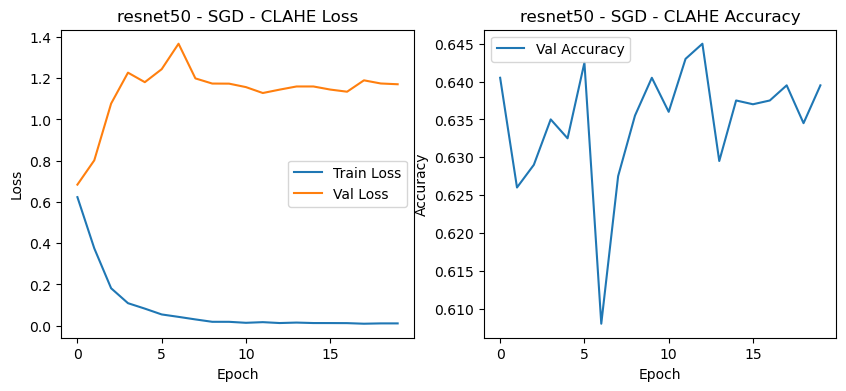

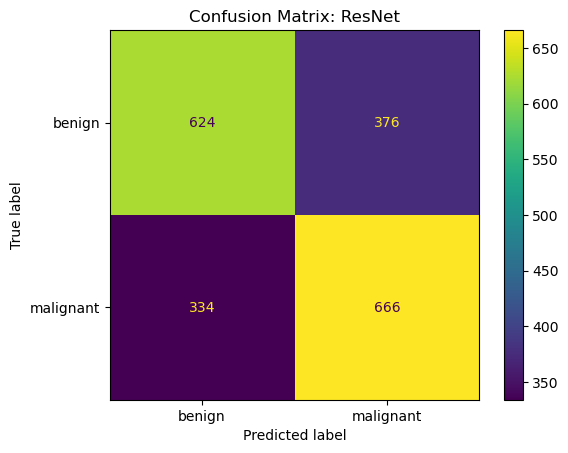

Entrenando resnet50 con Adam, lr=0.001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------


KeyboardInterrupt: 

In [17]:
import torch.optim as optim
import time

def run_resnet50_experiments():
    model_name = 'resnet50'
    learning_rates = [0.0001, 0.001]
    weight_decays = [0.0001, 0.001]
    momentums = [0.9, 0.95]
    optimizers = ['SGD', 'Adam', 'AdamW']
    dropouts = [0.5, 0.7]
    batch_sizes = [16, 32]
    scheduler_types = ['StepLR', 'ExponentialLR', 'MultiStepLR']
    activations = ['relu', 'leaky_relu', 'sigmoid', 'tanh']

    try:
        for lr in learning_rates:
            for wd in weight_decays:
                for momentum in momentums:
                    for optimizer_type in optimizers:
                        for dropout in dropouts:
                            for batch_size in batch_sizes:
                                for scheduler_type in scheduler_types:
                                    for activation in activations:
                                        print(f"Entrenando {model_name} con {optimizer_type}, lr={lr}, wd={wd}, dropout={dropout}, batch_size={batch_size}, scheduler={scheduler_type}, activation={activation}...")
                                        
                                        if optimizer_type == 'SGD':
                                            optimizer_func = optim.SGD
                                        elif optimizer_type == 'Adam':
                                            optimizer_func = optim.Adam
                                        elif optimizer_type == 'AdamW':
                                            optimizer_func = optim.AdamW
                                        else:
                                            raise ValueError("Optimador no soportado.")

                                        dataloaders = original_dataloaders if model_name != 'inception_v3' else original_dataloaders_inception
                                        dataset_sizes = original_dataset_sizes if model_name != 'inception_v3' else original_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - Original')
                                        plot_confusion_matrix(model, dataloaders)
                                        
                                        # Repetir con imágenes CLAHE
                                        dataloaders = clahe_dataloaders if model_name != 'inception_v3' else clahe_dataloaders_inception
                                        dataset_sizes = clahe_dataset_sizes if model_name != 'inception_v3' else clahe_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - CLAHE')
                                        plot_confusion_matrix(model, dataloaders)
    except KeyboardInterrupt:
        print("Ejecución detenida por el usuario de manera controlada")

run_resnet50_experiments()


Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7073 Acc: 0.5269
test Loss: 0.6940 Acc: 0.5240
Epoch 0 time: 92.26s
Epoch 1/19
----------
train Loss: 0.6949 Acc: 0.5499
test Loss: 0.6877 Acc: 0.5335
Epoch 1 time: 103.89s
Epoch 2/19
----------
train Loss: 0.6944 Acc: 0.5463
test Loss: 0.6812 Acc: 0.5570
Epoch 2 time: 102.46s
Epoch 3/19
----------
train Loss: 0.6856 Acc: 0.5717
test Loss: 0.6771 Acc: 0.5690
Epoch 3 time: 98.21s
Epoch 4/19
----------
train Loss: 0.6846 Acc: 0.5695
test Loss: 0.6708 Acc: 0.5775
Epoch 4 time: 101.13s
Epoch 5/19
----------
train Loss: 0.6756 Acc: 0.5831
test Loss: 0.6661 Acc: 0.5935
Epoch 5 time: 101.51s
Epoch 6/19
----------
train Loss: 0.6736 Acc: 0.5831
test Loss: 0.6614 Acc: 0.6060
Epoch 6 time: 103.98s
Epoch 7/19
----------
train Loss: 0.6674 Acc: 0.5991
test Loss: 0.6630 Acc: 0.5955
Epoch 7 time: 104.27s
Epoch 8/19
----------
train Loss: 0.6708 Acc: 0.5948
test Loss: 0.6608 Acc

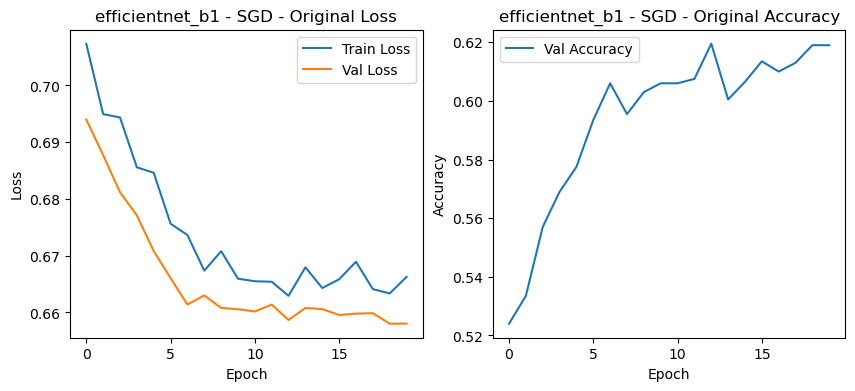

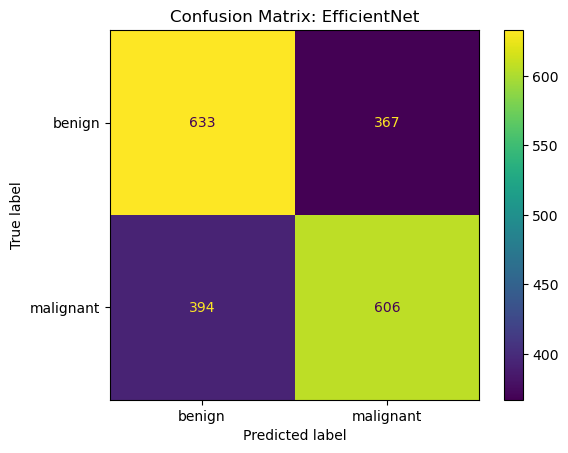

Epoch 0/29
----------
train Loss: 0.7137 Acc: 0.5075
test Loss: 0.6884 Acc: 0.5485
Epoch 0 time: 111.69s
Epoch 1/29
----------
train Loss: 0.7058 Acc: 0.5291
test Loss: 0.6805 Acc: 0.5760
Epoch 1 time: 112.56s
Epoch 2/29
----------
train Loss: 0.6960 Acc: 0.5433
test Loss: 0.6737 Acc: 0.5920
Epoch 2 time: 112.44s
Epoch 3/29
----------
train Loss: 0.6894 Acc: 0.5564
test Loss: 0.6676 Acc: 0.6005
Epoch 3 time: 117.57s
Epoch 4/29
----------
train Loss: 0.6842 Acc: 0.5593
test Loss: 0.6615 Acc: 0.6165
Epoch 4 time: 115.12s
Epoch 5/29
----------
train Loss: 0.6801 Acc: 0.5716
test Loss: 0.6571 Acc: 0.6290
Epoch 5 time: 108.52s
Epoch 6/29
----------
train Loss: 0.6731 Acc: 0.5821
test Loss: 0.6544 Acc: 0.6220
Epoch 6 time: 120.14s
Epoch 7/29
----------
train Loss: 0.6760 Acc: 0.5761
test Loss: 0.6529 Acc: 0.6290
Epoch 7 time: 112.40s
Epoch 8/29
----------
train Loss: 0.6705 Acc: 0.5940
test Loss: 0.6521 Acc: 0.6250
Epoch 8 time: 109.42s
Epoch 9/29
----------
train Loss: 0.6679 Acc: 0.5923
te

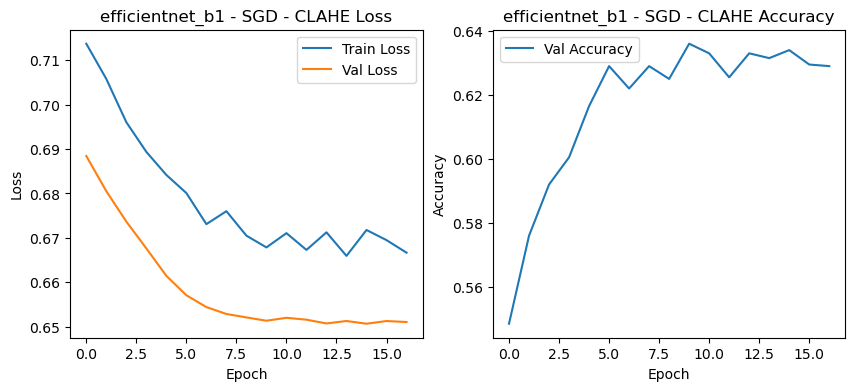

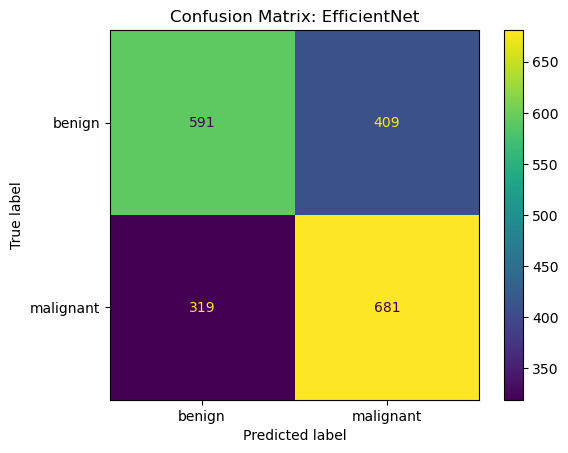

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7205 Acc: 0.5059
test Loss: 0.6924 Acc: 0.5280
Epoch 0 time: 120.69s
Epoch 1/19
----------
train Loss: 0.7110 Acc: 0.5181
test Loss: 0.6819 Acc: 0.5530
Epoch 1 time: 125.27s
Epoch 2/19
----------
train Loss: 0.7003 Acc: 0.5451
test Loss: 0.6757 Acc: 0.5680
Epoch 2 time: 124.34s
Epoch 3/19
----------
train Loss: 0.6941 Acc: 0.5444
test Loss: 0.6707 Acc: 0.5940
Epoch 3 time: 121.82s
Epoch 4/19
----------
train Loss: 0.6848 Acc: 0.5610
test Loss: 0.6651 Acc: 0.6050
Epoch 4 time: 126.03s
Epoch 5/19
----------
train Loss: 0.6810 Acc: 0.5771
test Loss: 0.6592 Acc: 0.6210
Epoch 5 time: 125.40s
Epoch 6/19
----------
train Loss: 0.6786 Acc: 0.5740
test Loss: 0.6570 Acc: 0.6210
Epoch 6 time: 120.35s
Epoch 7/19
----------
train Loss: 0.6709 Acc: 0.5926
test Loss: 0.6554 Acc: 0.6280
Epoch 7 time: 119.36s
Epoch 8/19
----------
train Loss: 0.6720 Acc: 0.5914
test Loss: 0.6541 A

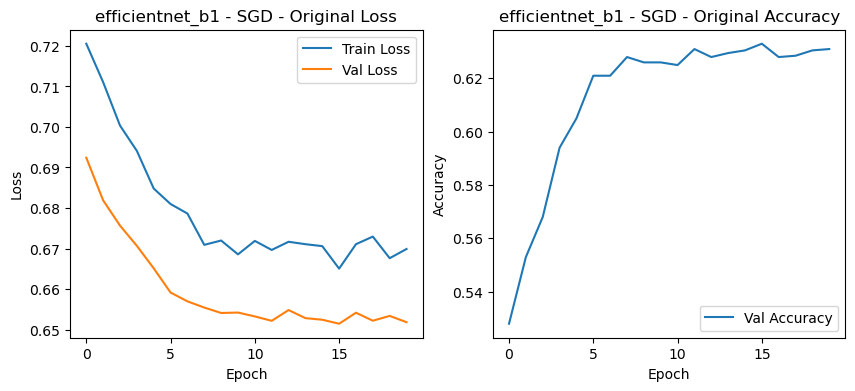

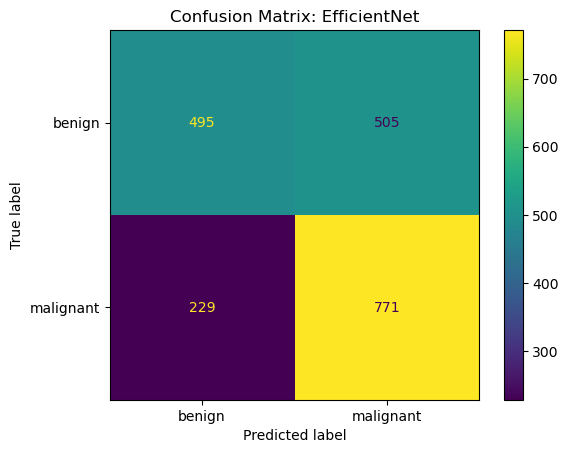

Epoch 0/29
----------
train Loss: 0.7254 Acc: 0.5058
test Loss: 0.6968 Acc: 0.5100
Epoch 0 time: 124.15s
Epoch 1/29
----------
train Loss: 0.7150 Acc: 0.5114
test Loss: 0.6877 Acc: 0.5380
Epoch 1 time: 112.68s
Epoch 2/29
----------
train Loss: 0.7106 Acc: 0.5216
test Loss: 0.6813 Acc: 0.5635
Epoch 2 time: 116.19s
Epoch 3/29
----------
train Loss: 0.7014 Acc: 0.5326
test Loss: 0.6750 Acc: 0.5720
Epoch 3 time: 118.38s
Epoch 4/29
----------
train Loss: 0.6906 Acc: 0.5634
test Loss: 0.6690 Acc: 0.5950
Epoch 4 time: 115.44s
Epoch 5/29
----------
train Loss: 0.6832 Acc: 0.5700
test Loss: 0.6651 Acc: 0.6095
Epoch 5 time: 103.20s
Epoch 6/29
----------
train Loss: 0.6846 Acc: 0.5716
test Loss: 0.6582 Acc: 0.6280
Epoch 6 time: 105.91s
Epoch 7/29
----------
train Loss: 0.6782 Acc: 0.5843
test Loss: 0.6599 Acc: 0.6150
Epoch 7 time: 103.29s
Epoch 8/29
----------
train Loss: 0.6762 Acc: 0.5874
test Loss: 0.6578 Acc: 0.6330
Epoch 8 time: 101.55s
Epoch 9/29
----------
train Loss: 0.6727 Acc: 0.5884
te

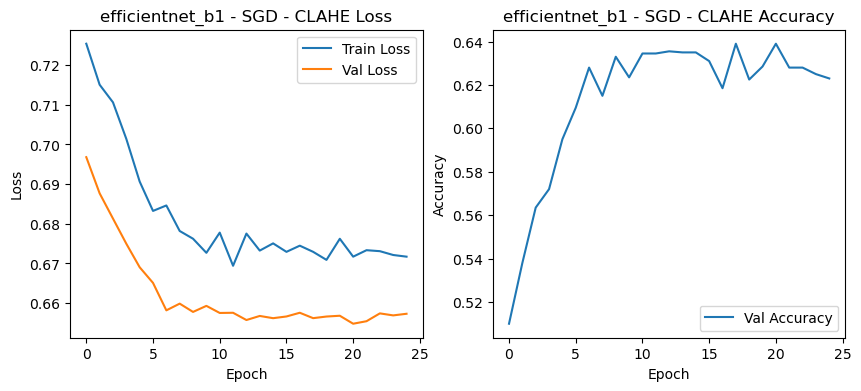

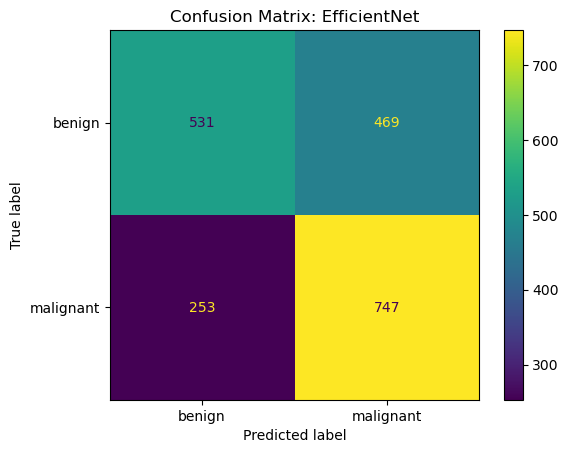

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7400 Acc: 0.4908
test Loss: 0.7041 Acc: 0.5060
Epoch 0 time: 114.16s
Epoch 1/19
----------
train Loss: 0.7257 Acc: 0.5144
test Loss: 0.6930 Acc: 0.5390
Epoch 1 time: 101.42s
Epoch 2/19
----------
train Loss: 0.7201 Acc: 0.5258
test Loss: 0.6881 Acc: 0.5610
Epoch 2 time: 98.89s
Epoch 3/19
----------
train Loss: 0.7150 Acc: 0.5234
test Loss: 0.6794 Acc: 0.5900
Epoch 3 time: 101.16s
Epoch 4/19
----------
train Loss: 0.7056 Acc: 0.5383
test Loss: 0.6747 Acc: 0.6020
Epoch 4 time: 98.25s
Epoch 5/19
----------
train Loss: 0.7051 Acc: 0.5395
test Loss: 0.6685 Acc: 0.6165
Epoch 5 time: 98.80s
Epoch 6/19
----------
train Loss: 0.6921 Acc: 0.5614
test Loss: 0.6636 Acc: 0.6260
Epoch 6 time: 100.15s
Epoch 7/19
----------
train Loss: 0.6909 Acc: 0.5610
test Loss: 0.6628 Acc: 0.6265
Epoch 7 time: 100.78s
Epoch 8/19
----------
train Loss: 0.6959 Acc: 0.5563
test Loss: 0.6626 Acc:

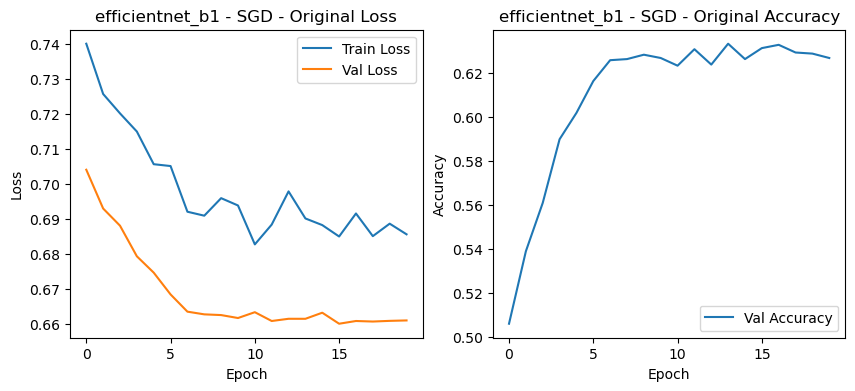

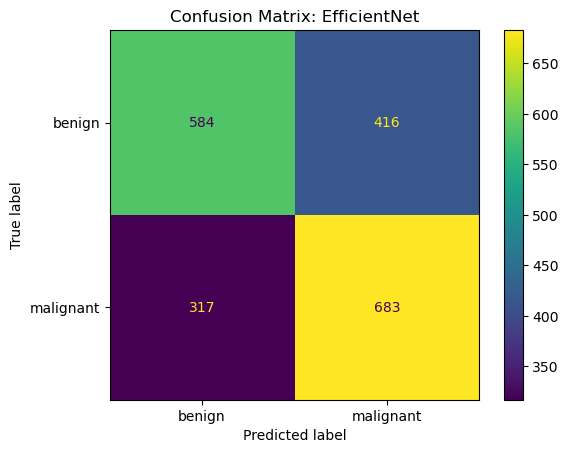

Epoch 0/29
----------
train Loss: 0.7255 Acc: 0.5091
test Loss: 0.6851 Acc: 0.5585
Epoch 0 time: 98.63s
Epoch 1/29
----------
train Loss: 0.7208 Acc: 0.5235
test Loss: 0.6779 Acc: 0.5750
Epoch 1 time: 99.53s
Epoch 2/29
----------
train Loss: 0.7175 Acc: 0.5290
test Loss: 0.6717 Acc: 0.5990
Epoch 2 time: 100.36s
Epoch 3/29
----------
train Loss: 0.7074 Acc: 0.5368
test Loss: 0.6658 Acc: 0.6070
Epoch 3 time: 100.81s
Epoch 4/29
----------
train Loss: 0.7002 Acc: 0.5514
test Loss: 0.6607 Acc: 0.6235
Epoch 4 time: 110.97s
Epoch 5/29
----------
train Loss: 0.6940 Acc: 0.5587
test Loss: 0.6555 Acc: 0.6330
Epoch 5 time: 103.61s
Epoch 6/29
----------
train Loss: 0.6878 Acc: 0.5676
test Loss: 0.6523 Acc: 0.6370
Epoch 6 time: 99.69s
Epoch 7/29
----------
train Loss: 0.6873 Acc: 0.5764
test Loss: 0.6523 Acc: 0.6405
Epoch 7 time: 99.96s
Epoch 8/29
----------
train Loss: 0.6867 Acc: 0.5751
test Loss: 0.6520 Acc: 0.6380
Epoch 8 time: 100.25s
Epoch 9/29
----------
train Loss: 0.6826 Acc: 0.5800
test L

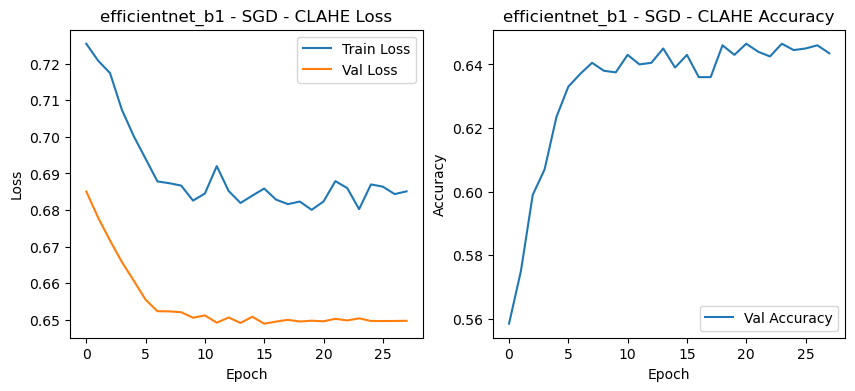

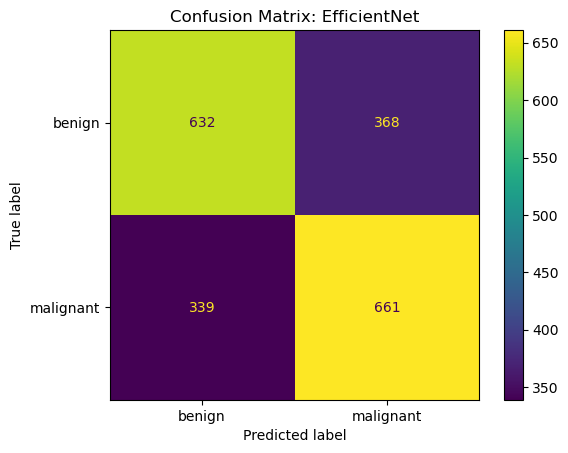

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7361 Acc: 0.5056
test Loss: 0.6901 Acc: 0.5295
Epoch 0 time: 104.06s
Epoch 1/19
----------
train Loss: 0.7206 Acc: 0.5261
test Loss: 0.6808 Acc: 0.5520
Epoch 1 time: 100.30s
Epoch 2/19
----------
train Loss: 0.7177 Acc: 0.5289
test Loss: 0.6745 Acc: 0.5720
Epoch 2 time: 101.63s
Epoch 3/19
----------
train Loss: 0.7034 Acc: 0.5475
test Loss: 0.6678 Acc: 0.5825
Epoch 3 time: 101.09s
Epoch 4/19
----------
train Loss: 0.7049 Acc: 0.5513
test Loss: 0.6613 Acc: 0.5985
Epoch 4 time: 98.42s
Epoch 5/19
----------
train Loss: 0.6939 Acc: 0.5604
test Loss: 0.6559 Acc: 0.6145
Epoch 5 time: 97.87s
Epoch 6/19
----------
train Loss: 0.6876 Acc: 0.5647
test Loss: 0.6528 Acc: 0.6210
Epoch 6 time: 98.03s
Epoch 7/19
----------
train Loss: 0.6822 Acc: 0.5737
test Loss: 0.6519 Acc: 0.6210
Epoch 7 time: 97.72s
Epoch 8/19
----------
train Loss: 0.6826 Acc: 0.5734
test Loss: 0.6528 Acc: 

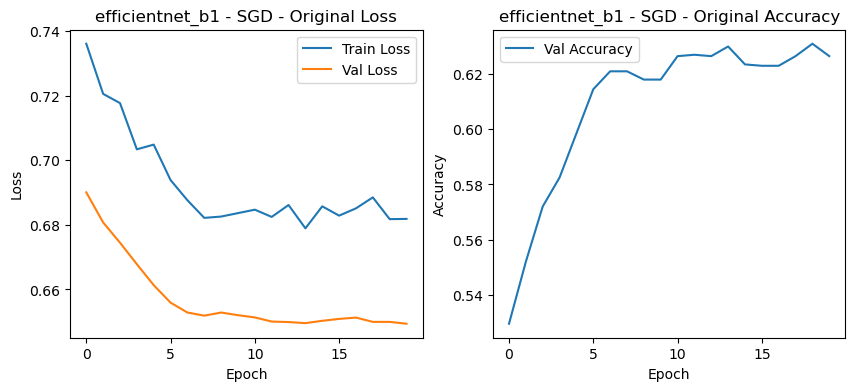

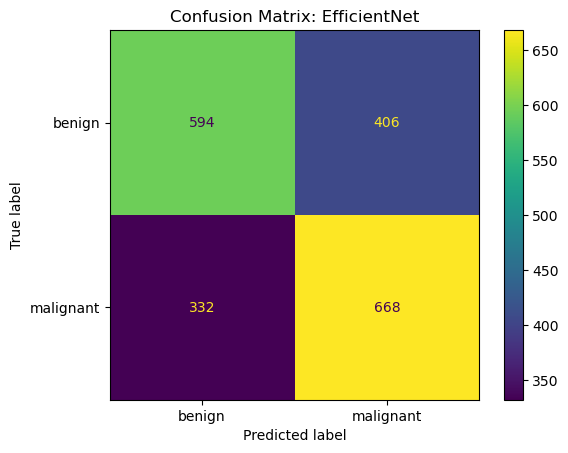

Epoch 0/29
----------
train Loss: 0.7367 Acc: 0.5065
test Loss: 0.6893 Acc: 0.5495
Epoch 0 time: 117.95s
Epoch 1/29
----------
train Loss: 0.7251 Acc: 0.5258
test Loss: 0.6814 Acc: 0.5645
Epoch 1 time: 121.27s
Epoch 2/29
----------
train Loss: 0.7159 Acc: 0.5339
test Loss: 0.6742 Acc: 0.5870
Epoch 2 time: 120.31s
Epoch 3/29
----------
train Loss: 0.7104 Acc: 0.5338
test Loss: 0.6693 Acc: 0.5960
Epoch 3 time: 120.89s
Epoch 4/29
----------
train Loss: 0.7007 Acc: 0.5561
test Loss: 0.6659 Acc: 0.6110
Epoch 4 time: 119.16s
Epoch 5/29
----------
train Loss: 0.6944 Acc: 0.5655
test Loss: 0.6606 Acc: 0.6160
Epoch 5 time: 100.20s
Epoch 6/29
----------
train Loss: 0.6901 Acc: 0.5696
test Loss: 0.6566 Acc: 0.6315
Epoch 6 time: 97.70s
Epoch 7/29
----------
train Loss: 0.6906 Acc: 0.5736
test Loss: 0.6544 Acc: 0.6320
Epoch 7 time: 102.55s
Epoch 8/29
----------
train Loss: 0.6856 Acc: 0.5800
test Loss: 0.6554 Acc: 0.6285
Epoch 8 time: 102.64s
Epoch 9/29
----------
train Loss: 0.6891 Acc: 0.5667
tes

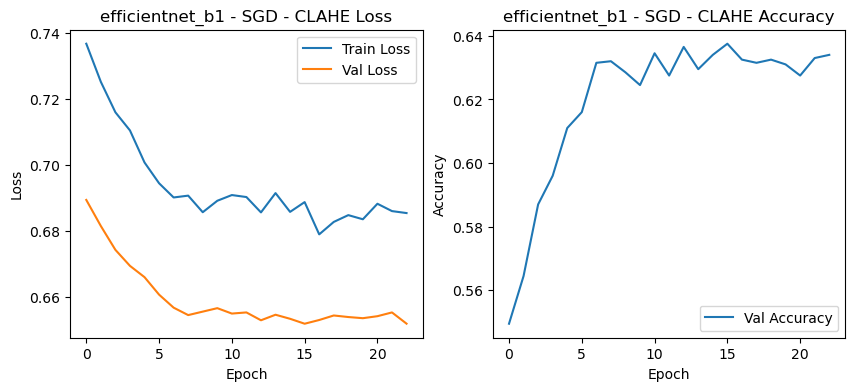

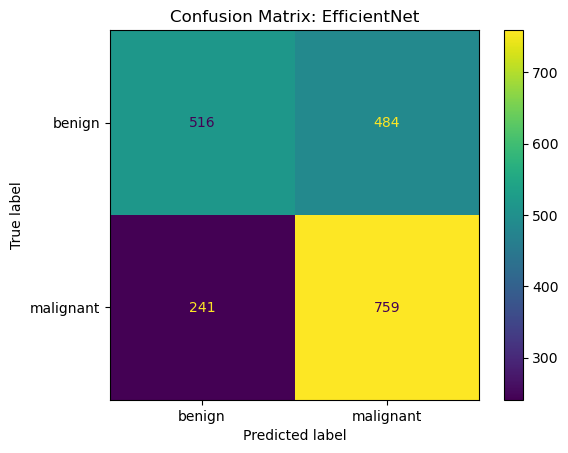

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7150 Acc: 0.5084
test Loss: 0.6916 Acc: 0.5390
Epoch 0 time: 104.96s
Epoch 1/19
----------
train Loss: 0.7061 Acc: 0.5310
test Loss: 0.6854 Acc: 0.5560
Epoch 1 time: 97.47s
Epoch 2/19
----------
train Loss: 0.7023 Acc: 0.5279
test Loss: 0.6783 Acc: 0.5705
Epoch 2 time: 104.02s
Epoch 3/19
----------
train Loss: 0.6917 Acc: 0.5491
test Loss: 0.6735 Acc: 0.5870
Epoch 3 time: 115.62s
Epoch 4/19
----------
train Loss: 0.6866 Acc: 0.5623
test Loss: 0.6673 Acc: 0.6000
Epoch 4 time: 115.28s
Epoch 5/19
----------
train Loss: 0.6818 Acc: 0.5664
test Loss: 0.6646 Acc: 0.6130
Epoch 5 time: 109.42s
Epoch 6/19
----------
train Loss: 0.6789 Acc: 0.5751
test Loss: 0.6590 Acc: 0.6300
Epoch 6 time: 112.24s
Epoch 7/19
----------
train Loss: 0.6746 Acc: 0.5814
test Loss: 0.6586 Acc: 0.6230
Epoch 7 time: 109.76s
Epoch 8/19
----------
train Loss: 0.6725 Acc: 0.5865
test Loss: 0.6596 A

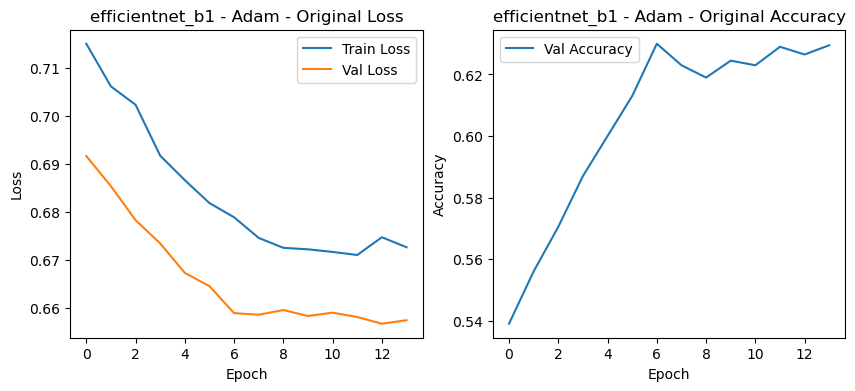

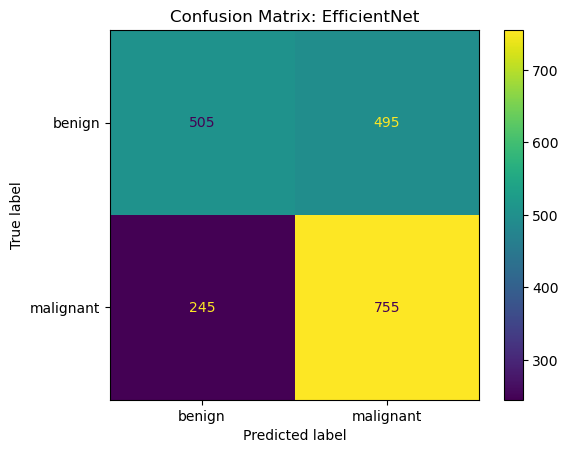

Epoch 0/29
----------
train Loss: 0.7191 Acc: 0.4984
test Loss: 0.7023 Acc: 0.4860
Epoch 0 time: 99.46s
Epoch 1/29
----------
train Loss: 0.7089 Acc: 0.5145
test Loss: 0.6937 Acc: 0.5110
Epoch 1 time: 98.89s
Epoch 2/29
----------
train Loss: 0.7021 Acc: 0.5295
test Loss: 0.6866 Acc: 0.5500
Epoch 2 time: 99.80s
Epoch 3/29
----------
train Loss: 0.6908 Acc: 0.5481
test Loss: 0.6792 Acc: 0.5655
Epoch 3 time: 98.11s
Epoch 4/29
----------
train Loss: 0.6889 Acc: 0.5586
test Loss: 0.6737 Acc: 0.5790
Epoch 4 time: 97.61s
Epoch 5/29
----------
train Loss: 0.6763 Acc: 0.5793
test Loss: 0.6694 Acc: 0.5910
Epoch 5 time: 98.89s
Epoch 6/29
----------
train Loss: 0.6746 Acc: 0.5767
test Loss: 0.6646 Acc: 0.6085
Epoch 6 time: 100.79s
Epoch 7/29
----------
train Loss: 0.6708 Acc: 0.5843
test Loss: 0.6646 Acc: 0.6040
Epoch 7 time: 98.94s
Epoch 8/29
----------
train Loss: 0.6725 Acc: 0.5881
test Loss: 0.6618 Acc: 0.6080
Epoch 8 time: 98.94s
Epoch 9/29
----------
train Loss: 0.6679 Acc: 0.5901
test Loss:

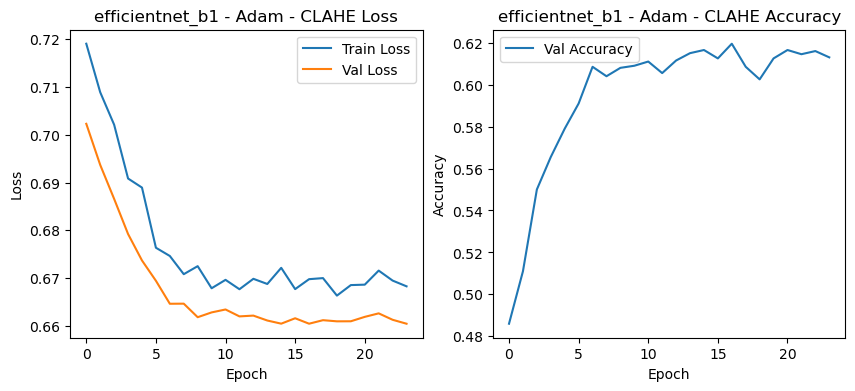

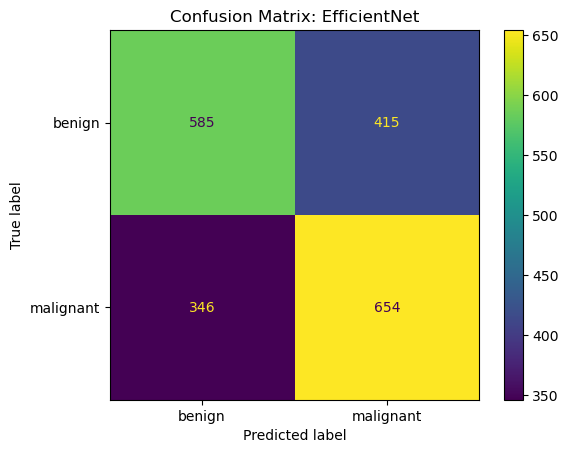

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7019 Acc: 0.5289
test Loss: 0.6835 Acc: 0.5665
Epoch 0 time: 102.55s
Epoch 1/19
----------
train Loss: 0.6964 Acc: 0.5443
test Loss: 0.6759 Acc: 0.5985
Epoch 1 time: 105.38s
Epoch 2/19
----------
train Loss: 0.6887 Acc: 0.5577
test Loss: 0.6728 Acc: 0.6025
Epoch 2 time: 107.18s
Epoch 3/19
----------
train Loss: 0.6881 Acc: 0.5615
test Loss: 0.6672 Acc: 0.6130
Epoch 3 time: 104.42s
Epoch 4/19
----------
train Loss: 0.6824 Acc: 0.5727
test Loss: 0.6647 Acc: 0.6170
Epoch 4 time: 104.62s
Epoch 5/19
----------
train Loss: 0.6740 Acc: 0.5811
test Loss: 0.6590 Acc: 0.6310
Epoch 5 time: 101.58s
Epoch 6/19
----------
train Loss: 0.6737 Acc: 0.5853
test Loss: 0.6570 Acc: 0.6355
Epoch 6 time: 101.72s
Epoch 7/19
----------
train Loss: 0.6692 Acc: 0.5904
test Loss: 0.6557 Acc: 0.6310
Epoch 7 time: 102.54s
Epoch 8/19
----------
train Loss: 0.6737 Acc: 0.5819
test Loss: 0.6566 

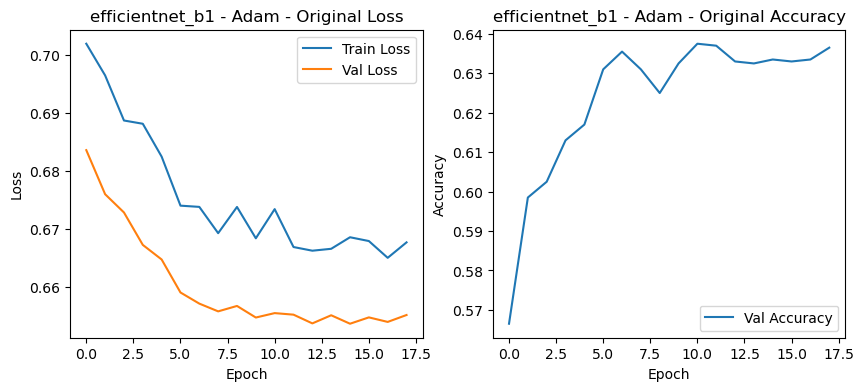

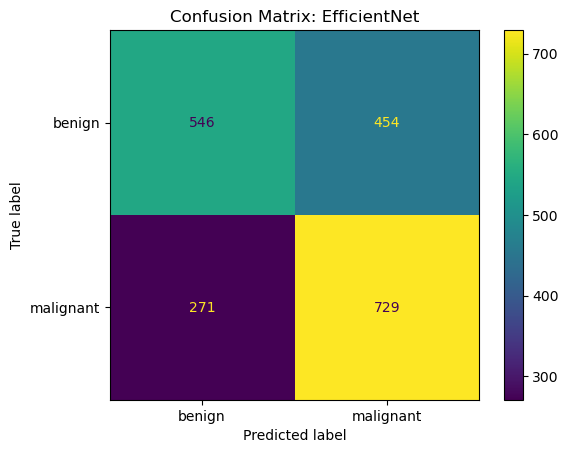

Epoch 0/29
----------
train Loss: 0.7327 Acc: 0.4804
test Loss: 0.7173 Acc: 0.4690
Epoch 0 time: 105.95s
Epoch 1/29
----------
train Loss: 0.7225 Acc: 0.4956
test Loss: 0.7059 Acc: 0.5060
Epoch 1 time: 107.19s
Epoch 2/29
----------
train Loss: 0.7178 Acc: 0.5035
test Loss: 0.6980 Acc: 0.5300
Epoch 2 time: 102.13s
Epoch 3/29
----------
train Loss: 0.7015 Acc: 0.5323
test Loss: 0.6913 Acc: 0.5495
Epoch 3 time: 114.44s
Epoch 4/29
----------
train Loss: 0.6930 Acc: 0.5521
test Loss: 0.6846 Acc: 0.5730
Epoch 4 time: 100.65s
Epoch 5/29
----------
train Loss: 0.6904 Acc: 0.5530
test Loss: 0.6782 Acc: 0.5795
Epoch 5 time: 99.85s
Epoch 6/29
----------
train Loss: 0.6841 Acc: 0.5650
test Loss: 0.6717 Acc: 0.6045
Epoch 6 time: 101.42s
Epoch 7/29
----------
train Loss: 0.6784 Acc: 0.5777
test Loss: 0.6714 Acc: 0.6025
Epoch 7 time: 100.01s
Epoch 8/29
----------
train Loss: 0.6832 Acc: 0.5683
test Loss: 0.6702 Acc: 0.6025
Epoch 8 time: 98.74s
Epoch 9/29
----------
train Loss: 0.6783 Acc: 0.5725
test

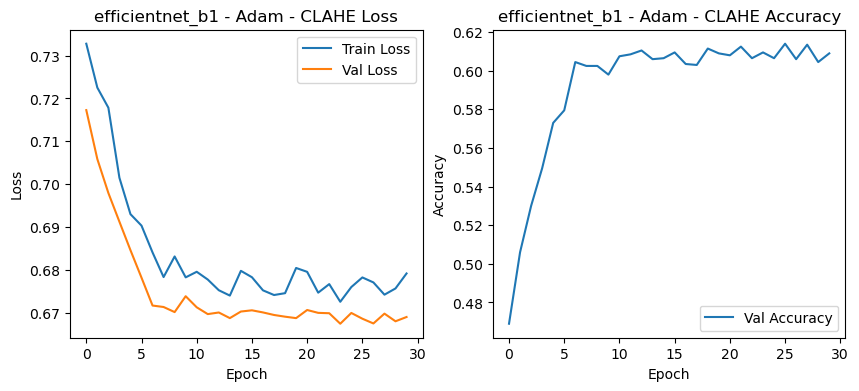

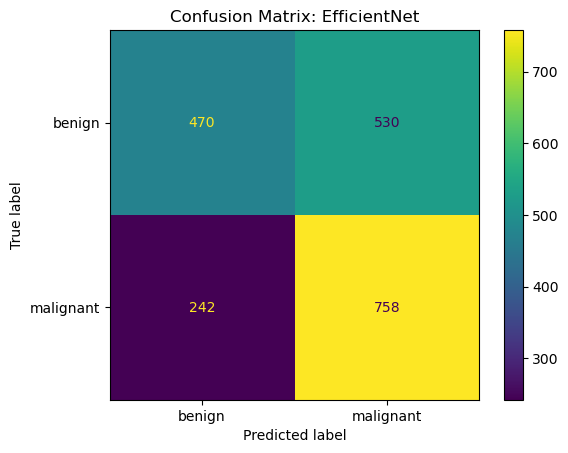

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7380 Acc: 0.5074
test Loss: 0.7047 Acc: 0.5110
Epoch 0 time: 96.73s
Epoch 1/19
----------
train Loss: 0.7285 Acc: 0.5192
test Loss: 0.6946 Acc: 0.5340
Epoch 1 time: 98.72s
Epoch 2/19
----------
train Loss: 0.7293 Acc: 0.5174
test Loss: 0.6877 Acc: 0.5440
Epoch 2 time: 102.42s
Epoch 3/19
----------
train Loss: 0.7121 Acc: 0.5308
test Loss: 0.6819 Acc: 0.5520
Epoch 3 time: 104.63s
Epoch 4/19
----------
train Loss: 0.7054 Acc: 0.5490
test Loss: 0.6737 Acc: 0.5745
Epoch 4 time: 114.71s
Epoch 5/19
----------
train Loss: 0.6983 Acc: 0.5610
test Loss: 0.6701 Acc: 0.5835
Epoch 5 time: 114.97s
Epoch 6/19
----------
train Loss: 0.6871 Acc: 0.5696
test Loss: 0.6646 Acc: 0.5955
Epoch 6 time: 116.68s
Epoch 7/19
----------
train Loss: 0.6922 Acc: 0.5630
test Loss: 0.6641 Acc: 0.5995
Epoch 7 time: 119.65s
Epoch 8/19
----------
train Loss: 0.6863 Acc: 0.5726
test Loss: 0.6620 Ac

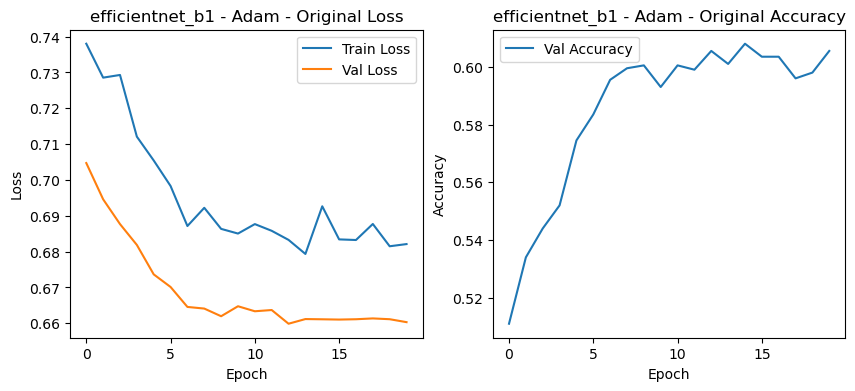

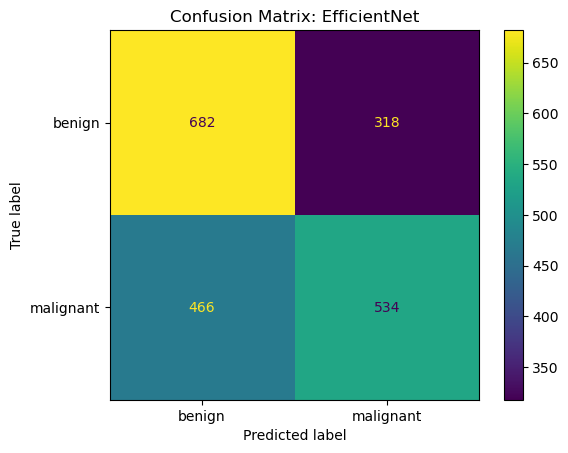

Epoch 0/29
----------
train Loss: 0.7480 Acc: 0.4964
test Loss: 0.7060 Acc: 0.5130
Epoch 0 time: 109.70s
Epoch 1/29
----------
train Loss: 0.7355 Acc: 0.5201
test Loss: 0.6987 Acc: 0.5270
Epoch 1 time: 103.15s
Epoch 2/29
----------
train Loss: 0.7330 Acc: 0.5205
test Loss: 0.6910 Acc: 0.5565
Epoch 2 time: 103.42s
Epoch 3/29
----------
train Loss: 0.7153 Acc: 0.5358
test Loss: 0.6857 Acc: 0.5640
Epoch 3 time: 100.12s
Epoch 4/29
----------
train Loss: 0.7129 Acc: 0.5429
test Loss: 0.6789 Acc: 0.5850
Epoch 4 time: 96.37s
Epoch 5/29
----------
train Loss: 0.7033 Acc: 0.5517
test Loss: 0.6749 Acc: 0.5890
Epoch 5 time: 98.14s
Epoch 6/29
----------
train Loss: 0.6998 Acc: 0.5556
test Loss: 0.6700 Acc: 0.6055
Epoch 6 time: 97.19s
Epoch 7/29
----------
train Loss: 0.6941 Acc: 0.5673
test Loss: 0.6691 Acc: 0.6055
Epoch 7 time: 101.49s
Epoch 8/29
----------
train Loss: 0.6951 Acc: 0.5633
test Loss: 0.6694 Acc: 0.6035
Epoch 8 time: 101.70s
Epoch 9/29
----------
train Loss: 0.6983 Acc: 0.5591
test 

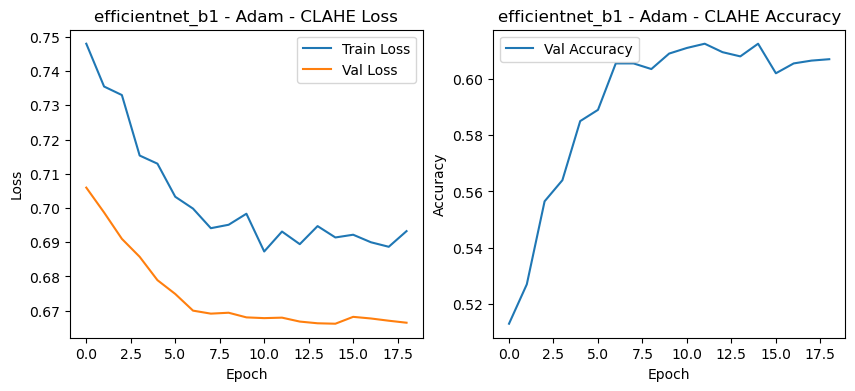

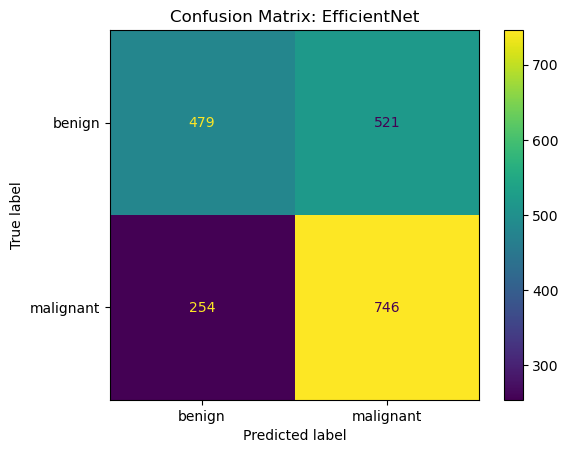

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7323 Acc: 0.5089
test Loss: 0.6898 Acc: 0.5355
Epoch 0 time: 103.76s
Epoch 1/19
----------
train Loss: 0.7321 Acc: 0.5118
test Loss: 0.6818 Acc: 0.5520
Epoch 1 time: 105.43s
Epoch 2/19
----------
train Loss: 0.7177 Acc: 0.5271
test Loss: 0.6739 Acc: 0.5815
Epoch 2 time: 105.16s
Epoch 3/19
----------
train Loss: 0.7121 Acc: 0.5404
test Loss: 0.6666 Acc: 0.6050
Epoch 3 time: 101.45s
Epoch 4/19
----------
train Loss: 0.7014 Acc: 0.5507
test Loss: 0.6610 Acc: 0.6210
Epoch 4 time: 101.42s
Epoch 5/19
----------
train Loss: 0.7023 Acc: 0.5526
test Loss: 0.6562 Acc: 0.6155
Epoch 5 time: 97.43s
Epoch 6/19
----------
train Loss: 0.6876 Acc: 0.5684
test Loss: 0.6514 Acc: 0.6430
Epoch 6 time: 98.19s
Epoch 7/19
----------
train Loss: 0.6907 Acc: 0.5690
test Loss: 0.6505 Acc: 0.6380
Epoch 7 time: 103.47s
Epoch 8/19
----------
train Loss: 0.6845 Acc: 0.5757
test Loss: 0.6501 Ac

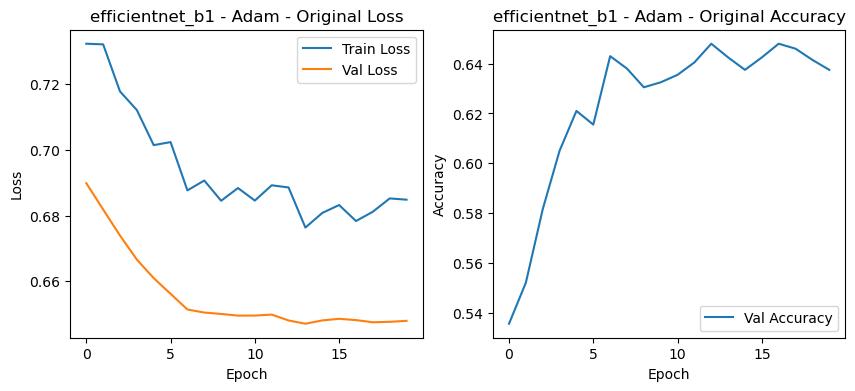

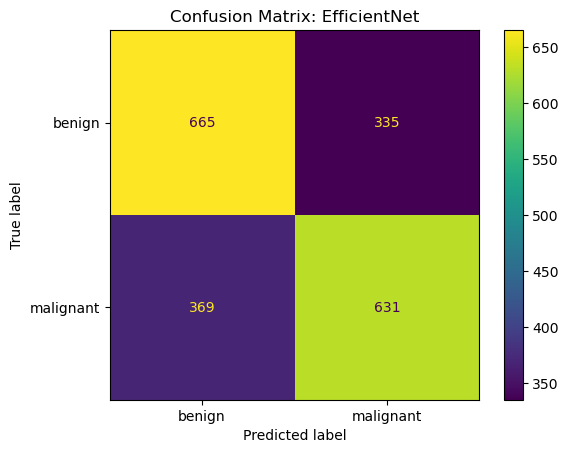

Epoch 0/29
----------
train Loss: 0.7313 Acc: 0.5065
test Loss: 0.6863 Acc: 0.5525
Epoch 0 time: 99.04s
Epoch 1/29
----------
train Loss: 0.7114 Acc: 0.5315
test Loss: 0.6797 Acc: 0.5745
Epoch 1 time: 100.19s
Epoch 2/29
----------
train Loss: 0.7101 Acc: 0.5355
test Loss: 0.6734 Acc: 0.5995
Epoch 2 time: 100.01s
Epoch 3/29
----------
train Loss: 0.7001 Acc: 0.5555
test Loss: 0.6677 Acc: 0.6195
Epoch 3 time: 98.47s
Epoch 4/29
----------
train Loss: 0.6978 Acc: 0.5546
test Loss: 0.6616 Acc: 0.6240
Epoch 4 time: 102.98s
Epoch 5/29
----------
train Loss: 0.6832 Acc: 0.5743
test Loss: 0.6583 Acc: 0.6350
Epoch 5 time: 98.75s
Epoch 6/29
----------
train Loss: 0.6822 Acc: 0.5810
test Loss: 0.6545 Acc: 0.6310
Epoch 6 time: 100.88s
Epoch 7/29
----------
train Loss: 0.6891 Acc: 0.5657
test Loss: 0.6543 Acc: 0.6335
Epoch 7 time: 100.72s
Epoch 8/29
----------
train Loss: 0.6853 Acc: 0.5730
test Loss: 0.6537 Acc: 0.6340
Epoch 8 time: 99.34s
Epoch 9/29
----------
train Loss: 0.6833 Acc: 0.5780
test L

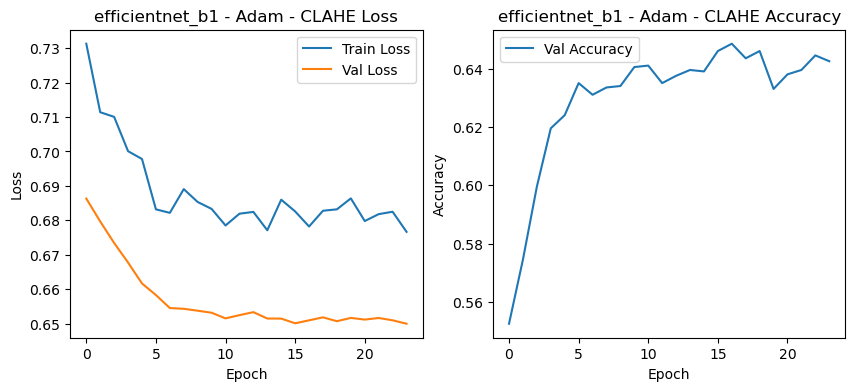

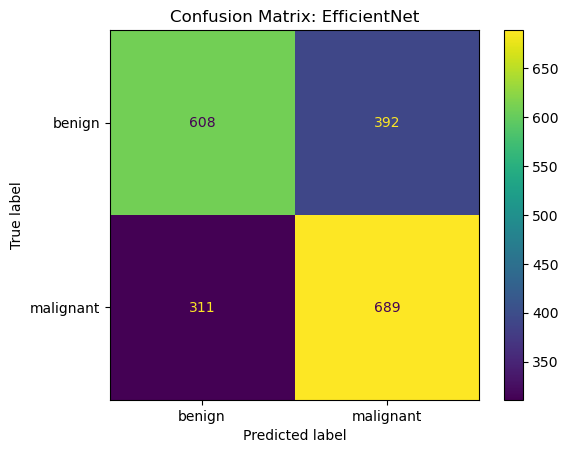

Entrenando efficientnet_b1 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7158 Acc: 0.5058
test Loss: 0.6876 Acc: 0.5505
Epoch 0 time: 97.59s
Epoch 1/19
----------
train Loss: 0.7095 Acc: 0.5220
test Loss: 0.6784 Acc: 0.5705
Epoch 1 time: 101.87s
Epoch 2/19
----------
train Loss: 0.6916 Acc: 0.5516
test Loss: 0.6734 Acc: 0.5905
Epoch 2 time: 99.43s
Epoch 3/19
----------
train Loss: 0.6946 Acc: 0.5457
test Loss: 0.6689 Acc: 0.6025
Epoch 3 time: 99.57s
Epoch 4/19
----------
train Loss: 0.6907 Acc: 0.5587
test Loss: 0.6655 Acc: 0.6095
Epoch 4 time: 100.73s
Epoch 5/19
----------
train Loss: 0.6786 Acc: 0.5774
test Loss: 0.6620 Acc: 0.6215
Epoch 5 time: 100.97s
Epoch 6/19
----------
train Loss: 0.6774 Acc: 0.5809
test Loss: 0.6576 Acc: 0.6270
Epoch 6 time: 100.36s
Epoch 7/19
----------
train Loss: 0.6732 Acc: 0.5807
test Loss: 0.6562 Acc: 0.6310
Epoch 7 time: 103.06s
Epoch 8/19
----------
train Loss: 0.6730 Acc: 0.5926
test Loss: 0.6573 Ac

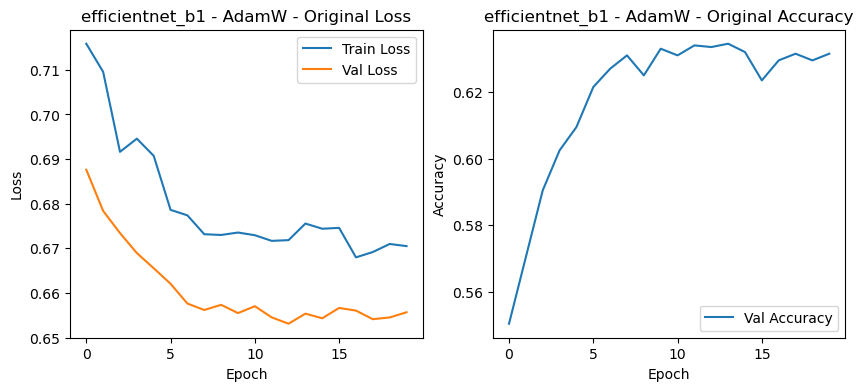

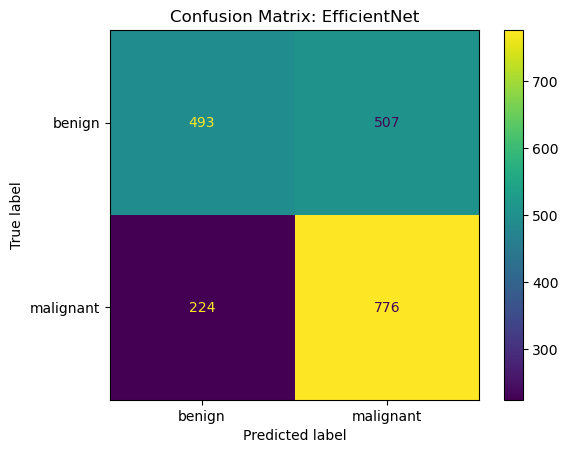

Epoch 0/29
----------
train Loss: 0.7057 Acc: 0.5175
test Loss: 0.6903 Acc: 0.5320
Epoch 0 time: 98.47s
Epoch 1/29
----------
train Loss: 0.7027 Acc: 0.5315
test Loss: 0.6819 Acc: 0.5525
Epoch 1 time: 99.24s
Epoch 2/29
----------
train Loss: 0.6963 Acc: 0.5381
test Loss: 0.6766 Acc: 0.5740
Epoch 2 time: 99.58s
Epoch 3/29
----------
train Loss: 0.6901 Acc: 0.5543
test Loss: 0.6713 Acc: 0.5910
Epoch 3 time: 98.98s
Epoch 4/29
----------
train Loss: 0.6864 Acc: 0.5576
test Loss: 0.6649 Acc: 0.6050
Epoch 4 time: 98.31s
Epoch 5/29
----------
train Loss: 0.6795 Acc: 0.5710
test Loss: 0.6606 Acc: 0.6140
Epoch 5 time: 100.02s
Epoch 6/29
----------
train Loss: 0.6699 Acc: 0.5913
test Loss: 0.6565 Acc: 0.6260
Epoch 6 time: 97.52s
Epoch 7/29
----------
train Loss: 0.6702 Acc: 0.5887
test Loss: 0.6563 Acc: 0.6260
Epoch 7 time: 99.00s
Epoch 8/29
----------
train Loss: 0.6663 Acc: 0.5949
test Loss: 0.6556 Acc: 0.6330
Epoch 8 time: 98.79s
Epoch 9/29
----------
train Loss: 0.6629 Acc: 0.6033
test Loss:

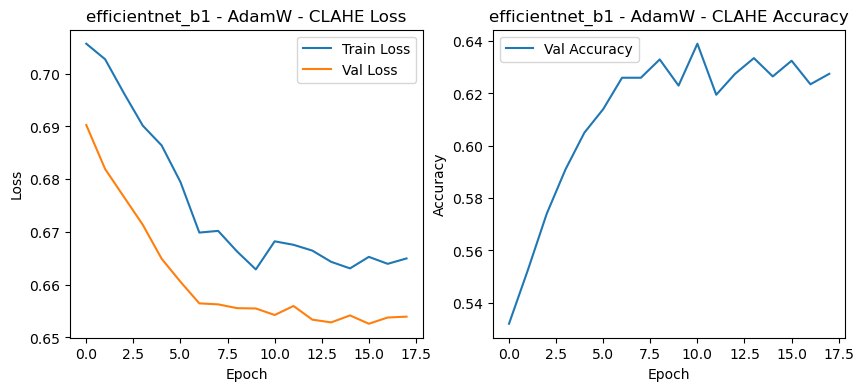

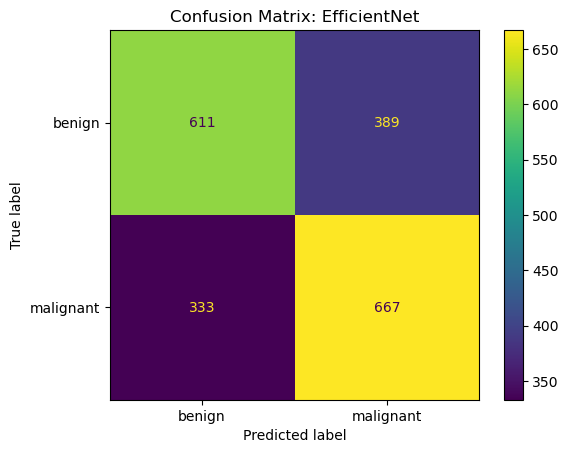

Entrenando efficientnet_b1 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7083 Acc: 0.5108
test Loss: 0.6849 Acc: 0.5460
Epoch 0 time: 96.91s
Epoch 1/19
----------
train Loss: 0.6959 Acc: 0.5378
test Loss: 0.6807 Acc: 0.5610
Epoch 1 time: 99.05s
Epoch 2/19
----------
train Loss: 0.6947 Acc: 0.5385
test Loss: 0.6741 Acc: 0.5800
Epoch 2 time: 99.60s
Epoch 3/19
----------
train Loss: 0.6862 Acc: 0.5575
test Loss: 0.6688 Acc: 0.6005
Epoch 3 time: 98.75s
Epoch 4/19
----------
train Loss: 0.6864 Acc: 0.5617
test Loss: 0.6637 Acc: 0.6145
Epoch 4 time: 98.36s
Epoch 5/19
----------
train Loss: 0.6806 Acc: 0.5749
test Loss: 0.6593 Acc: 0.6295
Epoch 5 time: 98.88s
Epoch 6/19
----------
train Loss: 0.6755 Acc: 0.5805
test Loss: 0.6546 Acc: 0.6280
Epoch 6 time: 99.46s
Epoch 7/19
----------
train Loss: 0.6696 Acc: 0.5866
test Loss: 0.6549 Acc: 0.6280
Epoch 7 time: 98.29s
Epoch 8/19
----------
train Loss: 0.6729 Acc: 0.5801
test Loss: 0.6538 Acc: 0.

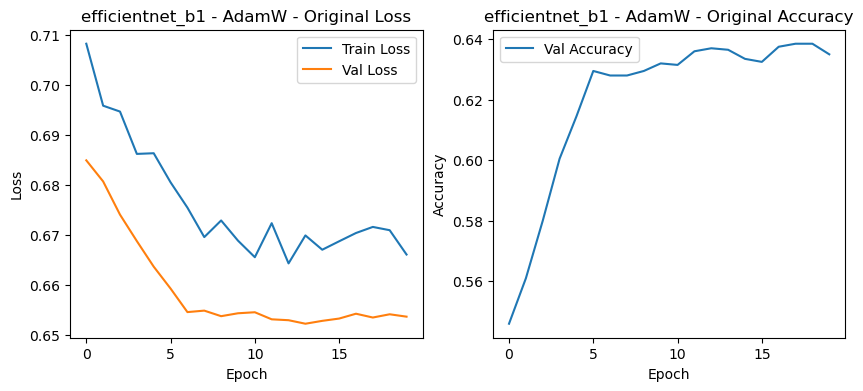

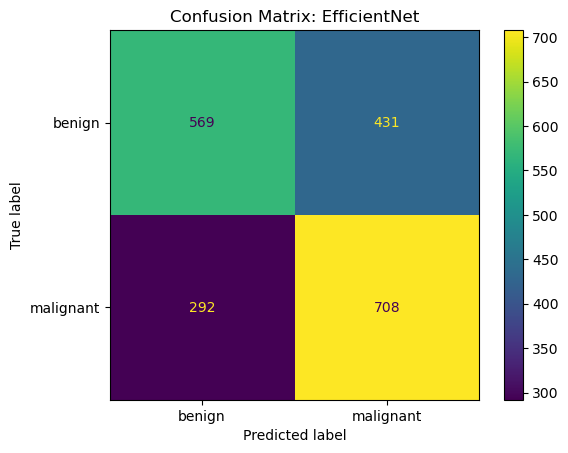

Epoch 0/29
----------
train Loss: 0.7190 Acc: 0.5021
test Loss: 0.6952 Acc: 0.5310
Epoch 0 time: 98.60s
Epoch 1/29
----------
train Loss: 0.7130 Acc: 0.5191
test Loss: 0.6883 Acc: 0.5455
Epoch 1 time: 98.18s
Epoch 2/29
----------
train Loss: 0.7040 Acc: 0.5256
test Loss: 0.6784 Acc: 0.5810
Epoch 2 time: 97.77s
Epoch 3/29
----------
train Loss: 0.6947 Acc: 0.5525
test Loss: 0.6718 Acc: 0.6010
Epoch 3 time: 103.18s
Epoch 4/29
----------
train Loss: 0.6857 Acc: 0.5607
test Loss: 0.6671 Acc: 0.6090
Epoch 4 time: 99.74s
Epoch 5/29
----------
train Loss: 0.6790 Acc: 0.5670
test Loss: 0.6617 Acc: 0.6200
Epoch 5 time: 97.50s
Epoch 6/29
----------
train Loss: 0.6763 Acc: 0.5797
test Loss: 0.6571 Acc: 0.6225
Epoch 6 time: 99.14s
Epoch 7/29
----------
train Loss: 0.6718 Acc: 0.5881
test Loss: 0.6572 Acc: 0.6315
Epoch 7 time: 110.80s
Epoch 8/29
----------
train Loss: 0.6732 Acc: 0.5817
test Loss: 0.6552 Acc: 0.6375
Epoch 8 time: 104.73s
Epoch 9/29
----------
train Loss: 0.6700 Acc: 0.5938
test Los

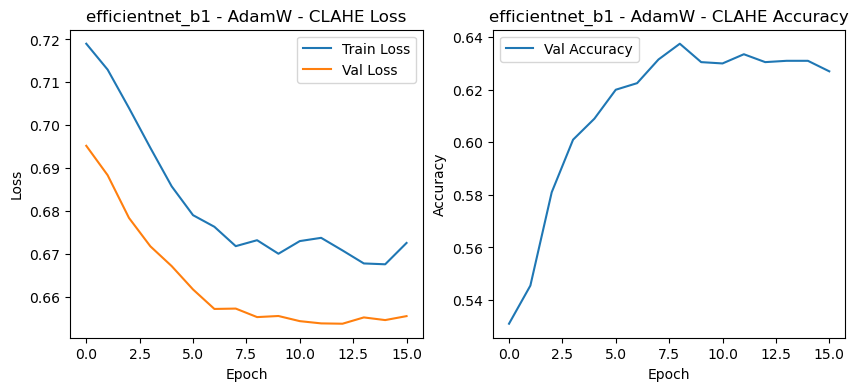

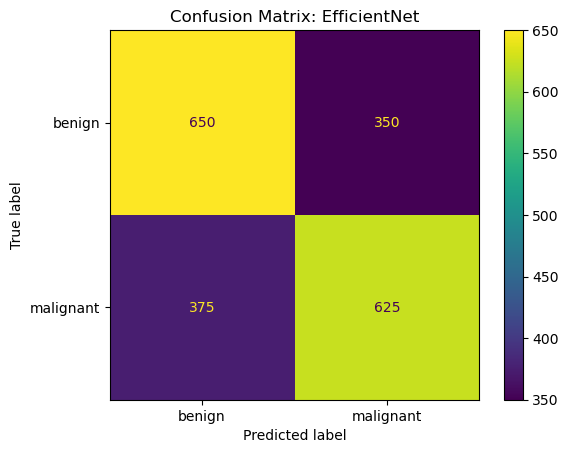

Entrenando efficientnet_b1 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7593 Acc: 0.5032
test Loss: 0.7033 Acc: 0.5170
Epoch 0 time: 103.61s
Epoch 1/19
----------
train Loss: 0.7365 Acc: 0.5182
test Loss: 0.6937 Acc: 0.5365
Epoch 1 time: 103.46s
Epoch 2/19
----------
train Loss: 0.7351 Acc: 0.5164
test Loss: 0.6846 Acc: 0.5570
Epoch 2 time: 102.05s
Epoch 3/19
----------
train Loss: 0.7197 Acc: 0.5310
test Loss: 0.6776 Acc: 0.5710
Epoch 3 time: 103.75s
Epoch 4/19
----------
train Loss: 0.7097 Acc: 0.5470
test Loss: 0.6715 Acc: 0.5835
Epoch 4 time: 103.69s
Epoch 5/19
----------
train Loss: 0.7046 Acc: 0.5506
test Loss: 0.6660 Acc: 0.5940
Epoch 5 time: 104.40s
Epoch 6/19
----------
train Loss: 0.6988 Acc: 0.5594
test Loss: 0.6637 Acc: 0.6045
Epoch 6 time: 106.84s
Epoch 7/19
----------
train Loss: 0.6945 Acc: 0.5660
test Loss: 0.6634 Acc: 0.6055
Epoch 7 time: 107.89s
Epoch 8/19
----------
train Loss: 0.6921 Acc: 0.5719
test Loss: 0.6597

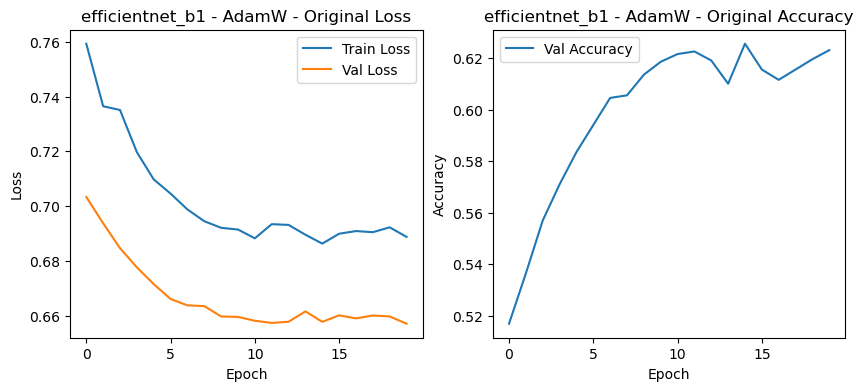

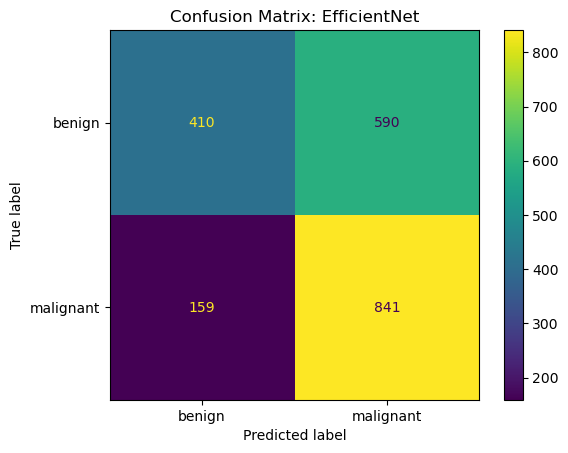

Epoch 0/29
----------
train Loss: 0.7342 Acc: 0.5141
test Loss: 0.7089 Acc: 0.4945
Epoch 0 time: 101.79s
Epoch 1/29
----------
train Loss: 0.7298 Acc: 0.5212
test Loss: 0.7022 Acc: 0.5035
Epoch 1 time: 102.66s
Epoch 2/29
----------
train Loss: 0.7205 Acc: 0.5296
test Loss: 0.6925 Acc: 0.5275
Epoch 2 time: 104.29s
Epoch 3/29
----------
train Loss: 0.7167 Acc: 0.5305
test Loss: 0.6867 Acc: 0.5450
Epoch 3 time: 102.06s
Epoch 4/29
----------
train Loss: 0.7099 Acc: 0.5449
test Loss: 0.6795 Acc: 0.5615
Epoch 4 time: 101.49s
Epoch 5/29
----------
train Loss: 0.6982 Acc: 0.5547
test Loss: 0.6798 Acc: 0.5660
Epoch 5 time: 103.46s
Epoch 6/29
----------
train Loss: 0.6975 Acc: 0.5589
test Loss: 0.6746 Acc: 0.5840
Epoch 6 time: 103.87s
Epoch 7/29
----------
train Loss: 0.6914 Acc: 0.5700
test Loss: 0.6723 Acc: 0.5835
Epoch 7 time: 104.90s
Epoch 8/29
----------
train Loss: 0.6915 Acc: 0.5656
test Loss: 0.6705 Acc: 0.5900
Epoch 8 time: 104.44s
Epoch 9/29
----------
train Loss: 0.6939 Acc: 0.5613
te

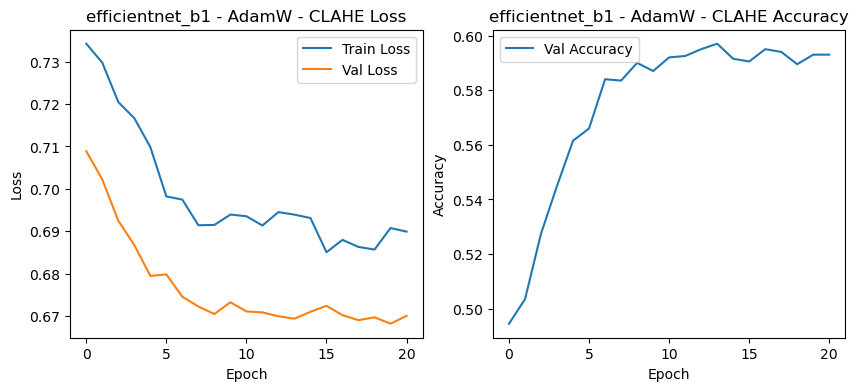

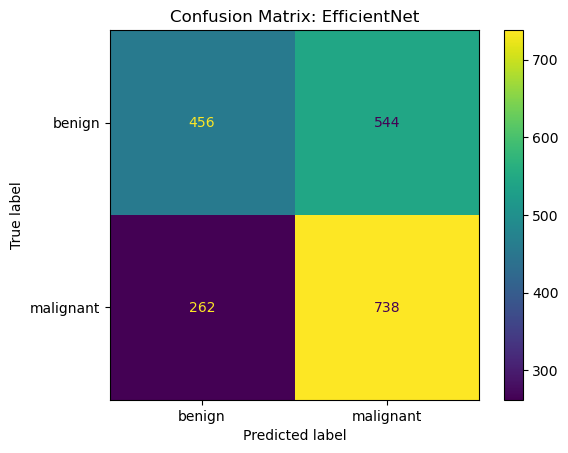

Entrenando efficientnet_b1 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7243 Acc: 0.5139
test Loss: 0.6828 Acc: 0.5515
Epoch 0 time: 115.30s
Epoch 1/19
----------
train Loss: 0.7170 Acc: 0.5248
test Loss: 0.6770 Acc: 0.5665
Epoch 1 time: 109.31s
Epoch 2/19
----------
train Loss: 0.7097 Acc: 0.5295
test Loss: 0.6696 Acc: 0.5970
Epoch 2 time: 101.18s
Epoch 3/19
----------
train Loss: 0.7015 Acc: 0.5503
test Loss: 0.6648 Acc: 0.6180
Epoch 3 time: 104.07s
Epoch 4/19
----------
train Loss: 0.6984 Acc: 0.5564
test Loss: 0.6601 Acc: 0.6285
Epoch 4 time: 105.51s
Epoch 5/19
----------
train Loss: 0.6959 Acc: 0.5549
test Loss: 0.6548 Acc: 0.6410
Epoch 5 time: 102.60s
Epoch 6/19
----------
train Loss: 0.6888 Acc: 0.5641
test Loss: 0.6506 Acc: 0.6515
Epoch 6 time: 103.02s
Epoch 7/19
----------
train Loss: 0.6849 Acc: 0.5690
test Loss: 0.6514 Acc: 0.6525
Epoch 7 time: 102.41s
Epoch 8/19
----------
train Loss: 0.6823 Acc: 0.5723
test Loss: 0.6495

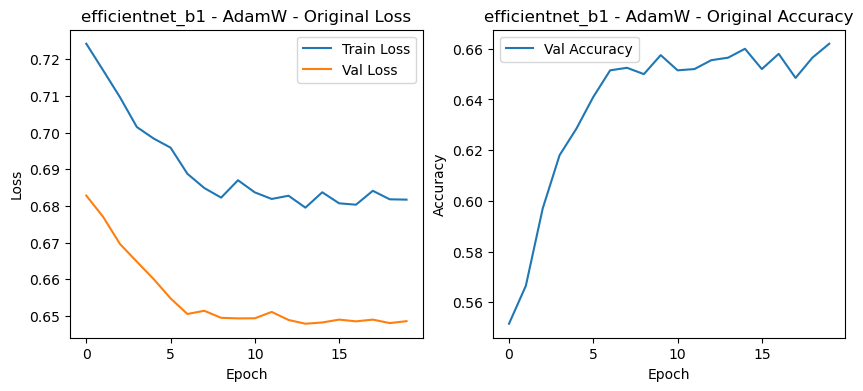

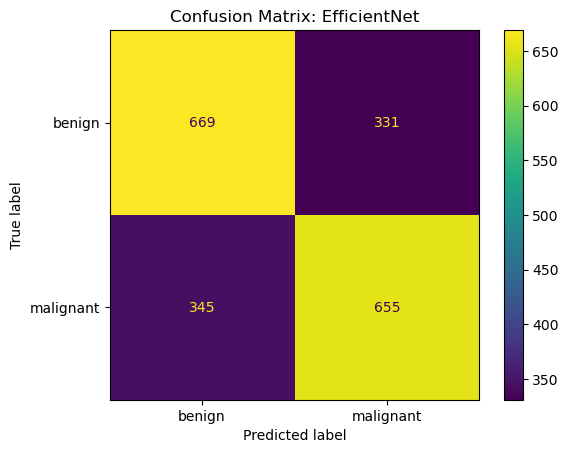

Epoch 0/29
----------
train Loss: 0.7356 Acc: 0.5059
test Loss: 0.6892 Acc: 0.5435
Epoch 0 time: 99.68s
Epoch 1/29
----------
train Loss: 0.7243 Acc: 0.5135
test Loss: 0.6812 Acc: 0.5565
Epoch 1 time: 99.64s
Epoch 2/29
----------
train Loss: 0.7175 Acc: 0.5320
test Loss: 0.6726 Acc: 0.5865
Epoch 2 time: 102.98s
Epoch 3/29
----------
train Loss: 0.7071 Acc: 0.5446
test Loss: 0.6685 Acc: 0.5945
Epoch 3 time: 99.73s
Epoch 4/29
----------
train Loss: 0.7020 Acc: 0.5535
test Loss: 0.6608 Acc: 0.6055
Epoch 4 time: 101.50s
Epoch 5/29
----------
train Loss: 0.6963 Acc: 0.5599
test Loss: 0.6574 Acc: 0.6185
Epoch 5 time: 99.75s
Epoch 6/29
----------
train Loss: 0.6900 Acc: 0.5651
test Loss: 0.6522 Acc: 0.6205
Epoch 6 time: 99.67s
Epoch 7/29
----------
train Loss: 0.6843 Acc: 0.5751
test Loss: 0.6532 Acc: 0.6200
Epoch 7 time: 100.36s
Epoch 8/29
----------
train Loss: 0.6839 Acc: 0.5773
test Loss: 0.6509 Acc: 0.6265
Epoch 8 time: 100.54s
Epoch 9/29
----------
train Loss: 0.6842 Acc: 0.5729
test Lo

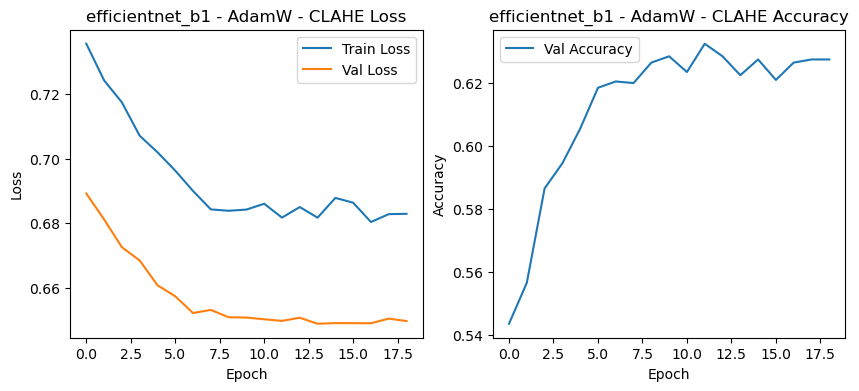

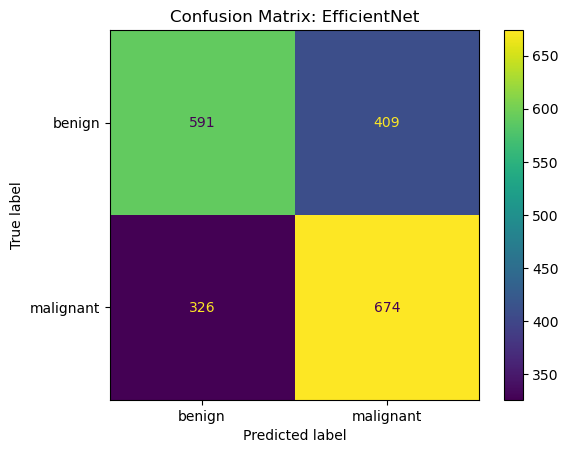

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7101 Acc: 0.5065
test Loss: 0.6909 Acc: 0.5285
Epoch 0 time: 117.24s
Epoch 1/19
----------
train Loss: 0.6966 Acc: 0.5353
test Loss: 0.6790 Acc: 0.5810
Epoch 1 time: 119.20s
Epoch 2/19
----------
train Loss: 0.6859 Acc: 0.5623
test Loss: 0.6690 Acc: 0.6010
Epoch 2 time: 118.46s
Epoch 3/19
----------
train Loss: 0.6725 Acc: 0.5879
test Loss: 0.6611 Acc: 0.6270
Epoch 3 time: 120.65s
Epoch 4/19
----------
train Loss: 0.6648 Acc: 0.5998
test Loss: 0.6525 Acc: 0.6420
Epoch 4 time: 120.81s
Epoch 5/19
----------
train Loss: 0.6560 Acc: 0.6119
test Loss: 0.6497 Acc: 0.6450
Epoch 5 time: 119.59s
Epoch 6/19
----------
train Loss: 0.6513 Acc: 0.6211
test Loss: 0.6415 Acc: 0.6550
Epoch 6 time: 118.08s
Epoch 7/19
----------
train Loss: 0.6464 Acc: 0.6282
test Loss: 0.6439 Acc: 0.6580
Epoch 7 time: 118.16s
Epoch 8/19
----------
train Loss: 0.6444 Acc: 0.6232
test Loss: 0.6424 A

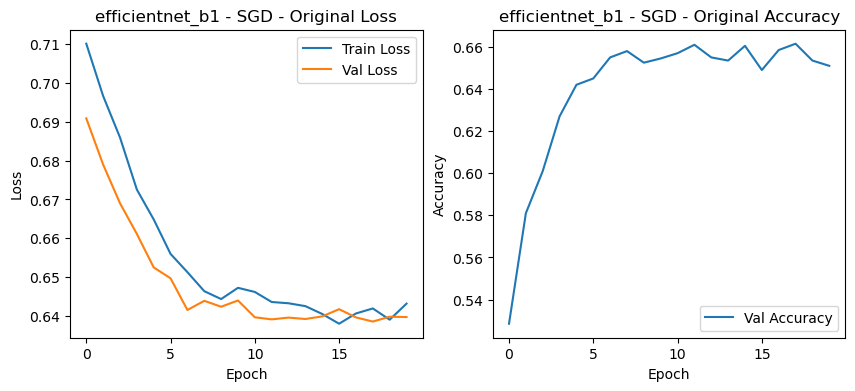

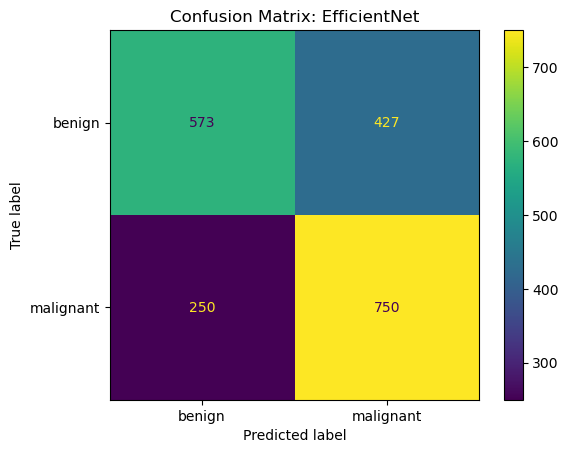

Epoch 0/29
----------
train Loss: 0.7114 Acc: 0.5118
test Loss: 0.6900 Acc: 0.5385
Epoch 0 time: 111.29s
Epoch 1/29
----------
train Loss: 0.6969 Acc: 0.5408
test Loss: 0.6734 Acc: 0.5840
Epoch 1 time: 110.82s
Epoch 2/29
----------
train Loss: 0.6839 Acc: 0.5685
test Loss: 0.6650 Acc: 0.5995
Epoch 2 time: 104.05s
Epoch 3/29
----------
train Loss: 0.6767 Acc: 0.5801
test Loss: 0.6541 Acc: 0.6195
Epoch 3 time: 99.84s
Epoch 4/29
----------
train Loss: 0.6622 Acc: 0.5963
test Loss: 0.6480 Acc: 0.6345
Epoch 4 time: 109.55s
Epoch 5/29
----------
train Loss: 0.6547 Acc: 0.6166
test Loss: 0.6411 Acc: 0.6435
Epoch 5 time: 117.32s
Epoch 6/29
----------
train Loss: 0.6437 Acc: 0.6278
test Loss: 0.6369 Acc: 0.6475
Epoch 6 time: 115.63s
Epoch 7/29
----------
train Loss: 0.6414 Acc: 0.6260
test Loss: 0.6376 Acc: 0.6440
Epoch 7 time: 105.65s
Epoch 8/29
----------
train Loss: 0.6444 Acc: 0.6274
test Loss: 0.6372 Acc: 0.6425
Epoch 8 time: 100.64s
Epoch 9/29
----------
train Loss: 0.6389 Acc: 0.6304
tes

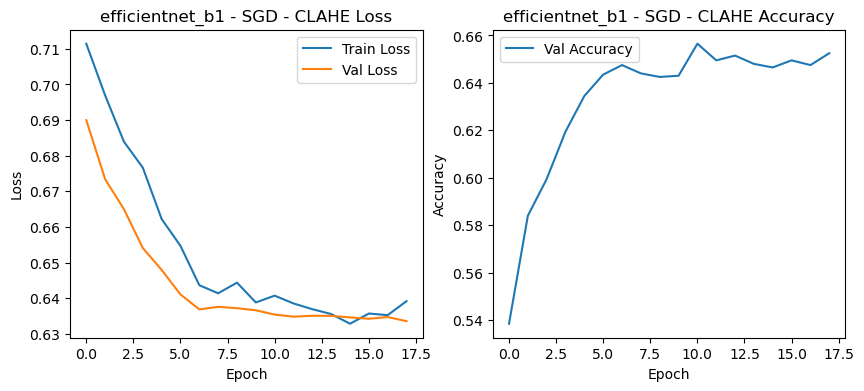

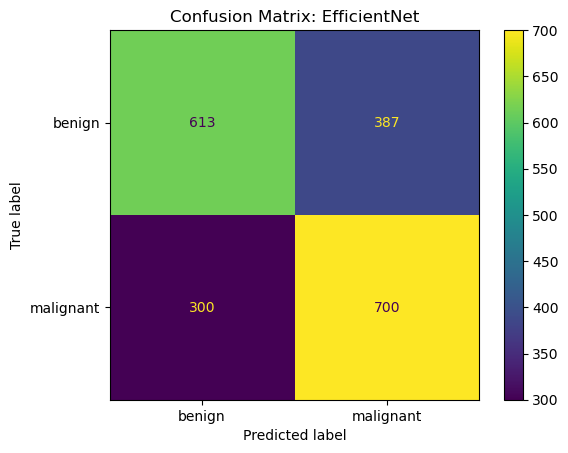

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7139 Acc: 0.5188
test Loss: 0.6968 Acc: 0.5150
Epoch 0 time: 99.02s
Epoch 1/19
----------
train Loss: 0.6941 Acc: 0.5466
test Loss: 0.6804 Acc: 0.5625
Epoch 1 time: 107.58s
Epoch 2/19
----------
train Loss: 0.6787 Acc: 0.5743
test Loss: 0.6699 Acc: 0.5910
Epoch 2 time: 107.50s
Epoch 3/19
----------
train Loss: 0.6714 Acc: 0.5894
test Loss: 0.6604 Acc: 0.6130
Epoch 3 time: 107.95s
Epoch 4/19
----------
train Loss: 0.6617 Acc: 0.6006
test Loss: 0.6528 Acc: 0.6235
Epoch 4 time: 108.32s
Epoch 5/19
----------
train Loss: 0.6542 Acc: 0.6100
test Loss: 0.6463 Acc: 0.6365
Epoch 5 time: 108.24s
Epoch 6/19
----------
train Loss: 0.6426 Acc: 0.6258
test Loss: 0.6408 Acc: 0.6480
Epoch 6 time: 107.19s
Epoch 7/19
----------
train Loss: 0.6422 Acc: 0.6238
test Loss: 0.6412 Acc: 0.6480
Epoch 7 time: 109.26s
Epoch 8/19
----------
train Loss: 0.6388 Acc: 0.6375
test Loss: 0.6404 Ac

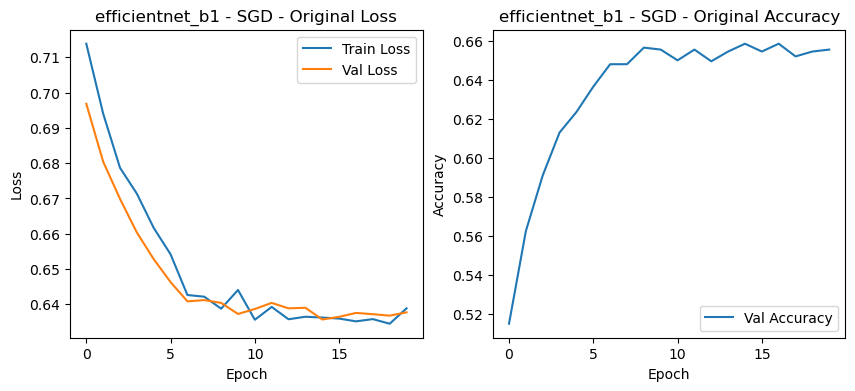

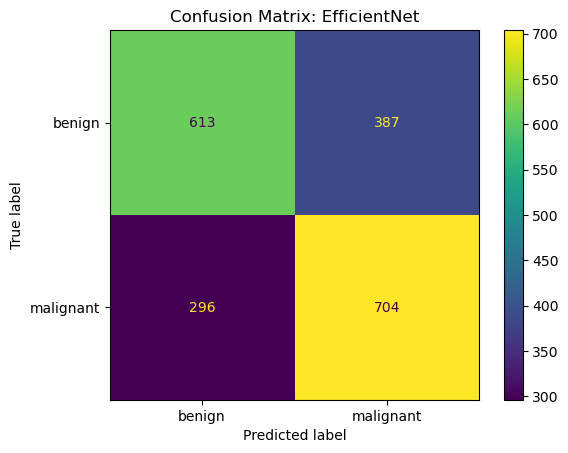

Epoch 0/29
----------
train Loss: 0.7130 Acc: 0.5085
test Loss: 0.6782 Acc: 0.5615
Epoch 0 time: 106.08s
Epoch 1/29
----------
train Loss: 0.6918 Acc: 0.5510
test Loss: 0.6638 Acc: 0.5915
Epoch 1 time: 108.85s
Epoch 2/29
----------
train Loss: 0.6787 Acc: 0.5783
test Loss: 0.6536 Acc: 0.6245
Epoch 2 time: 107.31s
Epoch 3/29
----------
train Loss: 0.6668 Acc: 0.5887
test Loss: 0.6455 Acc: 0.6325
Epoch 3 time: 106.37s
Epoch 4/29
----------
train Loss: 0.6625 Acc: 0.6044
test Loss: 0.6385 Acc: 0.6465
Epoch 4 time: 111.74s
Epoch 5/29
----------
train Loss: 0.6527 Acc: 0.6135
test Loss: 0.6330 Acc: 0.6525
Epoch 5 time: 111.56s
Epoch 6/29
----------
train Loss: 0.6450 Acc: 0.6251
test Loss: 0.6300 Acc: 0.6585
Epoch 6 time: 125.40s
Epoch 7/29
----------
train Loss: 0.6434 Acc: 0.6321
test Loss: 0.6299 Acc: 0.6585
Epoch 7 time: 106.86s
Epoch 8/29
----------
train Loss: 0.6436 Acc: 0.6319
test Loss: 0.6278 Acc: 0.6570
Epoch 8 time: 107.15s
Epoch 9/29
----------
train Loss: 0.6398 Acc: 0.6312
te

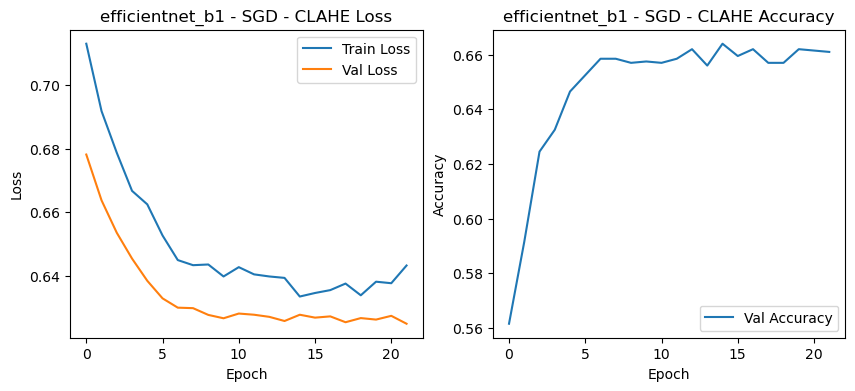

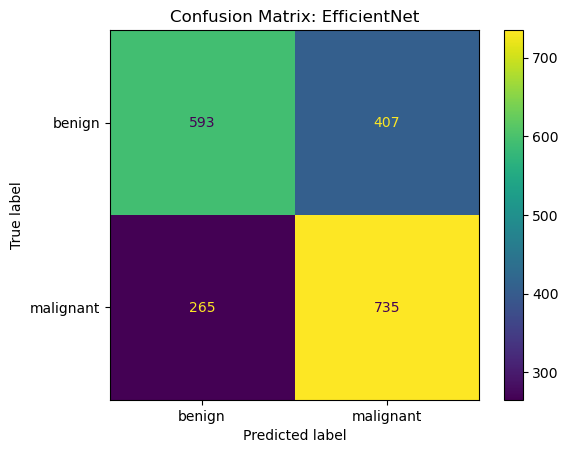

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7489 Acc: 0.4991
test Loss: 0.6870 Acc: 0.5530
Epoch 0 time: 105.62s
Epoch 1/19
----------
train Loss: 0.7237 Acc: 0.5251
test Loss: 0.6763 Acc: 0.5725
Epoch 1 time: 106.83s
Epoch 2/19
----------
train Loss: 0.7131 Acc: 0.5485
test Loss: 0.6655 Acc: 0.6070
Epoch 2 time: 106.89s
Epoch 3/19
----------
train Loss: 0.6946 Acc: 0.5659
test Loss: 0.6564 Acc: 0.6265
Epoch 3 time: 107.89s
Epoch 4/19
----------
train Loss: 0.6891 Acc: 0.5693
test Loss: 0.6503 Acc: 0.6390
Epoch 4 time: 110.55s
Epoch 5/19
----------
train Loss: 0.6777 Acc: 0.5837
test Loss: 0.6452 Acc: 0.6560
Epoch 5 time: 109.21s
Epoch 6/19
----------
train Loss: 0.6701 Acc: 0.5965
test Loss: 0.6375 Acc: 0.6610
Epoch 6 time: 111.11s
Epoch 7/19
----------
train Loss: 0.6700 Acc: 0.5976
test Loss: 0.6388 Acc: 0.6605
Epoch 7 time: 107.11s
Epoch 8/19
----------
train Loss: 0.6664 Acc: 0.6121
test Loss: 0.6381 A

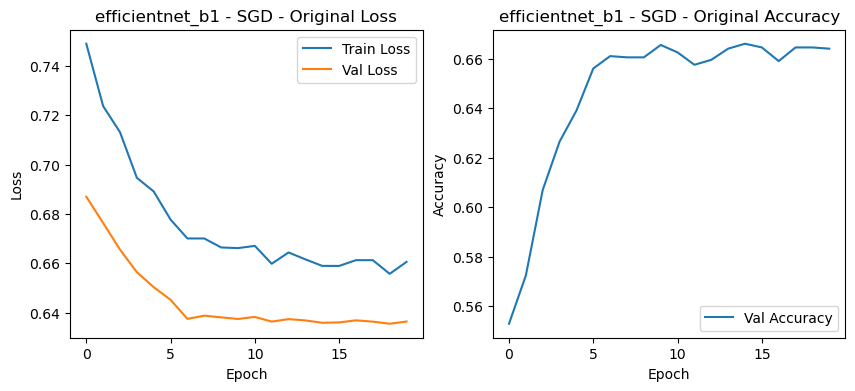

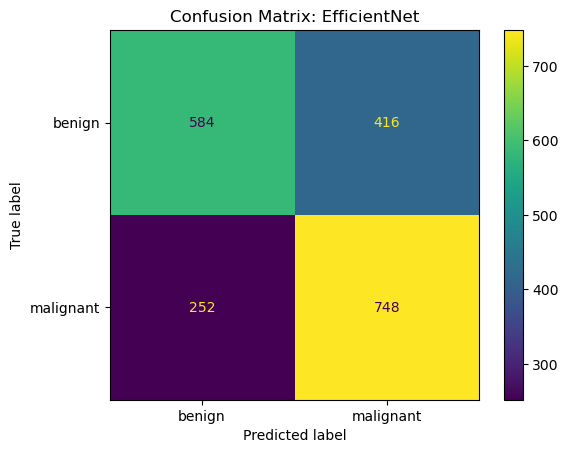

Epoch 0/29
----------
train Loss: 0.7289 Acc: 0.5145
test Loss: 0.6815 Acc: 0.5680
Epoch 0 time: 117.75s
Epoch 1/29
----------
train Loss: 0.7071 Acc: 0.5401
test Loss: 0.6690 Acc: 0.6010
Epoch 1 time: 113.64s
Epoch 2/29
----------
train Loss: 0.7030 Acc: 0.5497
test Loss: 0.6607 Acc: 0.6110
Epoch 2 time: 125.51s
Epoch 3/29
----------
train Loss: 0.6889 Acc: 0.5704
test Loss: 0.6532 Acc: 0.6255
Epoch 3 time: 125.88s
Epoch 4/29
----------
train Loss: 0.6808 Acc: 0.5866
test Loss: 0.6476 Acc: 0.6385
Epoch 4 time: 126.13s
Epoch 5/29
----------
train Loss: 0.6729 Acc: 0.5979
test Loss: 0.6409 Acc: 0.6580
Epoch 5 time: 123.16s
Epoch 6/29
----------
train Loss: 0.6553 Acc: 0.6120
test Loss: 0.6366 Acc: 0.6580
Epoch 6 time: 119.51s
Epoch 7/29
----------
train Loss: 0.6603 Acc: 0.6176
test Loss: 0.6381 Acc: 0.6580
Epoch 7 time: 108.08s
Epoch 8/29
----------
train Loss: 0.6583 Acc: 0.6201
test Loss: 0.6367 Acc: 0.6640
Epoch 8 time: 108.87s
Epoch 9/29
----------
train Loss: 0.6603 Acc: 0.6053
te

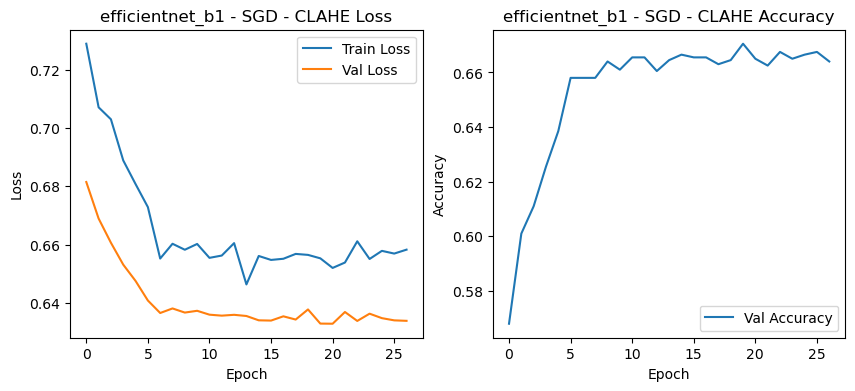

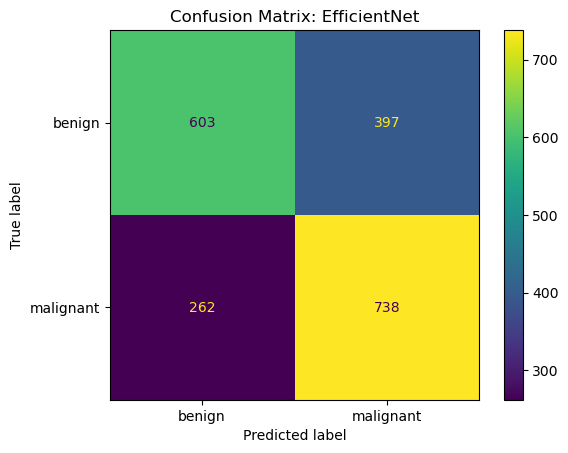

Entrenando efficientnet_b1 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7402 Acc: 0.4999
test Loss: 0.6916 Acc: 0.5465
Epoch 0 time: 117.58s
Epoch 1/19
----------
train Loss: 0.7145 Acc: 0.5319
test Loss: 0.6771 Acc: 0.5820
Epoch 1 time: 106.43s
Epoch 2/19
----------
train Loss: 0.6941 Acc: 0.5683
test Loss: 0.6661 Acc: 0.6065
Epoch 2 time: 107.92s
Epoch 3/19
----------
train Loss: 0.6909 Acc: 0.5725
test Loss: 0.6564 Acc: 0.6355
Epoch 3 time: 105.29s
Epoch 4/19
----------
train Loss: 0.6801 Acc: 0.5926
test Loss: 0.6508 Acc: 0.6425
Epoch 4 time: 107.64s
Epoch 5/19
----------
train Loss: 0.6793 Acc: 0.5883
test Loss: 0.6454 Acc: 0.6490
Epoch 5 time: 108.06s
Epoch 6/19
----------
train Loss: 0.6627 Acc: 0.6065
test Loss: 0.6418 Acc: 0.6515
Epoch 6 time: 107.65s
Epoch 7/19
----------
train Loss: 0.6647 Acc: 0.6101
test Loss: 0.6376 Acc: 0.6570
Epoch 7 time: 106.68s
Epoch 8/19
----------
train Loss: 0.6571 Acc: 0.6184
test Loss: 0.6386 A

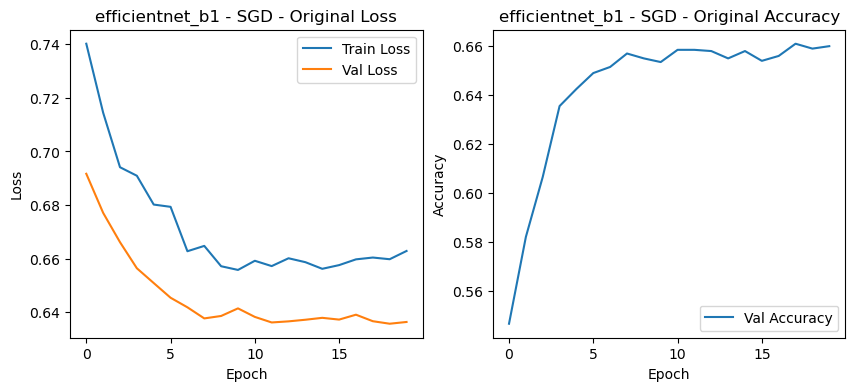

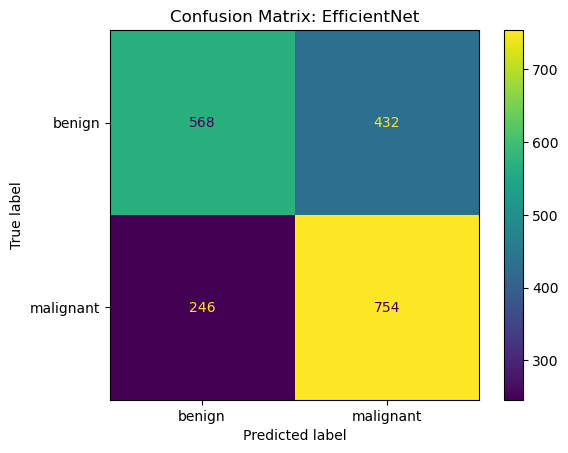

Epoch 0/29
----------
train Loss: 0.7384 Acc: 0.5095
test Loss: 0.6924 Acc: 0.5515
Epoch 0 time: 109.68s
Epoch 1/29
----------
train Loss: 0.7201 Acc: 0.5351
test Loss: 0.6773 Acc: 0.5840
Epoch 1 time: 116.51s
Epoch 2/29
----------
train Loss: 0.7065 Acc: 0.5510
test Loss: 0.6697 Acc: 0.6025
Epoch 2 time: 110.44s
Epoch 3/29
----------
train Loss: 0.6955 Acc: 0.5669
test Loss: 0.6619 Acc: 0.6145
Epoch 3 time: 109.59s
Epoch 4/29
----------
train Loss: 0.6831 Acc: 0.5805
test Loss: 0.6555 Acc: 0.6305
Epoch 4 time: 107.29s
Epoch 5/29
----------
train Loss: 0.6746 Acc: 0.5999
test Loss: 0.6496 Acc: 0.6405
Epoch 5 time: 110.93s
Epoch 6/29
----------
train Loss: 0.6707 Acc: 0.6041
test Loss: 0.6478 Acc: 0.6360
Epoch 6 time: 108.66s
Epoch 7/29
----------
train Loss: 0.6660 Acc: 0.6048
test Loss: 0.6451 Acc: 0.6430
Epoch 7 time: 108.57s
Epoch 8/29
----------
train Loss: 0.6601 Acc: 0.6154
test Loss: 0.6478 Acc: 0.6410
Epoch 8 time: 107.95s
Epoch 9/29
----------
train Loss: 0.6645 Acc: 0.6158
te

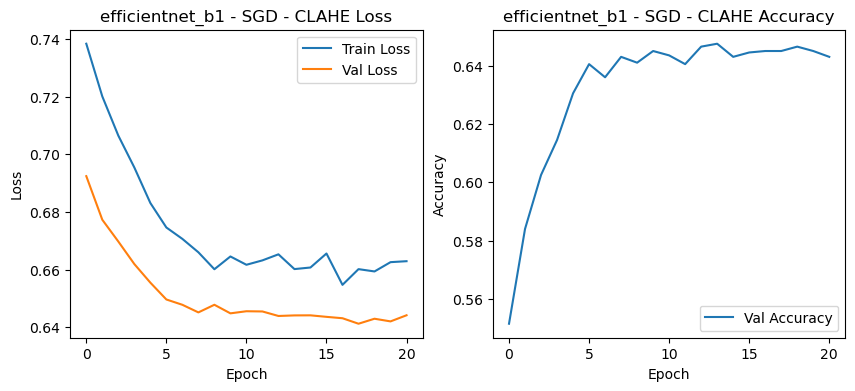

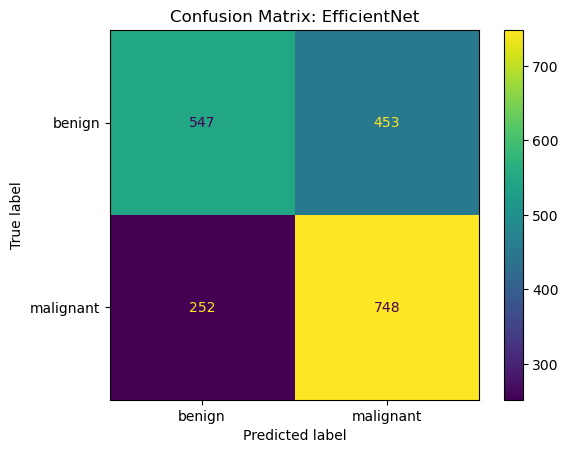

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7228 Acc: 0.4999
test Loss: 0.6907 Acc: 0.5370
Epoch 0 time: 107.51s
Epoch 1/19
----------
train Loss: 0.7075 Acc: 0.5269
test Loss: 0.6768 Acc: 0.5815
Epoch 1 time: 108.82s
Epoch 2/19
----------
train Loss: 0.6867 Acc: 0.5581
test Loss: 0.6670 Acc: 0.6125
Epoch 2 time: 108.47s
Epoch 3/19
----------
train Loss: 0.6828 Acc: 0.5657
test Loss: 0.6583 Acc: 0.6325
Epoch 3 time: 109.02s
Epoch 4/19
----------
train Loss: 0.6691 Acc: 0.5936
test Loss: 0.6507 Acc: 0.6445
Epoch 4 time: 108.93s
Epoch 5/19
----------
train Loss: 0.6592 Acc: 0.6075
test Loss: 0.6466 Acc: 0.6505
Epoch 5 time: 110.58s
Epoch 6/19
----------
train Loss: 0.6537 Acc: 0.6199
test Loss: 0.6428 Acc: 0.6575
Epoch 6 time: 108.04s
Epoch 7/19
----------
train Loss: 0.6498 Acc: 0.6202
test Loss: 0.6412 Acc: 0.6570
Epoch 7 time: 113.04s
Epoch 8/19
----------
train Loss: 0.6533 Acc: 0.6176
test Loss: 0.6397 

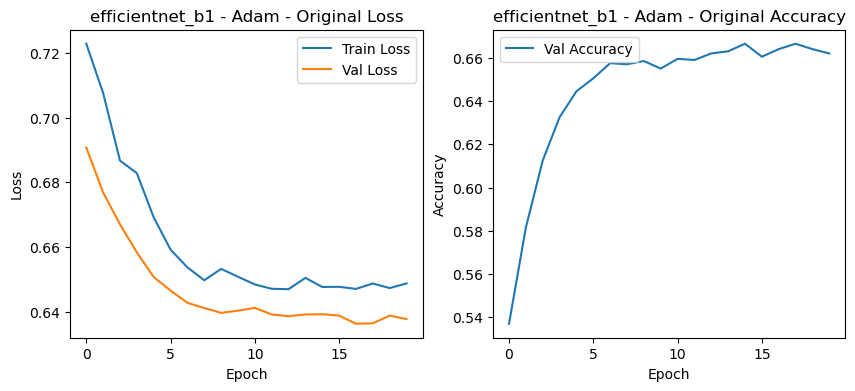

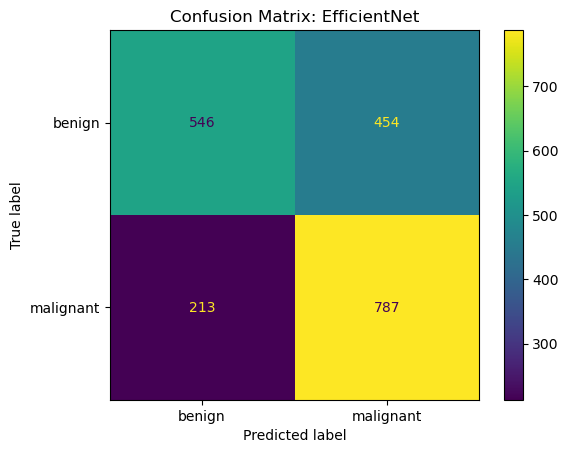

Epoch 0/29
----------
train Loss: 0.7169 Acc: 0.5069
test Loss: 0.6924 Acc: 0.5365
Epoch 0 time: 108.37s
Epoch 1/29
----------
train Loss: 0.7006 Acc: 0.5416
test Loss: 0.6799 Acc: 0.5740
Epoch 1 time: 108.75s
Epoch 2/29
----------
train Loss: 0.6883 Acc: 0.5581
test Loss: 0.6705 Acc: 0.5915
Epoch 2 time: 109.05s
Epoch 3/29
----------
train Loss: 0.6805 Acc: 0.5715
test Loss: 0.6615 Acc: 0.6180
Epoch 3 time: 108.66s
Epoch 4/29
----------
train Loss: 0.6683 Acc: 0.5991
test Loss: 0.6542 Acc: 0.6210
Epoch 4 time: 107.78s
Epoch 5/29
----------
train Loss: 0.6629 Acc: 0.6046
test Loss: 0.6510 Acc: 0.6265
Epoch 5 time: 108.82s
Epoch 6/29
----------
train Loss: 0.6525 Acc: 0.6202
test Loss: 0.6434 Acc: 0.6390
Epoch 6 time: 120.69s
Epoch 7/29
----------
train Loss: 0.6526 Acc: 0.6249
test Loss: 0.6435 Acc: 0.6370
Epoch 7 time: 108.49s
Epoch 8/29
----------
train Loss: 0.6517 Acc: 0.6251
test Loss: 0.6441 Acc: 0.6365
Epoch 8 time: 109.62s
Epoch 9/29
----------
train Loss: 0.6556 Acc: 0.6179
te

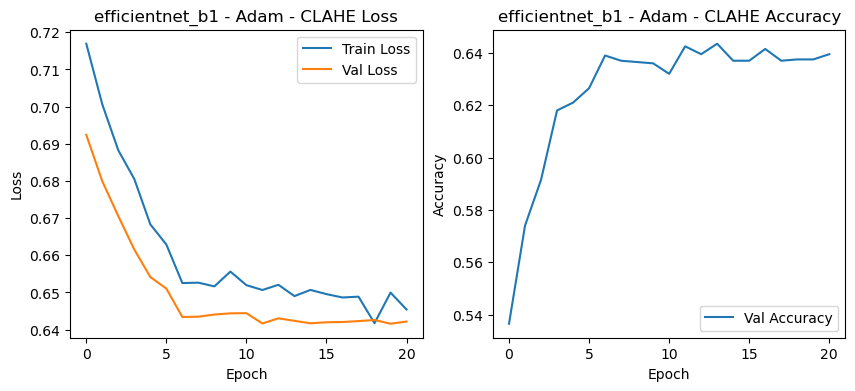

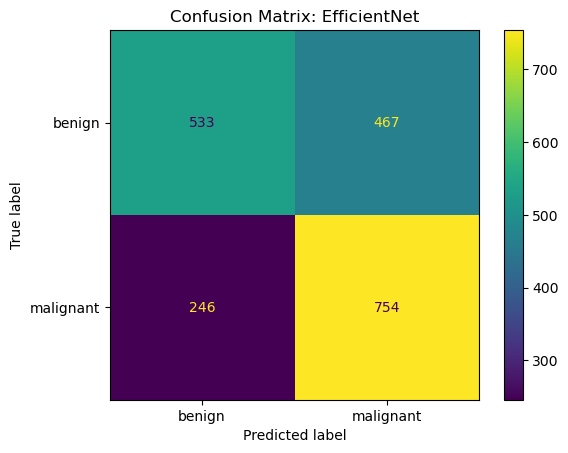

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7287 Acc: 0.5019
test Loss: 0.7048 Acc: 0.5010
Epoch 0 time: 115.09s
Epoch 1/19
----------
train Loss: 0.7075 Acc: 0.5282
test Loss: 0.6889 Acc: 0.5470
Epoch 1 time: 121.49s
Epoch 2/19
----------
train Loss: 0.6933 Acc: 0.5571
test Loss: 0.6772 Acc: 0.5775
Epoch 2 time: 119.41s
Epoch 3/19
----------
train Loss: 0.6808 Acc: 0.5716
test Loss: 0.6658 Acc: 0.6245
Epoch 3 time: 120.38s
Epoch 4/19
----------
train Loss: 0.6688 Acc: 0.5966
test Loss: 0.6606 Acc: 0.6335
Epoch 4 time: 121.85s
Epoch 5/19
----------
train Loss: 0.6614 Acc: 0.6128
test Loss: 0.6578 Acc: 0.6370
Epoch 5 time: 119.13s
Epoch 6/19
----------
train Loss: 0.6518 Acc: 0.6218
test Loss: 0.6498 Acc: 0.6490
Epoch 6 time: 119.84s
Epoch 7/19
----------
train Loss: 0.6494 Acc: 0.6258
test Loss: 0.6456 Acc: 0.6570
Epoch 7 time: 120.11s
Epoch 8/19
----------
train Loss: 0.6474 Acc: 0.6325
test Loss: 0.6479 

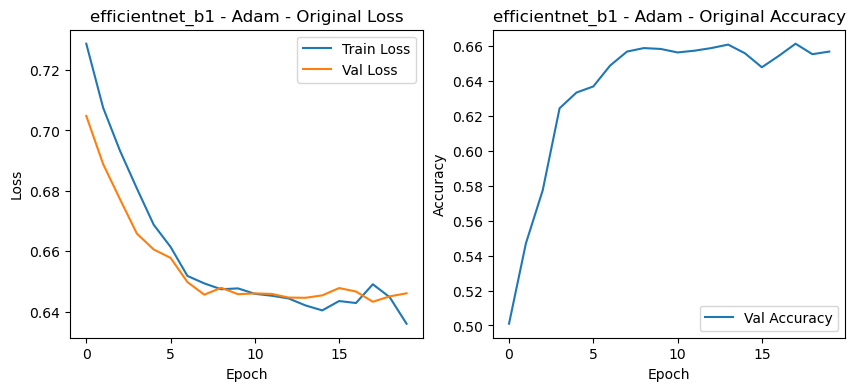

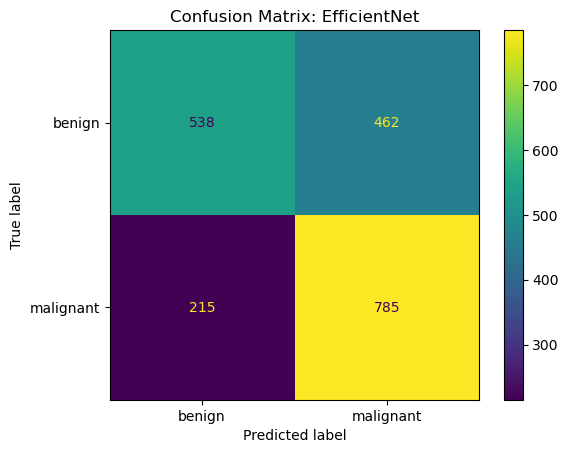

Epoch 0/29
----------
train Loss: 0.7072 Acc: 0.5262
test Loss: 0.6783 Acc: 0.5690
Epoch 0 time: 115.31s
Epoch 1/29
----------
train Loss: 0.6941 Acc: 0.5463
test Loss: 0.6667 Acc: 0.5955
Epoch 1 time: 109.58s
Epoch 2/29
----------
train Loss: 0.6785 Acc: 0.5754
test Loss: 0.6581 Acc: 0.6220
Epoch 2 time: 106.92s
Epoch 3/29
----------
train Loss: 0.6700 Acc: 0.5909
test Loss: 0.6523 Acc: 0.6255
Epoch 3 time: 107.41s
Epoch 4/29
----------
train Loss: 0.6622 Acc: 0.6088
test Loss: 0.6464 Acc: 0.6365
Epoch 4 time: 108.60s
Epoch 5/29
----------
train Loss: 0.6570 Acc: 0.6219
test Loss: 0.6414 Acc: 0.6400
Epoch 5 time: 114.16s
Epoch 6/29
----------
train Loss: 0.6528 Acc: 0.6172
test Loss: 0.6371 Acc: 0.6485
Epoch 6 time: 112.31s
Epoch 7/29
----------
train Loss: 0.6456 Acc: 0.6300
test Loss: 0.6397 Acc: 0.6430
Epoch 7 time: 110.90s
Epoch 8/29
----------
train Loss: 0.6469 Acc: 0.6238
test Loss: 0.6376 Acc: 0.6465
Epoch 8 time: 111.72s
Epoch 9/29
----------
train Loss: 0.6458 Acc: 0.6269
te

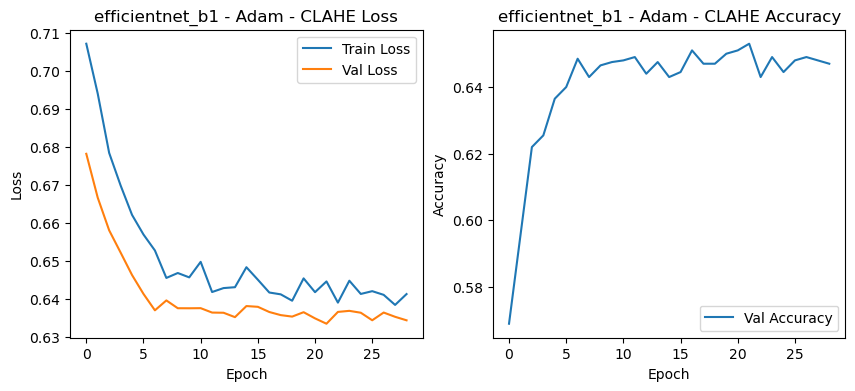

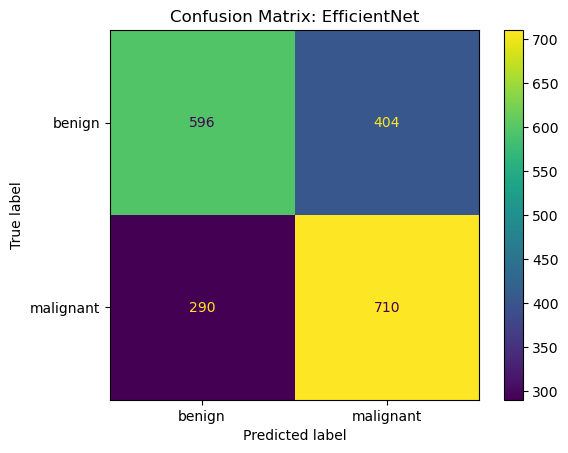

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7446 Acc: 0.5029
test Loss: 0.6960 Acc: 0.5175
Epoch 0 time: 108.68s
Epoch 1/19
----------
train Loss: 0.7191 Acc: 0.5351
test Loss: 0.6780 Acc: 0.5690
Epoch 1 time: 107.19s
Epoch 2/19
----------
train Loss: 0.7072 Acc: 0.5526
test Loss: 0.6689 Acc: 0.5890
Epoch 2 time: 107.06s
Epoch 3/19
----------
train Loss: 0.6949 Acc: 0.5620
test Loss: 0.6592 Acc: 0.6160
Epoch 3 time: 107.91s
Epoch 4/19
----------
train Loss: 0.6900 Acc: 0.5717
test Loss: 0.6516 Acc: 0.6310
Epoch 4 time: 107.03s
Epoch 5/19
----------
train Loss: 0.6732 Acc: 0.5916
test Loss: 0.6424 Acc: 0.6510
Epoch 5 time: 108.68s
Epoch 6/19
----------
train Loss: 0.6663 Acc: 0.6034
test Loss: 0.6397 Acc: 0.6595
Epoch 6 time: 108.05s
Epoch 7/19
----------
train Loss: 0.6656 Acc: 0.6051
test Loss: 0.6370 Acc: 0.6635
Epoch 7 time: 107.67s
Epoch 8/19
----------
train Loss: 0.6656 Acc: 0.6055
test Loss: 0.6385 

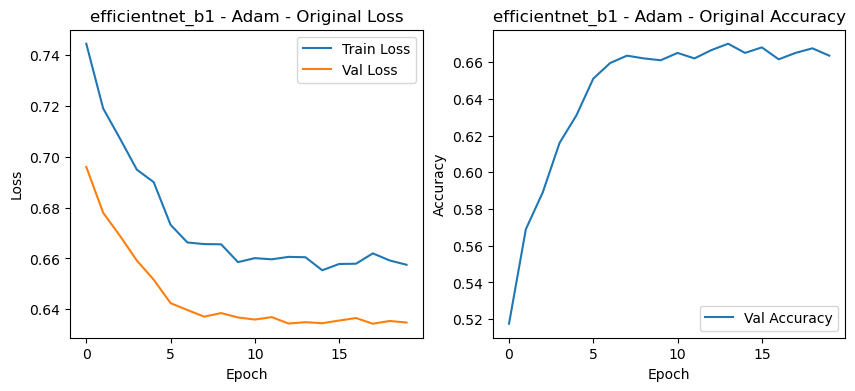

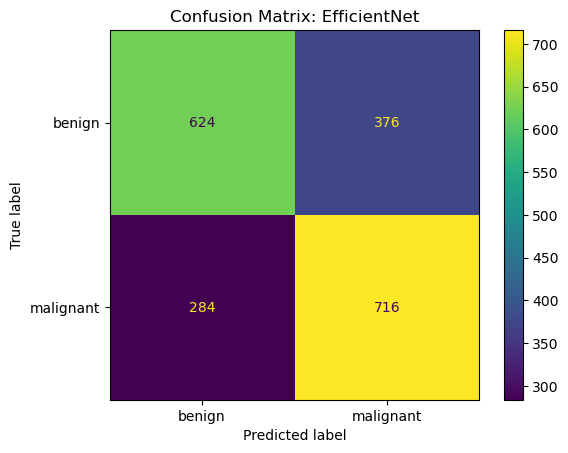

Epoch 0/29
----------
train Loss: 0.7295 Acc: 0.5120
test Loss: 0.6898 Acc: 0.5310
Epoch 0 time: 106.58s
Epoch 1/29
----------
train Loss: 0.7094 Acc: 0.5459
test Loss: 0.6779 Acc: 0.5730
Epoch 1 time: 108.26s
Epoch 2/29
----------
train Loss: 0.6956 Acc: 0.5594
test Loss: 0.6673 Acc: 0.6060
Epoch 2 time: 108.23s
Epoch 3/29
----------
train Loss: 0.6864 Acc: 0.5719
test Loss: 0.6599 Acc: 0.6195
Epoch 3 time: 108.88s
Epoch 4/29
----------
train Loss: 0.6768 Acc: 0.5881
test Loss: 0.6534 Acc: 0.6365
Epoch 4 time: 110.41s
Epoch 5/29
----------
train Loss: 0.6741 Acc: 0.5966
test Loss: 0.6489 Acc: 0.6450
Epoch 5 time: 107.74s
Epoch 6/29
----------
train Loss: 0.6653 Acc: 0.6073
test Loss: 0.6451 Acc: 0.6520
Epoch 6 time: 107.42s
Epoch 7/29
----------
train Loss: 0.6606 Acc: 0.6118
test Loss: 0.6424 Acc: 0.6520
Epoch 7 time: 110.05s
Epoch 8/29
----------
train Loss: 0.6577 Acc: 0.6179
test Loss: 0.6424 Acc: 0.6535
Epoch 8 time: 108.02s
Epoch 9/29
----------
train Loss: 0.6553 Acc: 0.6201
te

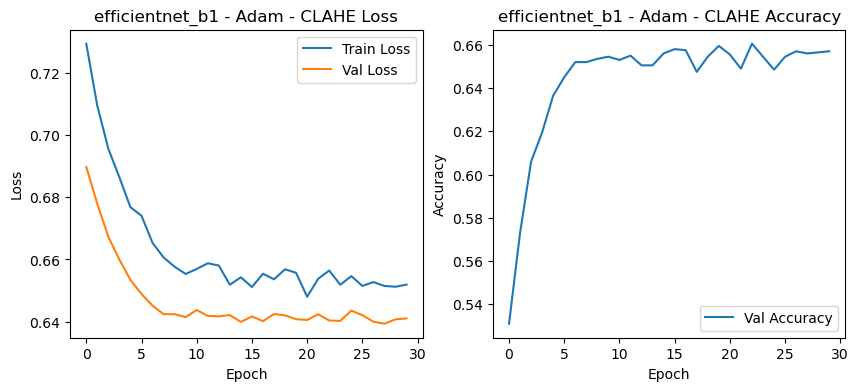

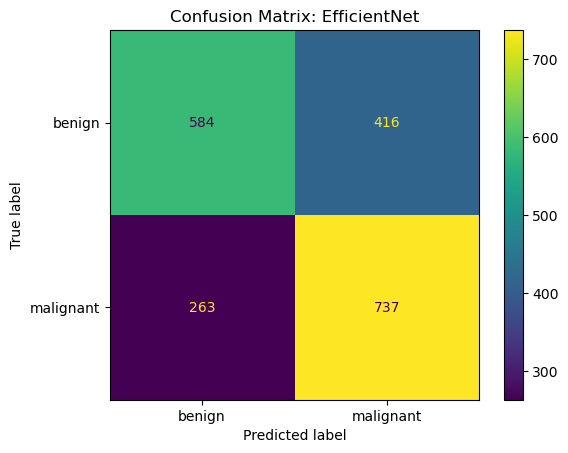

Entrenando efficientnet_b1 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7346 Acc: 0.4980
test Loss: 0.6813 Acc: 0.5560
Epoch 0 time: 109.04s
Epoch 1/19
----------
train Loss: 0.7064 Acc: 0.5381
test Loss: 0.6693 Acc: 0.5875
Epoch 1 time: 108.67s
Epoch 2/19
----------
train Loss: 0.6963 Acc: 0.5506
test Loss: 0.6602 Acc: 0.6110
Epoch 2 time: 109.80s
Epoch 3/19
----------
train Loss: 0.6861 Acc: 0.5739
test Loss: 0.6507 Acc: 0.6340
Epoch 3 time: 120.88s
Epoch 4/19
----------
train Loss: 0.6807 Acc: 0.5820
test Loss: 0.6438 Acc: 0.6410
Epoch 4 time: 109.71s
Epoch 5/19
----------
train Loss: 0.6705 Acc: 0.5936
test Loss: 0.6393 Acc: 0.6510
Epoch 5 time: 108.99s
Epoch 6/19
----------
train Loss: 0.6605 Acc: 0.6053
test Loss: 0.6322 Acc: 0.6640
Epoch 6 time: 109.11s
Epoch 7/19
----------
train Loss: 0.6579 Acc: 0.6041
test Loss: 0.6330 Acc: 0.6590
Epoch 7 time: 108.83s
Epoch 8/19
----------
train Loss: 0.6505 Acc: 0.6172
test Loss: 0.6325 

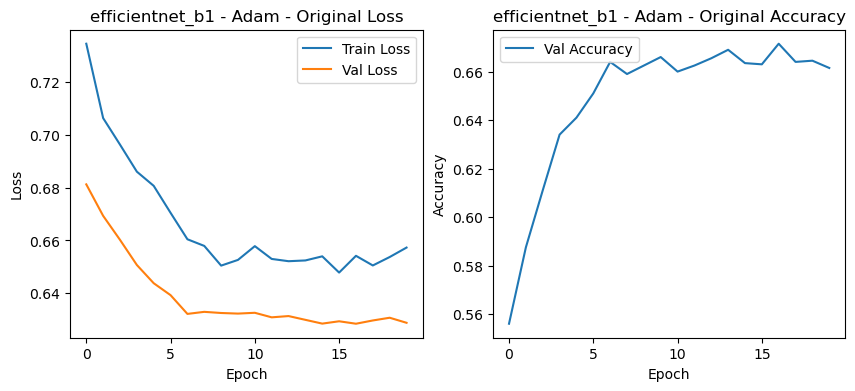

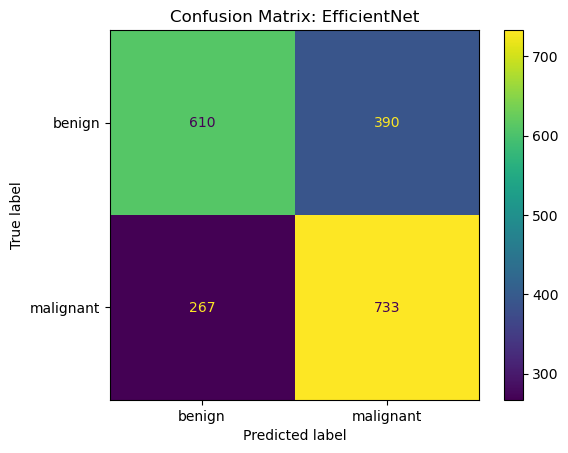

Epoch 0/29
----------
train Loss: 0.7359 Acc: 0.5010
test Loss: 0.6847 Acc: 0.5565
Epoch 0 time: 107.63s
Epoch 1/29
----------
train Loss: 0.7241 Acc: 0.5216
test Loss: 0.6681 Acc: 0.6015
Epoch 1 time: 107.53s
Epoch 2/29
----------
train Loss: 0.7050 Acc: 0.5469
test Loss: 0.6580 Acc: 0.6310
Epoch 2 time: 108.11s
Epoch 3/29
----------
train Loss: 0.6936 Acc: 0.5634
test Loss: 0.6496 Acc: 0.6415
Epoch 3 time: 107.03s
Epoch 4/29
----------
train Loss: 0.6804 Acc: 0.5839
test Loss: 0.6413 Acc: 0.6455
Epoch 4 time: 108.17s
Epoch 5/29
----------
train Loss: 0.6737 Acc: 0.5955
test Loss: 0.6342 Acc: 0.6585
Epoch 5 time: 110.85s
Epoch 6/29
----------
train Loss: 0.6607 Acc: 0.6120
test Loss: 0.6303 Acc: 0.6625
Epoch 6 time: 112.57s
Epoch 7/29
----------
train Loss: 0.6575 Acc: 0.6112
test Loss: 0.6299 Acc: 0.6600
Epoch 7 time: 110.75s
Epoch 8/29
----------
train Loss: 0.6594 Acc: 0.6172
test Loss: 0.6285 Acc: 0.6630
Epoch 8 time: 108.43s
Epoch 9/29
----------
train Loss: 0.6576 Acc: 0.6164
te

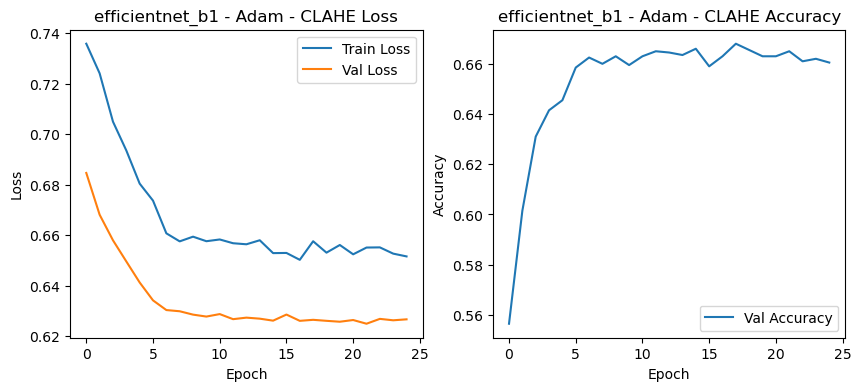

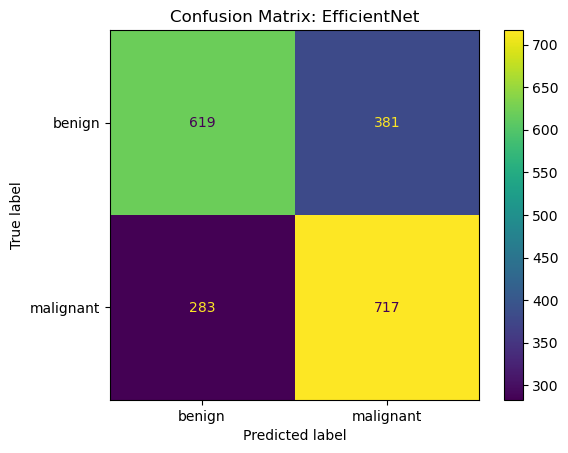

Entrenando efficientnet_b1 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7377 Acc: 0.5039
test Loss: 0.7007 Acc: 0.5155
Epoch 0 time: 111.29s
Epoch 1/19
----------


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x0000021811D5FDC0>
Traceback (most recent call last):
  File "C:\Users\Fabricio\anaconda3\envs\VisionArtMamografia\lib\site-packages\torch\utils\data\dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "C:\Users\Fabricio\anaconda3\envs\VisionArtMamografia\lib\site-packages\torch\utils\data\dataloader.py", line 1437, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


Ejecución detenida por el usuario de manera controlada


In [15]:
import torch.optim as optim
import time

def run_efficientnet_b1_experiments():
    model_name = 'efficientnet_b1'
    learning_rates = [0.0001, 0.001]
    weight_decays = [0.0001, 0.001]
    momentums = [0.9, 0.95]
    optimizers = ['SGD', 'Adam', 'AdamW']
    dropouts = [0.5, 0.7]
    batch_sizes = [16, 32]
    scheduler_types = ['StepLR', 'ExponentialLR', 'MultiStepLR']
    activations = ['relu', 'leaky_relu', 'sigmoid', 'tanh']

    try:
        for lr in learning_rates:
            for wd in weight_decays:
                for momentum in momentums:
                    for optimizer_type in optimizers:
                        for dropout in dropouts:
                            for batch_size in batch_sizes:
                                for scheduler_type in scheduler_types:
                                    for activation in activations:
                                        print(f"Entrenando {model_name} con {optimizer_type}, lr={lr}, wd={wd}, dropout={dropout}, batch_size={batch_size}, scheduler={scheduler_type}, activation={activation}...")
                                        
                                        if optimizer_type == 'SGD':
                                            optimizer_func = optim.SGD
                                        elif optimizer_type == 'Adam':
                                            optimizer_func = optim.Adam
                                        elif optimizer_type == 'AdamW':
                                            optimizer_func = optim.AdamW
                                        else:
                                            raise ValueError("Optimador no soportado.")

                                        dataloaders = original_dataloaders if model_name != 'inception_v3' else original_dataloaders_inception
                                        dataset_sizes = original_dataset_sizes if model_name != 'inception_v3' else original_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - Original')
                                        plot_confusion_matrix(model, dataloaders)
                                        
                                        # Repetir con imágenes CLAHE
                                        dataloaders = clahe_dataloaders if model_name != 'inception_v3' else clahe_dataloaders_inception
                                        dataset_sizes = clahe_dataset_sizes if model_name != 'inception_v3' else clahe_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - CLAHE')
                                        plot_confusion_matrix(model, dataloaders)
    except KeyboardInterrupt:
        print("Ejecución detenida por el usuario de manera controlada")

run_efficientnet_b1_experiments()


Entrenando densenet121 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7323 Acc: 0.5463
test Loss: 0.6811 Acc: 0.5785
Epoch 0 time: 162.51s
Epoch 1/19
----------
train Loss: 0.6744 Acc: 0.6108
test Loss: 0.6503 Acc: 0.6350
Epoch 1 time: 165.28s
Epoch 2/19
----------
train Loss: 0.6330 Acc: 0.6511
test Loss: 0.6481 Acc: 0.6375
Epoch 2 time: 153.72s
Epoch 3/19
----------
train Loss: 0.6089 Acc: 0.6701
test Loss: 0.6394 Acc: 0.6425
Epoch 3 time: 152.34s
Epoch 4/19
----------
train Loss: 0.5776 Acc: 0.7033
test Loss: 0.6429 Acc: 0.6400
Epoch 4 time: 175.00s
Epoch 5/19
----------
train Loss: 0.5535 Acc: 0.7246
test Loss: 0.6461 Acc: 0.6420
Epoch 5 time: 182.39s
Epoch 6/19
----------
train Loss: 0.5262 Acc: 0.7398
test Loss: 0.6481 Acc: 0.6555
Epoch 6 time: 185.14s
Epoch 7/19
----------
train Loss: 0.5061 Acc: 0.7499
test Loss: 0.6574 Acc: 0.6410
Epoch 7 time: 196.95s
Epoch 8/19
----------
train Loss: 0.5047 Acc: 0.7558
test Loss: 0.6568 Acc: 

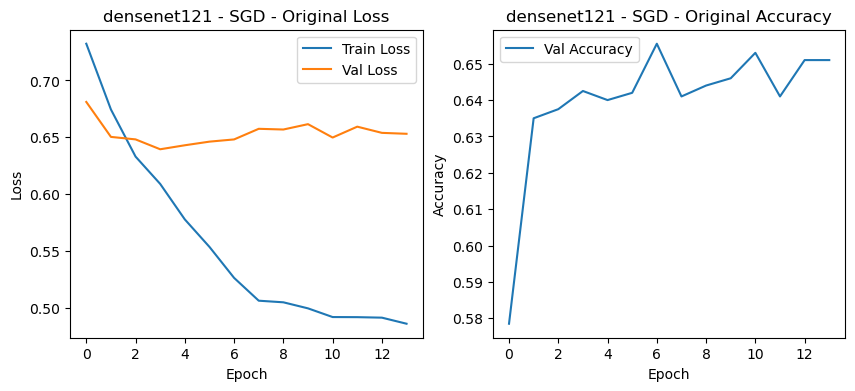

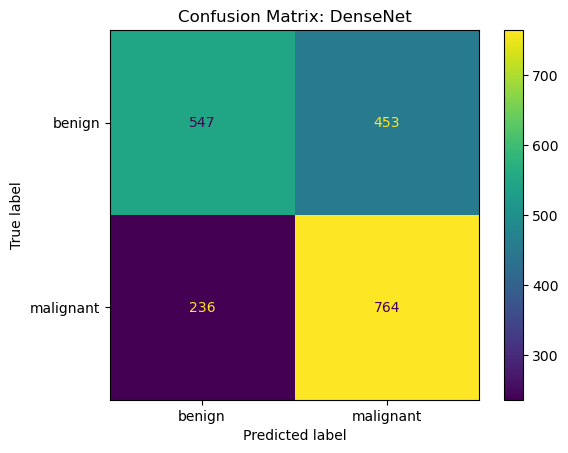

Epoch 0/19
----------
train Loss: 0.7021 Acc: 0.5624
test Loss: 0.6359 Acc: 0.6430
Epoch 0 time: 178.57s
Epoch 1/19
----------
train Loss: 0.6506 Acc: 0.6316
test Loss: 0.6257 Acc: 0.6555
Epoch 1 time: 169.15s
Epoch 2/19
----------
train Loss: 0.6109 Acc: 0.6688
test Loss: 0.6163 Acc: 0.6635
Epoch 2 time: 168.98s
Epoch 3/19
----------
train Loss: 0.5865 Acc: 0.6849
test Loss: 0.6128 Acc: 0.6625
Epoch 3 time: 172.29s
Epoch 4/19
----------
train Loss: 0.5541 Acc: 0.7126
test Loss: 0.6140 Acc: 0.6645
Epoch 4 time: 159.00s
Epoch 5/19
----------
train Loss: 0.5256 Acc: 0.7404
test Loss: 0.6258 Acc: 0.6665
Epoch 5 time: 153.67s
Epoch 6/19
----------
train Loss: 0.5032 Acc: 0.7479
test Loss: 0.6282 Acc: 0.6685
Epoch 6 time: 164.12s
Epoch 7/19
----------
train Loss: 0.4753 Acc: 0.7722
test Loss: 0.6377 Acc: 0.6680
Epoch 7 time: 172.06s
Epoch 8/19
----------
train Loss: 0.4706 Acc: 0.7724
test Loss: 0.6305 Acc: 0.6675
Epoch 8 time: 171.43s
Epoch 9/19
----------
train Loss: 0.4681 Acc: 0.7796
te

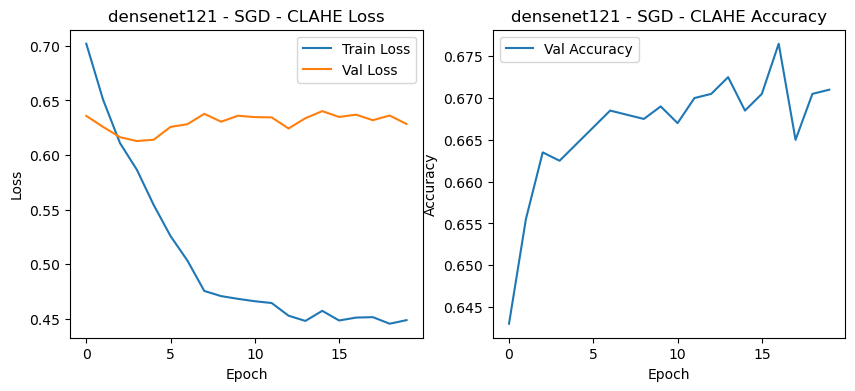

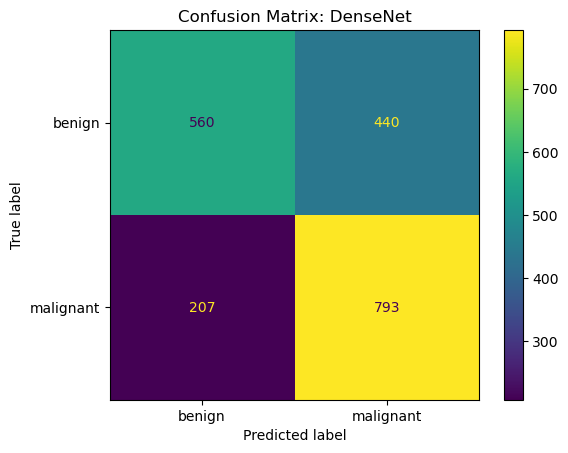

Entrenando densenet121 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7197 Acc: 0.5583
test Loss: 0.6402 Acc: 0.6425
Epoch 0 time: 171.97s
Epoch 1/19
----------
train Loss: 0.6650 Acc: 0.6108
test Loss: 0.6214 Acc: 0.6595
Epoch 1 time: 171.54s
Epoch 2/19
----------
train Loss: 0.6313 Acc: 0.6502
test Loss: 0.6159 Acc: 0.6650
Epoch 2 time: 171.11s
Epoch 3/19
----------
train Loss: 0.6059 Acc: 0.6709
test Loss: 0.6117 Acc: 0.6655
Epoch 3 time: 170.43s
Epoch 4/19
----------
train Loss: 0.5710 Acc: 0.6974
test Loss: 0.6115 Acc: 0.6670
Epoch 4 time: 174.08s
Epoch 5/19
----------
train Loss: 0.5478 Acc: 0.7174
test Loss: 0.6139 Acc: 0.6735
Epoch 5 time: 179.74s
Epoch 6/19
----------
train Loss: 0.5239 Acc: 0.7386
test Loss: 0.6182 Acc: 0.6725
Epoch 6 time: 174.39s
Epoch 7/19
----------
train Loss: 0.5034 Acc: 0.7508
test Loss: 0.6205 Acc: 0.6715
Epoch 7 time: 173.83s
Epoch 8/19
----------
train Loss: 0.4921 Acc: 0.7629
test Loss: 0.6205 Acc: 

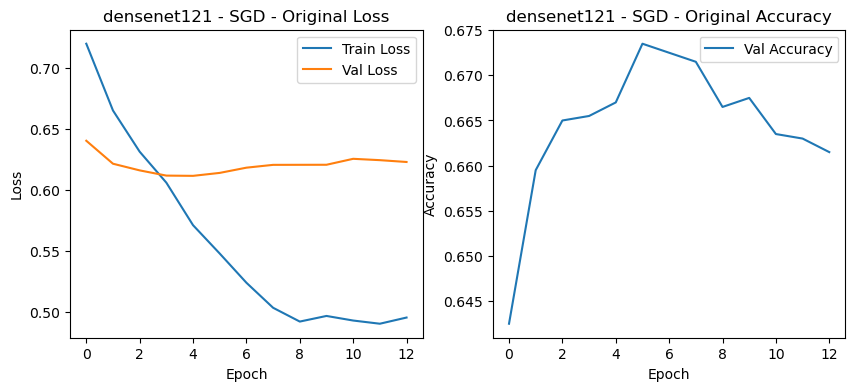

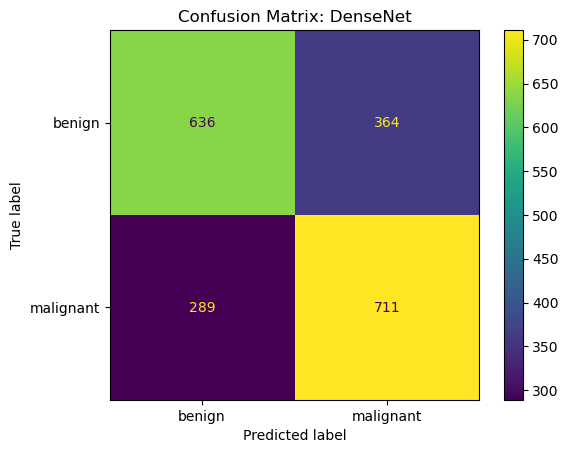

Epoch 0/19
----------
train Loss: 0.7073 Acc: 0.5586
test Loss: 0.6344 Acc: 0.6525
Epoch 0 time: 171.57s
Epoch 1/19
----------
train Loss: 0.6511 Acc: 0.6349
test Loss: 0.6208 Acc: 0.6615
Epoch 1 time: 177.03s
Epoch 2/19
----------
train Loss: 0.6180 Acc: 0.6658
test Loss: 0.6119 Acc: 0.6650
Epoch 2 time: 174.74s
Epoch 3/19
----------
train Loss: 0.5865 Acc: 0.6896
test Loss: 0.6108 Acc: 0.6670
Epoch 3 time: 173.56s
Epoch 4/19
----------
train Loss: 0.5475 Acc: 0.7205
test Loss: 0.6236 Acc: 0.6670
Epoch 4 time: 172.46s
Epoch 5/19
----------
train Loss: 0.5261 Acc: 0.7344
test Loss: 0.6212 Acc: 0.6660
Epoch 5 time: 178.30s
Epoch 6/19
----------
train Loss: 0.5021 Acc: 0.7511
test Loss: 0.6441 Acc: 0.6680
Epoch 6 time: 177.72s
Epoch 7/19
----------
train Loss: 0.4790 Acc: 0.7684
test Loss: 0.6294 Acc: 0.6655
Epoch 7 time: 178.22s
Epoch 8/19
----------
train Loss: 0.4728 Acc: 0.7674
test Loss: 0.6332 Acc: 0.6690
Epoch 8 time: 174.86s
Epoch 9/19
----------
train Loss: 0.4696 Acc: 0.7715
te

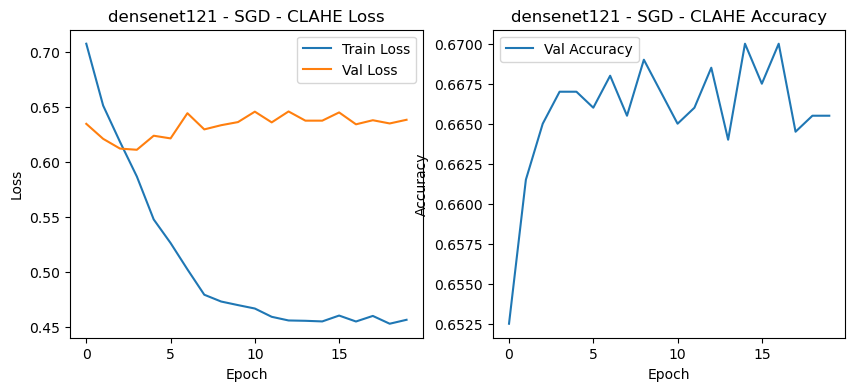

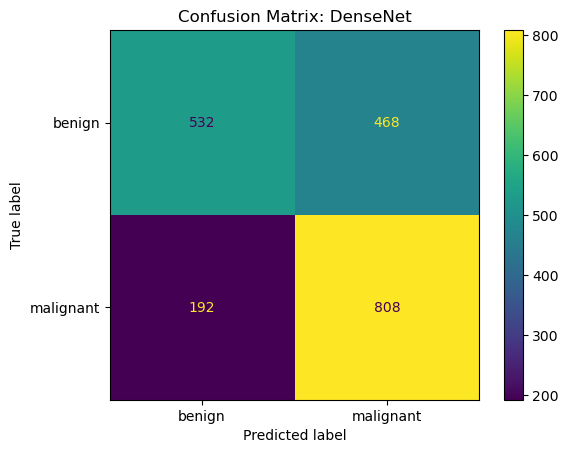

Entrenando densenet121 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7875 Acc: 0.5371
test Loss: 0.6867 Acc: 0.5880
Epoch 0 time: 167.94s
Epoch 1/19
----------
train Loss: 0.7184 Acc: 0.6015
test Loss: 0.6639 Acc: 0.6255
Epoch 1 time: 152.82s
Epoch 2/19
----------
train Loss: 0.6798 Acc: 0.6319
test Loss: 0.6533 Acc: 0.6440
Epoch 2 time: 152.79s
Epoch 3/19
----------
train Loss: 0.6419 Acc: 0.6558
test Loss: 0.6373 Acc: 0.6565
Epoch 3 time: 153.79s
Epoch 4/19
----------
train Loss: 0.6166 Acc: 0.6740
test Loss: 0.6540 Acc: 0.6550
Epoch 4 time: 156.54s
Epoch 5/19
----------
train Loss: 0.5750 Acc: 0.7079
test Loss: 0.6471 Acc: 0.6595
Epoch 5 time: 156.37s
Epoch 6/19
----------
train Loss: 0.5272 Acc: 0.7356
test Loss: 0.6516 Acc: 0.6530
Epoch 6 time: 150.99s
Epoch 7/19
----------
train Loss: 0.4818 Acc: 0.7649
test Loss: 0.6628 Acc: 0.6560
Epoch 7 time: 153.44s
Epoch 8/19
----------
train Loss: 0.4724 Acc: 0.7780
test Loss: 0.6620 Acc: 

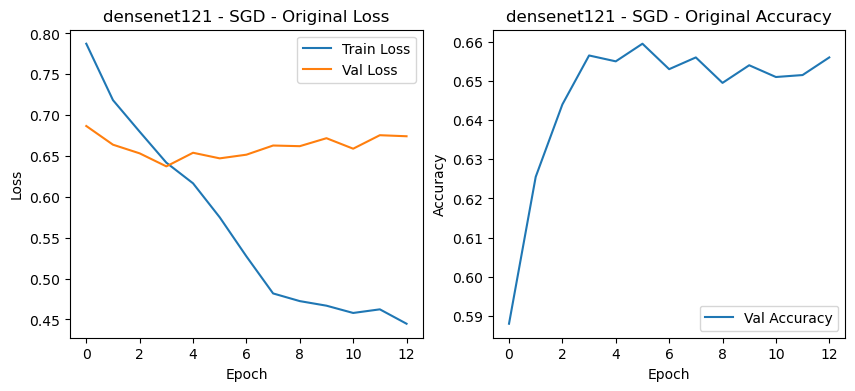

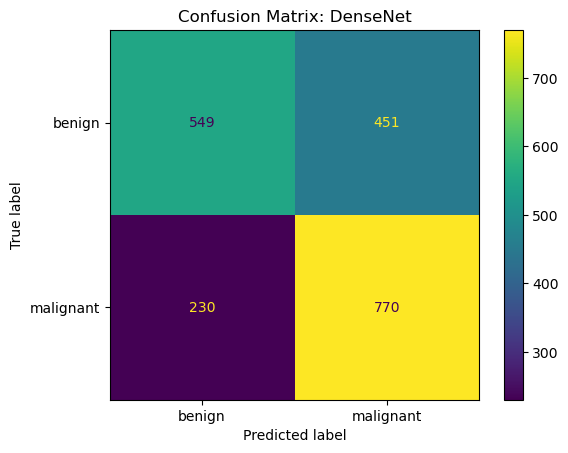

Epoch 0/19
----------
train Loss: 0.7761 Acc: 0.5359
test Loss: 0.6477 Acc: 0.6300
Epoch 0 time: 151.70s
Epoch 1/19
----------
train Loss: 0.7068 Acc: 0.6000
test Loss: 0.6282 Acc: 0.6665
Epoch 1 time: 157.28s
Epoch 2/19
----------
train Loss: 0.6788 Acc: 0.6268
test Loss: 0.6242 Acc: 0.6610
Epoch 2 time: 176.84s
Epoch 3/19
----------
train Loss: 0.6371 Acc: 0.6496
test Loss: 0.6195 Acc: 0.6675
Epoch 3 time: 175.41s
Epoch 4/19
----------
train Loss: 0.6104 Acc: 0.6704
test Loss: 0.6190 Acc: 0.6630
Epoch 4 time: 176.25s
Epoch 5/19
----------
train Loss: 0.5850 Acc: 0.6947
test Loss: 0.6277 Acc: 0.6655
Epoch 5 time: 175.22s
Epoch 6/19
----------
train Loss: 0.5450 Acc: 0.7194
test Loss: 0.6341 Acc: 0.6615
Epoch 6 time: 176.19s
Epoch 7/19
----------
train Loss: 0.5211 Acc: 0.7361
test Loss: 0.6351 Acc: 0.6650
Epoch 7 time: 173.63s
Epoch 8/19
----------
train Loss: 0.5282 Acc: 0.7299
test Loss: 0.6355 Acc: 0.6600
Epoch 8 time: 170.90s
Epoch 9/19
----------
train Loss: 0.5189 Acc: 0.7354
te

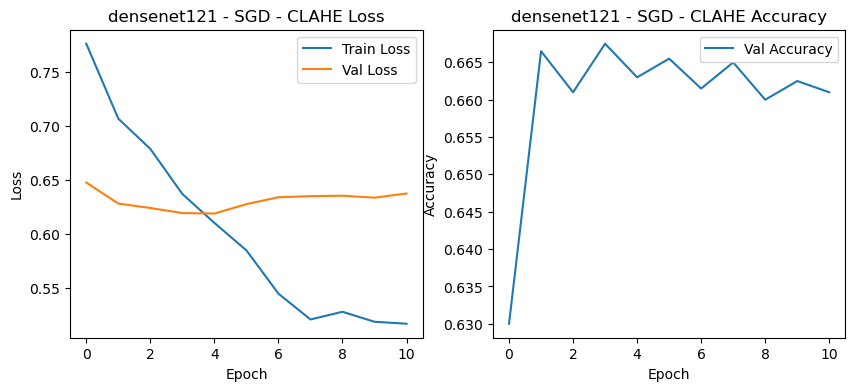

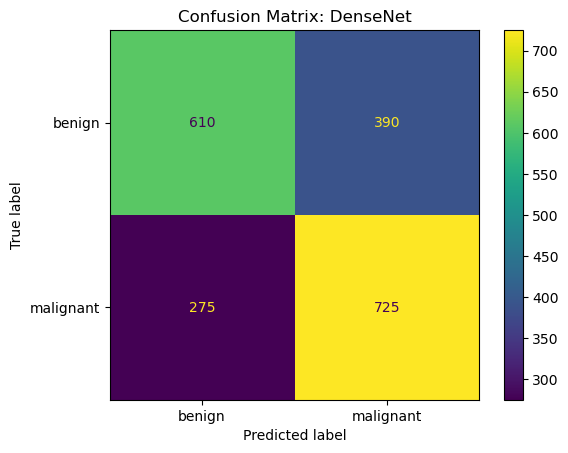

Entrenando densenet121 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7616 Acc: 0.5449
test Loss: 0.6400 Acc: 0.6480
Epoch 0 time: 165.37s
Epoch 1/19
----------
train Loss: 0.7043 Acc: 0.5974
test Loss: 0.6270 Acc: 0.6650
Epoch 1 time: 168.65s
Epoch 2/19
----------
train Loss: 0.6737 Acc: 0.6310
test Loss: 0.6267 Acc: 0.6655
Epoch 2 time: 162.95s
Epoch 3/19
----------
train Loss: 0.6399 Acc: 0.6565
test Loss: 0.6265 Acc: 0.6600
Epoch 3 time: 175.72s
Epoch 4/19
----------
train Loss: 0.6145 Acc: 0.6664
test Loss: 0.6281 Acc: 0.6635
Epoch 4 time: 177.48s
Epoch 5/19
----------
train Loss: 0.5917 Acc: 0.6896
test Loss: 0.6336 Acc: 0.6625
Epoch 5 time: 157.61s
Epoch 6/19
----------
train Loss: 0.5676 Acc: 0.7057
test Loss: 0.6404 Acc: 0.6610
Epoch 6 time: 157.93s
Epoch 7/19
----------
train Loss: 0.5471 Acc: 0.7183
test Loss: 0.6425 Acc: 0.6625
Epoch 7 time: 179.41s
Epoch 8/19
----------
train Loss: 0.5415 Acc: 0.7274
test Loss: 0.6445 Acc: 

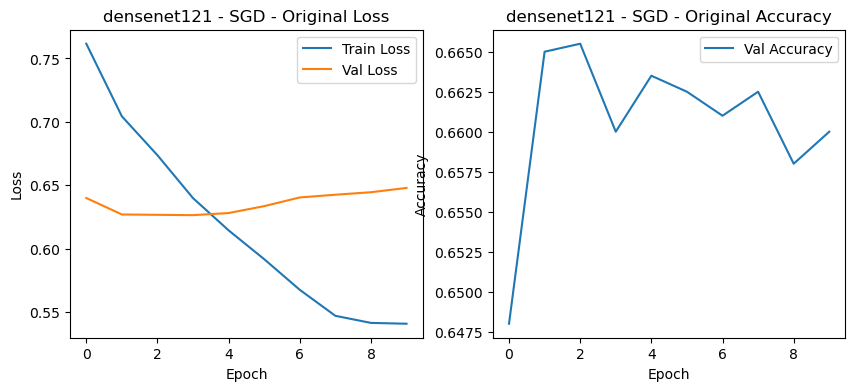

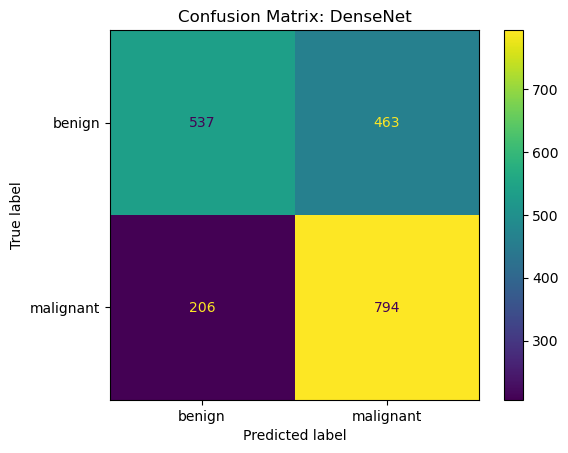

Epoch 0/19
----------
train Loss: 0.7641 Acc: 0.5456
test Loss: 0.6455 Acc: 0.6235
Epoch 0 time: 166.39s
Epoch 1/19
----------
train Loss: 0.7096 Acc: 0.6005
test Loss: 0.6264 Acc: 0.6445
Epoch 1 time: 178.32s
Epoch 2/19
----------
train Loss: 0.6723 Acc: 0.6269
test Loss: 0.6220 Acc: 0.6570
Epoch 2 time: 177.08s
Epoch 3/19
----------
train Loss: 0.6366 Acc: 0.6554
test Loss: 0.6220 Acc: 0.6620
Epoch 3 time: 166.60s
Epoch 4/19
----------
train Loss: 0.6072 Acc: 0.6840
test Loss: 0.6260 Acc: 0.6600
Epoch 4 time: 168.77s
Epoch 5/19
----------
train Loss: 0.5729 Acc: 0.7047
test Loss: 0.6344 Acc: 0.6645
Epoch 5 time: 169.71s
Epoch 6/19
----------
train Loss: 0.5491 Acc: 0.7174
test Loss: 0.6343 Acc: 0.6690
Epoch 6 time: 173.77s
Epoch 7/19
----------
train Loss: 0.5168 Acc: 0.7419
test Loss: 0.6387 Acc: 0.6720
Epoch 7 time: 168.96s
Epoch 8/19
----------
train Loss: 0.5230 Acc: 0.7315
test Loss: 0.6411 Acc: 0.6705
Epoch 8 time: 163.39s
Epoch 9/19
----------
train Loss: 0.5095 Acc: 0.7432
te

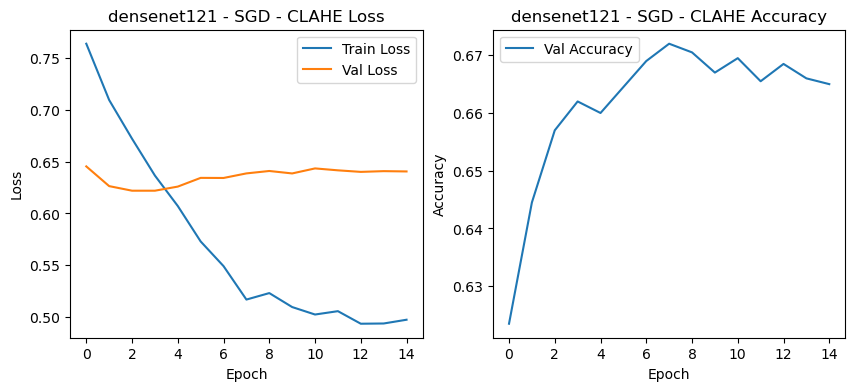

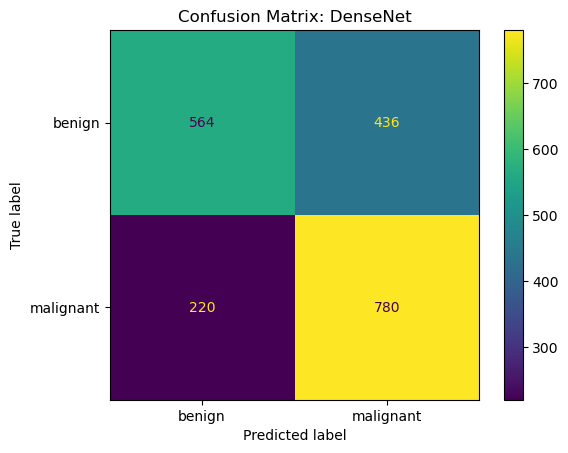

Entrenando densenet121 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7148 Acc: 0.5514
test Loss: 0.6471 Acc: 0.6265
Epoch 0 time: 171.12s
Epoch 1/19
----------
train Loss: 0.6546 Acc: 0.6229
test Loss: 0.6294 Acc: 0.6530
Epoch 1 time: 173.08s
Epoch 2/19
----------
train Loss: 0.6278 Acc: 0.6486
test Loss: 0.6207 Acc: 0.6555
Epoch 2 time: 166.39s
Epoch 3/19
----------
train Loss: 0.5891 Acc: 0.6856
test Loss: 0.6222 Acc: 0.6495
Epoch 3 time: 161.26s
Epoch 4/19
----------
train Loss: 0.5655 Acc: 0.7059
test Loss: 0.6238 Acc: 0.6525
Epoch 4 time: 159.01s
Epoch 5/19
----------
train Loss: 0.5438 Acc: 0.7190
test Loss: 0.6333 Acc: 0.6510
Epoch 5 time: 159.10s
Epoch 6/19
----------
train Loss: 0.5214 Acc: 0.7343
test Loss: 0.6393 Acc: 0.6445
Epoch 6 time: 162.69s
Epoch 7/19
----------
train Loss: 0.4964 Acc: 0.7530
test Loss: 0.6352 Acc: 0.6535
Epoch 7 time: 161.05s
Epoch 8/19
----------
train Loss: 0.4956 Acc: 0.7616
test Loss: 0.6358 Acc:

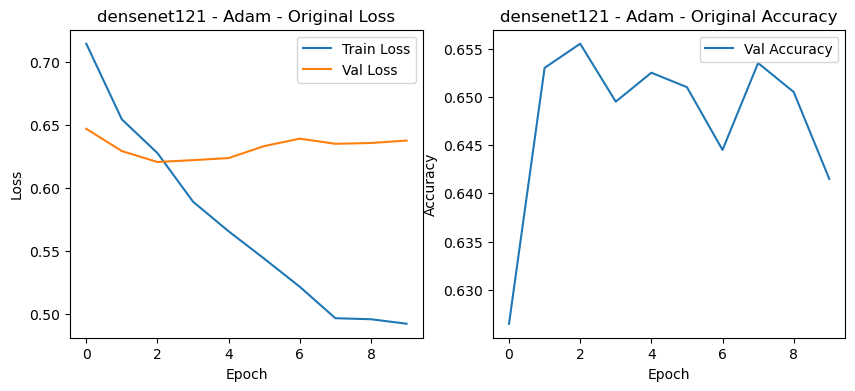

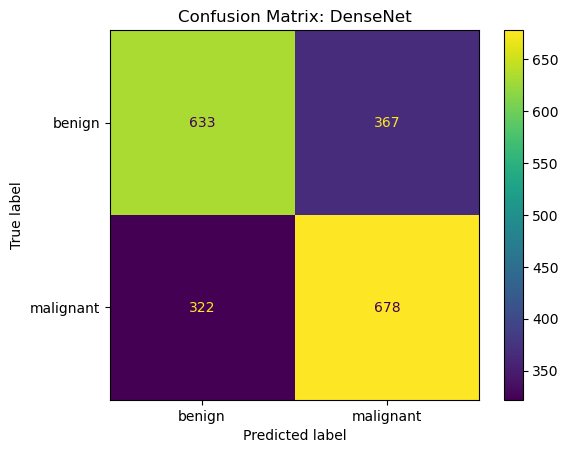

Epoch 0/19
----------
train Loss: 0.7475 Acc: 0.5415
test Loss: 0.6716 Acc: 0.5965
Epoch 0 time: 154.00s
Epoch 1/19
----------
train Loss: 0.6716 Acc: 0.6108
test Loss: 0.6366 Acc: 0.6475
Epoch 1 time: 166.41s
Epoch 2/19
----------
train Loss: 0.6392 Acc: 0.6420
test Loss: 0.6301 Acc: 0.6530
Epoch 2 time: 170.29s
Epoch 3/19
----------
train Loss: 0.5981 Acc: 0.6726
test Loss: 0.6287 Acc: 0.6500
Epoch 3 time: 169.78s
Epoch 4/19
----------
train Loss: 0.5693 Acc: 0.6999
test Loss: 0.6215 Acc: 0.6630
Epoch 4 time: 168.10s
Epoch 5/19
----------
train Loss: 0.5371 Acc: 0.7204
test Loss: 0.6212 Acc: 0.6595
Epoch 5 time: 158.64s
Epoch 6/19
----------
train Loss: 0.5157 Acc: 0.7390
test Loss: 0.6308 Acc: 0.6590
Epoch 6 time: 157.87s
Epoch 7/19
----------
train Loss: 0.4870 Acc: 0.7682
test Loss: 0.6321 Acc: 0.6545
Epoch 7 time: 171.13s
Epoch 8/19
----------
train Loss: 0.4857 Acc: 0.7639
test Loss: 0.6328 Acc: 0.6610
Epoch 8 time: 166.02s
Epoch 9/19
----------
train Loss: 0.4850 Acc: 0.7602
te

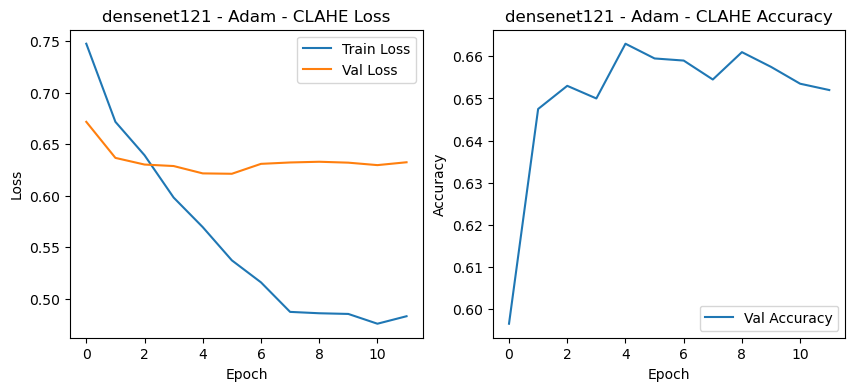

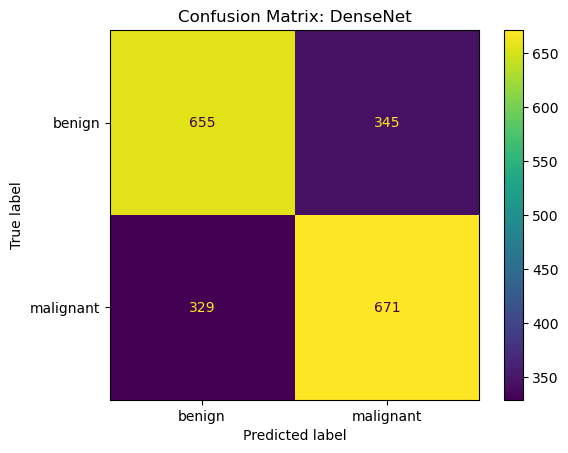

Entrenando densenet121 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7105 Acc: 0.5495
test Loss: 0.6440 Acc: 0.6360
Epoch 0 time: 174.61s
Epoch 1/19
----------
train Loss: 0.6500 Acc: 0.6224
test Loss: 0.6312 Acc: 0.6545
Epoch 1 time: 163.41s
Epoch 2/19
----------
train Loss: 0.6246 Acc: 0.6581
test Loss: 0.6257 Acc: 0.6650
Epoch 2 time: 269.91s
Epoch 3/19
----------
train Loss: 0.5932 Acc: 0.6805
test Loss: 0.6197 Acc: 0.6645
Epoch 3 time: 316.79s
Epoch 4/19
----------
train Loss: 0.5598 Acc: 0.7037
test Loss: 0.6284 Acc: 0.6645
Epoch 4 time: 316.86s
Epoch 5/19
----------
train Loss: 0.5350 Acc: 0.7276
test Loss: 0.6313 Acc: 0.6665
Epoch 5 time: 316.98s
Epoch 6/19
----------
train Loss: 0.4986 Acc: 0.7535
test Loss: 0.6472 Acc: 0.6565
Epoch 6 time: 316.91s
Epoch 7/19
----------
train Loss: 0.4724 Acc: 0.7742
test Loss: 0.6457 Acc: 0.6545
Epoch 7 time: 316.93s
Epoch 8/19
----------
train Loss: 0.4788 Acc: 0.7706
test Loss: 0.6497 Acc:

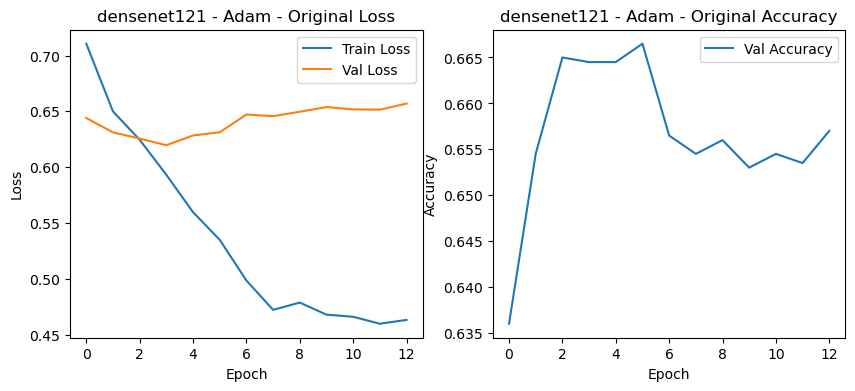

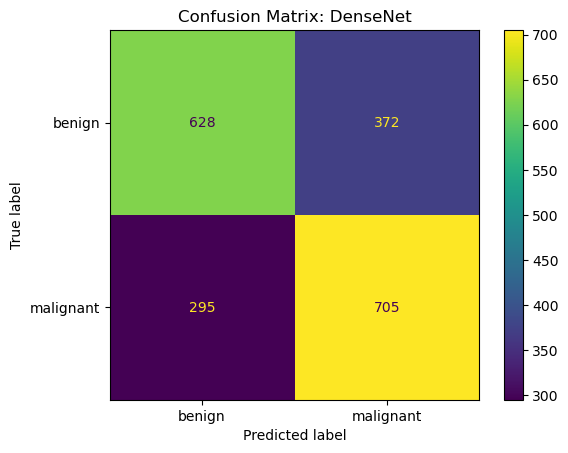

Epoch 0/19
----------
train Loss: 0.7069 Acc: 0.5596
test Loss: 0.6369 Acc: 0.6250
Epoch 0 time: 150.67s
Epoch 1/19
----------
train Loss: 0.6566 Acc: 0.6235
test Loss: 0.6238 Acc: 0.6415
Epoch 1 time: 158.24s
Epoch 2/19
----------
train Loss: 0.6111 Acc: 0.6683
test Loss: 0.6146 Acc: 0.6645
Epoch 2 time: 170.34s
Epoch 3/19
----------
train Loss: 0.5832 Acc: 0.6914
test Loss: 0.6167 Acc: 0.6660
Epoch 3 time: 171.09s
Epoch 4/19
----------
train Loss: 0.5523 Acc: 0.7133
test Loss: 0.6229 Acc: 0.6630
Epoch 4 time: 169.04s
Epoch 5/19
----------
train Loss: 0.5240 Acc: 0.7399
test Loss: 0.6239 Acc: 0.6650
Epoch 5 time: 164.84s
Epoch 6/19
----------
train Loss: 0.4920 Acc: 0.7572
test Loss: 0.6449 Acc: 0.6665
Epoch 6 time: 164.13s
Epoch 7/19
----------
train Loss: 0.4639 Acc: 0.7772
test Loss: 0.6332 Acc: 0.6590
Epoch 7 time: 185.05s
Epoch 8/19
----------
train Loss: 0.4612 Acc: 0.7765
test Loss: 0.6457 Acc: 0.6630
Epoch 8 time: 195.55s
Epoch 9/19
----------
train Loss: 0.4598 Acc: 0.7796
te

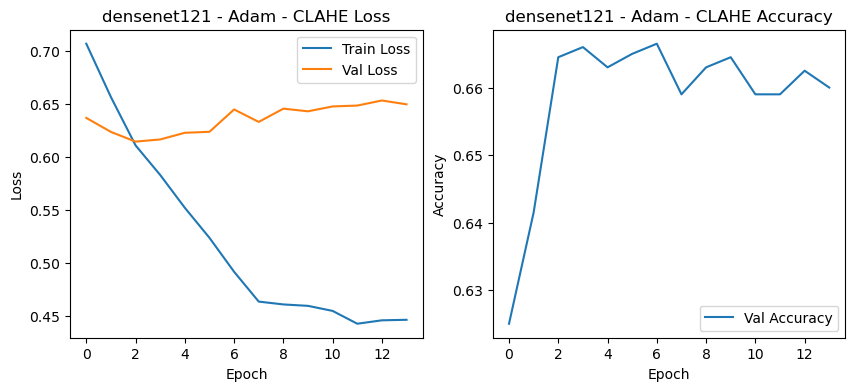

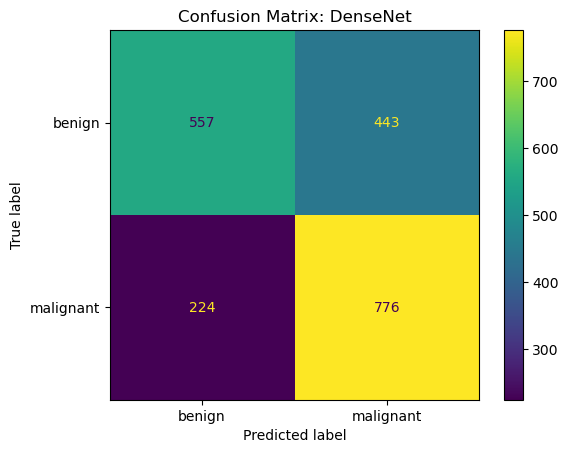

Entrenando densenet121 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.8152 Acc: 0.5314
test Loss: 0.6719 Acc: 0.5925
Epoch 0 time: 191.45s
Epoch 1/19
----------
train Loss: 0.7347 Acc: 0.5885
test Loss: 0.6423 Acc: 0.6450
Epoch 1 time: 181.37s
Epoch 2/19
----------
train Loss: 0.6847 Acc: 0.6214
test Loss: 0.6329 Acc: 0.6565
Epoch 2 time: 184.79s
Epoch 3/19
----------
train Loss: 0.6428 Acc: 0.6495
test Loss: 0.6308 Acc: 0.6565
Epoch 3 time: 184.68s
Epoch 4/19
----------
train Loss: 0.6091 Acc: 0.6755
test Loss: 0.6318 Acc: 0.6585
Epoch 4 time: 183.34s
Epoch 5/19
----------
train Loss: 0.5854 Acc: 0.6989
test Loss: 0.6382 Acc: 0.6485
Epoch 5 time: 183.98s
Epoch 6/19
----------
train Loss: 0.5493 Acc: 0.7199
test Loss: 0.6503 Acc: 0.6460
Epoch 6 time: 180.38s
Epoch 7/19
----------
train Loss: 0.5259 Acc: 0.7344
test Loss: 0.6520 Acc: 0.6475
Epoch 7 time: 170.45s
Epoch 8/19
----------
train Loss: 0.5196 Acc: 0.7364
test Loss: 0.6546 Acc:

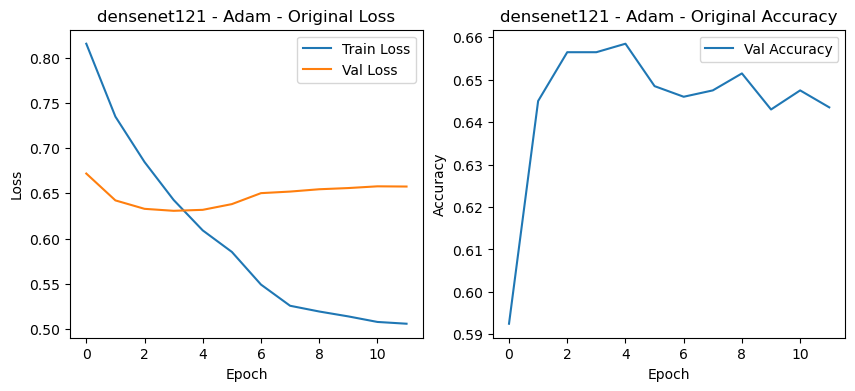

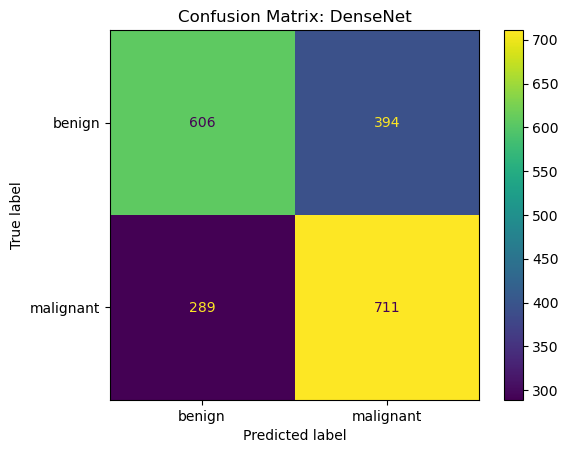

Epoch 0/19
----------
train Loss: 0.8267 Acc: 0.5344
test Loss: 0.7049 Acc: 0.5500
Epoch 0 time: 187.22s
Epoch 1/19
----------
train Loss: 0.7389 Acc: 0.5914
test Loss: 0.6872 Acc: 0.5990
Epoch 1 time: 185.94s
Epoch 2/19
----------
train Loss: 0.6859 Acc: 0.6281
test Loss: 0.6556 Acc: 0.6345
Epoch 2 time: 183.50s
Epoch 3/19
----------
train Loss: 0.6522 Acc: 0.6528
test Loss: 0.6591 Acc: 0.6490
Epoch 3 time: 187.52s
Epoch 4/19
----------
train Loss: 0.6108 Acc: 0.6871
test Loss: 0.6644 Acc: 0.6465
Epoch 4 time: 185.71s
Epoch 5/19
----------
train Loss: 0.5914 Acc: 0.6925
test Loss: 0.6660 Acc: 0.6520
Epoch 5 time: 184.97s
Epoch 6/19
----------
train Loss: 0.5475 Acc: 0.7234
test Loss: 0.6727 Acc: 0.6525
Epoch 6 time: 185.58s
Epoch 7/19
----------
train Loss: 0.5088 Acc: 0.7519
test Loss: 0.6560 Acc: 0.6575
Epoch 7 time: 188.90s
Epoch 8/19
----------
train Loss: 0.5196 Acc: 0.7439
test Loss: 0.6517 Acc: 0.6625
Epoch 8 time: 187.63s
Epoch 9/19
----------
train Loss: 0.5141 Acc: 0.7485
te

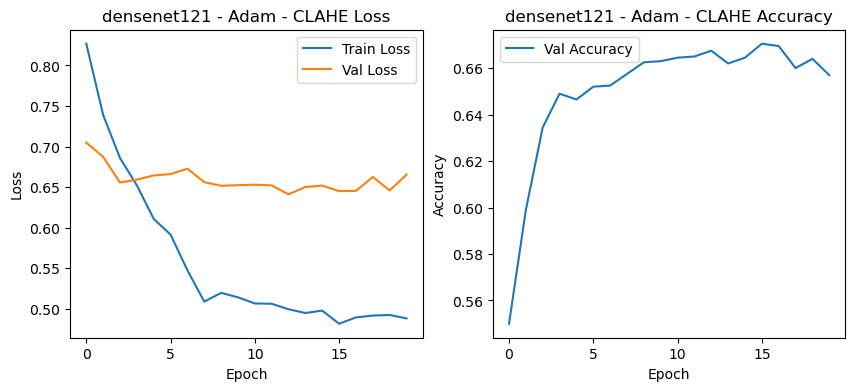

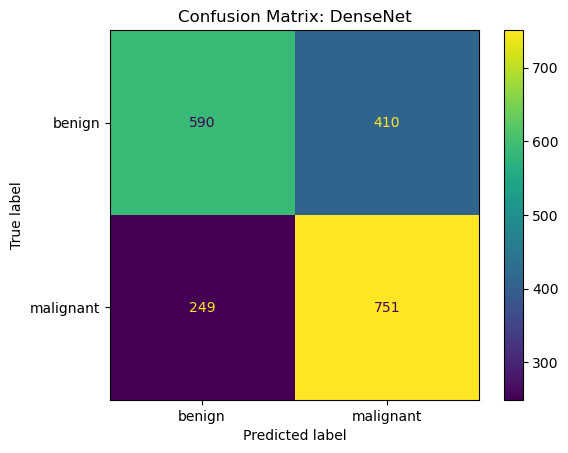

Entrenando densenet121 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7810 Acc: 0.5330
test Loss: 0.6528 Acc: 0.6330
Epoch 0 time: 164.28s
Epoch 1/19
----------
train Loss: 0.7164 Acc: 0.5944
test Loss: 0.6394 Acc: 0.6615
Epoch 1 time: 179.50s
Epoch 2/19
----------
train Loss: 0.6733 Acc: 0.6322
test Loss: 0.6304 Acc: 0.6735
Epoch 2 time: 187.42s
Epoch 3/19
----------
train Loss: 0.6453 Acc: 0.6566
test Loss: 0.6242 Acc: 0.6735
Epoch 3 time: 187.95s
Epoch 4/19
----------
train Loss: 0.6141 Acc: 0.6799
test Loss: 0.6316 Acc: 0.6745
Epoch 4 time: 190.13s
Epoch 5/19
----------
train Loss: 0.5902 Acc: 0.6979
test Loss: 0.6450 Acc: 0.6665
Epoch 5 time: 186.24s
Epoch 6/19
----------
train Loss: 0.5430 Acc: 0.7284
test Loss: 0.6464 Acc: 0.6620
Epoch 6 time: 185.35s
Epoch 7/19
----------
train Loss: 0.5334 Acc: 0.7301
test Loss: 0.6616 Acc: 0.6545
Epoch 7 time: 161.30s
Epoch 8/19
----------
train Loss: 0.5312 Acc: 0.7394
test Loss: 0.6543 Acc:

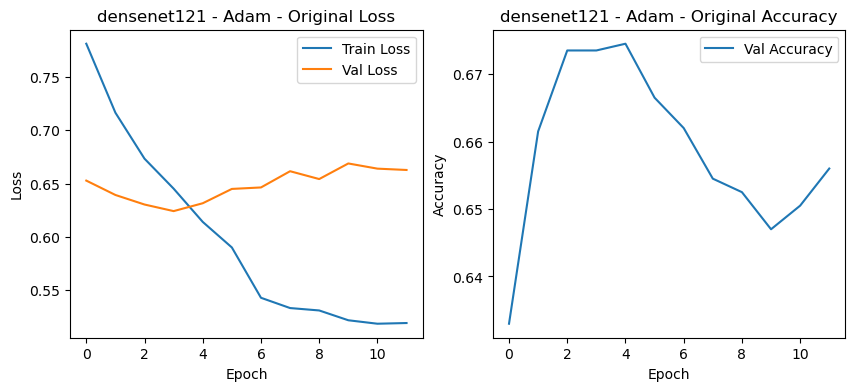

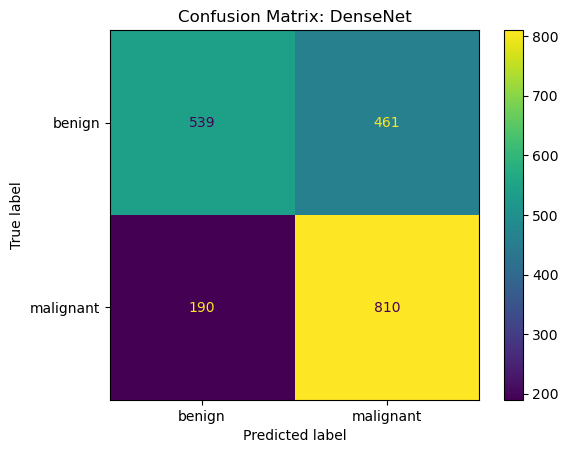

Epoch 0/19
----------
train Loss: 0.7474 Acc: 0.5511
test Loss: 0.6302 Acc: 0.6550
Epoch 0 time: 161.96s
Epoch 1/19
----------
train Loss: 0.6926 Acc: 0.6095
test Loss: 0.6188 Acc: 0.6645
Epoch 1 time: 177.97s
Epoch 2/19
----------
train Loss: 0.6581 Acc: 0.6464
test Loss: 0.6153 Acc: 0.6690
Epoch 2 time: 162.72s
Epoch 3/19
----------
train Loss: 0.6181 Acc: 0.6730
test Loss: 0.6150 Acc: 0.6725
Epoch 3 time: 164.03s
Epoch 4/19
----------
train Loss: 0.5881 Acc: 0.6935
test Loss: 0.6249 Acc: 0.6685
Epoch 4 time: 182.62s
Epoch 5/19
----------
train Loss: 0.5619 Acc: 0.7040
test Loss: 0.6292 Acc: 0.6715
Epoch 5 time: 165.94s
Epoch 6/19
----------
train Loss: 0.5318 Acc: 0.7316
test Loss: 0.6364 Acc: 0.6740
Epoch 6 time: 172.74s
Epoch 7/19
----------
train Loss: 0.5201 Acc: 0.7408
test Loss: 0.6355 Acc: 0.6725
Epoch 7 time: 163.49s
Epoch 8/19
----------
train Loss: 0.5134 Acc: 0.7466
test Loss: 0.6334 Acc: 0.6720
Epoch 8 time: 171.64s
Epoch 9/19
----------
train Loss: 0.5103 Acc: 0.7434
te

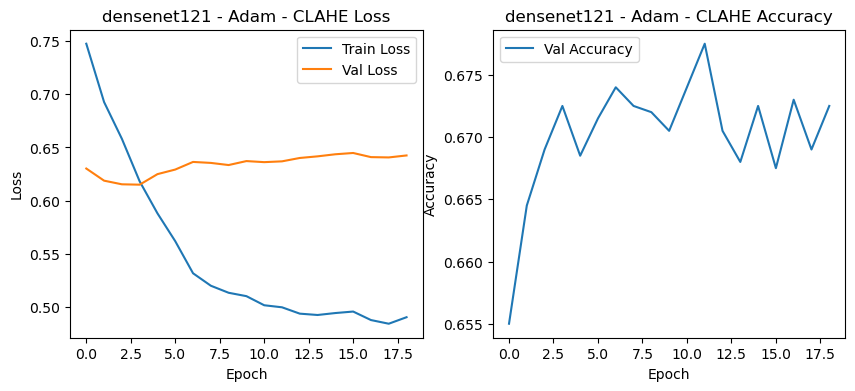

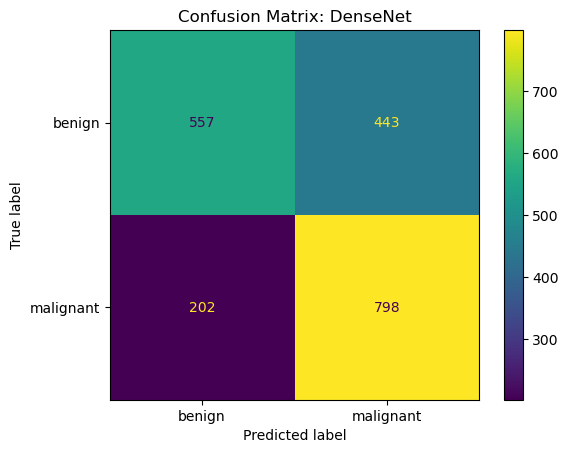

Entrenando densenet121 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7023 Acc: 0.5635
test Loss: 0.6456 Acc: 0.6260
Epoch 0 time: 159.71s
Epoch 1/19
----------
train Loss: 0.6488 Acc: 0.6309
test Loss: 0.6358 Acc: 0.6375
Epoch 1 time: 163.15s
Epoch 2/19
----------
train Loss: 0.6248 Acc: 0.6608
test Loss: 0.6246 Acc: 0.6545
Epoch 2 time: 165.57s
Epoch 3/19
----------
train Loss: 0.5878 Acc: 0.6823
test Loss: 0.6196 Acc: 0.6570
Epoch 3 time: 158.74s
Epoch 4/19
----------
train Loss: 0.5627 Acc: 0.7127
test Loss: 0.6381 Acc: 0.6525
Epoch 4 time: 162.75s
Epoch 5/19
----------
train Loss: 0.5345 Acc: 0.7243
test Loss: 0.6255 Acc: 0.6615
Epoch 5 time: 163.74s
Epoch 6/19
----------
train Loss: 0.5075 Acc: 0.7498
test Loss: 0.6397 Acc: 0.6555
Epoch 6 time: 167.57s
Epoch 7/19
----------
train Loss: 0.4797 Acc: 0.7648
test Loss: 0.6415 Acc: 0.6555
Epoch 7 time: 160.28s
Epoch 8/19
----------
train Loss: 0.4781 Acc: 0.7705
test Loss: 0.6468 Acc

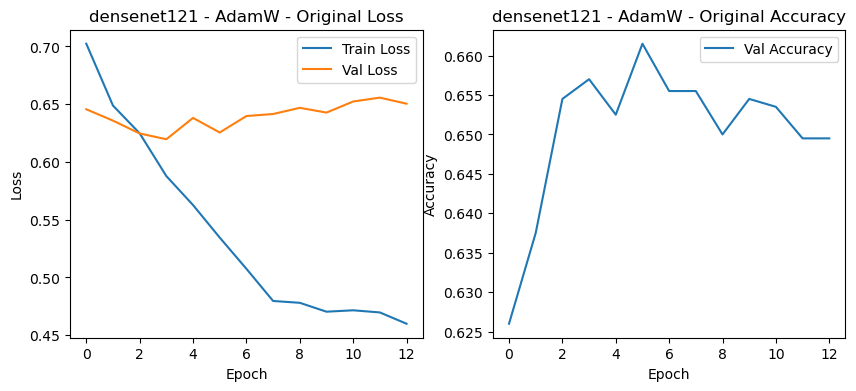

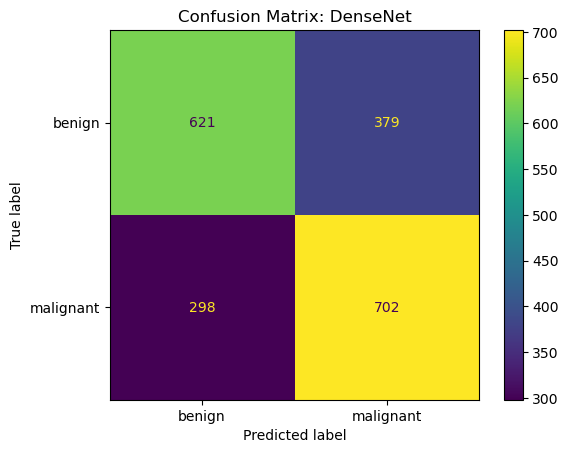

Epoch 0/19
----------
train Loss: 0.7096 Acc: 0.5550
test Loss: 0.6437 Acc: 0.6315
Epoch 0 time: 183.00s
Epoch 1/19
----------
train Loss: 0.6517 Acc: 0.6280
test Loss: 0.6293 Acc: 0.6515
Epoch 1 time: 181.90s
Epoch 2/19
----------
train Loss: 0.6225 Acc: 0.6568
test Loss: 0.6256 Acc: 0.6615
Epoch 2 time: 184.54s
Epoch 3/19
----------
train Loss: 0.5806 Acc: 0.6911
test Loss: 0.6211 Acc: 0.6570
Epoch 3 time: 191.76s
Epoch 4/19
----------
train Loss: 0.5580 Acc: 0.7086
test Loss: 0.6237 Acc: 0.6530
Epoch 4 time: 167.99s
Epoch 5/19
----------
train Loss: 0.5254 Acc: 0.7396
test Loss: 0.6305 Acc: 0.6585
Epoch 5 time: 153.68s
Epoch 6/19
----------
train Loss: 0.4965 Acc: 0.7528
test Loss: 0.6398 Acc: 0.6545
Epoch 6 time: 316.95s
Epoch 7/19
----------
train Loss: 0.4754 Acc: 0.7730
test Loss: 0.6379 Acc: 0.6555
Epoch 7 time: 317.28s
Epoch 8/19
----------
train Loss: 0.4649 Acc: 0.7830
test Loss: 0.6378 Acc: 0.6570
Epoch 8 time: 317.11s
Epoch 9/19
----------
train Loss: 0.4685 Acc: 0.7715
te

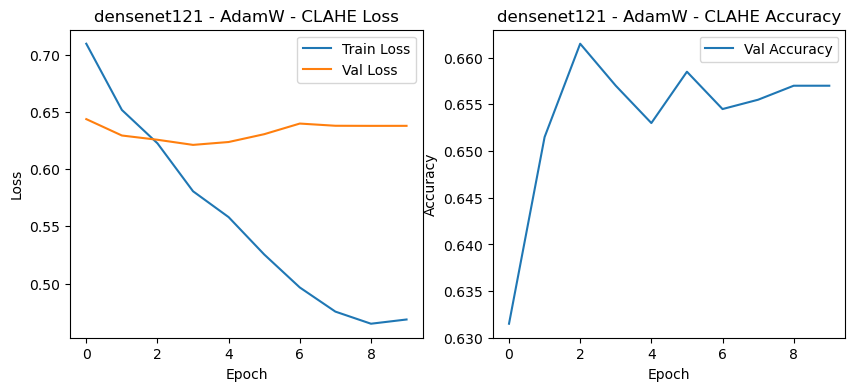

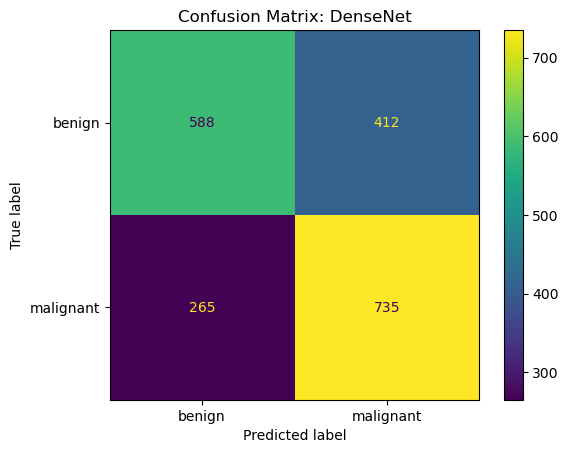

Entrenando densenet121 con AdamW, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7209 Acc: 0.5491
test Loss: 0.6697 Acc: 0.5955
Epoch 0 time: 317.75s
Epoch 1/19
----------
train Loss: 0.6554 Acc: 0.6269
test Loss: 0.6507 Acc: 0.6190
Epoch 1 time: 317.52s
Epoch 2/19
----------
train Loss: 0.6233 Acc: 0.6609
test Loss: 0.6420 Acc: 0.6310
Epoch 2 time: 317.35s
Epoch 3/19
----------
train Loss: 0.5864 Acc: 0.6851
test Loss: 0.6535 Acc: 0.6255
Epoch 3 time: 301.94s
Epoch 4/19
----------
train Loss: 0.5642 Acc: 0.7105
test Loss: 0.6369 Acc: 0.6460
Epoch 4 time: 152.11s
Epoch 5/19
----------
train Loss: 0.5407 Acc: 0.7218
test Loss: 0.6454 Acc: 0.6480
Epoch 5 time: 153.37s
Epoch 6/19
----------
train Loss: 0.5075 Acc: 0.7490
test Loss: 0.6538 Acc: 0.6555
Epoch 6 time: 161.28s
Epoch 7/19
----------
train Loss: 0.4819 Acc: 0.7656
test Loss: 0.6529 Acc: 0.6515
Epoch 7 time: 164.53s
Epoch 8/19
----------
train Loss: 0.4849 Acc: 0.7626
test Loss: 0.6736 Acc

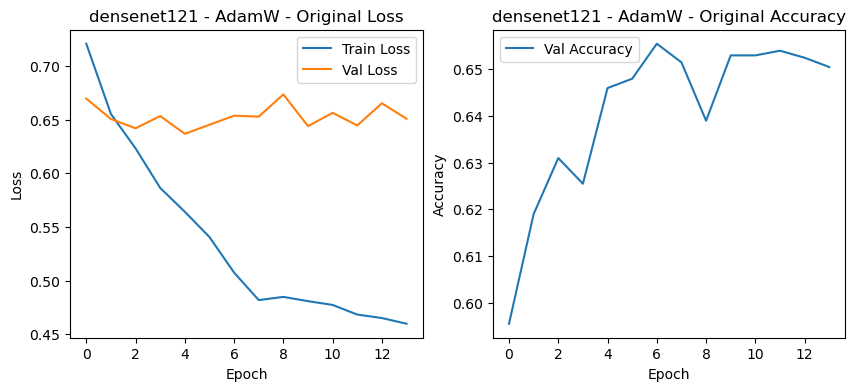

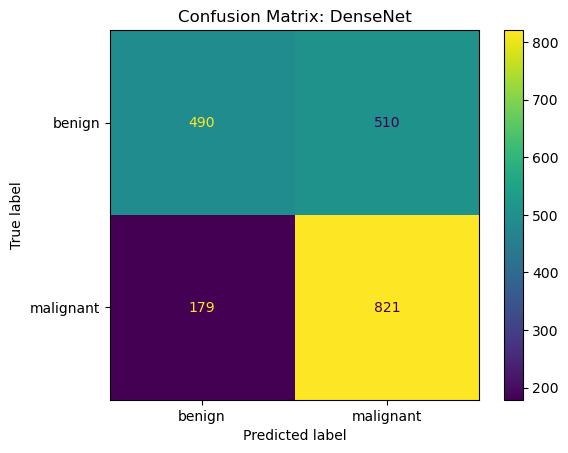

Epoch 0/19
----------
train Loss: 0.7085 Acc: 0.5573
test Loss: 0.6534 Acc: 0.6215
Epoch 0 time: 167.40s
Epoch 1/19
----------
train Loss: 0.6542 Acc: 0.6220
test Loss: 0.6339 Acc: 0.6415
Epoch 1 time: 169.71s
Epoch 2/19
----------
train Loss: 0.6161 Acc: 0.6635
test Loss: 0.6249 Acc: 0.6570
Epoch 2 time: 168.95s
Epoch 3/19
----------
train Loss: 0.5857 Acc: 0.6889
test Loss: 0.6280 Acc: 0.6615
Epoch 3 time: 167.16s
Epoch 4/19
----------
train Loss: 0.5607 Acc: 0.7021
test Loss: 0.6251 Acc: 0.6670
Epoch 4 time: 166.89s
Epoch 5/19
----------
train Loss: 0.5326 Acc: 0.7278
test Loss: 0.6287 Acc: 0.6660
Epoch 5 time: 168.35s
Epoch 6/19
----------
train Loss: 0.5201 Acc: 0.7395
test Loss: 0.6378 Acc: 0.6650
Epoch 6 time: 167.45s
Epoch 7/19
----------
train Loss: 0.4897 Acc: 0.7640
test Loss: 0.6371 Acc: 0.6615
Epoch 7 time: 165.95s
Epoch 8/19
----------
train Loss: 0.4888 Acc: 0.7612
test Loss: 0.6316 Acc: 0.6630
Epoch 8 time: 167.34s
Epoch 9/19
----------
train Loss: 0.4856 Acc: 0.7600
te

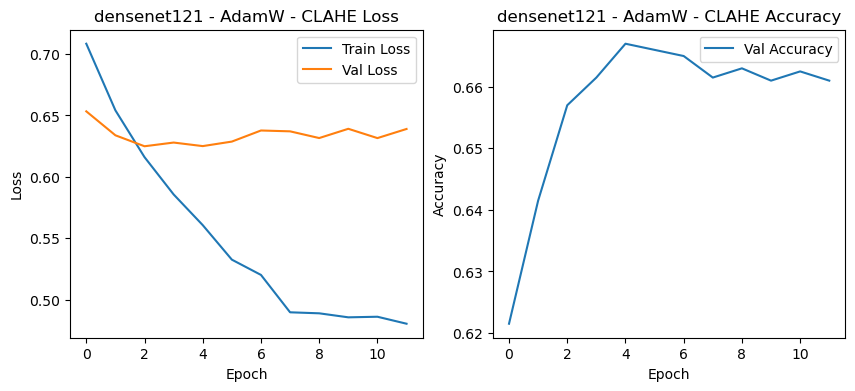

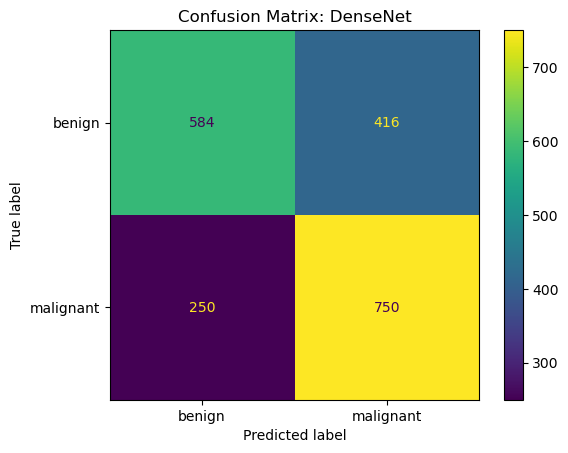

Entrenando densenet121 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 0.7964 Acc: 0.5308
test Loss: 0.6429 Acc: 0.6275
Epoch 0 time: 165.91s
Epoch 1/19
----------
train Loss: 0.7132 Acc: 0.5964
test Loss: 0.6197 Acc: 0.6730
Epoch 1 time: 169.91s
Epoch 2/19
----------
train Loss: 0.6690 Acc: 0.6372
test Loss: 0.6092 Acc: 0.6710
Epoch 2 time: 164.91s
Epoch 3/19
----------
train Loss: 0.6446 Acc: 0.6495
test Loss: 0.6141 Acc: 0.6670
Epoch 3 time: 163.59s
Epoch 4/19
----------
train Loss: 0.6134 Acc: 0.6743
test Loss: 0.6134 Acc: 0.6650
Epoch 4 time: 170.19s
Epoch 5/19
----------
train Loss: 0.5826 Acc: 0.6920
test Loss: 0.6221 Acc: 0.6575
Epoch 5 time: 171.96s
Epoch 6/19
----------
train Loss: 0.5562 Acc: 0.7165
test Loss: 0.6323 Acc: 0.6605
Epoch 6 time: 171.40s
Epoch 7/19
----------
train Loss: 0.5377 Acc: 0.7285
test Loss: 0.6308 Acc: 0.6630
Epoch 7 time: 168.08s
Epoch 8/19
----------
train Loss: 0.5313 Acc: 0.7286
test Loss: 0.6326 Acc

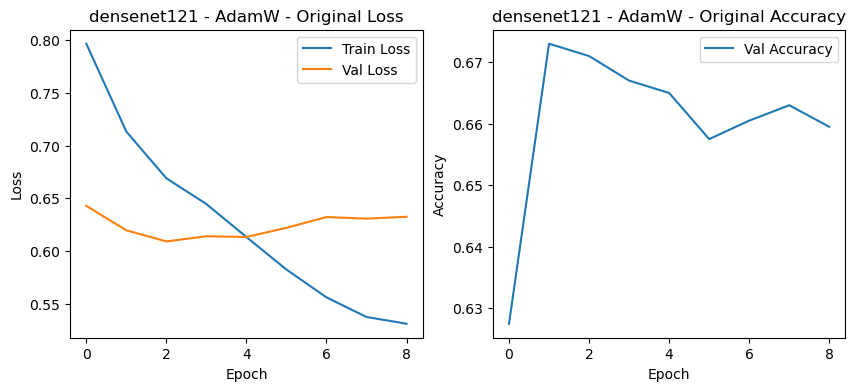

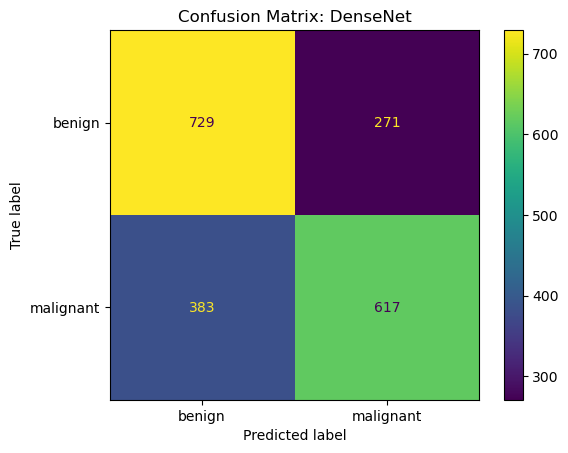

Epoch 0/19
----------
train Loss: 0.8056 Acc: 0.5339
test Loss: 0.6579 Acc: 0.6075
Epoch 0 time: 170.39s
Epoch 1/19
----------
train Loss: 0.7216 Acc: 0.5956
test Loss: 0.6347 Acc: 0.6560
Epoch 1 time: 171.60s
Epoch 2/19
----------
train Loss: 0.6698 Acc: 0.6336
test Loss: 0.6173 Acc: 0.6660
Epoch 2 time: 170.99s
Epoch 3/19
----------
train Loss: 0.6282 Acc: 0.6645
test Loss: 0.6185 Acc: 0.6615
Epoch 3 time: 171.87s
Epoch 4/19
----------
train Loss: 0.5934 Acc: 0.6864
test Loss: 0.6242 Acc: 0.6620
Epoch 4 time: 167.14s
Epoch 5/19
----------
train Loss: 0.5626 Acc: 0.7084
test Loss: 0.6328 Acc: 0.6555
Epoch 5 time: 165.92s
Epoch 6/19
----------
train Loss: 0.5416 Acc: 0.7269
test Loss: 0.6439 Acc: 0.6495
Epoch 6 time: 167.24s
Epoch 7/19
----------
train Loss: 0.5005 Acc: 0.7552
test Loss: 0.6412 Acc: 0.6550
Epoch 7 time: 166.49s
Epoch 8/19
----------
train Loss: 0.4967 Acc: 0.7604
test Loss: 0.6586 Acc: 0.6465
Epoch 8 time: 169.48s
Epoch 9/19
----------
train Loss: 0.4876 Acc: 0.7598
te

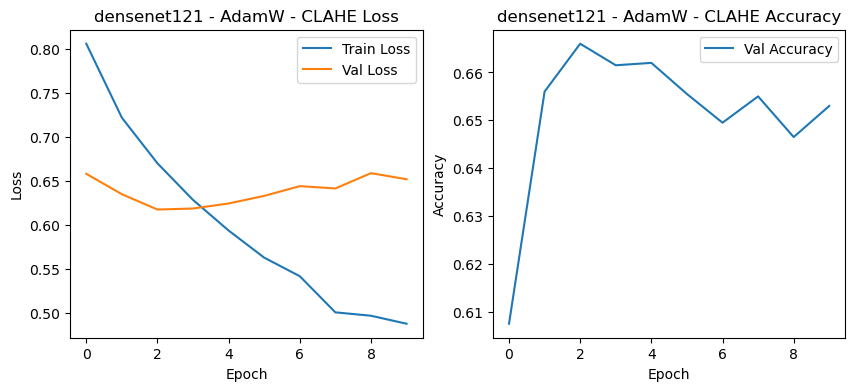

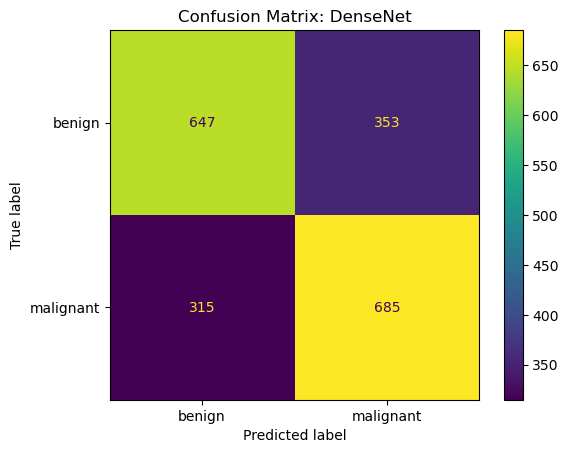

Entrenando densenet121 con AdamW, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 0.7667 Acc: 0.5371
test Loss: 0.6559 Acc: 0.5940
Epoch 0 time: 157.00s
Epoch 1/19
----------
train Loss: 0.7133 Acc: 0.5873
test Loss: 0.6428 Acc: 0.6170
Epoch 1 time: 155.85s
Epoch 2/19
----------
train Loss: 0.6789 Acc: 0.6200
test Loss: 0.6314 Acc: 0.6400
Epoch 2 time: 160.86s
Epoch 3/19
----------
train Loss: 0.6461 Acc: 0.6488
test Loss: 0.6270 Acc: 0.6540
Epoch 3 time: 159.21s
Epoch 4/19
----------
train Loss: 0.6286 Acc: 0.6629
test Loss: 0.6347 Acc: 0.6440
Epoch 4 time: 159.86s
Epoch 5/19
----------
train Loss: 0.5930 Acc: 0.6925
test Loss: 0.6360 Acc: 0.6475
Epoch 5 time: 158.78s
Epoch 6/19
----------
train Loss: 0.5668 Acc: 0.7037
test Loss: 0.6360 Acc: 0.6525
Epoch 6 time: 158.15s
Epoch 7/19
----------
train Loss: 0.5357 Acc: 0.7289
test Loss: 0.6318 Acc: 0.6500
Epoch 7 time: 160.03s
Epoch 8/19
----------
train Loss: 0.5492 Acc: 0.7210
test Loss: 0.6325 Acc

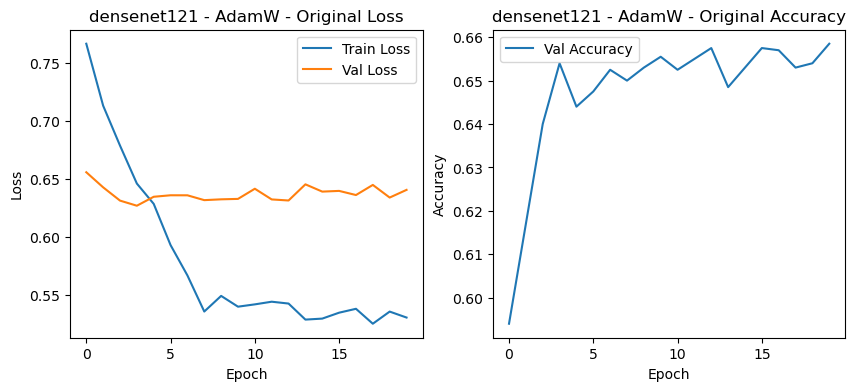

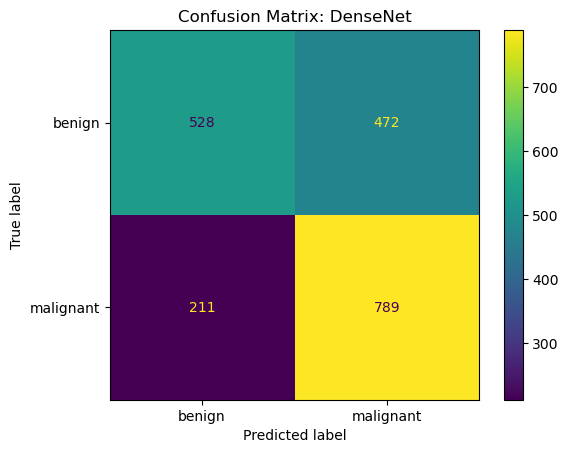

Epoch 0/19
----------
train Loss: 0.7639 Acc: 0.5483
test Loss: 0.6594 Acc: 0.6015
Epoch 0 time: 168.70s
Epoch 1/19
----------
train Loss: 0.6998 Acc: 0.6101
test Loss: 0.6358 Acc: 0.6435
Epoch 1 time: 156.67s
Epoch 2/19
----------
train Loss: 0.6545 Acc: 0.6425
test Loss: 0.6359 Acc: 0.6505
Epoch 2 time: 159.32s
Epoch 3/19
----------
train Loss: 0.6327 Acc: 0.6631
test Loss: 0.6375 Acc: 0.6610
Epoch 3 time: 153.32s
Epoch 4/19
----------
train Loss: 0.5921 Acc: 0.6901
test Loss: 0.6338 Acc: 0.6670
Epoch 4 time: 159.67s
Epoch 5/19
----------
train Loss: 0.5591 Acc: 0.7127
test Loss: 0.6422 Acc: 0.6640
Epoch 5 time: 155.92s
Epoch 6/19
----------
train Loss: 0.5354 Acc: 0.7294
test Loss: 0.6520 Acc: 0.6615
Epoch 6 time: 156.68s
Epoch 7/19
----------
train Loss: 0.5057 Acc: 0.7538
test Loss: 0.6471 Acc: 0.6610
Epoch 7 time: 157.65s
Epoch 8/19
----------
train Loss: 0.4958 Acc: 0.7576
test Loss: 0.6474 Acc: 0.6615
Epoch 8 time: 156.53s
Epoch 9/19
----------
train Loss: 0.5079 Acc: 0.7475
te

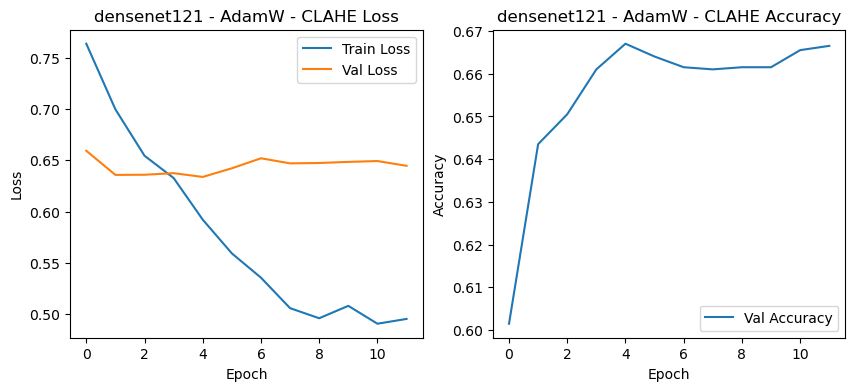

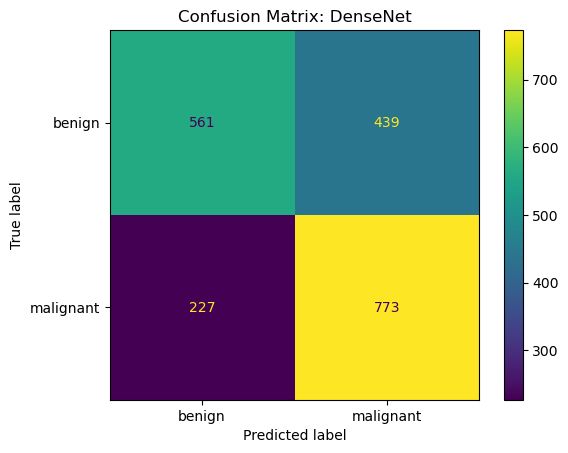

Entrenando densenet121 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
Ejecución detenida por el usuario de manera controlada


In [20]:
import torch.optim as optim
import time

def run_densenet121_experiments():
    model_name = 'densenet121'
    learning_rates = [0.0001, 0.001]
    weight_decays = [0.0001, 0.001]
    momentums = [0.9, 0.95]
    optimizers = ['SGD', 'Adam', 'AdamW']
    dropouts = [0.5, 0.7]
    batch_sizes = [16, 32]
    scheduler_types = ['StepLR', 'ExponentialLR', 'MultiStepLR']
    activations = ['relu', 'leaky_relu', 'sigmoid', 'tanh']

    try:
        for lr in learning_rates:
            for wd in weight_decays:
                for momentum in momentums:
                    for optimizer_type in optimizers:
                        for dropout in dropouts:
                            for batch_size in batch_sizes:
                                for scheduler_type in scheduler_types:
                                    for activation in activations:
                                        print(f"Entrenando {model_name} con {optimizer_type}, lr={lr}, wd={wd}, dropout={dropout}, batch_size={batch_size}, scheduler={scheduler_type}, activation={activation}...")
                                        
                                        if optimizer_type == 'SGD':
                                            optimizer_func = optim.SGD
                                        elif optimizer_type == 'Adam':
                                            optimizer_func = optim.Adam
                                        elif optimizer_type == 'AdamW':
                                            optimizer_func = optim.AdamW
                                        else:
                                            raise ValueError("Optimador no soportado.")

                                        dataloaders = original_dataloaders if model_name != 'inception_v3' else original_dataloaders_inception
                                        dataset_sizes = original_dataset_sizes if model_name != 'inception_v3' else original_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - Original')
                                        plot_confusion_matrix(model, dataloaders)
                                        
                                        # Repetir con imágenes CLAHE
                                        dataloaders = clahe_dataloaders if model_name != 'inception_v3' else clahe_dataloaders_inception
                                        dataset_sizes = clahe_dataset_sizes if model_name != 'inception_v3' else clahe_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - CLAHE')
                                        plot_confusion_matrix(model, dataloaders)
    except KeyboardInterrupt:
        print("Ejecución detenida por el usuario de manera controlada")

run_densenet121_experiments()


Entrenando inception_v3 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 1.0545 Acc: 0.5006
test Loss: 0.6955 Acc: 0.4825
Epoch 0 time: 115.88s
Epoch 1/19
----------
train Loss: 1.0289 Acc: 0.5356
test Loss: 0.6825 Acc: 0.5610
Epoch 1 time: 122.49s
Epoch 2/19
----------
train Loss: 1.0182 Acc: 0.5605
test Loss: 0.6739 Acc: 0.5900
Epoch 2 time: 124.12s
Epoch 3/19
----------
train Loss: 1.0069 Acc: 0.5764
test Loss: 0.6657 Acc: 0.6110
Epoch 3 time: 121.13s
Epoch 4/19
----------
train Loss: 1.0024 Acc: 0.5920
test Loss: 0.6604 Acc: 0.6150
Epoch 4 time: 130.61s
Epoch 5/19
----------
train Loss: 0.9934 Acc: 0.6029
test Loss: 0.6560 Acc: 0.6290
Epoch 5 time: 172.71s
Epoch 6/19
----------
train Loss: 0.9773 Acc: 0.6142
test Loss: 0.6537 Acc: 0.6315
Epoch 6 time: 138.54s
Epoch 7/19
----------
train Loss: 0.9813 Acc: 0.6180
test Loss: 0.6556 Acc: 0.6270
Epoch 7 time: 143.55s
Epoch 8/19
----------
train Loss: 0.9887 Acc: 0.6120
test Loss: 0.6482 Acc:

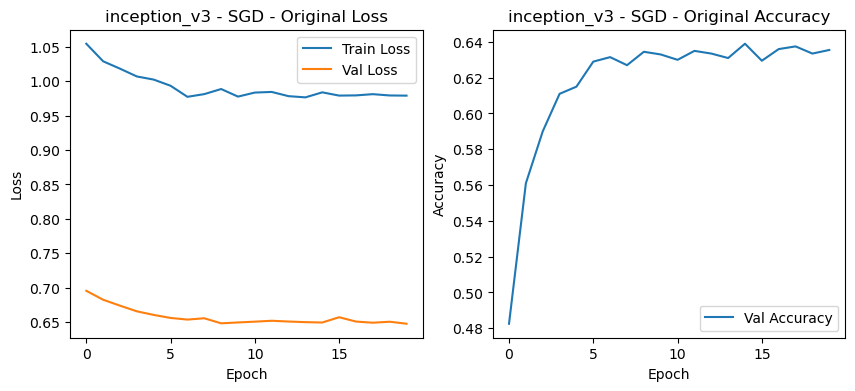

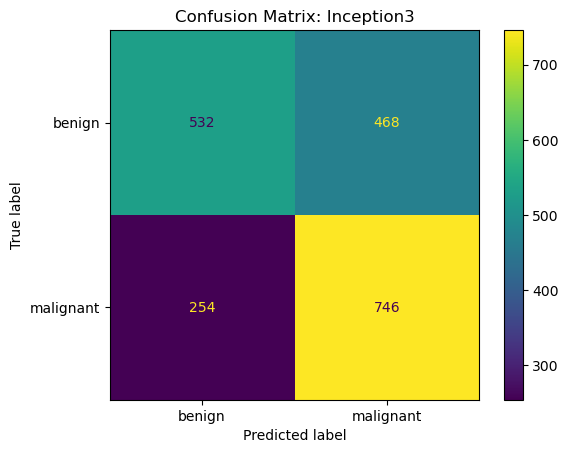

Epoch 0/19
----------
train Loss: 1.0567 Acc: 0.5160
test Loss: 0.6735 Acc: 0.5960
Epoch 0 time: 126.56s
Epoch 1/19
----------
train Loss: 1.0374 Acc: 0.5504
test Loss: 0.6594 Acc: 0.6375
Epoch 1 time: 129.32s
Epoch 2/19
----------
train Loss: 1.0250 Acc: 0.5650
test Loss: 0.6504 Acc: 0.6450
Epoch 2 time: 123.61s
Epoch 3/19
----------
train Loss: 1.0155 Acc: 0.5896
test Loss: 0.6442 Acc: 0.6490
Epoch 3 time: 124.11s
Epoch 4/19
----------
train Loss: 1.0041 Acc: 0.5993
test Loss: 0.6399 Acc: 0.6530
Epoch 4 time: 138.01s
Epoch 5/19
----------
train Loss: 1.0013 Acc: 0.6056
test Loss: 0.6329 Acc: 0.6585
Epoch 5 time: 133.65s
Epoch 6/19
----------
train Loss: 0.9930 Acc: 0.6204
test Loss: 0.6307 Acc: 0.6580
Epoch 6 time: 140.06s
Epoch 7/19
----------
train Loss: 0.9826 Acc: 0.6291
test Loss: 0.6345 Acc: 0.6505
Epoch 7 time: 134.09s
Epoch 8/19
----------
train Loss: 0.9883 Acc: 0.6146
test Loss: 0.6308 Acc: 0.6620
Epoch 8 time: 139.78s
Epoch 9/19
----------
train Loss: 0.9869 Acc: 0.6281
te

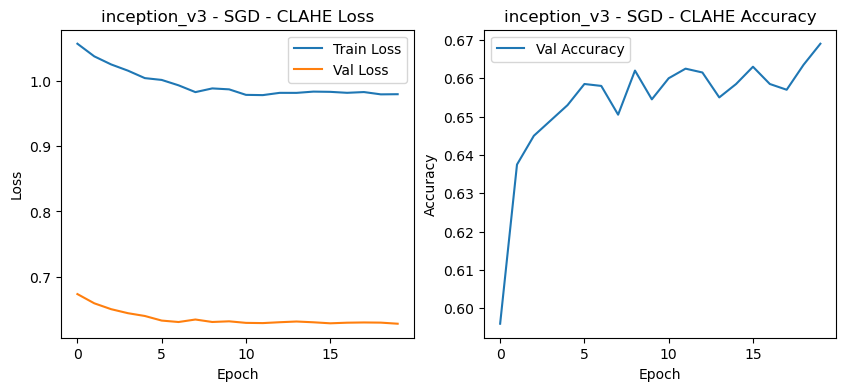

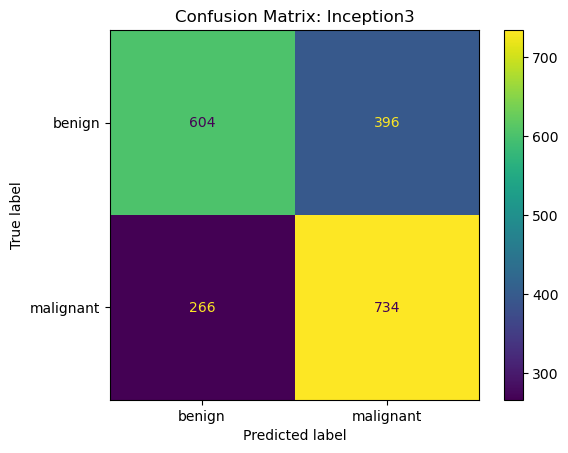

Entrenando inception_v3 con SGD, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 1.0367 Acc: 0.5225
test Loss: 0.6843 Acc: 0.5600
Epoch 0 time: 139.39s
Epoch 1/19
----------
train Loss: 1.0181 Acc: 0.5441
test Loss: 0.6788 Acc: 0.5635
Epoch 1 time: 129.41s
Epoch 2/19
----------
train Loss: 1.0025 Acc: 0.5695
test Loss: 0.6649 Acc: 0.6100
Epoch 2 time: 123.02s
Epoch 3/19
----------
train Loss: 0.9932 Acc: 0.5820
test Loss: 0.6616 Acc: 0.6180
Epoch 3 time: 121.56s
Epoch 4/19
----------
train Loss: 0.9887 Acc: 0.5945
test Loss: 0.6553 Acc: 0.6320
Epoch 4 time: 121.32s
Epoch 5/19
----------
train Loss: 0.9808 Acc: 0.6045
test Loss: 0.6488 Acc: 0.6460
Epoch 5 time: 121.08s
Epoch 6/19
----------
train Loss: 0.9770 Acc: 0.6118
test Loss: 0.6477 Acc: 0.6395
Epoch 6 time: 120.63s
Epoch 7/19
----------
train Loss: 0.9681 Acc: 0.6258
test Loss: 0.6454 Acc: 0.6475
Epoch 7 time: 122.52s
Epoch 8/19
----------
train Loss: 0.9598 Acc: 0.6315
test Loss: 0.6499 Acc:

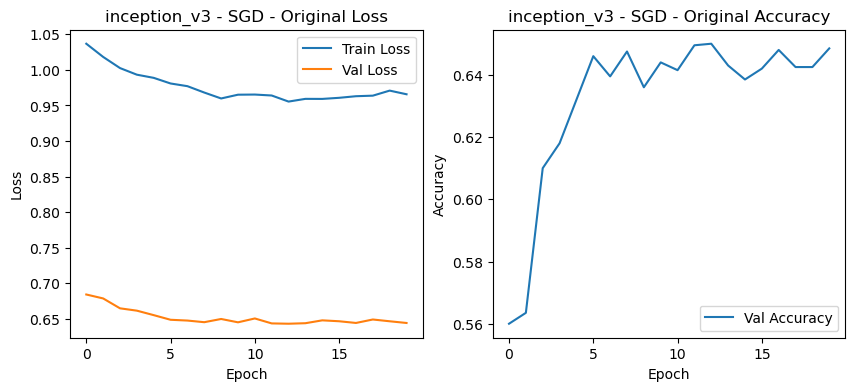

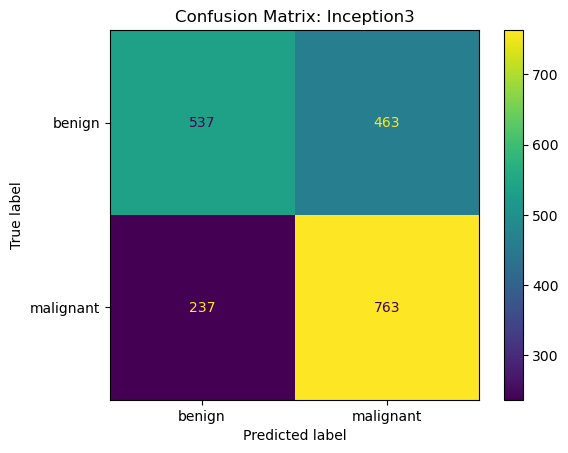

Epoch 0/19
----------
train Loss: 1.0380 Acc: 0.5122
test Loss: 0.6770 Acc: 0.5910
Epoch 0 time: 131.70s
Epoch 1/19
----------
train Loss: 1.0192 Acc: 0.5484
test Loss: 0.6630 Acc: 0.6225
Epoch 1 time: 135.59s
Epoch 2/19
----------
train Loss: 1.0060 Acc: 0.5706
test Loss: 0.6553 Acc: 0.6240
Epoch 2 time: 140.09s
Epoch 3/19
----------
train Loss: 0.9913 Acc: 0.5955
test Loss: 0.6488 Acc: 0.6370
Epoch 3 time: 132.97s
Epoch 4/19
----------
train Loss: 0.9819 Acc: 0.6001
test Loss: 0.6464 Acc: 0.6355
Epoch 4 time: 138.64s
Epoch 5/19
----------
train Loss: 0.9789 Acc: 0.6073
test Loss: 0.6406 Acc: 0.6450
Epoch 5 time: 142.73s
Epoch 6/19
----------
train Loss: 0.9731 Acc: 0.6226
test Loss: 0.6396 Acc: 0.6420
Epoch 6 time: 144.43s
Epoch 7/19
----------
train Loss: 0.9730 Acc: 0.6256
test Loss: 0.6386 Acc: 0.6475
Epoch 7 time: 125.41s
Epoch 8/19
----------
train Loss: 0.9717 Acc: 0.6260
test Loss: 0.6383 Acc: 0.6505
Epoch 8 time: 123.06s
Epoch 9/19
----------
train Loss: 0.9663 Acc: 0.6285
te

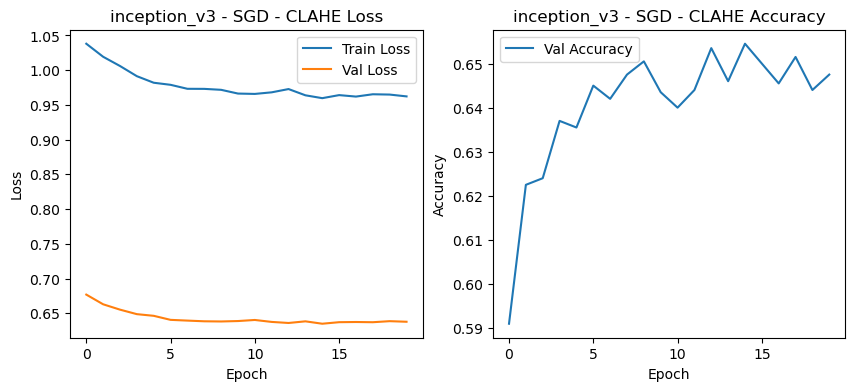

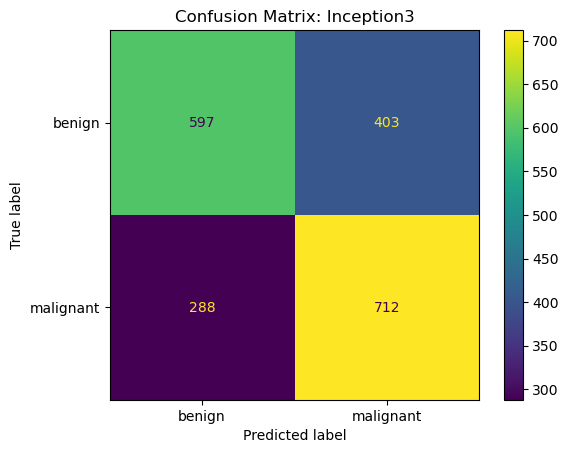

Entrenando inception_v3 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 1.0916 Acc: 0.5135
test Loss: 0.6787 Acc: 0.5855
Epoch 0 time: 135.62s
Epoch 1/19
----------
train Loss: 1.0781 Acc: 0.5278
test Loss: 0.6666 Acc: 0.6190
Epoch 1 time: 140.47s
Epoch 2/19
----------
train Loss: 1.0667 Acc: 0.5425
test Loss: 0.6593 Acc: 0.6325
Epoch 2 time: 126.55s
Epoch 3/19
----------
train Loss: 1.0537 Acc: 0.5584
test Loss: 0.6528 Acc: 0.6410
Epoch 3 time: 119.99s
Epoch 4/19
----------
train Loss: 1.0411 Acc: 0.5657
test Loss: 0.6477 Acc: 0.6505
Epoch 4 time: 121.82s
Epoch 5/19
----------
train Loss: 1.0304 Acc: 0.5805
test Loss: 0.6423 Acc: 0.6615
Epoch 5 time: 120.80s
Epoch 6/19
----------
train Loss: 1.0235 Acc: 0.5886
test Loss: 0.6419 Acc: 0.6605
Epoch 6 time: 119.29s
Epoch 7/19
----------
train Loss: 1.0143 Acc: 0.6079
test Loss: 0.6408 Acc: 0.6605
Epoch 7 time: 120.05s
Epoch 8/19
----------
train Loss: 1.0135 Acc: 0.6126
test Loss: 0.6394 Acc:

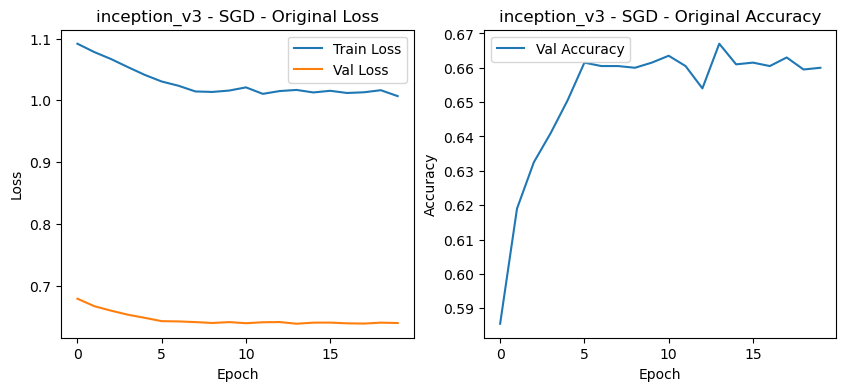

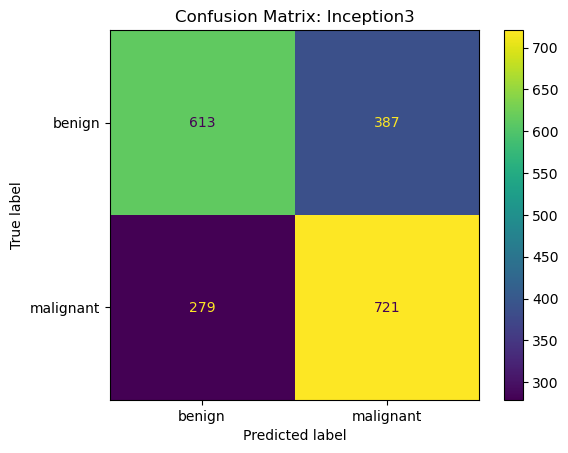

Epoch 0/19
----------
train Loss: 1.1085 Acc: 0.5126
test Loss: 0.6922 Acc: 0.5220
Epoch 0 time: 119.42s
Epoch 1/19
----------
train Loss: 1.0767 Acc: 0.5370
test Loss: 0.6801 Acc: 0.5420
Epoch 1 time: 120.09s
Epoch 2/19
----------
train Loss: 1.0717 Acc: 0.5506
test Loss: 0.6675 Acc: 0.5720
Epoch 2 time: 121.12s
Epoch 3/19
----------
train Loss: 1.0540 Acc: 0.5639
test Loss: 0.6559 Acc: 0.6035
Epoch 3 time: 125.83s
Epoch 4/19
----------
train Loss: 1.0313 Acc: 0.5939
test Loss: 0.6491 Acc: 0.6135
Epoch 4 time: 122.69s
Epoch 5/19
----------
train Loss: 1.0165 Acc: 0.6068
test Loss: 0.6456 Acc: 0.6240
Epoch 5 time: 121.45s
Epoch 6/19
----------
train Loss: 1.0220 Acc: 0.6056
test Loss: 0.6423 Acc: 0.6255
Epoch 6 time: 121.34s
Epoch 7/19
----------
train Loss: 1.0061 Acc: 0.6222
test Loss: 0.6407 Acc: 0.6255
Epoch 7 time: 121.22s
Epoch 8/19
----------
train Loss: 1.0095 Acc: 0.6128
test Loss: 0.6342 Acc: 0.6430
Epoch 8 time: 120.82s
Epoch 9/19
----------
train Loss: 1.0089 Acc: 0.6171
te

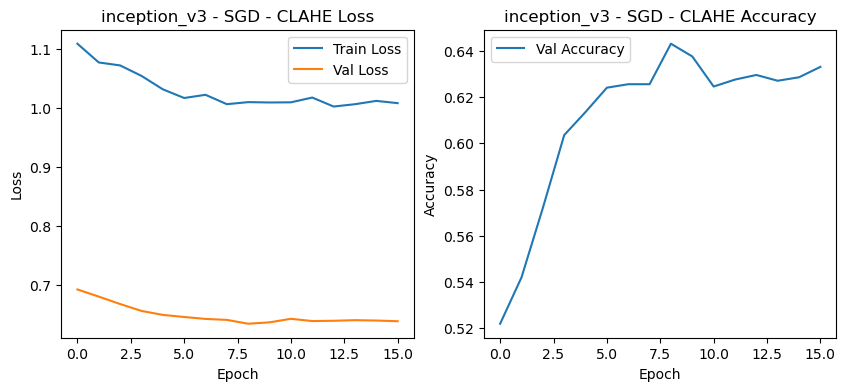

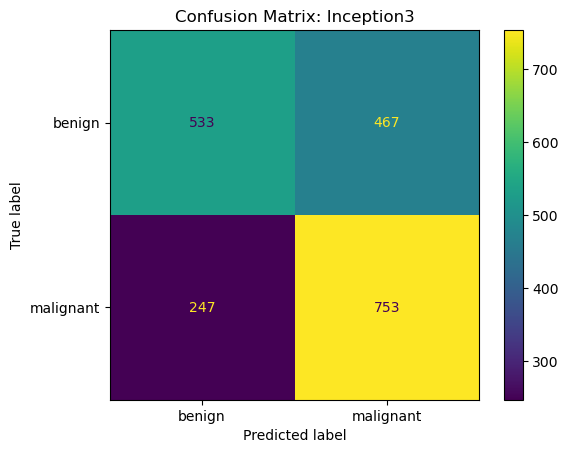

Entrenando inception_v3 con SGD, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=32...
Epoch 0/19
----------
train Loss: 1.1380 Acc: 0.5076
test Loss: 0.6955 Acc: 0.5090
Epoch 0 time: 130.44s
Epoch 1/19
----------
train Loss: 1.1228 Acc: 0.5178
test Loss: 0.6859 Acc: 0.5275
Epoch 1 time: 120.10s
Epoch 2/19
----------
train Loss: 1.1053 Acc: 0.5399
test Loss: 0.6782 Acc: 0.5515
Epoch 2 time: 121.42s
Epoch 3/19
----------
train Loss: 1.0940 Acc: 0.5516
test Loss: 0.6673 Acc: 0.5870
Epoch 3 time: 119.80s
Epoch 4/19
----------
train Loss: 1.0752 Acc: 0.5707
test Loss: 0.6613 Acc: 0.6020
Epoch 4 time: 125.94s
Epoch 5/19
----------
train Loss: 1.0745 Acc: 0.5800
test Loss: 0.6554 Acc: 0.6140
Epoch 5 time: 132.20s
Epoch 6/19
----------
train Loss: 1.0604 Acc: 0.5906
test Loss: 0.6518 Acc: 0.6260
Epoch 6 time: 125.14s
Epoch 7/19
----------
train Loss: 1.0551 Acc: 0.5915
test Loss: 0.6488 Acc: 0.6315
Epoch 7 time: 126.48s
Epoch 8/19
----------
train Loss: 1.0585 Acc: 0.5950
test Loss: 0.6517 Acc:

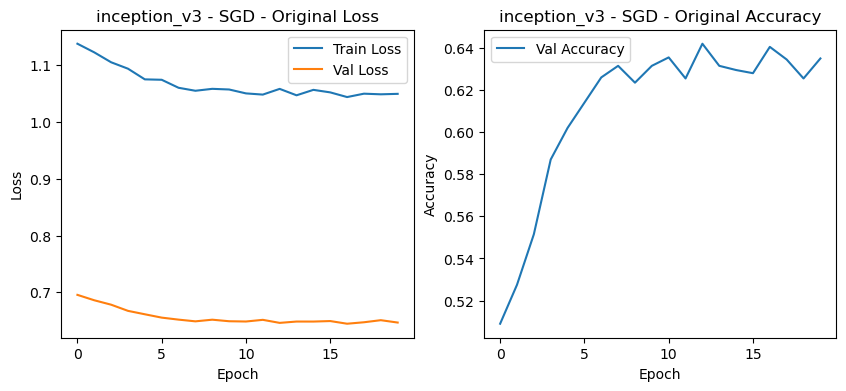

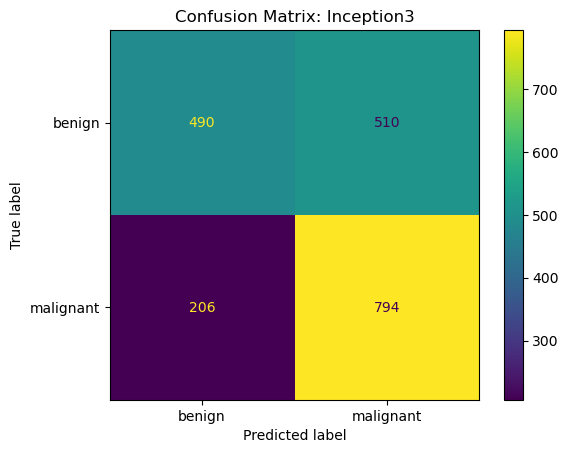

Epoch 0/19
----------
train Loss: 1.0878 Acc: 0.5058
test Loss: 0.6868 Acc: 0.5565
Epoch 0 time: 119.32s
Epoch 1/19
----------
train Loss: 1.0713 Acc: 0.5296
test Loss: 0.6701 Acc: 0.6035
Epoch 1 time: 120.24s
Epoch 2/19
----------
train Loss: 1.0561 Acc: 0.5523
test Loss: 0.6615 Acc: 0.6055
Epoch 2 time: 120.49s
Epoch 3/19
----------
train Loss: 1.0440 Acc: 0.5655
test Loss: 0.6514 Acc: 0.6320
Epoch 3 time: 121.21s
Epoch 4/19
----------
train Loss: 1.0308 Acc: 0.5869
test Loss: 0.6445 Acc: 0.6395
Epoch 4 time: 121.79s
Epoch 5/19
----------
train Loss: 1.0199 Acc: 0.5876
test Loss: 0.6411 Acc: 0.6425
Epoch 5 time: 121.56s
Epoch 6/19
----------
train Loss: 1.0238 Acc: 0.5999
test Loss: 0.6389 Acc: 0.6480
Epoch 6 time: 120.57s
Epoch 7/19
----------
train Loss: 1.0092 Acc: 0.6049
test Loss: 0.6373 Acc: 0.6495
Epoch 7 time: 121.25s
Epoch 8/19
----------
train Loss: 1.0103 Acc: 0.6095
test Loss: 0.6388 Acc: 0.6505
Epoch 8 time: 132.49s
Epoch 9/19
----------
train Loss: 1.0096 Acc: 0.6014
te

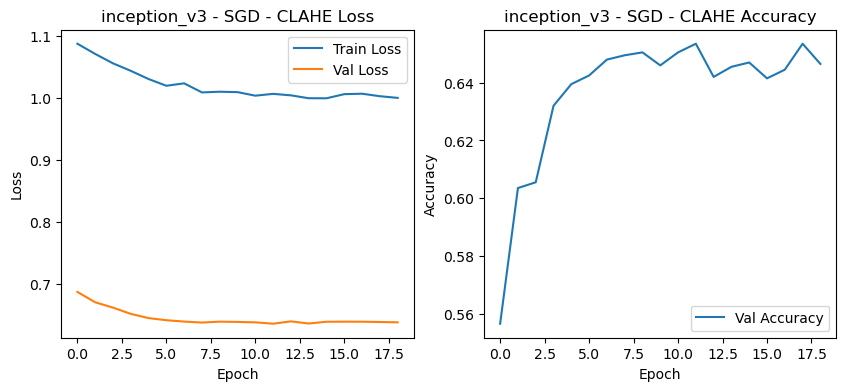

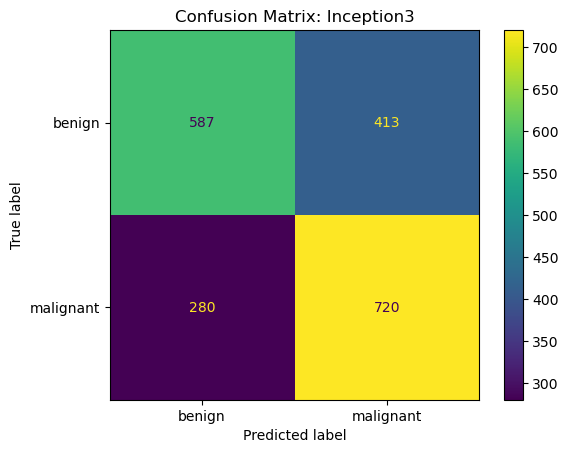

Entrenando inception_v3 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=16...
Epoch 0/19
----------
train Loss: 1.0436 Acc: 0.5062
test Loss: 0.6818 Acc: 0.5490
Epoch 0 time: 126.21s
Epoch 1/19
----------
train Loss: 1.0151 Acc: 0.5439
test Loss: 0.6705 Acc: 0.5895
Epoch 1 time: 134.98s
Epoch 2/19
----------
train Loss: 1.0130 Acc: 0.5583
test Loss: 0.6582 Acc: 0.6170
Epoch 2 time: 128.94s
Epoch 3/19
----------
train Loss: 0.9980 Acc: 0.5765
test Loss: 0.6573 Acc: 0.6085
Epoch 3 time: 129.88s
Epoch 4/19
----------
train Loss: 0.9921 Acc: 0.5915
test Loss: 0.6506 Acc: 0.6280
Epoch 4 time: 127.12s
Epoch 5/19
----------
train Loss: 0.9828 Acc: 0.5919
test Loss: 0.6457 Acc: 0.6330
Epoch 5 time: 122.97s
Epoch 6/19
----------
train Loss: 0.9783 Acc: 0.6035
test Loss: 0.6449 Acc: 0.6320
Epoch 6 time: 122.20s
Epoch 7/19
----------
train Loss: 0.9658 Acc: 0.6214
test Loss: 0.6406 Acc: 0.6450
Epoch 7 time: 127.67s
Epoch 8/19
----------
train Loss: 0.9664 Acc: 0.6242
test Loss: 0.6469 Acc

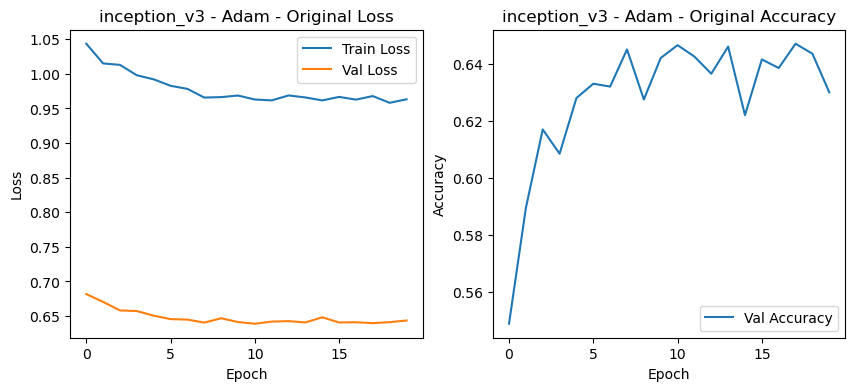

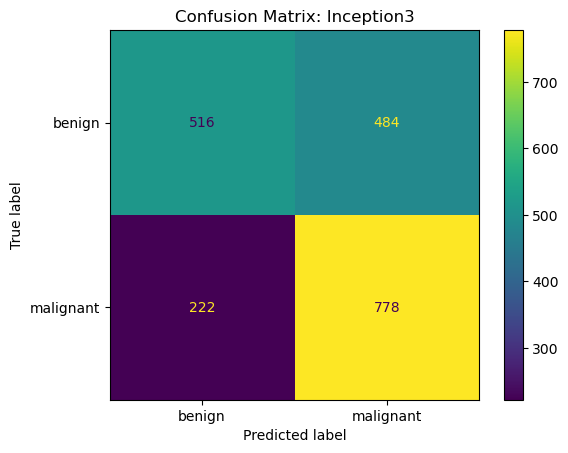

Epoch 0/19
----------
train Loss: 1.0460 Acc: 0.5098
test Loss: 0.6865 Acc: 0.5165
Epoch 0 time: 119.98s
Epoch 1/19
----------
train Loss: 1.0190 Acc: 0.5414
test Loss: 0.6715 Acc: 0.5760
Epoch 1 time: 120.80s
Epoch 2/19
----------
train Loss: 1.0060 Acc: 0.5669
test Loss: 0.6626 Acc: 0.5865
Epoch 2 time: 121.11s
Epoch 3/19
----------
train Loss: 0.9907 Acc: 0.5881
test Loss: 0.6541 Acc: 0.6125
Epoch 3 time: 126.32s
Epoch 4/19
----------
train Loss: 0.9854 Acc: 0.6029
test Loss: 0.6464 Acc: 0.6265
Epoch 4 time: 126.27s
Epoch 5/19
----------
train Loss: 0.9789 Acc: 0.6090
test Loss: 0.6441 Acc: 0.6295
Epoch 5 time: 122.16s
Epoch 6/19
----------
train Loss: 0.9720 Acc: 0.6195
test Loss: 0.6407 Acc: 0.6310
Epoch 6 time: 120.78s
Epoch 7/19
----------
train Loss: 0.9626 Acc: 0.6251
test Loss: 0.6393 Acc: 0.6385
Epoch 7 time: 121.02s
Epoch 8/19
----------
train Loss: 0.9625 Acc: 0.6290
test Loss: 0.6379 Acc: 0.6415
Epoch 8 time: 121.60s
Epoch 9/19
----------
train Loss: 0.9634 Acc: 0.6255
te

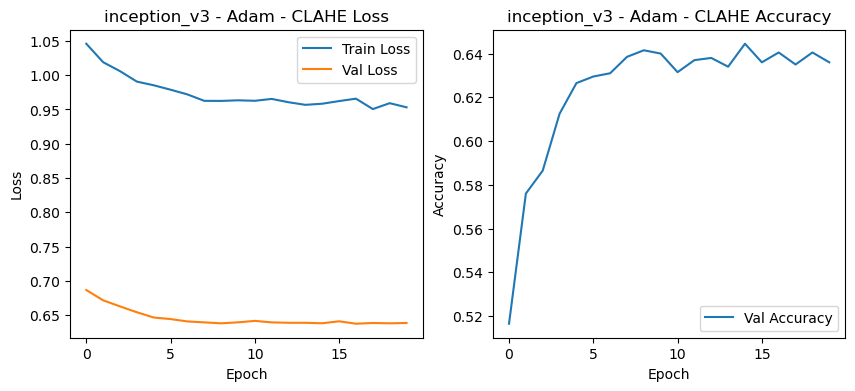

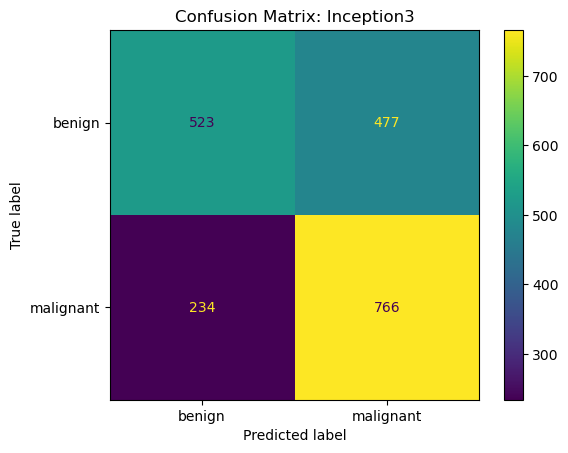

Entrenando inception_v3 con Adam, lr=0.0001, wd=0.0001, dropout=0.5, batch_size=32...
Epoch 0/19
----------
train Loss: 1.0617 Acc: 0.5146
test Loss: 0.6852 Acc: 0.5300
Epoch 0 time: 119.46s
Epoch 1/19
----------
train Loss: 1.0476 Acc: 0.5345
test Loss: 0.6717 Acc: 0.5960
Epoch 1 time: 120.25s
Epoch 2/19
----------
train Loss: 1.0417 Acc: 0.5593
test Loss: 0.6612 Acc: 0.6135
Epoch 2 time: 122.12s
Epoch 3/19
----------
train Loss: 1.0201 Acc: 0.5795
test Loss: 0.6543 Acc: 0.6310
Epoch 3 time: 121.50s
Epoch 4/19
----------
train Loss: 1.0138 Acc: 0.5951
test Loss: 0.6479 Acc: 0.6405
Epoch 4 time: 122.40s
Epoch 5/19
----------
train Loss: 1.0021 Acc: 0.6119
test Loss: 0.6460 Acc: 0.6430
Epoch 5 time: 120.99s
Epoch 6/19
----------
train Loss: 0.9956 Acc: 0.6195
test Loss: 0.6429 Acc: 0.6505
Epoch 6 time: 120.64s
Epoch 7/19
----------
train Loss: 0.9955 Acc: 0.6259
test Loss: 0.6422 Acc: 0.6505
Epoch 7 time: 120.90s
Epoch 8/19
----------
train Loss: 0.9908 Acc: 0.6260
test Loss: 0.6422 Acc

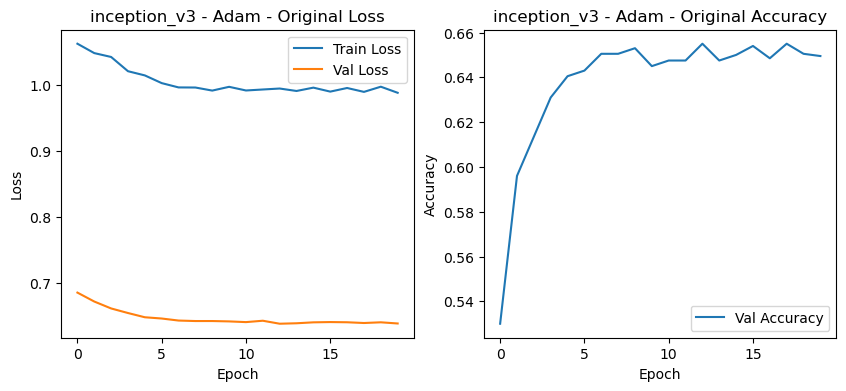

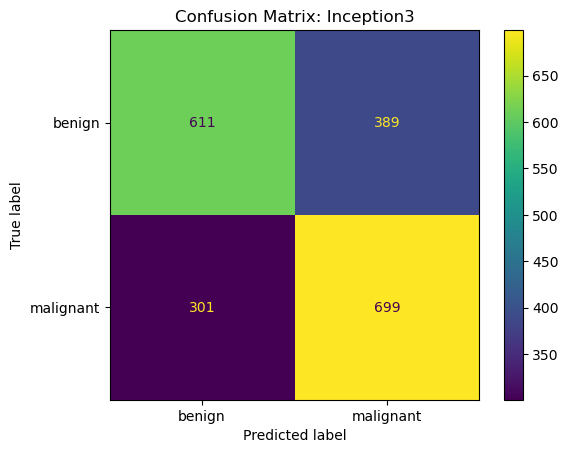

Epoch 0/19
----------
train Loss: 1.0479 Acc: 0.5075
test Loss: 0.6863 Acc: 0.5460
Epoch 0 time: 119.03s
Epoch 1/19
----------
train Loss: 1.0226 Acc: 0.5457
test Loss: 0.6710 Acc: 0.5885
Epoch 1 time: 121.94s
Epoch 2/19
----------
train Loss: 1.0122 Acc: 0.5689
test Loss: 0.6612 Acc: 0.6110
Epoch 2 time: 121.57s
Epoch 3/19
----------
train Loss: 1.0078 Acc: 0.5809
test Loss: 0.6528 Acc: 0.6320
Epoch 3 time: 120.83s
Epoch 4/19
----------
train Loss: 0.9930 Acc: 0.5953
test Loss: 0.6480 Acc: 0.6350
Epoch 4 time: 121.43s
Epoch 5/19
----------
train Loss: 0.9835 Acc: 0.6031
test Loss: 0.6429 Acc: 0.6465
Epoch 5 time: 121.35s
Epoch 6/19
----------
train Loss: 0.9842 Acc: 0.6053
test Loss: 0.6412 Acc: 0.6375
Epoch 6 time: 121.25s
Epoch 7/19
----------
train Loss: 0.9758 Acc: 0.6172
test Loss: 0.6411 Acc: 0.6425
Epoch 7 time: 121.36s
Epoch 8/19
----------
train Loss: 0.9733 Acc: 0.6204
test Loss: 0.6396 Acc: 0.6415
Epoch 8 time: 120.80s
Epoch 9/19
----------
train Loss: 0.9722 Acc: 0.6250
te

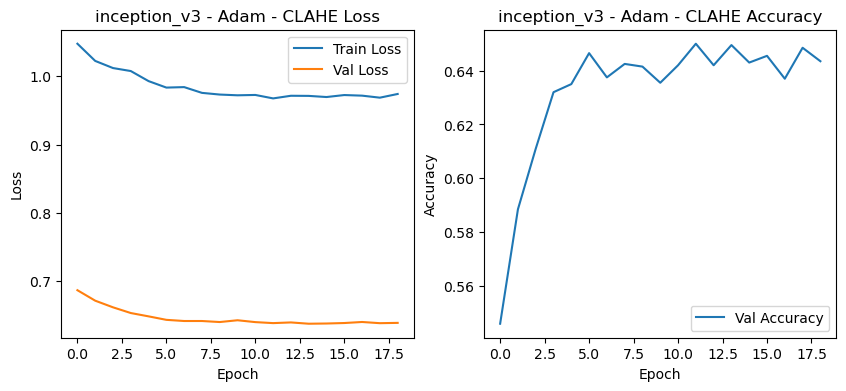

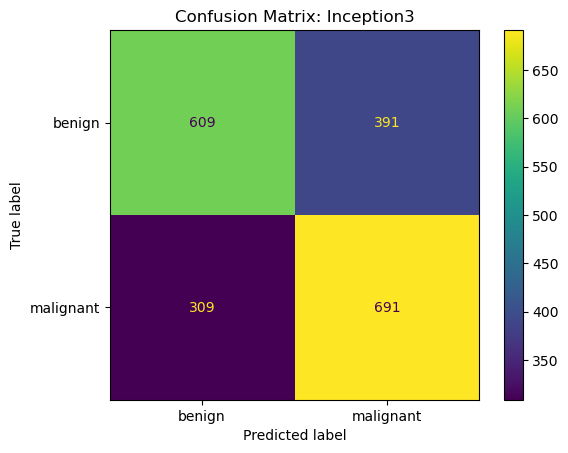

Entrenando inception_v3 con Adam, lr=0.0001, wd=0.0001, dropout=0.7, batch_size=16...
Epoch 0/19
----------
train Loss: 1.0910 Acc: 0.5132
test Loss: 0.6821 Acc: 0.5665
Epoch 0 time: 119.63s
Epoch 1/19
----------
train Loss: 1.0784 Acc: 0.5329
test Loss: 0.6694 Acc: 0.5950
Epoch 1 time: 121.01s
Epoch 2/19
----------
train Loss: 1.0633 Acc: 0.5434
test Loss: 0.6611 Acc: 0.6115
Epoch 2 time: 121.19s
Epoch 3/19
----------
train Loss: 1.0499 Acc: 0.5633
test Loss: 0.6555 Acc: 0.6310
Epoch 3 time: 120.71s
Epoch 4/19
----------
train Loss: 1.0451 Acc: 0.5664
test Loss: 0.6504 Acc: 0.6445
Epoch 4 time: 127.03s
Epoch 5/19
----------
train Loss: 1.0352 Acc: 0.5891
test Loss: 0.6463 Acc: 0.6540
Epoch 5 time: 120.74s
Epoch 6/19
----------
train Loss: 1.0224 Acc: 0.5968
test Loss: 0.6417 Acc: 0.6555
Epoch 6 time: 122.13s
Epoch 7/19
----------
train Loss: 1.0213 Acc: 0.5999
test Loss: 0.6398 Acc: 0.6595
Epoch 7 time: 123.48s
Epoch 8/19
----------
train Loss: 1.0222 Acc: 0.5985
test Loss: 0.6413 Acc

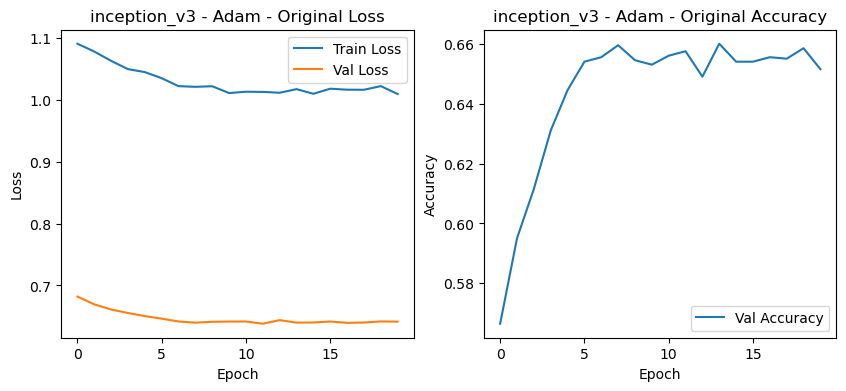

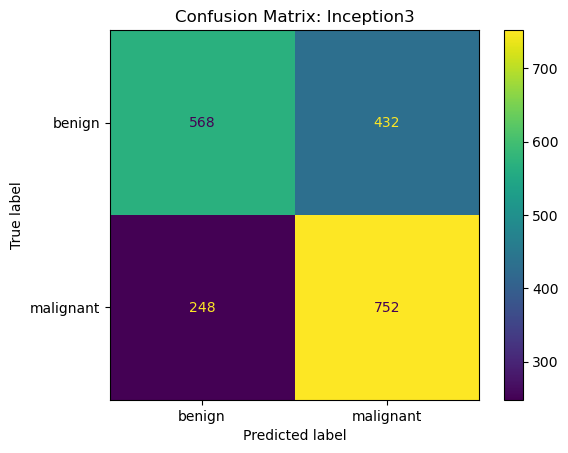

Epoch 0/19
----------
train Loss: 1.1163 Acc: 0.5104
test Loss: 0.6908 Acc: 0.5345
Epoch 0 time: 119.12s
Epoch 1/19
----------
train Loss: 1.0919 Acc: 0.5292
test Loss: 0.6781 Acc: 0.5620
Epoch 1 time: 122.33s
Epoch 2/19
----------
train Loss: 1.0822 Acc: 0.5457
test Loss: 0.6667 Acc: 0.5830
Epoch 2 time: 122.90s
Epoch 3/19
----------
train Loss: 1.0663 Acc: 0.5634
test Loss: 0.6563 Acc: 0.6135
Epoch 3 time: 121.22s
Epoch 4/19
----------
train Loss: 1.0573 Acc: 0.5733
test Loss: 0.6527 Acc: 0.6095
Epoch 4 time: 122.22s
Epoch 5/19
----------
train Loss: 1.0449 Acc: 0.5905
test Loss: 0.6483 Acc: 0.6205
Epoch 5 time: 121.44s
Epoch 6/19
----------
train Loss: 1.0339 Acc: 0.5983
test Loss: 0.6418 Acc: 0.6430
Epoch 6 time: 121.72s
Epoch 7/19
----------
train Loss: 1.0350 Acc: 0.6095
test Loss: 0.6433 Acc: 0.6275
Epoch 7 time: 121.78s
Epoch 8/19
----------
train Loss: 1.0290 Acc: 0.6078
test Loss: 0.6396 Acc: 0.6400
Epoch 8 time: 121.86s
Epoch 9/19
----------
train Loss: 1.0330 Acc: 0.6023
te

In [ ]:
import torch.optim as optim
import time

def run_inception_v3_experiments():
    model_name = 'inception_v3'
    learning_rates = [0.0001, 0.001]
    weight_decays = [0.0001, 0.001]
    momentums = [0.9, 0.95]
    optimizers = ['SGD', 'Adam', 'AdamW']
    dropouts = [0.5, 0.7]
    batch_sizes = [16, 32]
    scheduler_types = ['StepLR', 'ExponentialLR', 'MultiStepLR']
    activations = ['relu', 'leaky_relu', 'sigmoid', 'tanh']

    try:
        for lr in learning_rates:
            for wd in weight_decays:
                for momentum in momentums:
                    for optimizer_type in optimizers:
                        for dropout in dropouts:
                            for batch_size in batch_sizes:
                                for scheduler_type in scheduler_types:
                                    for activation in activations:
                                        print(f"Entrenando {model_name} con {optimizer_type}, lr={lr}, wd={wd}, dropout={dropout}, batch_size={batch_size}, scheduler={scheduler_type}, activation={activation}...")
                                        
                                        if optimizer_type == 'SGD':
                                            optimizer_func = optim.SGD
                                        elif optimizer_type == 'Adam':
                                            optimizer_func = optim.Adam
                                        elif optimizer_type == 'AdamW':
                                            optimizer_func = optim.AdamW
                                        else:
                                            raise ValueError("Optimador no soportado.")

                                        dataloaders = original_dataloaders if model_name != 'inception_v3' else original_dataloaders_inception
                                        dataset_sizes = original_dataset_sizes if model_name != 'inception_v3' else original_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - Original')
                                        plot_confusion_matrix(model, dataloaders)
                                        
                                        # Repetir con imágenes CLAHE
                                        dataloaders = clahe_dataloaders if model_name != 'inception_v3' else clahe_dataloaders_inception
                                        dataset_sizes = clahe_dataset_sizes if model_name != 'inception_v3' else clahe_dataset_sizes_inception
                                        model, criterion, optimizer, scheduler = create_model(model_name, class_names, lr, wd, momentum, dropout, activation, scheduler_type)
                                        
                                        model, train_losses, val_losses, val_accuracies, epoch_times = train_model(
                                            model, criterion, optimizer, scheduler, num_epochs=30, dataloaders=dataloaders, dataset_sizes=dataset_sizes, early_stopping_patience=early_stopping_patience, is_inception=(model_name == 'inception_v3')
                                        )
                                        
                                        plot_metrics(train_losses, val_losses, val_accuracies, f'{model_name} - {optimizer_type} - CLAHE')
                                        plot_confusion_matrix(model, dataloaders)
    except KeyboardInterrupt:
        print("Ejecución detenida por el usuario de manera controlada")

run_inception_v3_experiments()


## Parte 6: Gráficas de pérdidas y precisiones y matriz de confusión
Se visualiza las pérdidas y precisiones durante el entrenamiento del modelo y se muestra la matriz de confusión.


In [11]:
# Función para visualizar las pérdidas y precisiones
def plot_metrics(train_losses, val_losses, val_accuracies, model_name):
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot([acc.cpu().numpy() for acc in val_accuracies], label='Val Accuracy')  # Mover tensores a la CPU y convertir a numpy
    plt.title(f'{model_name} Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

# Función para calcular y mostrar la matriz de confusión
def plot_confusion_matrix(model, dataloaders, phase='test'):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot()
    plt.title(f'Confusion Matrix: {model.__class__.__name__}')
    plt.show()

## Justificación y Citas

### Código de Entrenamiento y Evaluación
La función `train_model` y el flujo general del código se basan en ejemplos de [PyTorch Tutorials](https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html).

### Modelos Preentrenados
Los modelos ResNet50, EfficientNet-B1, DenseNet121 y Inception_V3 se descargan automáticamente de PyTorch Hub cuando se especifica `pretrained=True` al cargar los modelos utilizando `torchvision.models`. Estos modelos están preentrenados en el dataset ImageNet y son proporcionados por PyTorch:
- ResNet50: [ResNet50 Model](https://pytorch.org/vision/stable/models.html#id5)
- EfficientNet-B1: [EfficientNet Model](https://pytorch.org/vision/stable/models.html#efficientnet)
- DenseNet121: [DenseNet121 Model](https://pytorch.org/vision/stable/models.html#densenet)
- Inception-V3: [Inception Model](https://pytorch.org/vision/stable/models.html#inception)
- https://www.kaggle.com/code/houda2001/soutenanceps
- https://www.kaggle.com/code/angelarentsi/breast-cancer-classification-densenet#Model-Evaluation
- https://www.kaggle.com/code/hitheshmr/densenet169-cbis-ddsm
- https://www.kaggle.com/code/krsandeep06/efficientnet-cbis-ddsm
- https://www.kaggle.com/code/shivamb/cnn-architectures-vgg-resnet-inception-tl#1.4-Resnets
- https://www.kaggle.com/code/mathormad/aptos-resnet50-baseline
- https://www.kaggle.com/code/artyomp/resnet50-baseline
- https://www.kaggle.com/code/vishumaa/efficient-net-cbis-ddsm
